In [1]:
import torch
from torch.utils.data import DataLoader
from torch.utils.data import TensorDataset
from torch import nn, optim
import scipy.io as sio
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import datetime
import os
import readligo as rl
from gwpy.timeseries import TimeSeries
import math
import random
from matplotlib.lines import Line2D

from scipy import integrate
import scipy.special as sp
from sklearn.pipeline import make_pipeline
from sklearn.kernel_approximation import Nystroem
from sklearn.linear_model import SGDOneClassSVM
from sklearn.metrics import auc

In [2]:
epochs = 400
test_sample_ratio = .2
validation_sample_ratio = 0.1
batch_size = 32
coef_delta = 0

In [3]:
colors = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd', '#8c564b']

In [4]:
os.chdir('D:\OneDrive - HKUST Connect\Research\GWNMMAD\Codes')

In [5]:
TPR_list_for_plot = np.zeros((0,30))

## Setting global functions

### Usual AE model

In [76]:
class AutoEncoder(nn.Module):
    def __init__(self, feature_space, latent_space):
        super(AutoEncoder, self).__init__()
        self.encoder = nn.Sequential(
            nn.Linear(feature_space, 3),
            nn.ReLU(),
            nn.Linear(3, latent_space),
            nn.ReLU()
        )
        self.decoder = nn.Sequential(
            nn.Linear(latent_space, 3),
            nn.ReLU(),
            nn.Linear(3, feature_space),
            nn.Tanh()
        )

    def forward(self, x):
        encoded = self.encoder(x)
        decoded = self.decoder(encoded)
        return encoded, decoded

### New VAE model

In [3]:
class VariationalAutoEncoder(nn.Module):
    def __init__(self, feature_space, latent_space):
        super(VariationalAutoEncoder, self).__init__()
        self.encoder = nn.Sequential(
            nn.Linear(feature_space, 3),
            nn.ReLU(),
        )
        self.fc_mu = nn.Linear(3, latent_space)  # 均值
        self.fc_logvar = nn.Linear(3, latent_space)  # 方差
        self.decoder = nn.Sequential(
            nn.Linear(latent_space, 3),
            nn.ReLU(),
            nn.Linear(3, feature_space),
            nn.Tanh()
        )

    def forward(self, x):
        encoded = self.encoder(x)
        mu = self.fc_mu(encoded)
        logvar = self.fc_logvar(encoded)
        z = self.reparameterize(mu, logvar)
        decoded = self.decoder(z)
        return mu, logvar, z, decoded

    def reparameterize(self, mu, logvar):
        std = torch.exp(0.5 * logvar)
        eps = torch.randn_like(std)
        z = mu + eps * std
        return z

### Weakly Supervised Learning DNN

In [58]:
class SupervisedModel(nn.Module):
    def __init__(self):
        super(SupervisedModel, self).__init__()
        self.fc1 = nn.Linear(2, 8)
        self.relu = nn.ReLU()
        self.fc2 = nn.Linear(8, 6)
        self.fc3 = nn.Linear(6, 4)
        self.fc4 = nn.Linear(4, 1)
        self.sigmoid = nn.Sigmoid()

    def forward(self, x):
        x = self.fc1(x)
        x = self.relu(x)
        x = self.fc2(x)
        x = self.relu(x)
        x = self.fc3(x)
        x = self.relu(x)
        x = self.fc4(x)
        # x = self.sigmoid(x)
        return x

### WSL 5-8-6-4-1

In [7]:
class SupervisedModel(nn.Module):
    def __init__(self):
        super(SupervisedModel, self).__init__()
        self.fc1 = nn.Linear(5, 8)
        self.relu = nn.ReLU()
        self.fc2 = nn.Linear(8, 6)
        self.fc3 = nn.Linear(6, 4)
        self.fc4 = nn.Linear(4, 1)
        self.sigmoid = nn.Sigmoid()

    def forward(self, x):
        x = self.fc1(x)
        x = self.relu(x)
        x = self.fc2(x)
        x = self.relu(x)
        x = self.fc3(x)
        x = self.relu(x)
        x = self.fc4(x)
        # x = self.sigmoid(x)
        return x

In [8]:
def count_trainable_parameters(model):
    total_params = sum(p.numel() for p in model.parameters() if p.requires_grad)
    return total_params

model = SupervisedModel()  # 替换为你的模型
total_params = count_trainable_parameters(model)
print("Total trainable parameters in the model:", total_params)

Total trainable parameters in the model: 135


## Introducing the data to use

In [9]:
Reconstruction_error_L = np.load('../Data_cached/Reconstruction_error_GWAKset_L_1_new.npz')
Reconstruction_error_H = np.load('../Data_cached/Reconstruction_error_GWAKset_H_1_new.npz')

In [6]:
Pearson_correlation_noise = np.load('../Data_cached/Pearson_GWAK_BKG.npy')

In [7]:
Pearson_correlation_bbh = np.load('../Data_cached/Pearson_GWAK_BBH.npy')

In [8]:
Pearson_correlation_sg = np.load('../Data_cached/Pearson_GWAK_SG.npy')

## Package the data

In [9]:
Reconstruction_error_L.keys()

KeysView(NpzFile '../Data_cached/Reconstruction_error_GWAKset_L.npz' with keys: noise_train_pattern, noise_train_norm, noise_test_pattern, noise_test_norm, bbh_pattern...)

In [10]:
Reconstruction_error_L['noise_train_pattern'].shape

(70000,)

In [18]:
Pearson_correlation_noise

array([0.26787238, 0.29201685, 0.25758892, ..., 0.25960671,
       0.25876541, 0.20161902])

In [10]:
Feature_space_noise_train = np.vstack((Reconstruction_error_L['noise_train_pattern'],Reconstruction_error_H['noise_train_pattern'])).T
Feature_space_noise_test = np.vstack((Reconstruction_error_L['noise_test_pattern'],Reconstruction_error_H['noise_test_pattern'])).T
Feature_space_bbh = np.vstack((Reconstruction_error_L['bbh_pattern'],Reconstruction_error_H['bbh_pattern'])).T
Feature_space_sg = np.vstack((Reconstruction_error_L['sg_pattern'],Reconstruction_error_H['sg_pattern'])).T
Feature_space_glitch_L = Reconstruction_error_L['glitch_pattern']
Feature_space_glitch_H = Reconstruction_error_H['glitch_pattern']

In [16]:
Feature_space_noise_train = np.vstack((Reconstruction_error_L['noise_train_pattern'], Reconstruction_error_L['noise_train_norm'], Reconstruction_error_H['noise_train_pattern'], Reconstruction_error_H['noise_train_norm'], Pearson_correlation_noise[0:int((1-test_sample_ratio-validation_sample_ratio) * len(Pearson_correlation_noise))])).T

In [79]:
Feature_space_noise_train = np.vstack((Reconstruction_error_L['noise_train_pattern'], Reconstruction_error_L['noise_train_norm'], Reconstruction_error_H['noise_train_pattern'], Reconstruction_error_H['noise_train_norm'])).T

In [6]:
Feature_space_noise_train.shape

(70000, 4)

In [21]:
Feature_space_noise_test = np.vstack((Reconstruction_error_L['noise_test_pattern'], Reconstruction_error_L['noise_test_norm'], Reconstruction_error_H['noise_test_pattern'], Reconstruction_error_H['noise_test_norm'], Pearson_correlation_noise[-int((test_sample_ratio) * len(Pearson_correlation_noise)):])).T

In [80]:
Feature_space_noise_test = np.vstack((Reconstruction_error_L['noise_test_pattern'], Reconstruction_error_L['noise_test_norm'], Reconstruction_error_H['noise_test_pattern'], Reconstruction_error_H['noise_test_norm'])).T

In [81]:
trainData = torch.FloatTensor(Feature_space_noise_train)
testData = torch.FloatTensor(Feature_space_noise_test)

In [13]:
Feature_space_bbh = np.vstack((Reconstruction_error_L['bbh_pattern'], Reconstruction_error_L['bbh_norm'], Reconstruction_error_H['bbh_pattern'], Reconstruction_error_H['bbh_norm'], Pearson_correlation_bbh)).T

In [82]:
Feature_space_bbh = np.vstack((Reconstruction_error_L['bbh_pattern'], Reconstruction_error_L['bbh_norm'], Reconstruction_error_H['bbh_pattern'], Reconstruction_error_H['bbh_norm'])).T

In [14]:
Feature_space_sg = np.vstack((Reconstruction_error_L['sg_pattern'], Reconstruction_error_L['sg_norm'], Reconstruction_error_H['sg_pattern'], Reconstruction_error_H['sg_norm'], Pearson_correlation_sg)).T

In [83]:
Feature_space_sg = np.vstack((Reconstruction_error_L['sg_pattern'], Reconstruction_error_L['sg_norm'], Reconstruction_error_H['sg_pattern'], Reconstruction_error_H['sg_norm'])).T

In [84]:
bbhData = torch.FloatTensor(Feature_space_bbh)

In [85]:
sgData = torch.FloatTensor(Feature_space_sg)

## Injecting glitches into the testing dataset

### Injecting glitches into the testing sample

In [60]:
glitch_percentage_in_testing_noise = 0.001

In [62]:
glitch_numbers_in_testing_noise = int(glitch_percentage_in_testing_noise * len(Feature_space_noise_test))

In [71]:
Feature_space_noise_with_glitches_test = np.vstack((np.vstack((Feature_space_glitch_L[:glitch_numbers_in_testing_noise],Feature_space_noise_test[:glitch_numbers_in_testing_noise][:,1])).T,
                                                    np.vstack((Feature_space_noise_test[glitch_numbers_in_testing_noise:2 * glitch_numbers_in_testing_noise][:,0],Feature_space_glitch_H[:glitch_numbers_in_testing_noise])).T,
                                                    Feature_space_noise_test[2 * glitch_numbers_in_testing_noise:]))

In [72]:
Feature_space_noise_with_glitches_test.shape

(20000, 2)

## Plotting the pattern distribution

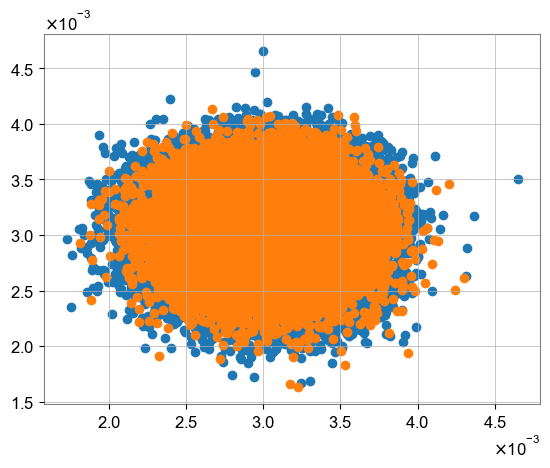

In [73]:
plt.scatter(x = Feature_space_noise_train[:,0],y = Feature_space_noise_train[:,1])
plt.scatter(x = Feature_space_noise_test[:,0],y = Feature_space_noise_test[:,1])
# plt.scatter(x = Feature_space_bbh[:,0],y = Feature_space_bbh[:,1])
# plt.scatter(x = Feature_space_sg[:,0],y = Feature_space_sg[:,1])

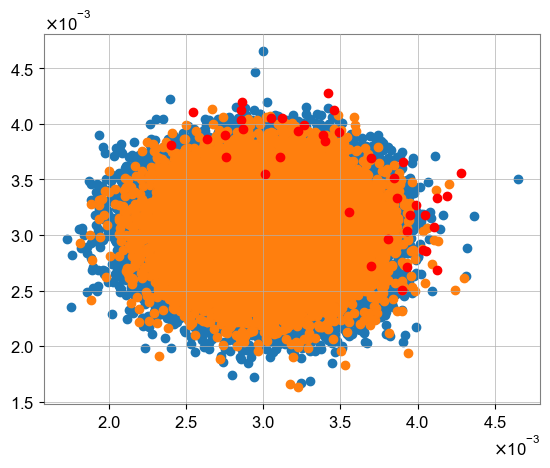

In [79]:
plt.scatter(x = Feature_space_noise_train[:,0],y = Feature_space_noise_train[:,1])
plt.scatter(x = Feature_space_noise_with_glitches_test[2 * glitch_numbers_in_testing_noise:][:,0],y = Feature_space_noise_with_glitches_test[2 * glitch_numbers_in_testing_noise:][:,1])
plt.scatter(x = Feature_space_noise_with_glitches_test[:2 * glitch_numbers_in_testing_noise][:,0],y = Feature_space_noise_with_glitches_test[:2 * glitch_numbers_in_testing_noise][:,1], color = 'red')

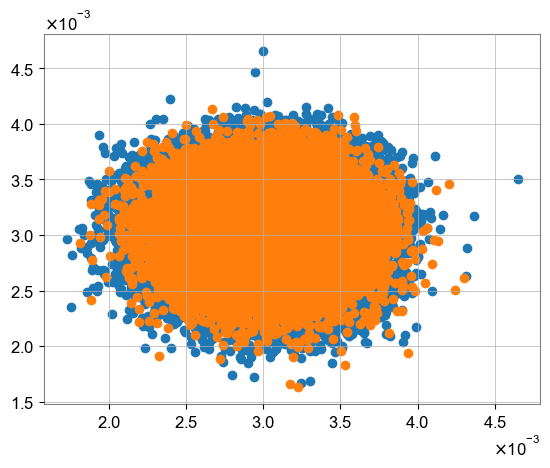

In [5]:
plt.scatter(x = Feature_space_noise_train[:,0],y = Feature_space_noise_train[:,1])
plt.scatter(x = Feature_space_noise_test[:,0],y = Feature_space_noise_test[:,1])
# plt.scatter(x = Feature_space_bbh[:,0],y = Feature_space_bbh[:,1])
# plt.scatter(x = Feature_space_sg[:,0],y = Feature_space_sg[:,1])

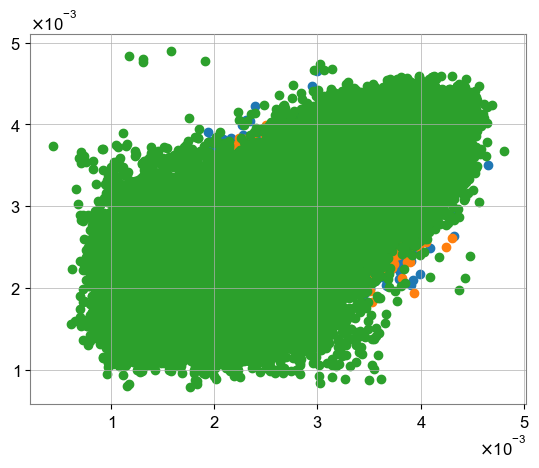

In [68]:
plt.scatter(x = Feature_space_noise_train[:,0],y = Feature_space_noise_train[:,1])
plt.scatter(x = Feature_space_noise_test[:,0],y = Feature_space_noise_test[:,1])
# plt.scatter(x = Feature_space_bbh[:,0],y = Feature_space_bbh[:,1])
plt.scatter(x = Feature_space_sg[:,0],y = Feature_space_sg[:,1])

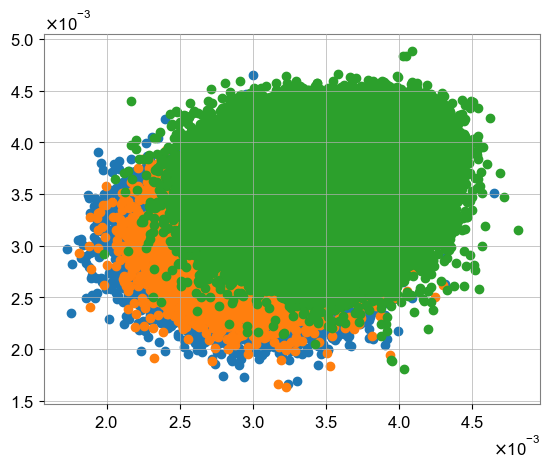

In [21]:
plt.scatter(x = Feature_space_noise_train[:,0],y = Feature_space_noise_train[:,1])
plt.scatter(x = Feature_space_noise_test[:,0],y = Feature_space_noise_test[:,1])
plt.scatter(x = Feature_space_bbh[:,0],y = Feature_space_bbh[:,1])
# plt.scatter(x = Feature_space_sg[:,0],y = Feature_space_sg[:,1])

In [69]:
Geometric_mean_train = np.sqrt(Feature_space_noise_train[:,0] * Feature_space_noise_train[:,1])
Geometric_mean_test = np.sqrt(Feature_space_noise_test[:,0] * Feature_space_noise_test[:,1])
Geometric_mean_bbh = np.sqrt(Feature_space_bbh[:,0] * Feature_space_bbh[:,1])
Geometric_mean_sg = np.sqrt(Feature_space_sg[:,0] * Feature_space_sg[:,1])

In [70]:
Geometric_mean_bbh.shape

(100000,)

Text(0.5, 1.0, 'Geometric mean distribution for two datasets')

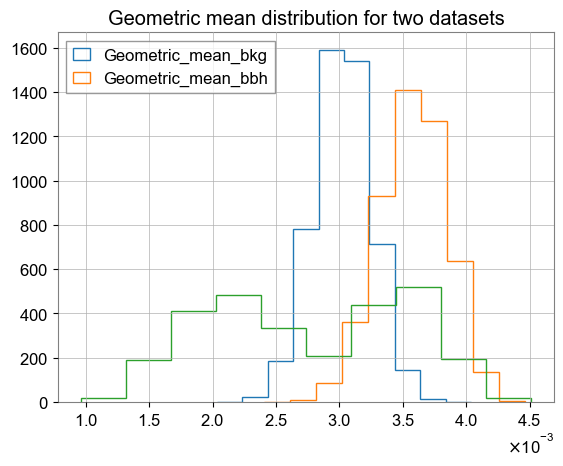

In [71]:
plt.hist(Geometric_mean_train,bins = 10, density=True, label = 'Geometric_mean_bkg', color = colors[0], histtype='step')
plt.hist(Geometric_mean_bbh,bins = 10, density=True, label = 'Geometric_mean_bbh',color = colors[1], histtype='step')
plt.hist(Geometric_mean_sg,bins = 10, density=True,color = colors[2], histtype='step')
plt.legend()
plt.title('Geometric mean distribution for two datasets')

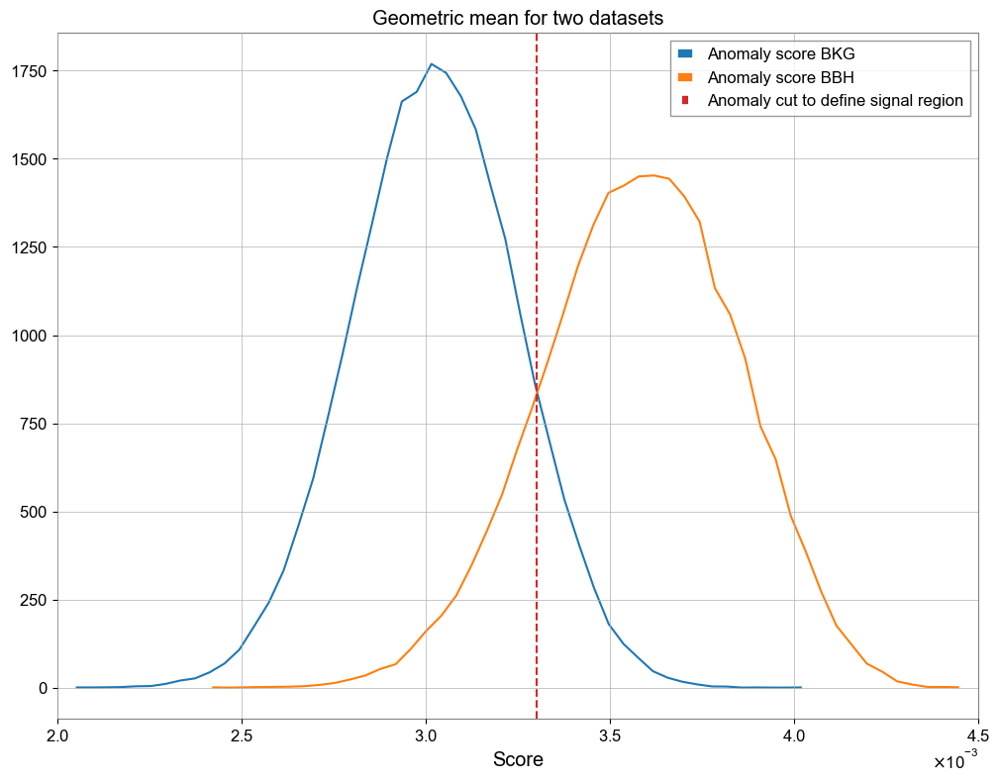

In [24]:
colors = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd', '#8c564b']
bin_scheme = np.arange(-0.1, 1.1, 1e-3)

counts_train, bin_position_train = np.histogram(Geometric_mean_train, bins = 50, density = True)
counts_test, bin_position_test = np.histogram(Geometric_mean_bbh, bins = 50, density = True)
# counts_signal, bin_position_signal = np.histogram(ReconstructedError_signalbbhData, bins = bin_scheme, density = True)
# counts_train_cut, bin_position_train_cut = np.histogram(ReconstructedError_train_cut_output_200d, bins = bin_scheme, density = True)

# counts_sinegaussian, bin_position_sinegaussian = np.histogram(ReconstructedError_sinegaussian_output_100d, bins = bin_scheme, density = True)
# counts_glitches, bin_position_glitches = np.histogram(ReconstructedError_glitches_output_100d, bins = bin_scheme, density = True)
# counts_glitches_real, bin_position_glitches_real = np.histogram(ReconstructedError_glitches_real_output_100d, bins = bin_scheme, density = True)

bin_centers_train = (bin_position_train[:-1] + bin_position_train[1:]) / 2
bin_centers_test = (bin_position_test[:-1] + bin_position_test[1:]) / 2
# bin_centers_signal = (bin_position_signal[:-1] + bin_position_signal[1:]) / 2
# bin_centers_train_cut = (bin_position_train_cut[:-1] + bin_position_train_cut[1:]) / 2

# bin_centers_sinegaussian = (bin_position_sinegaussian[:-1] + bin_position_sinegaussian[1:]) / 2
# bin_centers_glitches = (bin_position_glitches[:-1] + bin_position_glitches[1:]) / 2
# bin_centers_glitches_real = (bin_position_glitches_real[:-1] + bin_position_glitches_real[1:]) / 2


plt.figure(figsize=(12, 9))
plt.plot(bin_centers_train, counts_train, color = colors[0], label = 'Anomaly score BKG')
plt.plot(bin_centers_test, counts_test, color = colors[1], label = 'Anomaly score BBH')
# plt.plot(bin_centers_signal, counts_signal, color = colors[2], label = 'Signal sample - BBH')
# plt.plot(bin_centers_train_cut, counts_train_cut, color = colors[3], label = 'Training sample first 5e3')

# plt.plot(bin_centers_sinegaussian, counts_sinegaussian, color = colors[3], label = 'Signal sample - sinegaussian')
# plt.plot(bin_centers_glitches, counts_glitches, color = colors[4], label = 'Signal sample - simulated glitches')
# plt.plot(bin_centers_glitches_real, counts_glitches_real, color = colors[5], label = 'Signal sample - real glitches')


# plt.axvline(x = MSE_train, color = colors[0], linestyle = '--', label = 'Training sample MSE')
# plt.axvline(x = MSE_test, color = colors[1], linestyle = '--', label = 'Testing sample MSE')
# plt.axvline(x = MSE_signalbbhData, color = colors[2], linestyle = '--', label = 'Signal sample MSE - BBH')
# plt.axvline(x = MSE_train_cut_output_200d, color = colors[3], linestyle = '--', label = 'Training sample MSE first 5e3')

# plt.axvline(x = MSE_sinegaussian_output_100d, color = colors[3], linestyle = '--', label = 'Signal sample MSE - sinegaussian')
# plt.axvline(x = MSE_glitches_output_100d, color = colors[4], linestyle = '--', label = 'Signal sample MSE - simulated glitches')
# plt.axvline(x = MSE_glitches_real_output_100d, color = colors[5], linestyle = '--', label = 'Signal sample MSE - real glitches')

plt.axvline(x = 3.3e-3, linestyle = '--', label = 'Anomaly cut to define signal region', color = colors[3])

plt.xlim(2e-3, 4.5e-3)
plt.xlabel('Score')
plt.title('Geometric mean for two datasets')
plt.legend()
plt.show()

In [26]:
for threshold in np.arange(0,0.0045,0.0001):
    if np.argwhere(Geometric_mean_train > threshold).shape[0]/len(Geometric_mean_train) < 0.1:
        print(threshold-0.0001)
        break

0.0033000000000000004


In [29]:
np.argwhere(Geometric_mean_test > 0.0033).shape[0]/len(Geometric_mean_test)

0.11325

In [33]:
np.argwhere(Geometric_mean_test > 0.0033).shape

(2265, 1)

In [32]:
np.argwhere(Geometric_mean_bbh > 0.0033).shape

(85368, 1)

In [36]:
data_train = Feature_space_noise_train
data_signal_noise = Feature_space_noise_test[np.argwhere(Geometric_mean_test > 0.0033)].reshape(-1,2)
data_signal_bbh = Feature_space_bbh[np.argwhere(Geometric_mean_bbh > 0.0033)].reshape(-1,2)

## Training the model

In [15]:
train_dataset = TensorDataset(trainData, trainData)
test_dataset = TensorDataset(testData, testData)
# validation_dataset = TensorDataset(validationData, validationData)

trainDataLoader = DataLoader(dataset=train_dataset, batch_size=batch_size, shuffle=True)
# validationDataLoader = DataLoader(dataset=validation_dataset, batch_size=batch_size, shuffle = True)


autoencoder = VariationalAutoEncoder(4,2).cuda()
optimizer = optim.Adam(autoencoder.parameters(), lr=0.00005)
loss_func = nn.MSELoss().cuda()
loss_train = np.zeros((epochs, 1))
loss_validation = np.zeros((epochs, 1))


for epoch in range(epochs):
    # 训练阶段
    autoencoder.train()
    for batchidx, (x, _) in enumerate(trainDataLoader):
        x = x.cuda()
        _,_,_,decoded = autoencoder(x)
        # weighted_lossTrain = loss_func(decoded, x)
        loss_overall = loss_func(decoded, x)
        # loss_norm = loss_func(decoded[:, -1], x[:, -1])
        
        weighted_lossTrain = loss_overall
        # weighted_lossTrain = loss_overall + loss_norm * coef_delta
        
        # output_norm = torch.norm(decoded[:, :100], dim=1) 
        # penalty_term = torch.mean((output_norm - 1) ** 2) 
        # weighted_lossTrain = lossTrain + coef_delta * penalty_term
        
        optimizer.zero_grad()
        weighted_lossTrain.backward()
        optimizer.step()

    # 验证阶段
    # autoencoder.eval()
    # with torch.no_grad():
    #     val_loss = 0
    #     for batchidx, (x, _) in enumerate(validationDataLoader):
    #         x = x.cuda()
    #         encoded, decoded = autoencoder(x)
    #         lossVal_overall = loss_func(decoded, x)
    #         lossVal_norm = loss_func(decoded[:, -1], x[:, -1])
    #         lossVal = lossVal_overall + lossVal_norm * coef_delta
    #         val_loss += lossVal.item()

    #     val_loss /= len(validationDataLoader)
    
    loss_train[epoch,0] = weighted_lossTrain.item()
    # loss_validation[epoch,0] = val_loss
    print('Epoch: %04d, Training loss=%.8f' % (epoch+1, weighted_lossTrain.item()))
    # print('Epoch: %04d, Training loss=%.8f, Validation loss=%.8f' % (epoch+1, weighted_lossTrain.item(), val_loss))

Epoch: 0001, Training loss=0.00960263
Epoch: 0002, Training loss=0.00213246
Epoch: 0003, Training loss=0.00003582
Epoch: 0004, Training loss=0.00011149
Epoch: 0005, Training loss=0.00000188
Epoch: 0006, Training loss=0.00000253
Epoch: 0007, Training loss=0.00000124
Epoch: 0008, Training loss=0.00000217
Epoch: 0009, Training loss=0.00000103
Epoch: 0010, Training loss=0.00000077
Epoch: 0011, Training loss=0.00000142
Epoch: 0012, Training loss=0.00000177
Epoch: 0013, Training loss=0.00000083
Epoch: 0014, Training loss=0.00000095
Epoch: 0015, Training loss=0.00000113
Epoch: 0016, Training loss=0.00000092
Epoch: 0017, Training loss=0.00000189
Epoch: 0018, Training loss=0.00000063
Epoch: 0019, Training loss=0.00000087
Epoch: 0020, Training loss=0.00000187
Epoch: 0021, Training loss=0.00000148
Epoch: 0022, Training loss=0.00000103
Epoch: 0023, Training loss=0.07115716
Epoch: 0024, Training loss=0.00000118
Epoch: 0025, Training loss=0.00000212
Epoch: 0026, Training loss=0.00000069
Epoch: 0027,

In [16]:
torch.save(autoencoder.cpu(), '../Model_cached/model_4_3_2_3_4_Error_space_GWAK_VAE.pt')

In [47]:
train_dataset = TensorDataset(trainData, trainData)
test_dataset = TensorDataset(testData, testData)
# validation_dataset = TensorDataset(validationData, validationData)

trainDataLoader = DataLoader(dataset=train_dataset, batch_size=batch_size, shuffle=True)
# validationDataLoader = DataLoader(dataset=validation_dataset, batch_size=batch_size, shuffle = True)


autoencoder = VariationalAutoEncoder(4,2).cuda()
optimizer = optim.Adam(autoencoder.parameters(), lr=0.00005)
loss_func = nn.MSELoss().cuda()
loss_train = np.zeros((epochs, 1))
loss_validation = np.zeros((epochs, 1))


for epoch in range(epochs):
    # 训练阶段
    autoencoder.train()
    for batchidx, (x, _) in enumerate(trainDataLoader):
        x = x.cuda()
        _,_,_,decoded = autoencoder(x)
        # weighted_lossTrain = loss_func(decoded, x)
        loss_overall = loss_func(decoded, torch.zeros_like(decoded))
        # loss_norm = loss_func(decoded[:, -1], x[:, -1])
        
        weighted_lossTrain = loss_overall
        # weighted_lossTrain = loss_overall + loss_norm * coef_delta
        
        # output_norm = torch.norm(decoded[:, :100], dim=1) 
        # penalty_term = torch.mean((output_norm - 1) ** 2) 
        # weighted_lossTrain = lossTrain + coef_delta * penalty_term
        
        optimizer.zero_grad()
        weighted_lossTrain.backward()
        optimizer.step()

    # 验证阶段
    # autoencoder.eval()
    # with torch.no_grad():
    #     val_loss = 0
    #     for batchidx, (x, _) in enumerate(validationDataLoader):
    #         x = x.cuda()
    #         encoded, decoded = autoencoder(x)
    #         lossVal_overall = loss_func(decoded, x)
    #         lossVal_norm = loss_func(decoded[:, -1], x[:, -1])
    #         lossVal = lossVal_overall + lossVal_norm * coef_delta
    #         val_loss += lossVal.item()

    #     val_loss /= len(validationDataLoader)
    
    loss_train[epoch,0] = weighted_lossTrain.item()
    # loss_validation[epoch,0] = val_loss
    print('Epoch: %04d, Training loss=%.8f' % (epoch+1, weighted_lossTrain.item()))
    # print('Epoch: %04d, Training loss=%.8f, Validation loss=%.8f' % (epoch+1, weighted_lossTrain.item(), val_loss))

Epoch: 0001, Training loss=0.15665197
Epoch: 0002, Training loss=0.07878476
Epoch: 0003, Training loss=0.03741970
Epoch: 0004, Training loss=0.00673870
Epoch: 0005, Training loss=0.00194751
Epoch: 0006, Training loss=0.00059937
Epoch: 0007, Training loss=0.00018650
Epoch: 0008, Training loss=0.00005543
Epoch: 0009, Training loss=0.00003113
Epoch: 0010, Training loss=0.00001070
Epoch: 0011, Training loss=0.00000781
Epoch: 0012, Training loss=0.00000222
Epoch: 0013, Training loss=0.00000110
Epoch: 0014, Training loss=0.00000081
Epoch: 0015, Training loss=0.00000036
Epoch: 0016, Training loss=0.00000019
Epoch: 0017, Training loss=0.00000007
Epoch: 0018, Training loss=0.00000007
Epoch: 0019, Training loss=0.00000004
Epoch: 0020, Training loss=0.00000002
Epoch: 0021, Training loss=0.00000001
Epoch: 0022, Training loss=0.00000001
Epoch: 0023, Training loss=0.00000001
Epoch: 0024, Training loss=0.00000001
Epoch: 0025, Training loss=0.00000000
Epoch: 0026, Training loss=0.00000000
Epoch: 0027,

In [51]:
train_dataset = TensorDataset(trainData, trainData)
test_dataset = TensorDataset(testData, testData)
# validation_dataset = TensorDataset(validationData, validationData)

trainDataLoader = DataLoader(dataset=train_dataset, batch_size=batch_size, shuffle=True)
# validationDataLoader = DataLoader(dataset=validation_dataset, batch_size=batch_size, shuffle = True)


autoencoder = SupervisedModel().cuda()
optimizer = optim.Adam(autoencoder.parameters(), lr=0.00005)
loss_func = nn.MSELoss().cuda()
loss_train = np.zeros((epochs, 1))
loss_validation = np.zeros((epochs, 1))


for epoch in range(epochs):
    # 训练阶段
    autoencoder.train()
    for batchidx, (x, _) in enumerate(trainDataLoader):
        x = x.cuda()
        decoded = autoencoder(x)
        # weighted_lossTrain = loss_func(decoded, x)
        loss_overall = loss_func(decoded, torch.zeros_like(decoded))
        # loss_norm = loss_func(decoded[:, -1], x[:, -1])
        
        weighted_lossTrain = loss_overall
        # weighted_lossTrain = loss_overall + loss_norm * coef_delta
        
        # output_norm = torch.norm(decoded[:, :100], dim=1) 
        # penalty_term = torch.mean((output_norm - 1) ** 2) 
        # weighted_lossTrain = lossTrain + coef_delta * penalty_term
        
        optimizer.zero_grad()
        weighted_lossTrain.backward()
        optimizer.step()

    # 验证阶段
    # autoencoder.eval()
    # with torch.no_grad():
    #     val_loss = 0
    #     for batchidx, (x, _) in enumerate(validationDataLoader):
    #         x = x.cuda()
    #         encoded, decoded = autoencoder(x)
    #         lossVal_overall = loss_func(decoded, x)
    #         lossVal_norm = loss_func(decoded[:, -1], x[:, -1])
    #         lossVal = lossVal_overall + lossVal_norm * coef_delta
    #         val_loss += lossVal.item()

    #     val_loss /= len(validationDataLoader)
    
    loss_train[epoch,0] = weighted_lossTrain.item()
    # loss_validation[epoch,0] = val_loss
    print('Epoch: %04d, Training loss=%.8f' % (epoch+1, weighted_lossTrain.item()))
    # print('Epoch: %04d, Training loss=%.8f, Validation loss=%.8f' % (epoch+1, weighted_lossTrain.item(), val_loss))

Epoch: 0001, Training loss=0.00000000
Epoch: 0002, Training loss=0.00000000
Epoch: 0003, Training loss=0.00000001
Epoch: 0004, Training loss=0.00000000
Epoch: 0005, Training loss=0.00000000
Epoch: 0006, Training loss=0.00000000
Epoch: 0007, Training loss=0.00000000
Epoch: 0008, Training loss=0.00000000
Epoch: 0009, Training loss=0.00000000
Epoch: 0010, Training loss=0.00000000
Epoch: 0011, Training loss=0.00000000
Epoch: 0012, Training loss=0.00000000
Epoch: 0013, Training loss=0.00000000
Epoch: 0014, Training loss=0.00000000
Epoch: 0015, Training loss=0.00000000
Epoch: 0016, Training loss=0.00000000
Epoch: 0017, Training loss=0.00000000
Epoch: 0018, Training loss=0.00000002
Epoch: 0019, Training loss=0.00000000
Epoch: 0020, Training loss=0.00000011
Epoch: 0021, Training loss=0.00000000
Epoch: 0022, Training loss=0.00000000
Epoch: 0023, Training loss=0.00000000
Epoch: 0024, Training loss=0.00000000
Epoch: 0025, Training loss=0.00000000
Epoch: 0026, Training loss=0.00000000
Epoch: 0027,

In [66]:
snr_list = np.arange(1,37,7)

In [62]:
snr_list = [15,22]

In [63]:
for i in range(len(snr_list)):
    
    data_signal = np.vstack((data_signal_noise, data_signal_bbh[np.random.choice(len(data_signal_bbh), size = int(snr_list[i] * len(data_signal_noise)))]))
    data_bkg = data_train[np.random.choice(len(data_train),size = min(len(data_signal),len(data_train)),  replace=False)]
    
    print(data_signal.shape)
    print(data_bkg.shape)
    
    data_signal_labeled = np.hstack((data_signal,np.ones(len(data_signal)).reshape(-1,1)))
    data_bkg_labeled = np.hstack((data_bkg,np.zeros(len(data_bkg)).reshape(-1,1)))
    
    Final_training_and_validation_set = np.vstack((data_signal_labeled, data_bkg_labeled))
    np.random.shuffle(Final_training_and_validation_set)

    trainData = torch.FloatTensor(Final_training_and_validation_set[:int(0.9 * len(Final_training_and_validation_set))])
    validationData = torch.FloatTensor(Final_training_and_validation_set[int(0.9 * len(Final_training_and_validation_set)):])
    train_dataset = TensorDataset(trainData, trainData)
    validation_dataset = TensorDataset(validationData, validationData)

    trainDataLoader = DataLoader(dataset=train_dataset, batch_size=batch_size, shuffle=True)
    validationDataLoader = DataLoader(dataset=validation_dataset, batch_size=batch_size, shuffle = True)


    autoencoder = SupervisedModel().cuda()
    optimizer = optim.Adam(autoencoder.parameters(), lr=0.00005)
    loss_func = nn.BCELoss().cuda()
    loss_train = np.zeros((epochs, 1))
    loss_validation = np.zeros((epochs, 1))


    for epoch in range(epochs):
        # 训练阶段
        autoencoder.train()
        for batchidx, (x, _) in enumerate(trainDataLoader):
            x = x.cuda()
            decoded = autoencoder(x[:,:2])
            # weighted_lossTrain = loss_func(decoded, x)
            loss_overall = loss_func(decoded.flatten(), x[:,-1])
            # loss_norm = loss_func(decoded[:, -1], x[:, -1])
            
            weighted_lossTrain = loss_overall
            # weighted_lossTrain = loss_overall + loss_norm * coef_delta
            
            # output_norm = torch.norm(decoded[:, :100], dim=1) 
            # penalty_term = torch.mean((output_norm - 1) ** 2) 
            # weighted_lossTrain = lossTrain + coef_delta * penalty_term
            
            optimizer.zero_grad()
            weighted_lossTrain.backward()
            optimizer.step()

        # 验证阶段
        autoencoder.eval()
        with torch.no_grad():
            val_loss = 0
            for batchidx, (x, _) in enumerate(validationDataLoader):
                x = x.cuda()
                decoded = autoencoder(x[:,:2])
                lossVal_overall = loss_func(decoded.flatten(), x[:,-1])
                lossVal_norm = loss_func(decoded[:, -1], x[:, -1])
                lossVal = lossVal_overall + lossVal_norm * coef_delta
                val_loss += lossVal.item()

            val_loss /= len(validationDataLoader)
        
        loss_train[epoch,0] = weighted_lossTrain.item()
        loss_validation[epoch,0] = val_loss
        # print('Epoch: %04d, Training loss=%.8f' % (epoch+1, weighted_lossTrain.item()))
        print('Epoch: %04d, Training loss=%.8f, Validation loss=%.8f' % (epoch+1, weighted_lossTrain.item(), val_loss))
        
    torch.save(autoencoder.cpu(),'../Model_cached/model_weakly_supervised_2-8-6-4-1_GWAK_snr'+str(snr_list[i])+'_new_new.pt')
    
    
    fig = plt.figure(figsize=(6, 3))
    ax = plt.subplot(1, 1, 1)
    ax.grid()
    ax.plot(loss_train, color=[245/255, 124/255, 0/255], linestyle='-', linewidth=2, label = 'Train set') 
    ax.plot(loss_validation, color=[245/255, 124/255, 0/255], linestyle='--', linewidth=2, label = 'Validation set') 
    ax.set_xlabel('Epoches')
    ax.set_ylabel('Loss')
    ax.set_title('Trainging loss, weakly supervised learning model, 0.1 anomaly cut, snr' +str(snr_list[i]))
    plt.ylim(0,1)
    plt.legend()
    # plt.show()
    plt.savefig('../Pic_cached/Trainging loss, weakly supervised learning model, 0.1 anomaly cut, snr'+str(snr_list[i])+'_new_new,2-8-6-4-1.png')

(36240, 2)
(36240, 2)
Epoch: 0001, Training loss=0.68746459, Validation loss=0.69340190
Epoch: 0002, Training loss=0.69318187, Validation loss=0.69316424
Epoch: 0003, Training loss=0.69363391, Validation loss=0.69314058
Epoch: 0004, Training loss=0.69329357, Validation loss=0.69313266
Epoch: 0005, Training loss=0.69325936, Validation loss=0.69312845
Epoch: 0006, Training loss=0.69303775, Validation loss=0.69312707
Epoch: 0007, Training loss=0.69312692, Validation loss=0.69312580
Epoch: 0008, Training loss=0.69335115, Validation loss=0.69312374
Epoch: 0009, Training loss=0.69302297, Validation loss=0.69312150
Epoch: 0010, Training loss=0.69308823, Validation loss=0.69311788
Epoch: 0011, Training loss=0.69302154, Validation loss=0.69311503
Epoch: 0012, Training loss=0.69305301, Validation loss=0.69311299
Epoch: 0013, Training loss=0.69307423, Validation loss=0.69311054
Epoch: 0014, Training loss=0.69310683, Validation loss=0.69310703
Epoch: 0015, Training loss=0.69274306, Validation loss

In [53]:
torch.save(autoencoder.cpu(),'../Model_cached/model_supervised_4-64-32-1_GWAK_error_space.pt')

In [41]:
autoencoder = torch.load('../Model_cached/model_weakly_supervised_2-8-6-4-1_GWAK_snr29_400.pt')

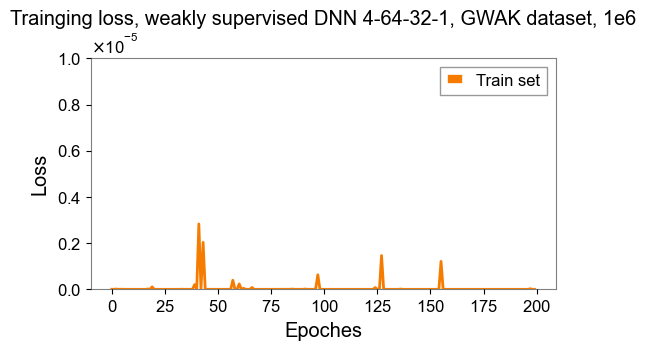

In [54]:
fig = plt.figure(figsize=(6, 3))
ax = plt.subplot(1, 1, 1)
ax.grid()
ax.plot(loss_train, color=[245/255, 124/255, 0/255], linestyle='-', linewidth=2, label = 'Train set') 
# ax.plot(loss_validation, color=[245/255, 124/255, 0/255], linestyle='--', linewidth=2, label = 'Validation set') 
ax.set_xlabel('Epoches')
ax.set_ylabel('Loss')
ax.set_title('Trainging loss, weakly supervised DNN 4-64-32-1, GWAK dataset, 1e6')
plt.ylim(0,0.00001)
plt.legend()
plt.show()

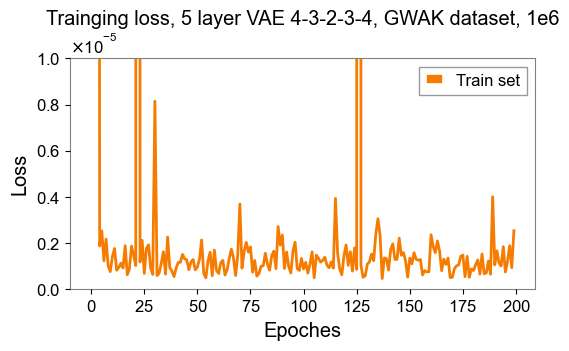

In [17]:
fig = plt.figure(figsize=(6, 3))
ax = plt.subplot(1, 1, 1)
ax.grid()
ax.plot(loss_train, color=[245/255, 124/255, 0/255], linestyle='-', linewidth=2, label = 'Train set') 
# ax.plot(loss_validation, color=[245/255, 124/255, 0/255], linestyle='--', linewidth=2, label = 'Validation set') 
ax.set_xlabel('Epoches')
ax.set_ylabel('Loss')
ax.set_title('Trainging loss, 5 layer VAE 4-3-2-3-4, GWAK dataset, 1e6')
plt.ylim(0,0.00001)
plt.legend()
plt.show()

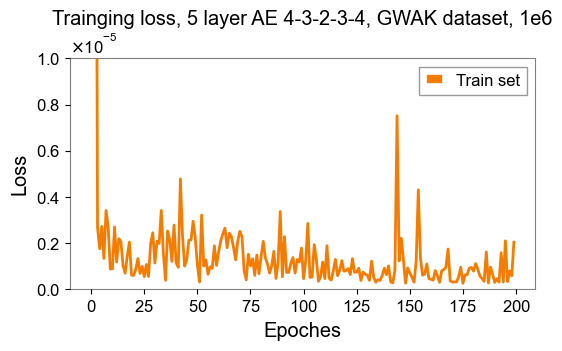

In [25]:
fig = plt.figure(figsize=(6, 3))
ax = plt.subplot(1, 1, 1)
ax.grid()
ax.plot(loss_train, color=[245/255, 124/255, 0/255], linestyle='-', linewidth=2, label = 'Train set') 
# ax.plot(loss_validation, color=[245/255, 124/255, 0/255], linestyle='--', linewidth=2, label = 'Validation set') 
ax.set_xlabel('Epoches')
ax.set_ylabel('Loss')
ax.set_title('Trainging loss, 5 layer AE 4-3-2-3-4, GWAK dataset, 1e6')
plt.ylim(0,0.00001)
plt.legend()
plt.show()

In [91]:
_, decodedTestdata = autoencoder(trainData)
decodedTestdata = decodedTestdata.double()
reconstructedData_train = decodedTestdata.detach().numpy()
ReconstructedError_train = torch.mean((trainData - reconstructedData_train)**2,dim=1)
MSE_train = ReconstructedError_train.mean()

In [92]:
_, decodedTestdata = autoencoder(testData)
decodedTestdata = decodedTestdata.double()
reconstructedData_test = decodedTestdata.detach().numpy()
ReconstructedError_test = torch.mean((testData - reconstructedData_test)**2,dim=1)
MSE_test = ReconstructedError_test.mean()

In [93]:
_, decodedTestdata = autoencoder(bbhData)
decodedTestdata = decodedTestdata.double()
reconstructedData_injected = decodedTestdata.detach().numpy()
ReconstructedError_injected = torch.mean((bbhData - reconstructedData_injected)**2,dim=1)
MSE_injected = ReconstructedError_injected.mean()

In [94]:
data_sinegaussian_tensored = sgData
_, decodedTestdata = autoencoder(data_sinegaussian_tensored)
decodedTestdata = decodedTestdata.double()
reconstructedData_sinegaussian = decodedTestdata.detach().numpy()
ReconstructedError_sinegaussian = torch.mean((data_sinegaussian_tensored - reconstructedData_sinegaussian)**2,dim=1)
MSE_sinegaussian = ReconstructedError_sinegaussian.mean()

### Reconstruction procedure for weakly supervised model

In [86]:
decodedTestdata = autoencoder(trainData)
decodedTestdata = decodedTestdata.double()
reconstructedData_train = decodedTestdata.detach().numpy()
ReconstructedError_train = torch.mean((trainData - reconstructedData_train)**2,dim=1)
MSE_train = ReconstructedError_train.mean()

AttributeError: 'tuple' object has no attribute 'double'

In [87]:
decodedTestdata = autoencoder(testData)
decodedTestdata = decodedTestdata.double()
reconstructedData_test = decodedTestdata.detach().numpy()
ReconstructedError_test = torch.mean((testData - reconstructedData_test)**2,dim=1)
MSE_test = ReconstructedError_test.mean()

AttributeError: 'tuple' object has no attribute 'double'

In [88]:
decodedTestdata = autoencoder(bbhData)
decodedTestdata = decodedTestdata.double()
reconstructedData_injected = decodedTestdata.detach().numpy()
ReconstructedError_injected = torch.mean((bbhData - reconstructedData_injected)**2,dim=1)
MSE_injected = ReconstructedError_injected.mean()

AttributeError: 'tuple' object has no attribute 'double'

In [60]:
data_sinegaussian_tensored = sgData
decodedTestdata = autoencoder(data_sinegaussian_tensored)
decodedTestdata = decodedTestdata.double()
reconstructedData_sinegaussian = decodedTestdata.detach().numpy()
ReconstructedError_sinegaussian = torch.mean((data_sinegaussian_tensored - reconstructedData_sinegaussian)**2,dim=1)
MSE_sinegaussian = ReconstructedError_sinegaussian.mean()

In [42]:
decodedTestdata = autoencoder(torch.FloatTensor(Feature_space_noise_test))
decodedTestdata = decodedTestdata.double()
reconstructedData_test = decodedTestdata.detach().numpy()

In [43]:
decodedTestdata = autoencoder(torch.FloatTensor(Feature_space_bbh))
decodedTestdata = decodedTestdata.double()
reconstructedData_injected = decodedTestdata.detach().numpy()

Text(0.5, 0, 'score')

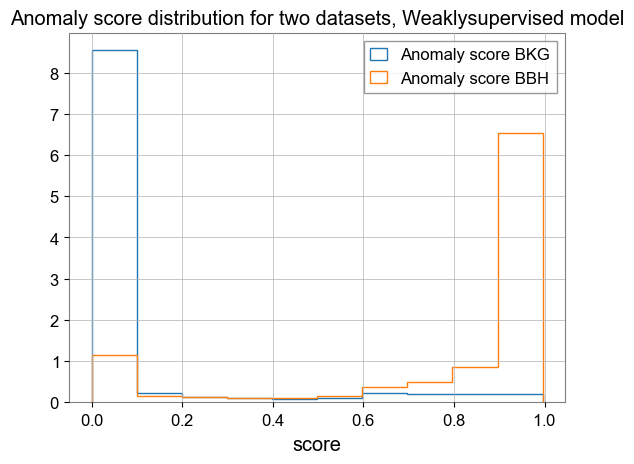

In [44]:
plt.hist(reconstructedData_test, density = True, label = 'Anomaly score BKG', histtype='step')
plt.hist(reconstructedData_injected, density = True, label = 'Anomaly score BBH', histtype='step')

plt.legend()
plt.title('Anomaly score distribution for two datasets, Weaklysupervised model')
plt.xlabel('score')

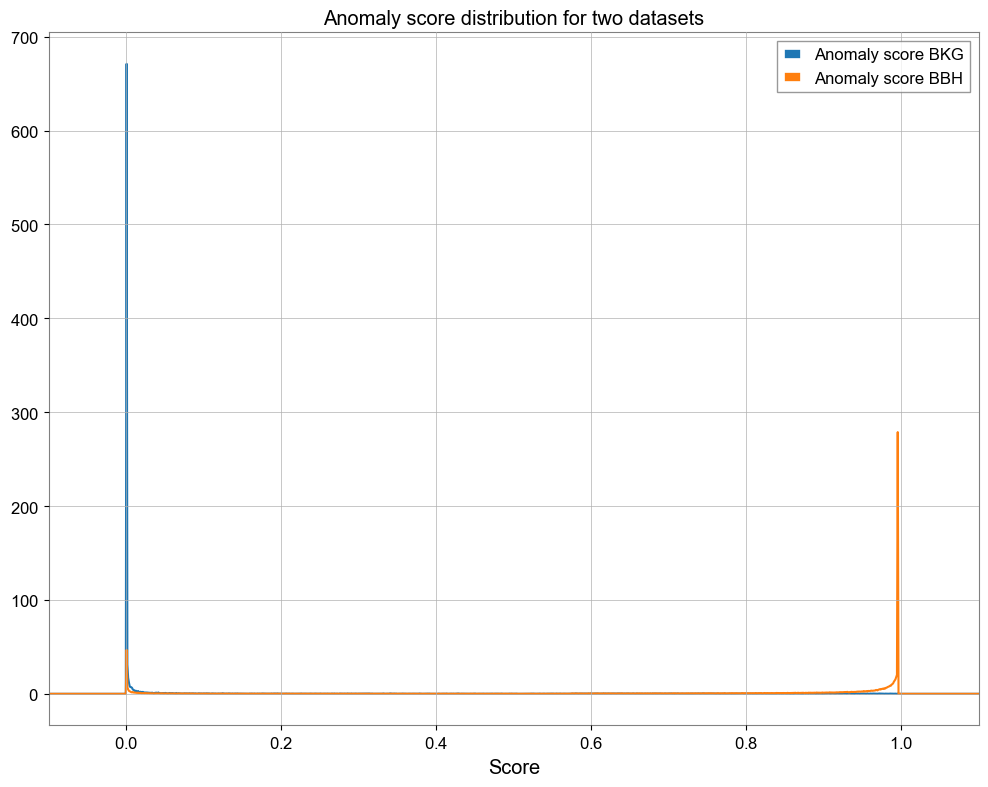

In [34]:
colors = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd', '#8c564b']
bin_scheme = np.arange(-0.1, 1.1, 1e-3)

counts_train, bin_position_train = np.histogram(reconstructedData_test, bins = bin_scheme, density = True)
counts_test, bin_position_test = np.histogram(reconstructedData_injected, bins = bin_scheme, density = True)
# counts_signal, bin_position_signal = np.histogram(ReconstructedError_signalbbhData, bins = bin_scheme, density = True)
# counts_train_cut, bin_position_train_cut = np.histogram(ReconstructedError_train_cut_output_200d, bins = bin_scheme, density = True)

# counts_sinegaussian, bin_position_sinegaussian = np.histogram(ReconstructedError_sinegaussian_output_100d, bins = bin_scheme, density = True)
# counts_glitches, bin_position_glitches = np.histogram(ReconstructedError_glitches_output_100d, bins = bin_scheme, density = True)
# counts_glitches_real, bin_position_glitches_real = np.histogram(ReconstructedError_glitches_real_output_100d, bins = bin_scheme, density = True)

bin_centers_train = (bin_position_train[:-1] + bin_position_train[1:]) / 2
bin_centers_test = (bin_position_test[:-1] + bin_position_test[1:]) / 2
# bin_centers_signal = (bin_position_signal[:-1] + bin_position_signal[1:]) / 2
# bin_centers_train_cut = (bin_position_train_cut[:-1] + bin_position_train_cut[1:]) / 2

# bin_centers_sinegaussian = (bin_position_sinegaussian[:-1] + bin_position_sinegaussian[1:]) / 2
# bin_centers_glitches = (bin_position_glitches[:-1] + bin_position_glitches[1:]) / 2
# bin_centers_glitches_real = (bin_position_glitches_real[:-1] + bin_position_glitches_real[1:]) / 2


plt.figure(figsize=(12, 9))
plt.plot(bin_centers_train, counts_train, color = colors[0], label = 'Anomaly score BKG')
plt.plot(bin_centers_test, counts_test, color = colors[1], label = 'Anomaly score BBH')
# plt.plot(bin_centers_signal, counts_signal, color = colors[2], label = 'Signal sample - BBH')
# plt.plot(bin_centers_train_cut, counts_train_cut, color = colors[3], label = 'Training sample first 5e3')

# plt.plot(bin_centers_sinegaussian, counts_sinegaussian, color = colors[3], label = 'Signal sample - sinegaussian')
# plt.plot(bin_centers_glitches, counts_glitches, color = colors[4], label = 'Signal sample - simulated glitches')
# plt.plot(bin_centers_glitches_real, counts_glitches_real, color = colors[5], label = 'Signal sample - real glitches')


# plt.axvline(x = MSE_train, color = colors[0], linestyle = '--', label = 'Training sample MSE')
# plt.axvline(x = MSE_test, color = colors[1], linestyle = '--', label = 'Testing sample MSE')
# plt.axvline(x = MSE_signalbbhData, color = colors[2], linestyle = '--', label = 'Signal sample MSE - BBH')
# plt.axvline(x = MSE_train_cut_output_200d, color = colors[3], linestyle = '--', label = 'Training sample MSE first 5e3')

# plt.axvline(x = MSE_sinegaussian_output_100d, color = colors[3], linestyle = '--', label = 'Signal sample MSE - sinegaussian')
# plt.axvline(x = MSE_glitches_output_100d, color = colors[4], linestyle = '--', label = 'Signal sample MSE - simulated glitches')
# plt.axvline(x = MSE_glitches_real_output_100d, color = colors[5], linestyle = '--', label = 'Signal sample MSE - real glitches')

# plt.axvline(x = 3.3e-3, linestyle = '--', label = 'Anomaly cut to define signal region', color = colors[3])

plt.xlim(-0.1, 1.1)
plt.xlabel('Score')
plt.title('Anomaly score distribution for two datasets')
plt.legend()
plt.show()

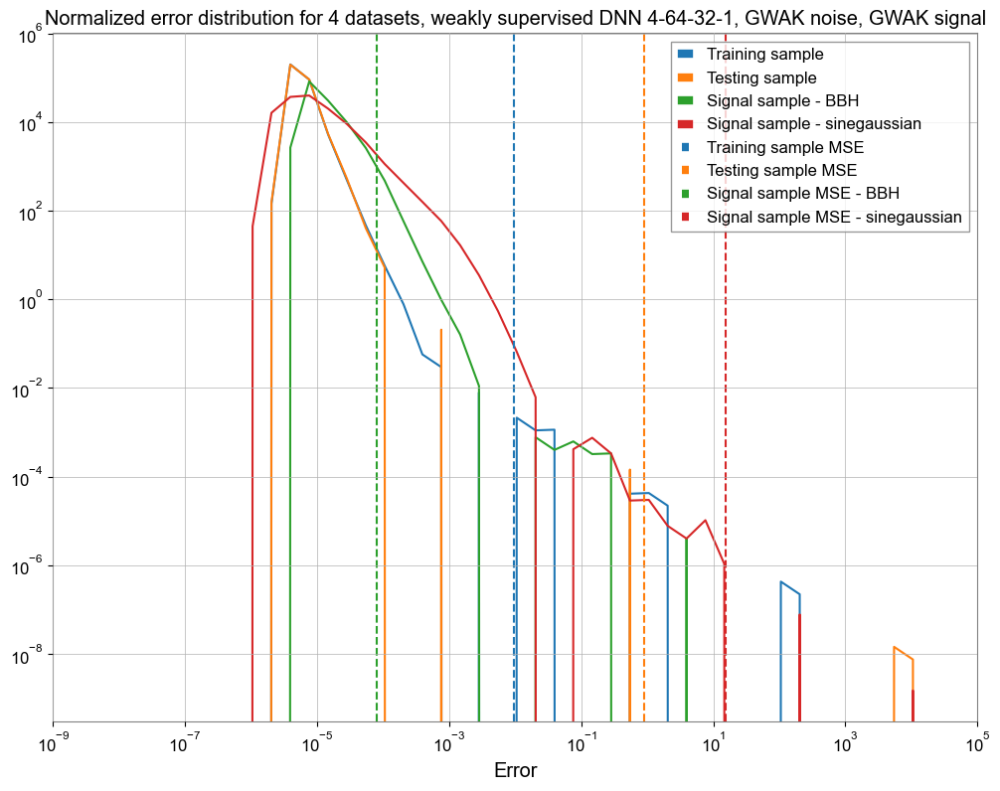

In [61]:
colors = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd', '#8c564b']
bin_scheme = np.logspace(-9,5,50)

counts_train, bin_position_train = np.histogram(ReconstructedError_train, bins = bin_scheme, density = True)
counts_test, bin_position_test = np.histogram(ReconstructedError_test, bins = bin_scheme, density = True)
counts_signal, bin_position_signal = np.histogram(ReconstructedError_injected, bins = bin_scheme, density = True)
# counts_train_cut, bin_position_train_cut = np.histogram(ReconstructedError_train_cut_output_200d, bins = bin_scheme, density = True)

counts_sinegaussian, bin_position_sinegaussian = np.histogram(ReconstructedError_sinegaussian, bins = bin_scheme, density = True)
# counts_glitches, bin_position_glitches = np.histogram(ReconstructedError_glitches_output_100d, bins = bin_scheme, density = True)
# counts_glitches_real, bin_position_glitches_real = np.histogram(ReconstructedError_glitches_real_output_100d, bins = bin_scheme, density = True)

bin_centers_train = (bin_position_train[:-1] + bin_position_train[1:]) / 2
bin_centers_test = (bin_position_test[:-1] + bin_position_test[1:]) / 2
bin_centers_signal = (bin_position_signal[:-1] + bin_position_signal[1:]) / 2
# bin_centers_train_cut = (bin_position_train_cut[:-1] + bin_position_train_cut[1:]) / 2

bin_centers_sinegaussian = (bin_position_sinegaussian[:-1] + bin_position_sinegaussian[1:]) / 2
# bin_centers_glitches = (bin_position_glitches[:-1] + bin_position_glitches[1:]) / 2
# bin_centers_glitches_real = (bin_position_glitches_real[:-1] + bin_position_glitches_real[1:]) / 2


plt.figure(figsize=(12, 9))
plt.plot(bin_centers_train, counts_train, color = colors[0], label = 'Training sample')
plt.plot(bin_centers_test, counts_test, color = colors[1], label = 'Testing sample')
plt.plot(bin_centers_signal, counts_signal, color = colors[2], label = 'Signal sample - BBH')
# plt.plot(bin_centers_train_cut, counts_train_cut, color = colors[3], label = 'Training sample first 5e3')

plt.plot(bin_centers_sinegaussian, counts_sinegaussian, color = colors[3], label = 'Signal sample - sinegaussian')
# plt.plot(bin_centers_glitches, counts_glitches, color = colors[4], label = 'Signal sample - simulated glitches')
# plt.plot(bin_centers_glitches_real, counts_glitches_real, color = colors[5], label = 'Signal sample - real glitches')


plt.axvline(x = MSE_train, color = colors[0], linestyle = '--', label = 'Training sample MSE')
plt.axvline(x = MSE_test, color = colors[1], linestyle = '--', label = 'Testing sample MSE')
plt.axvline(x = MSE_injected, color = colors[2], linestyle = '--', label = 'Signal sample MSE - BBH')
# plt.axvline(x = MSE_train_cut_output_200d, color = colors[3], linestyle = '--', label = 'Training sample MSE first 5e3')

plt.axvline(x = MSE_sinegaussian, color = colors[3], linestyle = '--', label = 'Signal sample MSE - sinegaussian')
# plt.axvline(x = MSE_glitches_output_100d, color = colors[4], linestyle = '--', label = 'Signal sample MSE - simulated glitches')
# plt.axvline(x = MSE_glitches_real_output_100d, color = colors[5], linestyle = '--', label = 'Signal sample MSE - real glitches')


plt.xlim(1e-9, 1e5)
plt.xlabel('Error')
plt.xscale('log')
plt.yscale('log')
plt.title('Normalized error distribution for 4 datasets, weakly supervised DNN 4-64-32-1, GWAK noise, GWAK signal')
plt.legend()
plt.show()

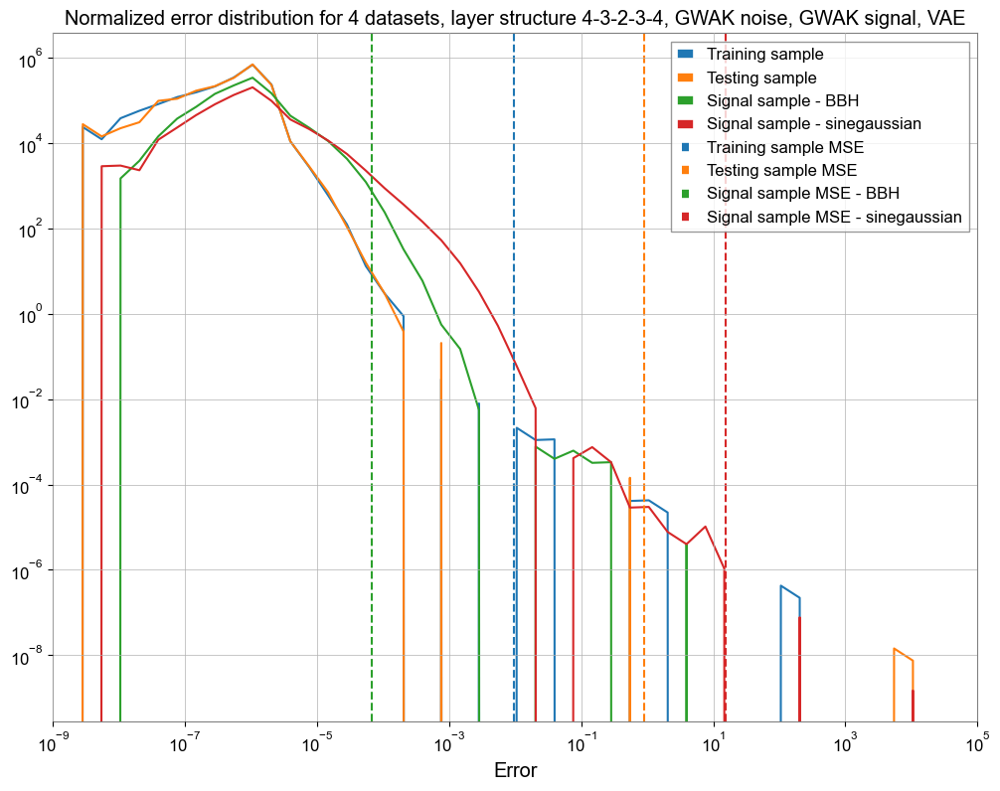

In [25]:
colors = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd', '#8c564b']
bin_scheme = np.logspace(-9,5,50)

counts_train, bin_position_train = np.histogram(ReconstructedError_train, bins = bin_scheme, density = True)
counts_test, bin_position_test = np.histogram(ReconstructedError_test, bins = bin_scheme, density = True)
counts_signal, bin_position_signal = np.histogram(ReconstructedError_injected, bins = bin_scheme, density = True)
# counts_train_cut, bin_position_train_cut = np.histogram(ReconstructedError_train_cut_output_200d, bins = bin_scheme, density = True)

counts_sinegaussian, bin_position_sinegaussian = np.histogram(ReconstructedError_sinegaussian, bins = bin_scheme, density = True)
# counts_glitches, bin_position_glitches = np.histogram(ReconstructedError_glitches_output_100d, bins = bin_scheme, density = True)
# counts_glitches_real, bin_position_glitches_real = np.histogram(ReconstructedError_glitches_real_output_100d, bins = bin_scheme, density = True)

bin_centers_train = (bin_position_train[:-1] + bin_position_train[1:]) / 2
bin_centers_test = (bin_position_test[:-1] + bin_position_test[1:]) / 2
bin_centers_signal = (bin_position_signal[:-1] + bin_position_signal[1:]) / 2
# bin_centers_train_cut = (bin_position_train_cut[:-1] + bin_position_train_cut[1:]) / 2

bin_centers_sinegaussian = (bin_position_sinegaussian[:-1] + bin_position_sinegaussian[1:]) / 2
# bin_centers_glitches = (bin_position_glitches[:-1] + bin_position_glitches[1:]) / 2
# bin_centers_glitches_real = (bin_position_glitches_real[:-1] + bin_position_glitches_real[1:]) / 2


plt.figure(figsize=(12, 9))
plt.plot(bin_centers_train, counts_train, color = colors[0], label = 'Training sample')
plt.plot(bin_centers_test, counts_test, color = colors[1], label = 'Testing sample')
plt.plot(bin_centers_signal, counts_signal, color = colors[2], label = 'Signal sample - BBH')
# plt.plot(bin_centers_train_cut, counts_train_cut, color = colors[3], label = 'Training sample first 5e3')

plt.plot(bin_centers_sinegaussian, counts_sinegaussian, color = colors[3], label = 'Signal sample - sinegaussian')
# plt.plot(bin_centers_glitches, counts_glitches, color = colors[4], label = 'Signal sample - simulated glitches')
# plt.plot(bin_centers_glitches_real, counts_glitches_real, color = colors[5], label = 'Signal sample - real glitches')


plt.axvline(x = MSE_train, color = colors[0], linestyle = '--', label = 'Training sample MSE')
plt.axvline(x = MSE_test, color = colors[1], linestyle = '--', label = 'Testing sample MSE')
plt.axvline(x = MSE_injected, color = colors[2], linestyle = '--', label = 'Signal sample MSE - BBH')
# plt.axvline(x = MSE_train_cut_output_200d, color = colors[3], linestyle = '--', label = 'Training sample MSE first 5e3')

plt.axvline(x = MSE_sinegaussian, color = colors[3], linestyle = '--', label = 'Signal sample MSE - sinegaussian')
# plt.axvline(x = MSE_glitches_output_100d, color = colors[4], linestyle = '--', label = 'Signal sample MSE - simulated glitches')
# plt.axvline(x = MSE_glitches_real_output_100d, color = colors[5], linestyle = '--', label = 'Signal sample MSE - real glitches')


plt.xlim(1e-9, 1e5)
plt.xlabel('Error')
plt.xscale('log')
plt.yscale('log')
plt.title('Normalized error distribution for 4 datasets, layer structure 4-3-2-3-4, GWAK noise, GWAK signal, VAE')
plt.legend()
plt.show()

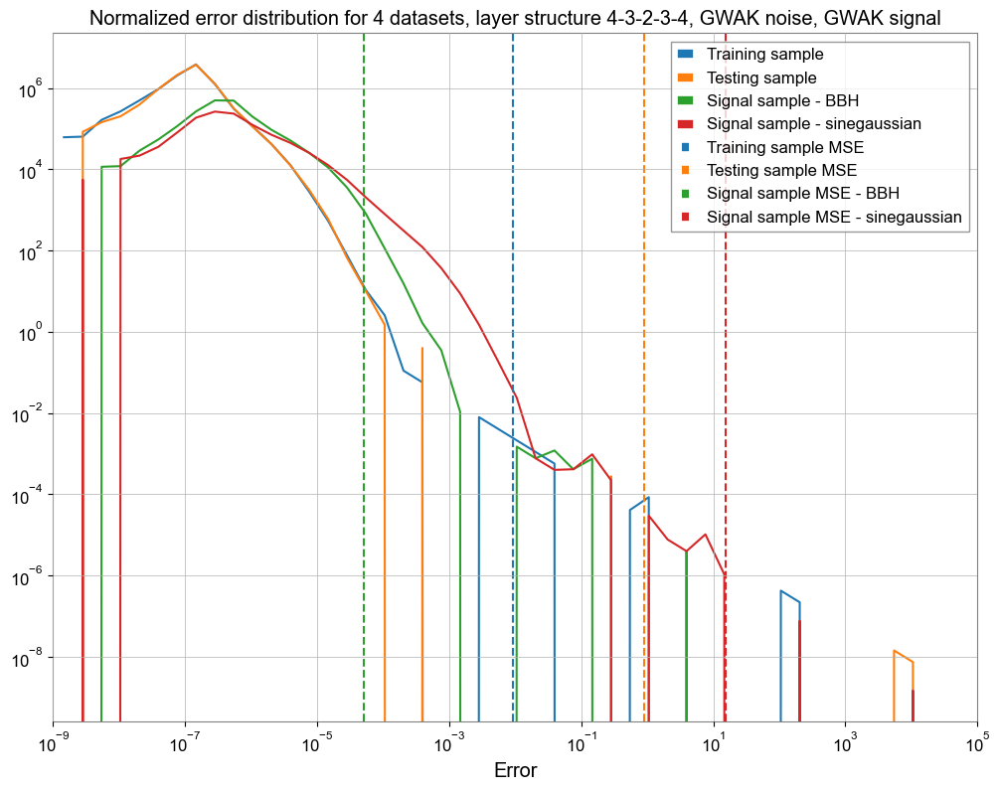

In [30]:
colors = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd', '#8c564b']
bin_scheme = np.logspace(-9,5,50)

counts_train, bin_position_train = np.histogram(ReconstructedError_train, bins = bin_scheme, density = True)
counts_test, bin_position_test = np.histogram(ReconstructedError_test, bins = bin_scheme, density = True)
counts_signal, bin_position_signal = np.histogram(ReconstructedError_injected, bins = bin_scheme, density = True)
# counts_train_cut, bin_position_train_cut = np.histogram(ReconstructedError_train_cut_output_200d, bins = bin_scheme, density = True)

counts_sinegaussian, bin_position_sinegaussian = np.histogram(ReconstructedError_sinegaussian, bins = bin_scheme, density = True)
# counts_glitches, bin_position_glitches = np.histogram(ReconstructedError_glitches_output_100d, bins = bin_scheme, density = True)
# counts_glitches_real, bin_position_glitches_real = np.histogram(ReconstructedError_glitches_real_output_100d, bins = bin_scheme, density = True)

bin_centers_train = (bin_position_train[:-1] + bin_position_train[1:]) / 2
bin_centers_test = (bin_position_test[:-1] + bin_position_test[1:]) / 2
bin_centers_signal = (bin_position_signal[:-1] + bin_position_signal[1:]) / 2
# bin_centers_train_cut = (bin_position_train_cut[:-1] + bin_position_train_cut[1:]) / 2

bin_centers_sinegaussian = (bin_position_sinegaussian[:-1] + bin_position_sinegaussian[1:]) / 2
# bin_centers_glitches = (bin_position_glitches[:-1] + bin_position_glitches[1:]) / 2
# bin_centers_glitches_real = (bin_position_glitches_real[:-1] + bin_position_glitches_real[1:]) / 2


plt.figure(figsize=(12, 9))
plt.plot(bin_centers_train, counts_train, color = colors[0], label = 'Training sample')
plt.plot(bin_centers_test, counts_test, color = colors[1], label = 'Testing sample')
plt.plot(bin_centers_signal, counts_signal, color = colors[2], label = 'Signal sample - BBH')
# plt.plot(bin_centers_train_cut, counts_train_cut, color = colors[3], label = 'Training sample first 5e3')

plt.plot(bin_centers_sinegaussian, counts_sinegaussian, color = colors[3], label = 'Signal sample - sinegaussian')
# plt.plot(bin_centers_glitches, counts_glitches, color = colors[4], label = 'Signal sample - simulated glitches')
# plt.plot(bin_centers_glitches_real, counts_glitches_real, color = colors[5], label = 'Signal sample - real glitches')


plt.axvline(x = MSE_train, color = colors[0], linestyle = '--', label = 'Training sample MSE')
plt.axvline(x = MSE_test, color = colors[1], linestyle = '--', label = 'Testing sample MSE')
plt.axvline(x = MSE_injected, color = colors[2], linestyle = '--', label = 'Signal sample MSE - BBH')
# plt.axvline(x = MSE_train_cut_output_200d, color = colors[3], linestyle = '--', label = 'Training sample MSE first 5e3')

plt.axvline(x = MSE_sinegaussian, color = colors[3], linestyle = '--', label = 'Signal sample MSE - sinegaussian')
# plt.axvline(x = MSE_glitches_output_100d, color = colors[4], linestyle = '--', label = 'Signal sample MSE - simulated glitches')
# plt.axvline(x = MSE_glitches_real_output_100d, color = colors[5], linestyle = '--', label = 'Signal sample MSE - real glitches')


plt.xlim(1e-9, 1e5)
plt.xlabel('Error')
plt.xscale('log')
plt.yscale('log')
plt.title('Normalized error distribution for 4 datasets, layer structure 4-3-2-3-4, GWAK noise, GWAK signal')
plt.legend()
plt.show()

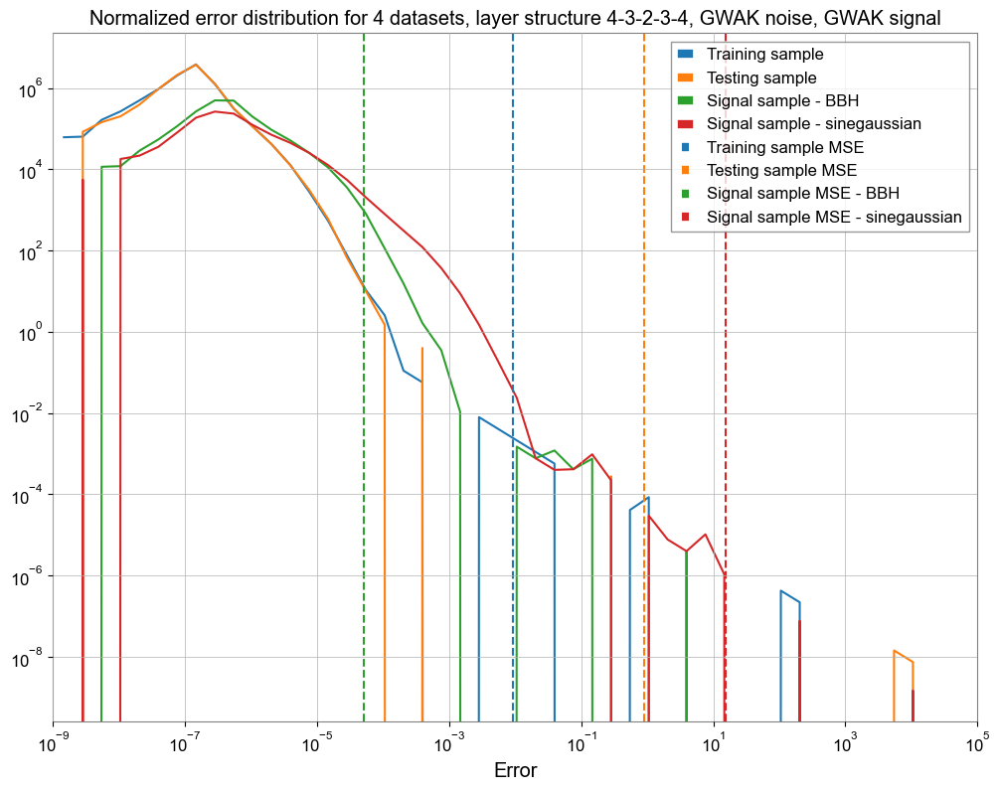

In [95]:
colors = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd', '#8c564b']
bin_scheme = np.logspace(-9,5,50)

counts_train, bin_position_train = np.histogram(ReconstructedError_train, bins = bin_scheme, density = True)
counts_test, bin_position_test = np.histogram(ReconstructedError_test, bins = bin_scheme, density = True)
counts_signal, bin_position_signal = np.histogram(ReconstructedError_injected, bins = bin_scheme, density = True)
# counts_train_cut, bin_position_train_cut = np.histogram(ReconstructedError_train_cut_output_200d, bins = bin_scheme, density = True)

counts_sinegaussian, bin_position_sinegaussian = np.histogram(ReconstructedError_sinegaussian, bins = bin_scheme, density = True)
# counts_glitches, bin_position_glitches = np.histogram(ReconstructedError_glitches_output_100d, bins = bin_scheme, density = True)
# counts_glitches_real, bin_position_glitches_real = np.histogram(ReconstructedError_glitches_real_output_100d, bins = bin_scheme, density = True)

bin_centers_train = (bin_position_train[:-1] + bin_position_train[1:]) / 2
bin_centers_test = (bin_position_test[:-1] + bin_position_test[1:]) / 2
bin_centers_signal = (bin_position_signal[:-1] + bin_position_signal[1:]) / 2
# bin_centers_train_cut = (bin_position_train_cut[:-1] + bin_position_train_cut[1:]) / 2

bin_centers_sinegaussian = (bin_position_sinegaussian[:-1] + bin_position_sinegaussian[1:]) / 2
# bin_centers_glitches = (bin_position_glitches[:-1] + bin_position_glitches[1:]) / 2
# bin_centers_glitches_real = (bin_position_glitches_real[:-1] + bin_position_glitches_real[1:]) / 2


plt.figure(figsize=(12, 9))
plt.plot(bin_centers_train, counts_train, color = colors[0], label = 'Training sample')
plt.plot(bin_centers_test, counts_test, color = colors[1], label = 'Testing sample')
plt.plot(bin_centers_signal, counts_signal, color = colors[2], label = 'Signal sample - BBH')
# plt.plot(bin_centers_train_cut, counts_train_cut, color = colors[3], label = 'Training sample first 5e3')

plt.plot(bin_centers_sinegaussian, counts_sinegaussian, color = colors[3], label = 'Signal sample - sinegaussian')
# plt.plot(bin_centers_glitches, counts_glitches, color = colors[4], label = 'Signal sample - simulated glitches')
# plt.plot(bin_centers_glitches_real, counts_glitches_real, color = colors[5], label = 'Signal sample - real glitches')


plt.axvline(x = MSE_train, color = colors[0], linestyle = '--', label = 'Training sample MSE')
plt.axvline(x = MSE_test, color = colors[1], linestyle = '--', label = 'Testing sample MSE')
plt.axvline(x = MSE_injected, color = colors[2], linestyle = '--', label = 'Signal sample MSE - BBH')
# plt.axvline(x = MSE_train_cut_output_200d, color = colors[3], linestyle = '--', label = 'Training sample MSE first 5e3')

plt.axvline(x = MSE_sinegaussian, color = colors[3], linestyle = '--', label = 'Signal sample MSE - sinegaussian')
# plt.axvline(x = MSE_glitches_output_100d, color = colors[4], linestyle = '--', label = 'Signal sample MSE - simulated glitches')
# plt.axvline(x = MSE_glitches_real_output_100d, color = colors[5], linestyle = '--', label = 'Signal sample MSE - real glitches')


plt.xlim(1e-9, 1e5)
plt.xlabel('Error')
plt.xscale('log')
plt.yscale('log')
plt.title('Normalized error distribution for 4 datasets, layer structure 4-3-2-3-4, GWAK noise, GWAK signal')
plt.legend()
plt.show()

In [47]:
def upperTPRFPRcalc(trainerror, signalerror, FPRlist):
    TPRlist = np.zeros(len(FPRlist))
    length_of_train_sample = len(trainerror)
    # print(length_of_train_sample)
    length_of_signal_value = len(signalerror)
    # print(length_of_signal_value)
    
    for i in range(len(FPRlist)):
        index_number = int(length_of_train_sample * FPRlist[i])
        threshold = np.sort(trainerror)[-index_number]
            
        # print(threshold)
        # print(np.argwhere(signalerror > threshold).shape)
        TPRlist[i] = np.argwhere(signalerror > threshold).shape[0] / length_of_signal_value
    
    TPRlist[-1] = 1
    
    return TPRlist

def lowerTPRFPRcalc(trainerror, signalerror, FPRlist):
    TPRlist = np.zeros(len(FPRlist))
    length_of_train_sample = len(trainerror)
    # print(length_of_train_sample)
    length_of_signal_value = len(signalerror)
    # print(length_of_signal_value)
    
    for i in range(len(FPRlist)):
        index_number = int(length_of_train_sample * FPRlist[i])
        if index_number == 0:
            threshold = np.sort(trainerror)[index_number]
        else:
            threshold = np.sort(trainerror)[index_number-1]
        # print(np.sort(trainerror))
        # print(threshold)
        # print(np.argwhere(signalerror < threshold).shape)
        TPRlist[i] = np.argwhere(signalerror < threshold).shape[0] / length_of_signal_value
    
    TPRlist[-1] = 1
    
    return TPRlist

FPR_list = np.logspace(-3,0,30)

colors = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd', '#8c564b']

In [101]:
TPR_list_test = upperTPRFPRcalc(ReconstructedError_train.flatten(), ReconstructedError_test.flatten(), FPR_list)
TPR_list_BBH = upperTPRFPRcalc(ReconstructedError_train.flatten(), ReconstructedError_injected.flatten(), FPR_list)
TPR_list_SG = lowerTPRFPRcalc(ReconstructedError_train.flatten(), ReconstructedError_sinegaussian.flatten(), FPR_list)
# TPR_list_real_glitches = upperTPRFPRcalc(ReconstructedError_train_output_200d.flatten(), ReconstructedError_glitch_output_200d.flatten(), FPR_list)
# TPR_list_fake_glitches = upperTPRFPRcalc(ReconstructedError_train_output_100d.flatten(), ReconstructedError_glitches_fake_output_100d.flatten(), FPR_list)

In [48]:
TPR_list_test = upperTPRFPRcalc(Geometric_mean_train.flatten(), Geometric_mean_test.flatten(), FPR_list)
TPR_list_BBH = upperTPRFPRcalc(Geometric_mean_train.flatten(), Geometric_mean_bbh.flatten(), FPR_list)
# TPR_list_SG = lowerTPRFPRcalc(ReconstructedError_train.flatten(), ReconstructedError_sinegaussian.flatten(), FPR_list)
# TPR_list_real_glitches = upperTPRFPRcalc(ReconstructedError_train_output_200d.flatten(), ReconstructedError_glitch_output_200d.flatten(), FPR_list)
# TPR_list_fake_glitches = upperTPRFPRcalc(ReconstructedError_train_output_100d.flatten(), ReconstructedError_glitches_fake_output_100d.flatten(), FPR_list)

In [56]:
TPR_list_test = upperTPRFPRcalc(reconstructedData_test.flatten(), reconstructedData_test.flatten(), FPR_list)
TPR_list_BBH = upperTPRFPRcalc(reconstructedData_test.flatten(), reconstructedData_injected.flatten(), FPR_list)
# TPR_list_SG = lowerTPRFPRcalc(ReconstructedError_train.flatten(), ReconstructedError_sinegaussian.flatten(), FPR_list)
# TPR_list_real_glitches = upperTPRFPRcalc(ReconstructedError_train_output_200d.flatten(), ReconstructedError_glitch_output_200d.flatten(), FPR_list)
# TPR_list_fake_glitches = upperTPRFPRcalc(ReconstructedError_train_output_100d.flatten(), ReconstructedError_glitches_fake_output_100d.flatten(), FPR_list)

In [57]:
from sklearn.metrics import auc

Text(0.5, 1.0, 'Pattern ROC curve, 4D error space, GWAK set')

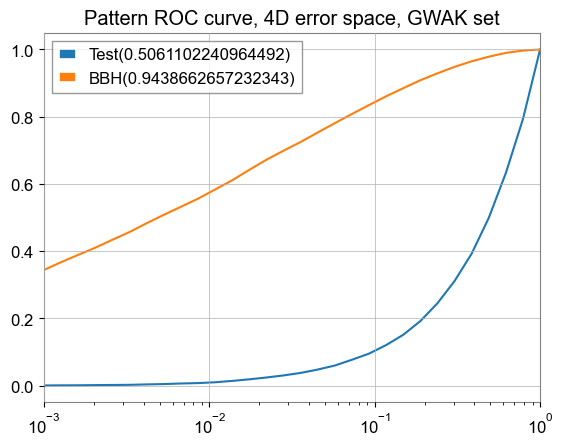

In [51]:
plt.plot(FPR_list, TPR_list_test, color = colors[0], label = 'Test(' + str(auc(FPR_list, TPR_list_test)) + ")")
plt.plot(FPR_list, TPR_list_BBH, color = colors[1], label = 'BBH(' + str(auc(FPR_list, TPR_list_BBH)) + ")")
# plt.plot(FPR_list, TPR_list_SG, color = colors[2], label = 'SG(' + str(auc(FPR_list, TPR_list_SG)) + ")")
# plt.plot(FPR_list, TPR_list_real_glitches, color = colors[3], label = 'Glitches(' + str(auc(FPR_list, TPR_list_real_glitches)) + ")")
# plt.plot(FPR_list, TPR_list_fake_glitches, color = colors[4], label = 'simulated Glitches')

TPR_list_for_plot = np.append(TPR_list_for_plot, TPR_list_BBH)

plt.xlim(1e-3, 1e0)
plt.xscale('log')
plt.yscale('linear')
plt.legend()
plt.title('Pattern ROC curve, 4D error space, GWAK set')

Text(0.5, 1.0, 'Pattern ROC curve, weakly supervised model, anomaly cut = 0.1, GWAK set, weakly learning ratio = 29')

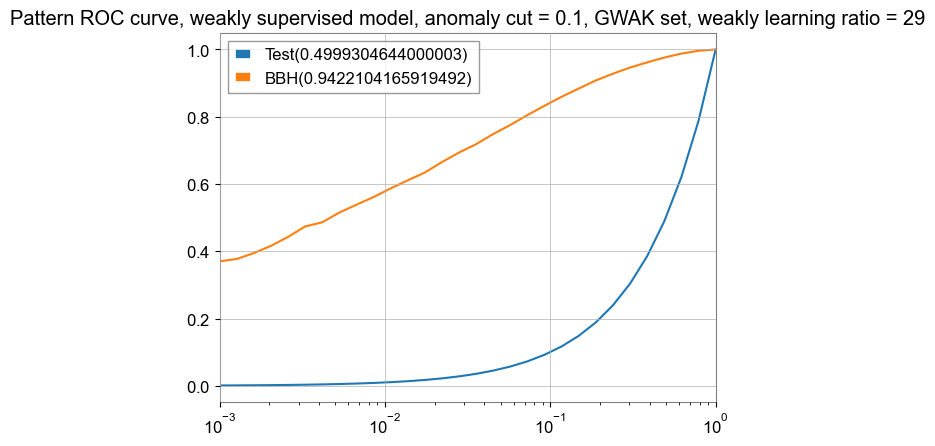

In [58]:
plt.plot(FPR_list, TPR_list_test, color = colors[0], label = 'Test(' + str(auc(FPR_list, TPR_list_test)) + ")")
plt.plot(FPR_list, TPR_list_BBH, color = colors[1], label = 'BBH(' + str(auc(FPR_list, TPR_list_BBH)) + ")")
# plt.plot(FPR_list, TPR_list_SG, color = colors[2], label = 'SG(' + str(auc(FPR_list, TPR_list_SG)) + ")")
# plt.plot(FPR_list, TPR_list_real_glitches, color = colors[3], label = 'Glitches(' + str(auc(FPR_list, TPR_list_real_glitches)) + ")")
# plt.plot(FPR_list, TPR_list_fake_glitches, color = colors[4], label = 'simulated Glitches')

TPR_list_for_plot = np.append(TPR_list_for_plot, TPR_list_BBH)

plt.xlim(1e-3, 1e0)
plt.xscale('log')
plt.yscale('linear')
plt.legend()
plt.title('Pattern ROC curve, weakly supervised model, anomaly cut = 0.1, GWAK set, weakly learning ratio = 29')

In [61]:
alpha_list = np.arange(1/3,1.01,1/3)

In [64]:
TPR_list_for_plot = TPR_list_for_plot.reshape(-1,30)

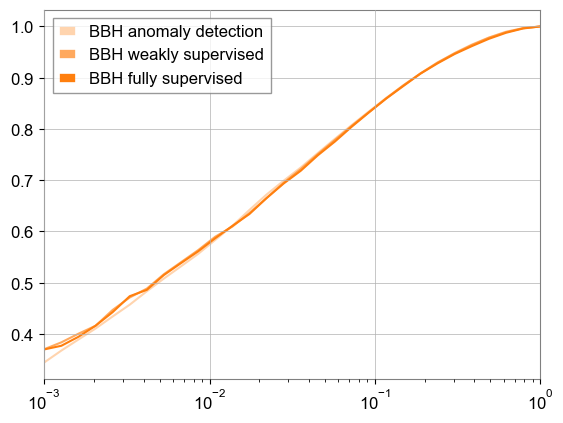

In [65]:
for i in range(len(TPR_list_for_plot)):
    # plt.plot(FPR_list, TPR_list_test, color = colors[0], label = 'Test')
    if i == 0:
        plt.plot(FPR_list, TPR_list_for_plot[i], color = colors[1], alpha = alpha_list[i],label = 'BBH anomaly detection')
    elif i == 2:
        plt.plot(FPR_list, TPR_list_for_plot[i], color = colors[1], alpha = alpha_list[i],label = 'BBH fully supervised')
    else:
        plt.plot(FPR_list, TPR_list_for_plot[i], color = colors[1], alpha = alpha_list[i],label = 'BBH weakly supervised')
# plt.plot(FPR_list, TPR_list_SG, color = colors[2], label = 'SG')
# plt.plot(FPR_list, TPR_list_real_glitches, color = colors[3], label = 'real Glitches')
# plt.plot(FPR_list, TPR_list_fake_glitches, color = colors[4], label = 'simulated Glitches')

plt.xlim(1e-3, 1e0)
plt.xscale('log')
plt.yscale('linear')
plt.legend()
# plt.title('')

## Plotting work

In [32]:
(Reconstruction_error_L['noise_train_pattern'] * Reconstruction_error_H['noise_train_pattern']).shape

(70000,)

(0.0, 0.01)

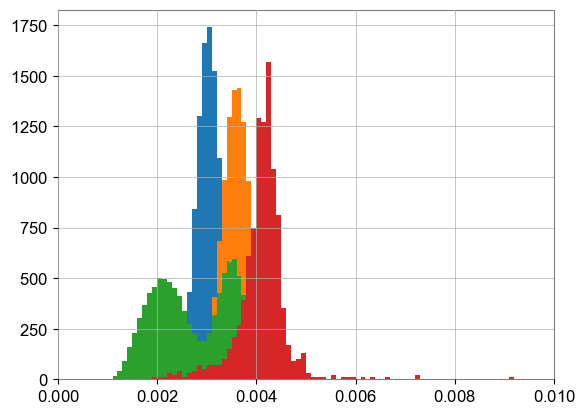

In [48]:
plt.hist(np.sqrt(Reconstruction_error_L['noise_train_pattern'] * Reconstruction_error_H['noise_train_pattern']), bins=np.arange(0,1e-2,1e-4), density=True)
plt.hist(np.sqrt(Reconstruction_error_L['bbh_pattern'] * Reconstruction_error_H['bbh_pattern']), bins=np.arange(0,1e-2,1e-4), density=True)
plt.hist(np.sqrt(Reconstruction_error_L['sg_pattern'] * Reconstruction_error_H['sg_pattern']), bins=np.arange(0,1e-2,1e-4), density=True)
plt.hist(np.sqrt(Reconstruction_error_L['glitch_pattern'] * Reconstruction_error_H['glitch_pattern']), bins=np.arange(0,1e-2,1e-4), density=True)
plt.xlim(0,1e-2)

(array([7.400e+01, 5.020e+02, 1.493e+03, 2.572e+03, 3.487e+03,
        4.057e+03, 4.479e+03, 4.579e+03, 4.732e+03, 4.494e+03,
        4.217e+03, 3.932e+03, 3.417e+03, 3.058e+03, 2.479e+03,
        2.109e+03, 1.676e+03, 1.494e+03, 1.290e+03, 1.314e+03,
        1.251e+03, 1.456e+03, 1.738e+03, 2.037e+03, 2.432e+03,
        2.838e+03, 3.034e+03, 3.204e+03, 3.281e+03, 3.275e+03,
        3.270e+03, 2.858e+03, 2.500e+03, 2.302e+03, 1.903e+03,
        1.665e+03, 1.291e+03, 1.094e+03, 8.390e+02, 6.930e+02,
        4.830e+02, 4.140e+02, 2.770e+02, 1.560e+02, 1.260e+02,
        6.400e+01, 3.900e+01, 1.400e+01, 9.000e+00, 2.000e+00]),
 array([9.17273164e-07, 1.30642006e-06, 1.69556695e-06,
        2.08471384e-06, 2.47386074e-06, 2.86300763e-06,
        3.25215453e-06, 3.64130142e-06, 4.03044831e-06,
        4.41959521e-06, 4.80874210e-06, 5.19788899e-06,
        5.58703589e-06, 5.97618278e-06, 6.36532967e-06,
        6.75447657e-06, 7.14362346e-06, 7.53277035e-06,
        7.92191725e-06, 8.311064

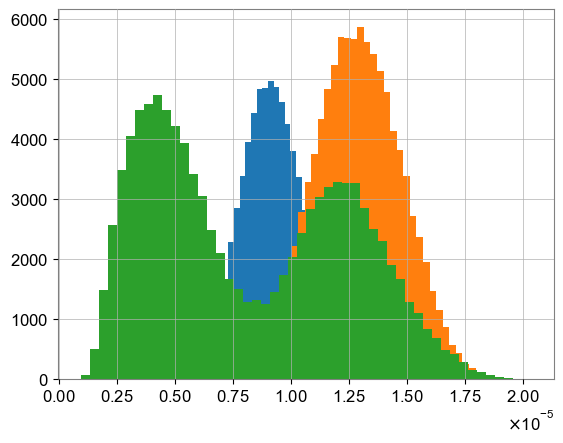

In [36]:
plt.hist(Reconstruction_error_L['noise_train_pattern'] * Reconstruction_error_H['noise_train_pattern'], bins=50)
plt.hist(Reconstruction_error_L['bbh_pattern'] * Reconstruction_error_H['bbh_pattern'], bins=50)
plt.hist(Reconstruction_error_L['sg_pattern'] * Reconstruction_error_H['sg_pattern'], bins=50)
plt.hist(Reconstruction_error_L['glitch_pattern'] * Reconstruction_error_H['glitch_pattern'], bins=50)

### ROC analysis

In [40]:
def upperTPRFPRcalc(trainerror, signalerror, FPRlist):
    TPRlist = np.zeros(len(FPRlist))
    length_of_train_sample = len(trainerror)
    # print(length_of_train_sample)
    length_of_signal_value = len(signalerror)
    # print(length_of_signal_value)
    
    for i in range(len(FPRlist)):
        index_number = int(length_of_train_sample * FPRlist[i])
        threshold = np.sort(trainerror)[-index_number]
            
        # print(threshold)
        # print(np.argwhere(signalerror > threshold).shape)
        TPRlist[i] = np.argwhere(signalerror > threshold).shape[1] / length_of_signal_value
    
    TPRlist[-1] = 1
    
    return TPRlist

def lowerTPRFPRcalc(trainerror, signalerror, FPRlist):
    TPRlist = np.zeros(len(FPRlist))
    length_of_train_sample = len(trainerror)
    # print(length_of_train_sample)
    length_of_signal_value = len(signalerror)
    # print(length_of_signal_value)
    
    for i in range(len(FPRlist)):
        index_number = int(length_of_train_sample * FPRlist[i])
        if index_number == 0:
            threshold = np.sort(trainerror)[index_number]
        else:
            threshold = np.sort(trainerror)[index_number-1]
        # print(np.sort(trainerror))
        # print(threshold)
        # print(np.argwhere(signalerror < threshold).shape)
        TPRlist[i] = np.argwhere(signalerror < threshold).shape[1] / length_of_signal_value
    
    TPRlist[-1] = 1
    
    return TPRlist

In [41]:
FPR_list = np.logspace(-3,0,30)

In [42]:
TPR_list_test = upperTPRFPRcalc(ReconstructedError_train.flatten(), ReconstructedError_test.flatten(), FPR_list)
TPR_list_BBH = upperTPRFPRcalc(ReconstructedError_train.flatten(), ReconstructedError_injected.flatten(), FPR_list)
TPR_list_SG = upperTPRFPRcalc(ReconstructedError_train.flatten(), ReconstructedError_sinegaussian.flatten(), FPR_list)
# TPR_list_real_glitches = upperTPRFPRcalc(ReconstructedError_train_output_100d.flatten(), ReconstructedError_glitches_real_output_100d.flatten(), FPR_list)
# TPR_list_fake_glitches = upperTPRFPRcalc(ReconstructedError_train_output_100d.flatten(), ReconstructedError_glitches_fake_output_100d.flatten(), FPR_list)

Text(0.5, 1.0, 'Pattern ROC curve, network structure VAE 4-3-2-3-4, full GWAK set')

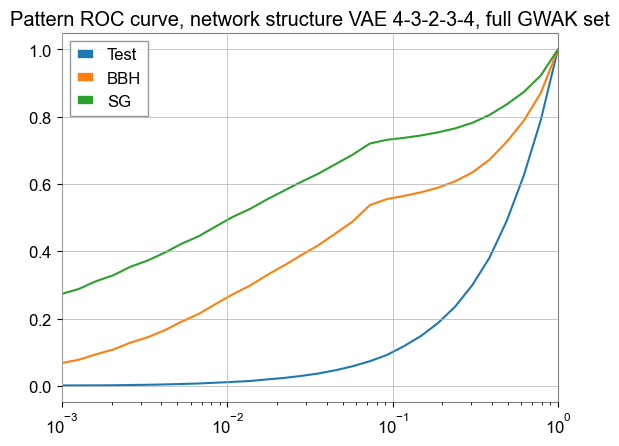

In [43]:
plt.plot(FPR_list, TPR_list_test, color = colors[0], label = 'Test')
plt.plot(FPR_list, TPR_list_BBH, color = colors[1], label = 'BBH')
plt.plot(FPR_list, TPR_list_SG, color = colors[2], label = 'SG')
# plt.plot(FPR_list, TPR_list_real_glitches, color = colors[3], label = 'real Glitches')
# plt.plot(FPR_list, TPR_list_fake_glitches, color = colors[4], label = 'simulated Glitches')

plt.xlim(1e-3, 1e0)
plt.xscale('log')
plt.yscale('linear')
plt.legend()
plt.title('Pattern ROC curve, network structure VAE 4-3-2-3-4, full GWAK set')

C:\Users\Liyang Miao\AppData\Local\Temp\ipykernel_12404\1671273466.py:21: DeprecationWarning: 'scipy.integrate.trapz' is deprecated in favour of 'scipy.integrate.trapezoid' and will be removed in SciPy 1.14.0
  AUC_list_BBH.append(integrate.trapz(TPR_list_BBH, FPR_list))


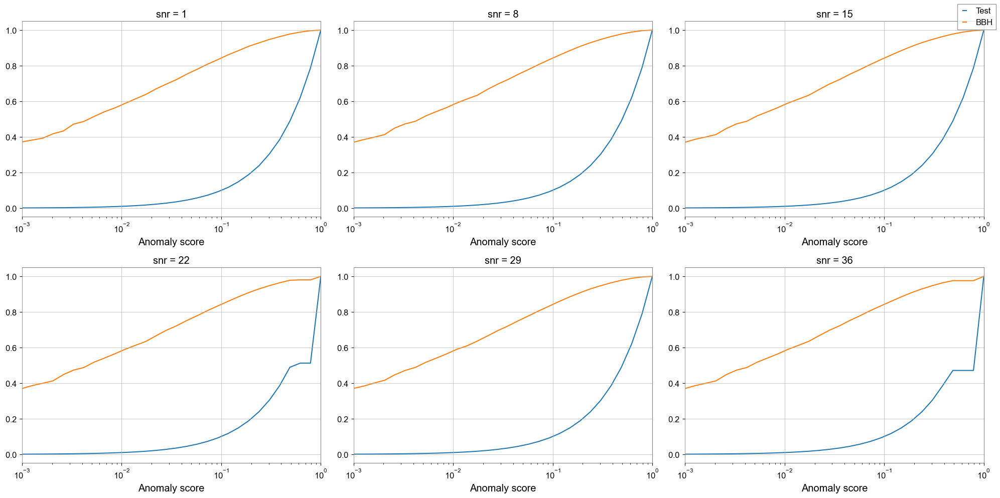

In [131]:
AUC_list_BBH = []

fig, axes = plt.subplots(2, 3, figsize=(20, 10))

for i in range(len(snr_list)):
    model = SupervisedModel()
    model = torch.load('../Model_cached/model_weakly_supervised_0.1anomalycut_2-8-6-4-1/model_weakly_supervised_2-8-6-4-1_GWAK_snr'+str(snr_list[i])+'.pt')
    
    decodedTestdata = model(torch.FloatTensor(Feature_space_noise_test))
    decodedTestdata = decodedTestdata.double()
    reconstructedData_test = decodedTestdata.detach().numpy()
    
    
    decodedTestdata = model(torch.FloatTensor(Feature_space_bbh))
    decodedTestdata = decodedTestdata.double()
    reconstructedData_injected = decodedTestdata.detach().numpy()
    
    TPR_list_test = upperTPRFPRcalc(reconstructedData_test.flatten(), reconstructedData_test.flatten(), FPR_list)
    TPR_list_BBH = upperTPRFPRcalc(reconstructedData_test.flatten(), reconstructedData_injected.flatten(), FPR_list)
    
    AUC_list_BBH.append(integrate.trapz(TPR_list_BBH, FPR_list))
    
    axes[i//3, i % 3].plot(FPR_list, TPR_list_test, color = colors[0], label = 'Test')
    axes[i//3, i % 3].plot(FPR_list, TPR_list_BBH, color = colors[1], label = 'BBH')

    axes[i//3, i % 3].set_xlim(1e-3, 1e0)
    axes[i//3, i % 3].set_xscale('log')
    axes[i//3, i % 3].set_yscale('linear')

    axes[i//3, i % 3].set_xlabel('Anomaly score')
    axes[i//3, i % 3].set_title('snr = ' + str(snr_list[i]))
    
    TPR_list_for_plot = np.append(TPR_list_for_plot, TPR_list_BBH)
    
handles, labels = axes[0,0].get_legend_handles_labels()
fig.legend(handles, labels, loc='upper right')

# 调整子图之间的距离
# plt.suptitle('')

plt.tight_layout()
# plt.legend()
# legend = fig.legend(loc='upper right', bbox_to_anchor=(1.0, 1.0))
# 显示图形
plt.show()  

Text(0.5, 1.0, 'AUC curve for pattern error anomaly detection using different snr')

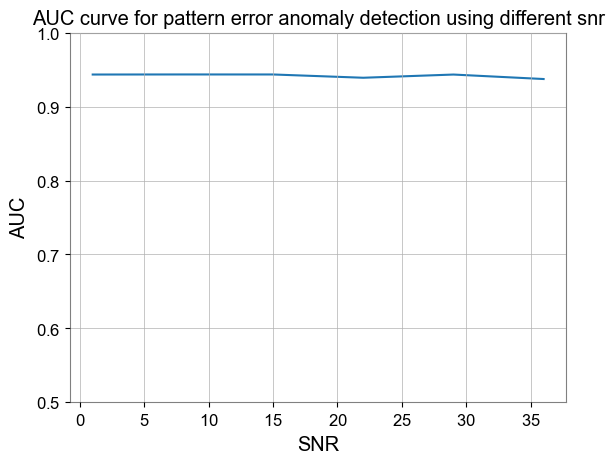

In [71]:
plt.plot(snr_list, AUC_list_BBH)
# plt.xlim(1e-2, 1000)
plt.ylim(0.5, 1)
# plt.xscale('log')
plt.xlabel('SNR')
plt.ylabel('AUC')

plt.title('AUC curve for pattern error anomaly detection using different snr')

In [72]:
AUC_list_BBH

[0.9434603678695445,
 0.9435627535027237,
 0.9435301684711865,
 0.9390987468717515,
 0.9434344592546249,
 0.9373709522211273]

### Try a full supervised one

In [74]:
Feature_space_noise_train.shape

(70000, 2)

In [75]:
Feature_space_bbh.shape

(100000, 2)

In [76]:
data_signal = Feature_space_bbh[:70000]
data_bkg = Feature_space_noise_train

print(data_signal.shape)
print(data_bkg.shape)

data_signal_labeled = np.hstack((data_signal,np.ones(len(data_signal)).reshape(-1,1)))
data_bkg_labeled = np.hstack((data_bkg,np.zeros(len(data_bkg)).reshape(-1,1)))

Final_training_and_validation_set = np.vstack((data_signal_labeled, data_bkg_labeled))
np.random.shuffle(Final_training_and_validation_set)

trainData = torch.FloatTensor(Final_training_and_validation_set[:int(0.9 * len(Final_training_and_validation_set))])
validationData = torch.FloatTensor(Final_training_and_validation_set[int(0.9 * len(Final_training_and_validation_set)):])
train_dataset = TensorDataset(trainData, trainData)
validation_dataset = TensorDataset(validationData, validationData)

trainDataLoader = DataLoader(dataset=train_dataset, batch_size=batch_size, shuffle=True)
validationDataLoader = DataLoader(dataset=validation_dataset, batch_size=batch_size, shuffle = True)


autoencoder = SupervisedModel().cuda()
optimizer = optim.Adam(autoencoder.parameters(), lr=0.00005)
loss_func = nn.BCELoss().cuda()
loss_train = np.zeros((epochs, 1))
loss_validation = np.zeros((epochs, 1))


for epoch in range(epochs):
    # 训练阶段
    autoencoder.train()
    for batchidx, (x, _) in enumerate(trainDataLoader):
        x = x.cuda()
        decoded = autoencoder(x[:,:2])
        # weighted_lossTrain = loss_func(decoded, x)
        loss_overall = loss_func(decoded.flatten(), x[:,-1])
        # loss_norm = loss_func(decoded[:, -1], x[:, -1])
        
        weighted_lossTrain = loss_overall
        # weighted_lossTrain = loss_overall + loss_norm * coef_delta
        
        # output_norm = torch.norm(decoded[:, :100], dim=1) 
        # penalty_term = torch.mean((output_norm - 1) ** 2) 
        # weighted_lossTrain = lossTrain + coef_delta * penalty_term
        
        optimizer.zero_grad()
        weighted_lossTrain.backward()
        optimizer.step()

    # 验证阶段
    autoencoder.eval()
    with torch.no_grad():
        val_loss = 0
        for batchidx, (x, _) in enumerate(validationDataLoader):
            x = x.cuda()
            decoded = autoencoder(x[:,:2])
            lossVal_overall = loss_func(decoded.flatten(), x[:,-1])
            lossVal_norm = loss_func(decoded[:, -1], x[:, -1])
            lossVal = lossVal_overall + lossVal_norm * coef_delta
            val_loss += lossVal.item()

        val_loss /= len(validationDataLoader)
    
    loss_train[epoch,0] = weighted_lossTrain.item()
    loss_validation[epoch,0] = val_loss
    # print('Epoch: %04d, Training loss=%.8f' % (epoch+1, weighted_lossTrain.item()))
    print('Epoch: %04d, Training loss=%.8f, Validation loss=%.8f' % (epoch+1, weighted_lossTrain.item(), val_loss))
    
torch.save(autoencoder.cpu(),'../Model_cached/model_full_supervised_2-8-6-4-1_GWAK_snr.pt')

(70000, 2)
(70000, 2)
Epoch: 0001, Training loss=0.69295210, Validation loss=0.69313833
Epoch: 0002, Training loss=0.69303763, Validation loss=0.69314010
Epoch: 0003, Training loss=0.69320208, Validation loss=0.69314793
Epoch: 0004, Training loss=0.69317484, Validation loss=0.69314432
Epoch: 0005, Training loss=0.69333315, Validation loss=0.69315360
Epoch: 0006, Training loss=0.69313896, Validation loss=0.69313783
Epoch: 0007, Training loss=0.69364834, Validation loss=0.69314661
Epoch: 0008, Training loss=0.69290888, Validation loss=0.69314823
Epoch: 0009, Training loss=0.69399840, Validation loss=0.69316161
Epoch: 0010, Training loss=0.69428521, Validation loss=0.69317395
Epoch: 0011, Training loss=0.69250256, Validation loss=0.69314563
Epoch: 0012, Training loss=0.69325638, Validation loss=0.69311330
Epoch: 0013, Training loss=0.69311941, Validation loss=0.69311978
Epoch: 0014, Training loss=0.69323087, Validation loss=0.69312202
Epoch: 0015, Training loss=0.69312757, Validation loss

In [82]:
data_signal.shape

(70000, 2)

In [83]:
data_bkg.shape

(70000, 2)

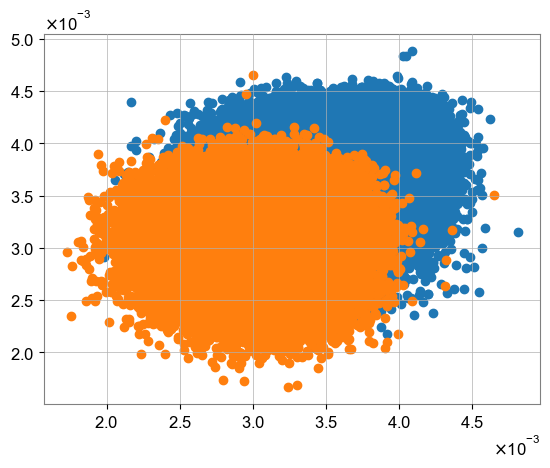

In [77]:
plt.scatter(data_signal[:,0],data_signal[:,1])
plt.scatter(data_bkg[:,0],data_bkg[:,1])

In [54]:
autoencoder = torch.load('../Model_cached/model_full_supervised_2-8-6-4-1_GWAK_snr.pt')

In [55]:
decodedTestdata = autoencoder(torch.FloatTensor(Feature_space_noise_test))
decodedTestdata = decodedTestdata.double()
reconstructedData_test = decodedTestdata.detach().numpy()

decodedTestdata = autoencoder(torch.FloatTensor(Feature_space_bbh[70000:]))
decodedTestdata = decodedTestdata.double()
reconstructedData_injected = decodedTestdata.detach().numpy()

(array([0.2247226 , 0.22774577, 0.20255265, 0.23883074,
        0.29895831, 0.34195456, 0.44474248, 0.63318698,
        1.08666307, 6.37788926]),
 array([6.69811212e-04, 9.99032683e-02, 1.99136725e-01,
        2.98370182e-01, 3.97603639e-01, 4.96837096e-01,
        5.96070553e-01, 6.95304011e-01, 7.94537468e-01,
        8.93770925e-01, 9.93004382e-01]),
 <BarContainer object of 10 artists>)

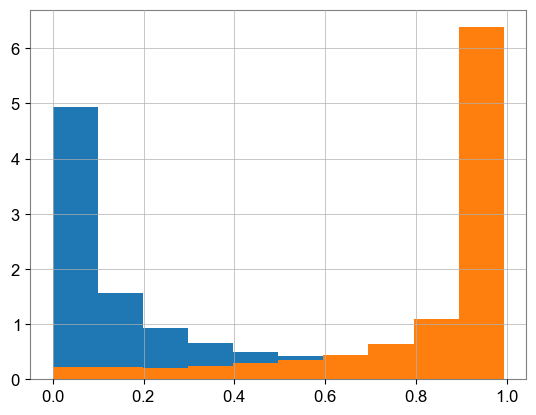

In [80]:
plt.hist(reconstructedData_test, density = True)
plt.hist(reconstructedData_injected, density = True)

Text(0.5, 1.0, 'Pattern ROC curve, full supervised model, GWAK set, fully supervised')

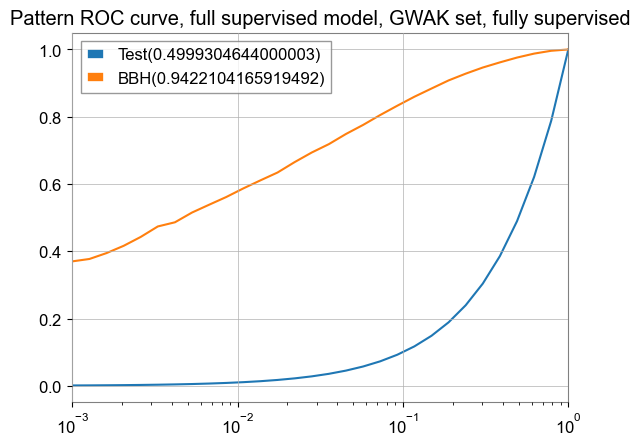

In [134]:
TPR_list_test = upperTPRFPRcalc(reconstructedData_test.flatten(), reconstructedData_test.flatten(), FPR_list)
TPR_list_BBH = upperTPRFPRcalc(reconstructedData_test.flatten(), reconstructedData_injected.flatten(), FPR_list)
# TPR_list_SG = lowerTPRFPRcalc(ReconstructedError_train.flatten(), ReconstructedError_sinegaussian.flatten(), FPR_list)
# TPR_list_real_glitches = upperTPRFPRcalc(ReconstructedError_train_output_200d.flatten(), ReconstructedError_glitch_output_200d.flatten(), FPR_list)
# TPR_list_fake_glitches = upperTPRFPRcalc(ReconstructedError_train_output_100d.flatten(), ReconstructedError_glitches_fake_output_100d.flatten(), FPR_list)
plt.plot(FPR_list, TPR_list_test, color = colors[0], label = 'Test(' + str(auc(FPR_list, TPR_list_test)) + ")")
plt.plot(FPR_list, TPR_list_BBH, color = colors[1], label = 'BBH(' + str(auc(FPR_list, TPR_list_BBH)) + ")")
# plt.plot(FPR_list, TPR_list_SG, color = colors[2], label = 'SG(' + str(auc(FPR_list, TPR_list_SG)) + ")")
# plt.plot(FPR_list, TPR_list_real_glitches, color = colors[3], label = 'Glitches(' + str(auc(FPR_list, TPR_list_real_glitches)) + ")")
# plt.plot(FPR_list, TPR_list_fake_glitches, color = colors[4], label = 'simulated Glitches')

plt.xlim(1e-3, 1e0)
plt.xscale('log')
plt.yscale('linear')
plt.legend()
plt.title('Pattern ROC curve, full supervised model, GWAK set, fully supervised')

## SVM-isoclu combined anomaly detection

### Initial distribution

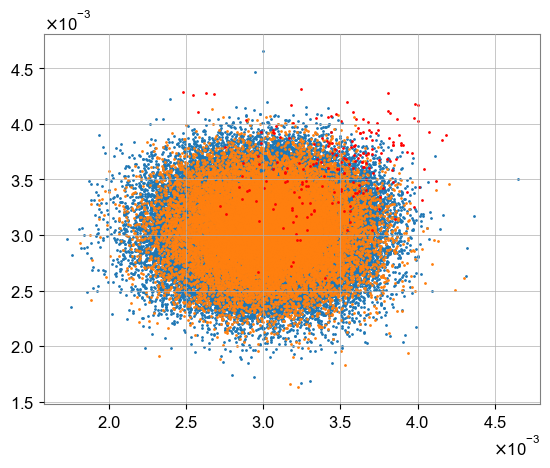

In [11]:
plt.scatter(x = Feature_space_noise_train[:,0],y = Feature_space_noise_train[:,1],s = 1)
plt.scatter(x = Feature_space_noise_test[:,0],y = Feature_space_noise_test[:,1],s = 1)
plt.scatter(x = Feature_space_bbh[:200][:,0],y = Feature_space_bbh[:200][:,1],s = 1,color = 'r')
# plt.scatter(x = Feature_space_sg[:,0],y = Feature_space_sg[:,1])

### Using SVM to identify the outliner

### As SVM is sensitive to bkg's distribution, we do a standardrization

In [12]:
mu = np.mean(Feature_space_noise_train, axis=0)
sig = np.std(Feature_space_noise_train, axis=0)

In [13]:
X_train = (Feature_space_noise_train - mu)/sig
X_test = (Feature_space_noise_test - mu)/sig
X_bbh = (Feature_space_bbh[:2000]-mu)/sig
X_sg = (Feature_space_sg[:2000] - mu)/sig

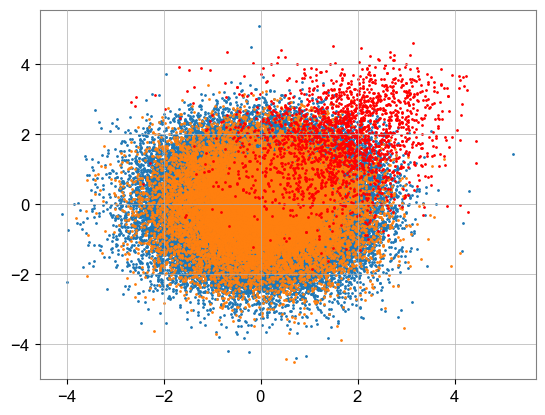

In [14]:
plt.scatter(X_train[:, 0], X_train[:, 1],s = 1)
plt.scatter(X_test[:, 0], X_test[:, 1],s = 1)
plt.scatter(X_bbh[:, 0], X_bbh[:, 1],s = 1,color = 'r')

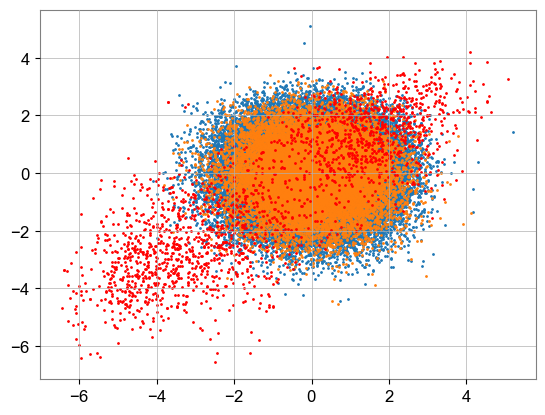

In [375]:
plt.scatter(X_train[:, 0], X_train[:, 1],s = 1)
plt.scatter(X_test[:, 0], X_test[:, 1],s = 1)
plt.scatter(X_sg[:, 0], X_sg[:, 1],s = 1,color = 'r')

### Making the SVM

In [376]:
FPR_SVM = 0.1

In [377]:
clf = make_pipeline(
            Nystroem(gamma=0.1, n_components=150), # a so-called kernel function that I still haven't figured out it's influence yet
            SGDOneClassSVM(nu=FPR_SVM, shuffle=True, fit_intercept=True) # nu is the FPR
)

clf.fit(X_train)

Pipeline(steps=[('nystroem', Nystroem(gamma=0.1, n_components=150)),
                ('sgdoneclasssvm', SGDOneClassSVM(nu=0.1))])

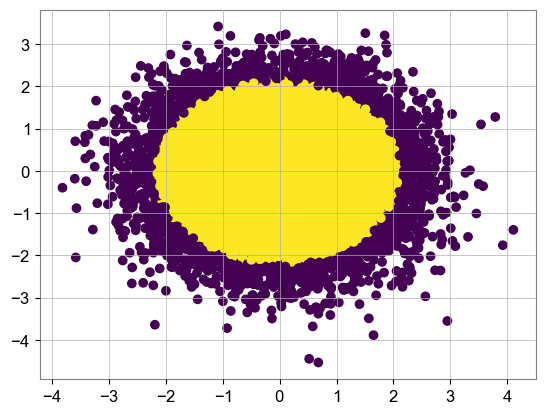

In [379]:
y_test = clf.predict(X_test)

indices_test_noise_anomaly = np.argwhere(y_test == -1).flatten()
indices_test_noise_bkg = np.argwhere(y_test == 1).flatten()

plt.scatter(X_test[:, 0], X_test[:, 1], c=y_test)

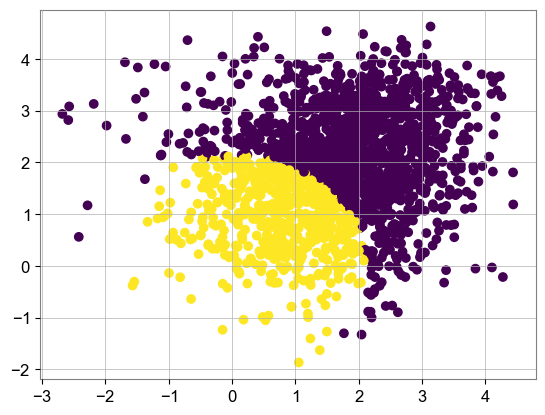

In [380]:
y_bbh = clf.predict(X_bbh) # 1 for insider, -1 for outliner

indices_bbh_anomaly = np.argwhere(y_bbh == -1).flatten()
indices_bbh_bkg = np.argwhere(y_bbh == 1).flatten()

plt.scatter(X_bbh[:, 0], X_bbh[:, 1], c=y_bbh)

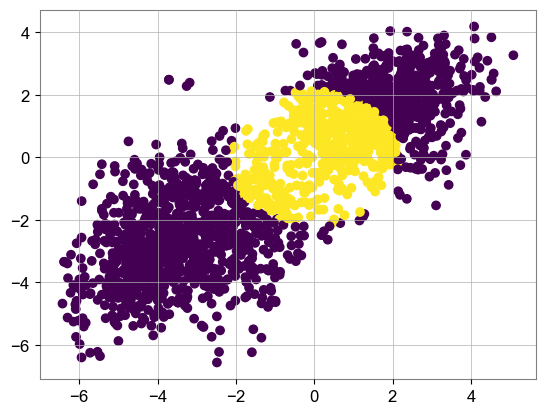

In [381]:
y_sg = clf.predict(X_sg) # 1 for insider, -1 for outliner

indices_sg_anomaly = np.argwhere(y_sg == -1).flatten()
indices_sg_bkg = np.argwhere(y_sg == 1).flatten()

plt.scatter(X_sg[:, 0], X_sg[:, 1], c=y_sg)

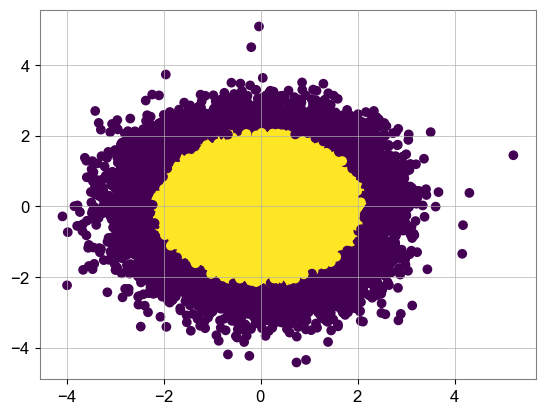

In [382]:
y_train = clf.predict(X_train) # 1 for insider, -1 for outliner

indices_train_noise_anomaly = np.argwhere(y_train == -1).flatten()
indices_train_noise_bkg = np.argwhere(y_train == 1).flatten()

plt.scatter(X_train[:, 0], X_train[:, 1], c=y_train)

### If we are not using the SVM

In [21]:
indices_train_noise_bkg = np.arange(len(X_train))
indices_train_noise_anomaly = np.zeros(0)
indices_test_noise_bkg = np.arange(len(X_test))
indices_test_noise_anomaly = np.zeros(0)
indices_bbh_bkg = np.arange(len(X_bbh))
indices_bbh_anomaly = np.zeros(0)


training_noise_sample_SVMed = X_train[indices_train_noise_bkg]

In [383]:
training_noise_sample_SVMed = X_train[indices_train_noise_bkg]

In [22]:
training_noise_sample_SVMed.shape

(70000, 2)

### After SVM, the left overdensity part is left for further iso-clu investigation

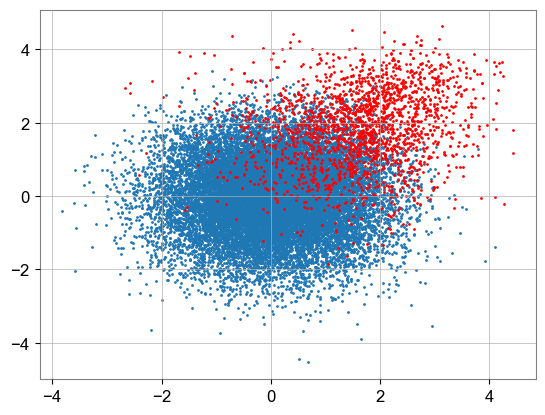

In [23]:
# plt.scatter(X_train[indices_train_noise_bkg][:, 0], X_train[indices_train_noise_bkg][:, 1],s = 1)
plt.scatter(X_test[indices_test_noise_bkg][:, 0], X_test[indices_test_noise_bkg][:, 1],s = 1)
plt.scatter(X_bbh[indices_bbh_bkg][:, 0], X_bbh[indices_bbh_bkg][:, 1],s = 1,color = 'r')
# plt.scatter(X_test[indices_test_noise_bkg][16662][0], X_test[indices_test_noise_bkg][16662][1],s = 4)

In [24]:
num_of_noise_bkg = len(indices_test_noise_bkg)
num_of_bbh_bkg = len(indices_bbh_bkg)

In [25]:
num_of_bbh_bkg

2000

In [26]:
num_of_noise_bkg

20000

In [27]:
full_test_noise_sample = np.vstack((X_test[indices_test_noise_bkg], X_bbh[indices_bbh_bkg]))

NameError: name 'indices_sg_bkg' is not defined

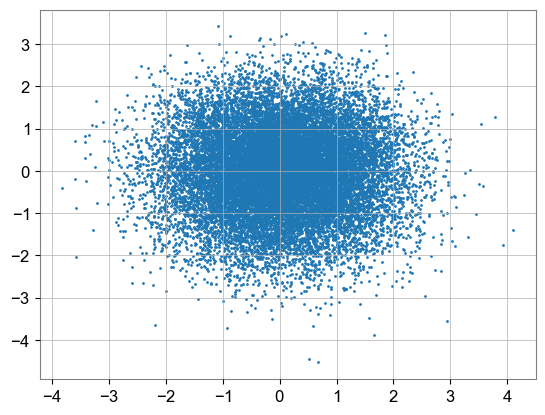

In [28]:
# plt.scatter(X_train[:, 0], X_train[:, 1],s = 1)
plt.scatter(X_test[indices_test_noise_bkg][:, 0], X_test[indices_test_noise_bkg][:, 1],s = 1)
plt.scatter(X_sg[indices_sg_bkg][:, 0], X_sg[indices_sg_bkg][:, 1],s = 1,color = 'r')

In [346]:
num_of_noise_bkg = len(indices_test_noise_bkg)
num_of_sg_bkg = len(indices_sg_bkg)

In [347]:
num_of_sg_bkg

49

In [348]:
num_of_noise_bkg

17898

In [343]:
full_test_noise_sample = np.vstack((X_test[indices_test_noise_bkg], X_sg[indices_sg_bkg]))

### iso-clu part

In [29]:
training_noise_sample_SVMed.shape

(70000, 2)

In [30]:
full_test_noise_sample.shape

(22000, 2)

In [31]:
def mean_distance_k(center_point_sample, reference_sample, k, exclude_self = False):
    mdk = np.zeros(len(center_point_sample))
    
    if exclude_self:
        bias = 1
    else:
        bias = 0
    
    for i in range(len(mdk)):
        mdk[i] = np.mean(np.sort(np.linalg.norm(center_point_sample[i] - reference_sample, axis=1))[bias:bias+k])
    return mdk

In [32]:
k_for_iso = 350
k_for_clu = 100

In [33]:
dtrainprime = np.mean(mean_distance_k(training_noise_sample_SVMed, training_noise_sample_SVMed, k_for_iso, exclude_self=True))

In [34]:
Delta_iso_test_noise = (mean_distance_k(full_test_noise_sample[:num_of_noise_bkg],training_noise_sample_SVMed,  k_for_iso) - dtrainprime) / np.sqrt(dtrainprime)
Delta_clu_test_noise = (mean_distance_k(full_test_noise_sample[:num_of_noise_bkg],full_test_noise_sample, k_for_clu-1, exclude_self=True)**(-2) - mean_distance_k(full_test_noise_sample[:num_of_noise_bkg],training_noise_sample_SVMed,k_for_iso)**(-2)) / mean_distance_k(full_test_noise_sample[:num_of_noise_bkg],training_noise_sample_SVMed,k_for_iso)**(-1)
Delta_iso_bbh = (mean_distance_k(full_test_noise_sample[num_of_noise_bkg:],training_noise_sample_SVMed, k_for_iso) - dtrainprime) / np.sqrt(dtrainprime)
Delta_clu_bbh = (mean_distance_k(full_test_noise_sample[num_of_noise_bkg:],full_test_noise_sample, k_for_clu-1, exclude_self=True)**(-2) - mean_distance_k(full_test_noise_sample[num_of_noise_bkg:],training_noise_sample_SVMed,k_for_iso)**(-2)) / mean_distance_k(full_test_noise_sample[num_of_noise_bkg:],training_noise_sample_SVMed,k_for_iso)**(-1)

In [35]:
isoscore_test_noise = (1+sp.erf(Delta_iso_test_noise / (np.sqrt(2) * np.sqrt(np.mean(np.hstack((np.square(Delta_iso_test_noise),np.square(Delta_iso_bbh))))))))/2
cluscore_test_noise = (1+sp.erf(Delta_clu_test_noise / (np.sqrt(np.mean(np.hstack((np.square(Delta_clu_test_noise),np.square(Delta_clu_bbh))))) * np.sqrt(2))))/2

In [36]:
isoscore_bbh = (1+sp.erf(Delta_iso_bbh / (np.sqrt(2) * np.sqrt(np.mean(np.hstack((np.square(Delta_iso_test_noise),np.square(Delta_iso_bbh))))))))/2
cluscore_bbh = (1+sp.erf(Delta_clu_bbh / (np.sqrt(np.mean(np.hstack((np.square(Delta_clu_test_noise),np.square(Delta_clu_bbh))))) * np.sqrt(2))))/2

In [419]:
# Delta_iso_train_noise = (mean_distance_k(training_noise_sample_SVMed,training_noise_sample_SVMed, k_for_iso-1, exclude_self=True) - dtrainprime) / np.sqrt(dtrainprime)
# isoscore_train_noise = (1 + sp.erf(Delta_iso_train_noise / (np.sqrt(2) * np.sqrt(np.mean(np.square(Delta_iso_train_noise))))))/2

In [37]:
Delta_iso_train_noise = (mean_distance_k(training_noise_sample_SVMed,training_noise_sample_SVMed, k_for_iso-1, exclude_self=True) - dtrainprime) / np.sqrt(dtrainprime)
isoscore_train_noise = (1 + sp.erf(Delta_iso_train_noise / (np.sqrt(2) * np.sqrt(np.mean(np.hstack((np.square(Delta_iso_test_noise),np.square(Delta_iso_bbh))))))))/2

In [420]:
# Delta_clu_train_noise = (mean_distance_k(training_noise_sample_SVMed,full_test_noise_sample, k_for_clu)**(-2) - mean_distance_k(training_noise_sample_SVMed,training_noise_sample_SVMed,k_for_iso-1, exclude_self=True)**(-2)) / mean_distance_k(training_noise_sample_SVMed,training_noise_sample_SVMed,k_for_iso-1,exclude_self=True)**(-1)
# cluscore_train_noise = (1 + sp.erf(Delta_clu_train_noise / (np.sqrt(np.mean(np.square(Delta_clu_train_noise))) * np.sqrt(2))))/2

In [46]:
Delta_clu_train_noise = (mean_distance_k(training_noise_sample_SVMed,full_test_noise_sample, k_for_clu)**(-2) - mean_distance_k(training_noise_sample_SVMed,training_noise_sample_SVMed,k_for_iso-1, exclude_self=True)**(-2)) / mean_distance_k(training_noise_sample_SVMed,training_noise_sample_SVMed,k_for_iso-1,exclude_self=True)**(-1)
cluscore_train_noise = (1 + sp.erf(Delta_clu_train_noise / (np.sqrt(2) * np.sqrt(np.mean(np.hstack((np.square(Delta_clu_test_noise),np.square(Delta_clu_bbh))))))))/2

(-0.1, 1.1)

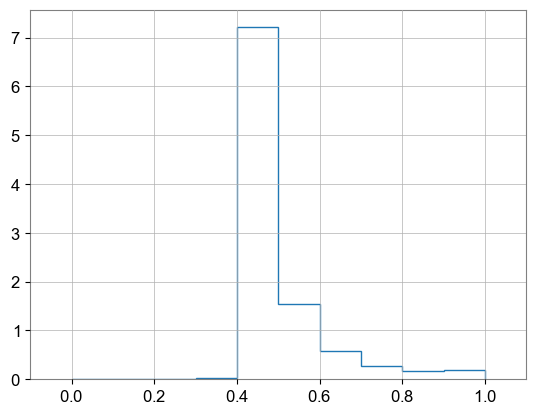

In [39]:
plt.hist(isoscore_train_noise, density = True, histtype='step', bins = np.arange(0,1.1,0.1))
plt.xlim(-0.1, 1.1)

(-0.1, 1.1)

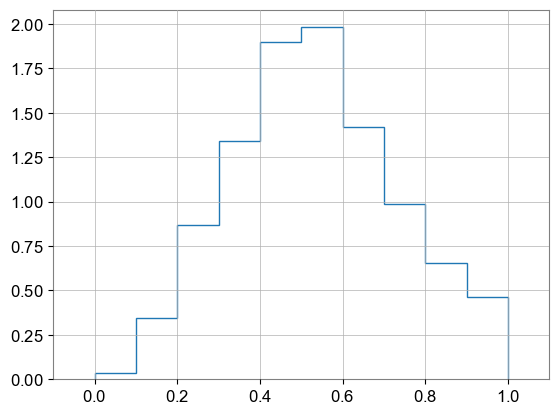

In [47]:
plt.hist(cluscore_train_noise, density = True, histtype='step', bins = np.arange(0,1.1,0.1))
plt.xlim(-0.1, 1.1)

Text(0, 0.5, 'cluscore')

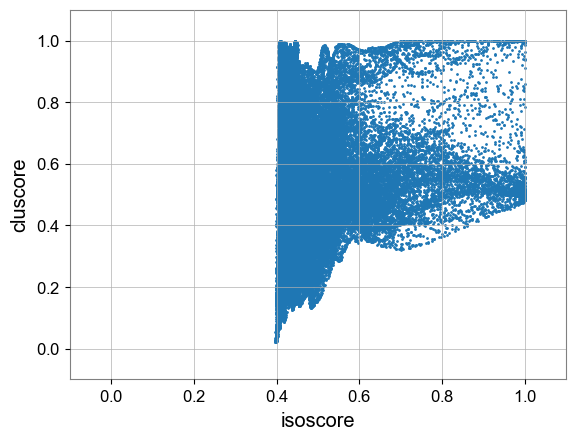

In [48]:
plt.scatter(isoscore_train_noise, cluscore_train_noise,s = 1)
# plt.scatter(isoscore_bbh, cluscore_bbh)

plt.xlim(-0.1,1.1)
plt.ylim(-0.1,1.1)
plt.xlabel('isoscore')
plt.ylabel('cluscore')

(-0.1, 1.1)

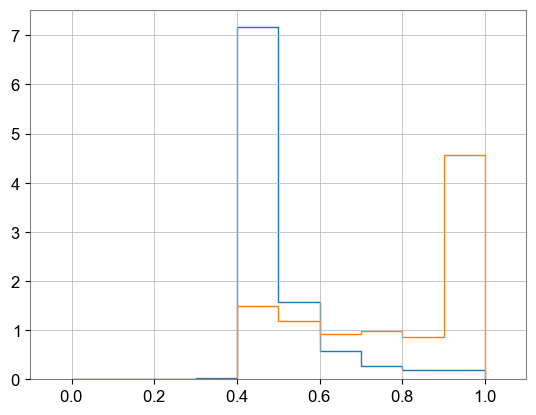

In [42]:
plt.hist(isoscore_test_noise, density = True, histtype='step', bins = np.arange(0,1.1,0.1))
plt.hist(isoscore_bbh, density = True, histtype='step', bins = np.arange(0,1.1,0.1))
plt.xlim(-0.1,1.1)

(-0.1, 1.1)

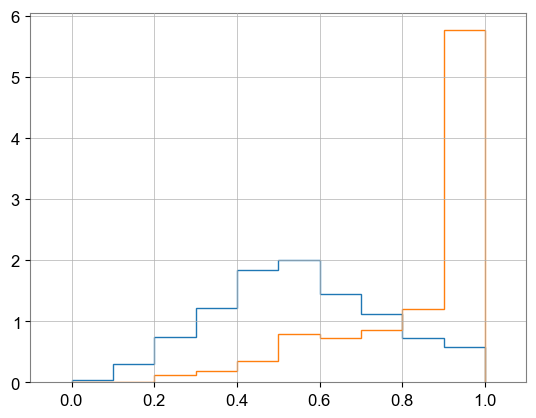

In [43]:
plt.hist(cluscore_test_noise, density = True, histtype='step', bins = np.arange(0,1.1,0.1))
plt.hist(cluscore_bbh, density = True, histtype='step', bins = np.arange(0,1.1,0.1))
plt.xlim(-0.1,1.1)

Text(0, 0.5, 'cluscore')

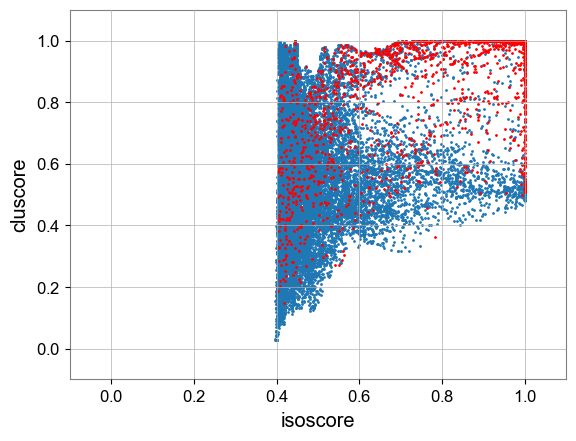

In [44]:
plt.scatter(isoscore_test_noise, cluscore_test_noise,s = 1)
plt.scatter(isoscore_bbh, cluscore_bbh,s = 1, color = 'r')

plt.xlim(-0.1,1.1)
plt.ylim(-0.1,1.1)
plt.xlabel('isoscore')
plt.ylabel('cluscore')

In [49]:
Geometric_mean_test_isoclu = np.sqrt(isoscore_test_noise * cluscore_test_noise)
Geometric_mean_bbh_isoclu = np.sqrt(isoscore_bbh * cluscore_bbh)

(array([0.   , 0.   , 0.02 , 0.2  , 0.55 , 0.88 , 1.14 , 1.23 ,
        1.635, 4.345]),
 array([0. , 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1. ]),
 [<matplotlib.patches.Polygon at 0x20a1c2a05d0>])

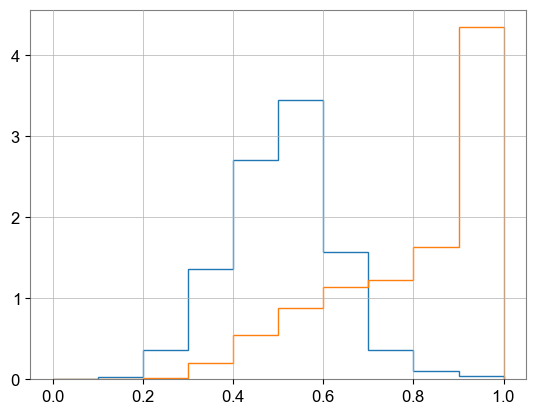

In [50]:
plt.hist(Geometric_mean_test_isoclu, density = True, histtype='step', bins = np.arange(0,1.1,0.1))
plt.hist(Geometric_mean_bbh_isoclu, density = True, histtype='step', bins = np.arange(0,1.1,0.1))

(array([0.15151515, 0.60606061, 0.60606061, 1.21212121,
        1.21212121, 1.66666667, 2.12121212, 1.36363636,
        0.45454545, 0.60606061]),
 array([0. , 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1. ]),
 [<matplotlib.patches.Polygon at 0x15eaf850bd0>])

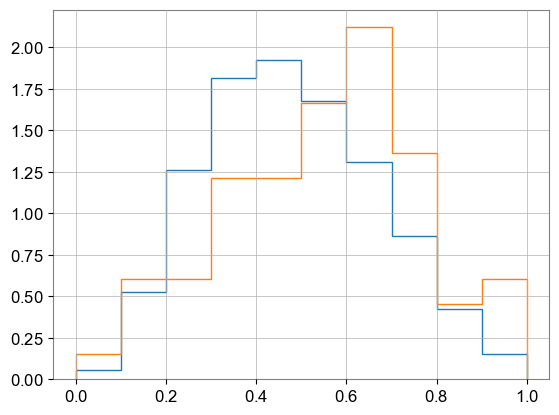

In [245]:
plt.hist(Geometric_mean_test_isoclu, density = True, histtype='step', bins = np.arange(0,1.1,0.1))
plt.hist(Geometric_mean_bbh_isoclu, density = True, histtype='step', bins = np.arange(0,1.1,0.1))

In [51]:
bins = 10

isocut_scheme = np.arange(0, 1.0001, 1/bins)
xi = np.zeros(bins)

ratio = len(training_noise_sample_SVMed) / (len(full_test_noise_sample))

total_number_test_noise = 0
total_number_train = 0
total_number_bbh = 0

for i in range(bins):
    count_test_noise = np.count_nonzero(np.logical_and(isoscore_test_noise >= isocut_scheme[i],isoscore_test_noise <= isocut_scheme[i+1]))
    count_bbh = np.count_nonzero(np.logical_and(isoscore_bbh >= isocut_scheme[i],isoscore_bbh <= isocut_scheme[i+1]))
    count_train = np.count_nonzero(np.logical_and(isoscore_train_noise >= isocut_scheme[i], isoscore_train_noise <=  isocut_scheme[i+1]))
    
    total_number_test_noise += count_test_noise
    total_number_train += count_train
    total_number_bbh += count_bbh
    
    # print(count_test_noise, count_bbh, count_train)
    
    
    xi[i] = (count_test_noise + count_bbh - (count_train/ratio)) / np.sqrt(count_train/ratio)

C:\Users\Liyang Miao\AppData\Local\Temp\ipykernel_34820\31120246.py:24: RuntimeWarning: invalid value encountered in scalar divide
  xi[i] = (count_test_noise + count_bbh - (count_train/ratio)) / np.sqrt(count_train/ratio)


In [52]:
xi

array([            nan,             nan,             nan,
       -2.76693992e+00, -9.84742220e+00, -3.28543101e-02,
        1.73949677e+00,  5.56582117e+00,  9.20699962e+00,
        4.37436943e+01])

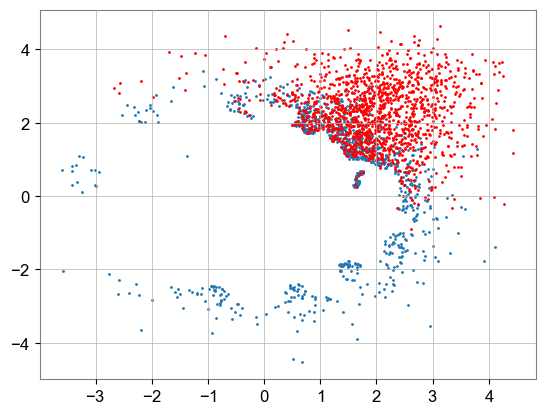

In [55]:
# plt.scatter(X_train[:, 0], X_train[:, 1],s = 1)
plt.scatter(X_test[indices_test_noise_bkg][np.argwhere(Geometric_mean_test_isoclu>0.7).flatten()][:, 0], X_test[indices_test_noise_bkg][np.argwhere(Geometric_mean_test_isoclu>0.7).flatten()][:, 1],s = 1)
plt.scatter(X_bbh[indices_bbh_bkg][np.argwhere(Geometric_mean_bbh_isoclu>0.7).flatten()][:, 0], X_bbh[indices_bbh_bkg][np.argwhere(Geometric_mean_bbh_isoclu>0.7).flatten()][:, 1],s = 1,color = 'r')

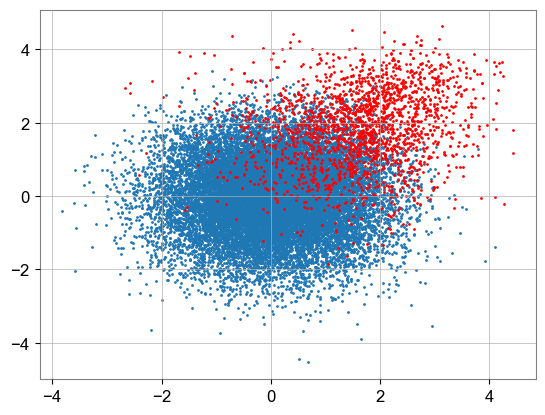

In [56]:
# plt.scatter(X_train[indices_train_noise_bkg][:, 0], X_train[indices_train_noise_bkg][:, 1],s = 1)
plt.scatter(X_test[indices_test_noise_bkg][:, 0], X_test[indices_test_noise_bkg][:, 1],s = 1)
plt.scatter(X_bbh[indices_bbh_bkg][:, 0], X_bbh[indices_bbh_bkg][:, 1],s = 1,color = 'r')
# plt.scatter(X_test[indices_test_noise_bkg][16662][0], X_test[indices_test_noise_bkg][16662][1],s = 4)

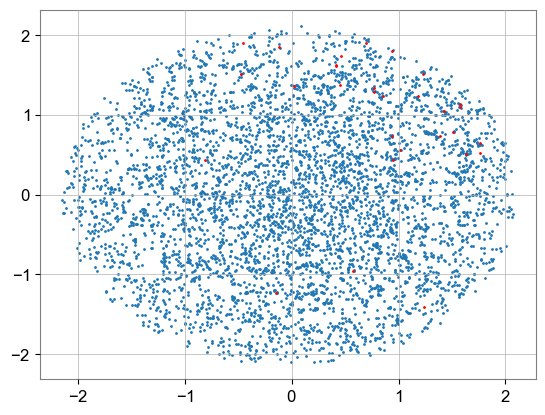

In [341]:
# plt.scatter(X_train[:, 0], X_train[:, 1],s = 1)
plt.scatter(X_test[indices_test_noise_bkg][np.argwhere(Geometric_mean_test_isoclu>0.6).flatten()][:, 0], X_test[indices_test_noise_bkg][np.argwhere(Geometric_mean_test_isoclu>0.6).flatten()][:, 1],s = 1)
plt.scatter(X_bbh[indices_bbh_bkg][np.argwhere(Geometric_mean_bbh_isoclu>0.6).flatten()][:, 0], X_bbh[indices_bbh_bkg][np.argwhere(Geometric_mean_bbh_isoclu>0.6).flatten()][:, 1],s = 1,color = 'r')

### For sg

In [344]:
full_test_noise_sample.shape

(17947, 2)

In [349]:
def mean_distance_k(center_point_sample, reference_sample, k, exclude_self = False):
    mdk = np.zeros(len(center_point_sample))
    
    if exclude_self:
        bias = 1
    else:
        bias = 0
    
    for i in range(len(mdk)):
        mdk[i] = np.mean(np.sort(np.linalg.norm(center_point_sample[i] - reference_sample, axis=1))[bias:bias+k])
    return mdk

In [350]:
k_for_iso = 35
k_for_clu = 10

In [351]:
dtrainprime = np.mean(mean_distance_k(training_noise_sample_SVMed, training_noise_sample_SVMed, k_for_iso, exclude_self=True))

In [352]:
Delta_iso_test_noise = (mean_distance_k(full_test_noise_sample[:num_of_noise_bkg],training_noise_sample_SVMed,  k_for_iso) - dtrainprime) / np.sqrt(dtrainprime)
Delta_clu_test_noise = (mean_distance_k(full_test_noise_sample[:num_of_noise_bkg],full_test_noise_sample, k_for_clu, exclude_self=True)**(-2) - mean_distance_k(full_test_noise_sample[:num_of_noise_bkg],training_noise_sample_SVMed,k_for_iso)**(-2)) / mean_distance_k(full_test_noise_sample[:num_of_noise_bkg],training_noise_sample_SVMed,k_for_iso)**(-1)
Delta_iso_sg = (mean_distance_k(full_test_noise_sample[num_of_noise_bkg:],training_noise_sample_SVMed, k_for_iso) - dtrainprime) / np.sqrt(dtrainprime)
Delta_clu_sg = (mean_distance_k(full_test_noise_sample[num_of_noise_bkg:],full_test_noise_sample, k_for_clu, exclude_self=True)**(-2) - mean_distance_k(full_test_noise_sample[num_of_noise_bkg:],training_noise_sample_SVMed,k_for_iso)**(-2)) / mean_distance_k(full_test_noise_sample[num_of_noise_bkg:],training_noise_sample_SVMed,k_for_iso)**(-1)

In [353]:
isoscore_test_noise = (1+sp.erf(Delta_iso_test_noise / (np.sqrt(2) * np.sqrt(np.mean(np.hstack((np.square(Delta_iso_test_noise),np.square(Delta_iso_sg))))))))/2
cluscore_test_noise = (1+sp.erf(Delta_clu_test_noise / (np.sqrt(np.mean(np.hstack((np.square(Delta_clu_test_noise),np.square(Delta_clu_sg))))) * np.sqrt(2))))/2

In [ ]:
np.sqrt(np.mean((np.square(Delta_iso_test_noise))))

0.18461219924195701

In [ ]:
np.sqrt(np.mean(np.hstack((np.square(Delta_iso_test_noise),np.square(Delta_iso_sg)))))

0.18623694919391615

In [354]:
isoscore_sg = (1+sp.erf(Delta_iso_sg / (np.sqrt(2) * np.sqrt(np.mean(np.hstack((np.square(Delta_iso_test_noise),np.square(Delta_iso_sg))))))))/2
cluscore_sg = (1+sp.erf(Delta_clu_sg / (np.sqrt(np.mean(np.hstack((np.square(Delta_clu_test_noise),np.square(Delta_clu_sg))))) * np.sqrt(2))))/2

In [355]:
Delta_iso_train_noise = (mean_distance_k(training_noise_sample_SVMed,training_noise_sample_SVMed, k_for_iso, exclude_self=True) - dtrainprime) / np.sqrt(dtrainprime)
isoscore_train_noise = (1 + sp.erf(Delta_iso_train_noise / (np.sqrt(2) * np.sqrt(np.mean(np.square(Delta_iso_train_noise))))))/2

In [356]:
Delta_clu_train_noise = (mean_distance_k(training_noise_sample_SVMed,full_test_noise_sample, k_for_clu)**(-2) - mean_distance_k(training_noise_sample_SVMed,training_noise_sample_SVMed,k_for_iso, exclude_self=True)**(-2)) / mean_distance_k(training_noise_sample_SVMed,training_noise_sample_SVMed,k_for_iso,exclude_self=True)**(-1)
cluscore_train_noise = (1 + sp.erf(Delta_clu_train_noise / (np.sqrt(np.mean(np.square(Delta_clu_train_noise))) * np.sqrt(2))))/2

In [ ]:
isoscore_train_noise = (1 + sp.erf(Delta_iso_train_noise / (np.sqrt(2) * np.sqrt(np.mean(np.hstack((np.square(Delta_iso_test_noise),np.square(Delta_iso_sg))))))))/2

In [ ]:
(np.sqrt(2) * np.sqrt(np.mean(np.hstack((np.square(Delta_iso_test_noise),np.square(Delta_iso_sg))))))

0.2633788193650253

In [ ]:
(np.sqrt(2) * np.sqrt(np.mean(np.square(Delta_iso_train_noise))))

0.25387923761495995

In [ ]:
(np.sqrt(2) * np.sqrt(np.mean(np.square(Delta_iso_test_noise)[:-1])))

0.26108642317481645

In [ ]:
np.argmax(Delta_iso_test_noise)

16662

(array([4.49420006e+00, 9.55811094e-01, 3.34819265e-01,
        1.33207665e-01, 7.39359615e-02, 3.83729396e-02,
        2.36208713e-02, 1.72107464e-02, 9.83471222e-03,
        2.89772771e-03]),
 array([-0.14665892,  0.01770904,  0.18207699,  0.34644494,
         0.51081289,  0.67518085,  0.8395488 ,  1.00391675,
         1.1682847 ,  1.33265266,  1.49702061]),
 [<matplotlib.patches.Polygon at 0x15eab1c7b90>])

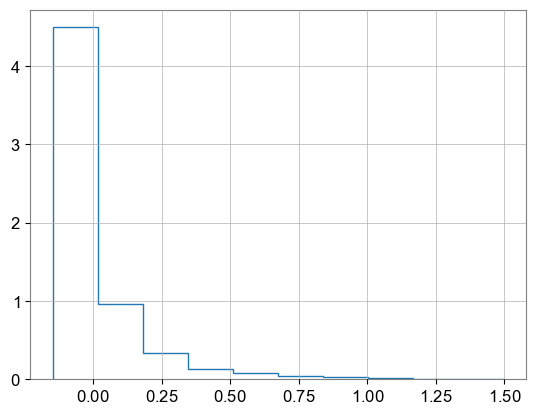

In [ ]:
plt.hist(Delta_iso_train_noise, histtype = 'step', density = True, bins = 10)
# plt.hist(Delta_iso_test_noise, histtype = 'step', density = True, bins = 10)

(array([0.        , 0.        , 2.93303707, 2.64720735,
        1.42611857, 0.73174427, 0.64740935, 0.41561458,
        0.37571962, 0.82314918]),
 array([0. , 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1. ]),
 [<matplotlib.patches.Polygon at 0x15ea9513ed0>])

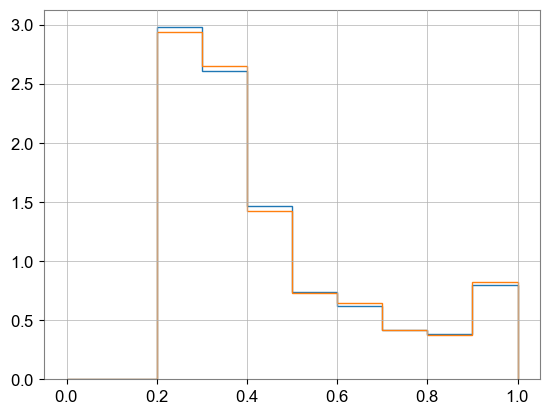

In [ ]:
plt.hist(isoscore_train_noise, histtype = 'step', density = True, bins = np.arange(0,1.001,1/10))
plt.hist(isoscore_test_noise, histtype = 'step', density = True, bins = np.arange(0,1.001,1/10))

(-0.1, 1.1)

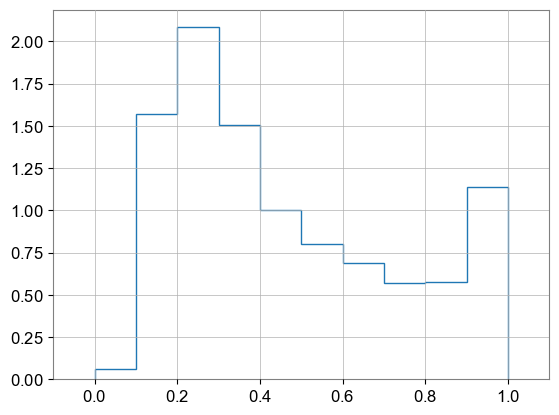

In [357]:
plt.hist(isoscore_train_noise, density = True, histtype='step', bins = np.arange(0,1.1,0.1))
plt.xlim(-0.1, 1.1)

(-0.1, 1.1)

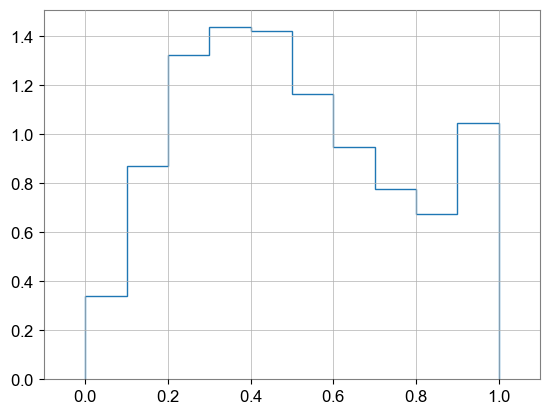

In [358]:
plt.hist(cluscore_train_noise, density = True, histtype='step', bins = np.arange(0,1.1,0.1))
plt.xlim(-0.1, 1.1)

Text(0, 0.5, 'cluscore')

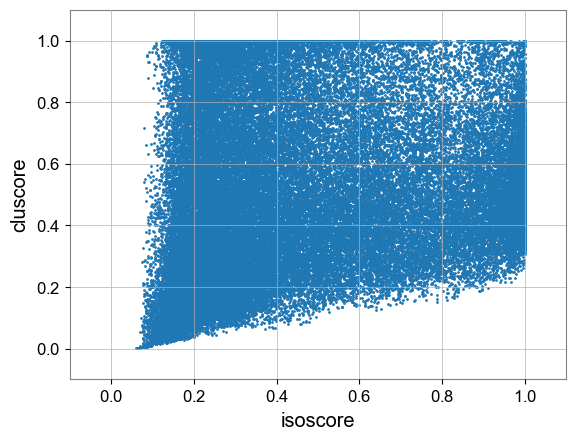

In [359]:
plt.scatter(isoscore_train_noise, cluscore_train_noise,s = 1)

plt.xlim(-0.1,1.1)
plt.ylim(-0.1,1.1)
plt.xlabel('isoscore')
plt.ylabel('cluscore')

(-0.1, 1.1)

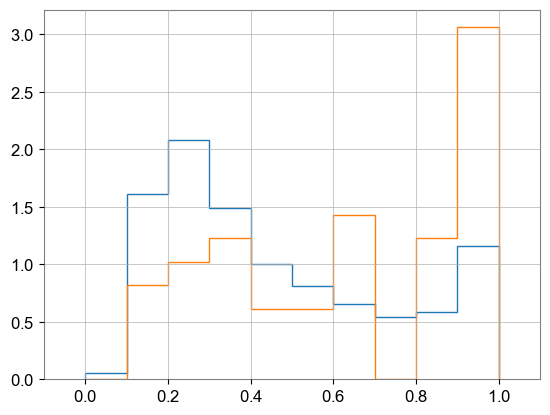

In [360]:
plt.hist(isoscore_test_noise, density = True, histtype='step', bins = np.arange(0,1.1,0.1))
plt.hist(isoscore_sg, density = True, histtype='step', bins = np.arange(0,1.1,0.1))
plt.xlim(-0.1,1.1)

(-0.1, 1.1)

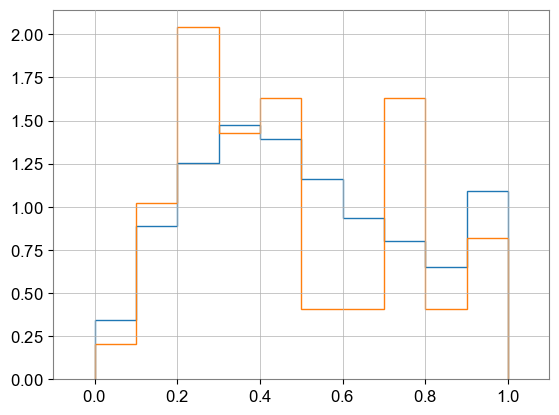

In [361]:
plt.hist(cluscore_test_noise, density = True, histtype='step', bins = np.arange(0,1.1,0.1))
plt.hist(cluscore_sg, density = True, histtype='step', bins = np.arange(0,1.1,0.1))
plt.xlim(-0.1,1.1)

Text(0, 0.5, 'cluscore')

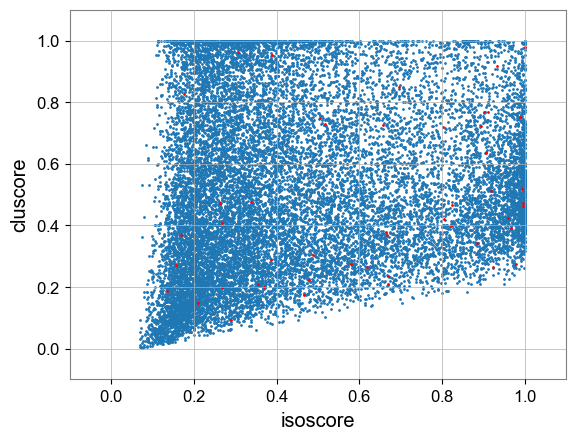

In [362]:
plt.scatter(isoscore_test_noise, cluscore_test_noise,s = 1)
plt.scatter(isoscore_sg, cluscore_sg,s = 1, color = 'r')

plt.xlim(-0.1,1.1)
plt.ylim(-0.1,1.1)
plt.xlabel('isoscore')
plt.ylabel('cluscore')

In [363]:
Geometric_mean_test_isoclu = np.sqrt(isoscore_test_noise * cluscore_test_noise)
Geometric_mean_sg_isoclu = np.sqrt(isoscore_sg * cluscore_sg)

(array([0.        , 0.6122449 , 1.2244898 , 1.83673469,
        0.81632653, 1.2244898 , 2.04081633, 1.02040816,
        0.81632653, 0.40816327]),
 array([0. , 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1. ]),
 [<matplotlib.patches.Polygon at 0x15f0c9f0650>])

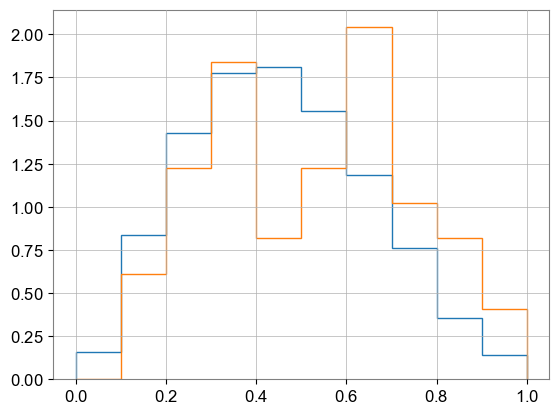

In [367]:
plt.hist(Geometric_mean_test_isoclu, density = True, histtype='step', bins = np.arange(0,1.1,0.1))
plt.hist(Geometric_mean_sg_isoclu, density = True, histtype='step', bins = np.arange(0,1.1,0.1))

In [368]:
bins = 10

isocut_scheme = np.arange(0, 1.0001, 1/bins)
xi = np.zeros(bins)

ratio = len(training_noise_sample_SVMed) / (len(full_test_noise_sample))

total_number_test_noise = 0
total_number_train = 0
total_number_sg = 0

for i in range(bins):
    count_test_noise = np.count_nonzero(np.logical_and(isoscore_test_noise >= isocut_scheme[i],isoscore_test_noise <= isocut_scheme[i+1]))
    count_sg = np.count_nonzero(np.logical_and(isoscore_sg >= isocut_scheme[i],isoscore_sg <= isocut_scheme[i+1]))
    count_train = np.count_nonzero(np.logical_and(isoscore_train_noise >= isocut_scheme[i], isoscore_train_noise <=  isocut_scheme[i+1]))
    
    total_number_test_noise += count_test_noise
    total_number_train += count_train
    total_number_sg += count_sg
    
    print(count_test_noise, count_sg, count_train)
    
    
    xi[i] = (count_test_noise + count_sg - (count_train/ratio)) / np.sqrt(count_train/ratio)
    # xi[i] = (count_test_noise + count_sg - (count_train)) / np.sqrt(count_train)

99 0 390
2878 4 9876
3719 5 13095
2671 6 9476
1799 3 6308
1452 3 5014
1177 7 4342
973 0 3569
1053 6 3632
2077 15 7138


In [366]:
xi

array([-1.17335158,  1.15669111, -0.2601648 , -0.56379402,
        0.0104993 ,  0.60805755, -1.59218094, -1.45022204,
        0.67397729,  1.18267963])

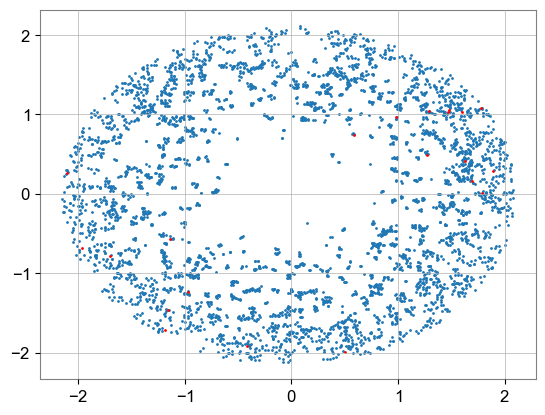

In [372]:
# plt.scatter(X_train[:, 0], X_train[:, 1],s = 1)
plt.scatter(X_test[indices_test_noise_bkg][np.argwhere(Geometric_mean_test_isoclu>0.6).flatten()][:, 0], X_test[indices_test_noise_bkg][np.argwhere(Geometric_mean_test_isoclu>0.6).flatten()][:, 1],s = 1)
plt.scatter(X_sg[indices_sg_bkg][np.argwhere(Geometric_mean_sg_isoclu>0.6).flatten()][:, 0], X_sg[indices_sg_bkg][np.argwhere(Geometric_mean_sg_isoclu>0.6).flatten()][:, 1],s = 1,color = 'r')

### Now we do a Yingying style weakly supervised learning

In [ ]:
np.sort(np.linalg.norm(Feature_space_noise_train[0] - Feature_space_noise_train, axis = 1))[:10]

array([0.00000000e+00, 1.56137975e-06, 2.13784052e-06,
       3.10853797e-06, 5.82822504e-06, 6.88329546e-06,
       6.95985133e-06, 7.00695272e-06, 7.19555710e-06,
       7.33863274e-06])

In [ ]:
def mean_distance_k(center_point_sample, reference_sample, k, exclude_self = False):
    mdk = np.zeros(len(center_point_sample))
    
    if exclude_self:
        bias = 1
    else:
        bias = 0
    
    for i in range(len(mdk)):
        mdk[i] = np.mean(np.sort(np.linalg.norm(center_point_sample[i] - reference_sample, axis=1))[bias:bias+k])
    return mdk

In [ ]:
mean_distance_k(Feature_space_noise_train[:2], Feature_space_noise_train, 1, exclude_self=False)

array([0., 0.])

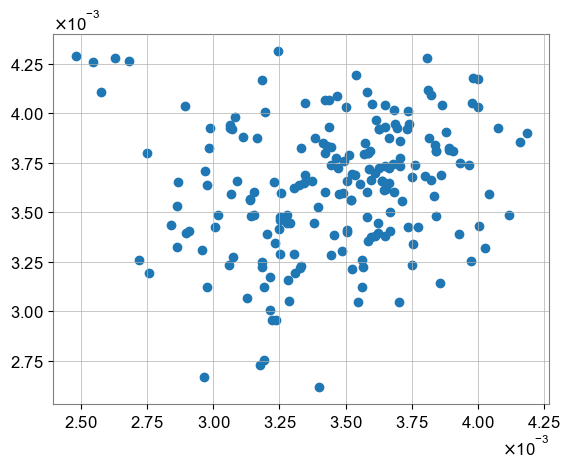

In [ ]:
plt.scatter(Feature_space_bbh[:200][:,0],Feature_space_bbh[:200][:,1])

In [ ]:
full_test_noise_sample = np.vstack((Feature_space_noise_test, Feature_space_bbh[:200]))

In [ ]:
full_test_noise_sample.shape

(19928, 2)

In [ ]:
k_for_iso = 175
k_for_clu = 50

In [ ]:
dtrainprime = np.mean(mean_distance_k(X_train, X_train, k_for_iso, exclude_self=True))

KeyboardInterrupt: 

In [ ]:
dtrainprime

2.833723581277744e-05

In [ ]:
Delta_iso_test_noise = (mean_distance_k(full_test_noise_sample[:20000],Feature_space_noise_train,  k_for_iso) - dtrainprime) / np.sqrt(dtrainprime)
Delta_clu_test_noise = (mean_distance_k(full_test_noise_sample[:20000],full_test_noise_sample, k_for_clu, exclude_self=True)**(-2) - mean_distance_k(full_test_noise_sample[:20000],Feature_space_noise_train,k_for_iso)**(-2)) / mean_distance_k(full_test_noise_sample[:20000],Feature_space_noise_train,k_for_iso)**(-1)
Delta_iso_bbh = (mean_distance_k(full_test_noise_sample[20000:],Feature_space_noise_train, k_for_iso) - dtrainprime) / np.sqrt(dtrainprime)
Delta_clu_bbh = (mean_distance_k(full_test_noise_sample[20000:],full_test_noise_sample, k_for_clu, exclude_self=True)**(-2) - mean_distance_k(full_test_noise_sample[20000:],Feature_space_noise_train,k_for_iso)**(-2)) / mean_distance_k(full_test_noise_sample[20000:],Feature_space_noise_train,k_for_iso)**(-1)

In [ ]:
Delta_iso_test_noise.shape

(20000,)

In [ ]:
Delta_clu_bbh.shape

(200,)

In [ ]:
isoscore_test_noise = (1+sp.erf(Delta_iso_test_noise / (np.sqrt(2) * np.sqrt(np.mean(np.square(Delta_iso_test_noise))))))/2

In [ ]:
np.sqrt(np.mean(np.square(Delta_iso_bbh)))

0.06960952857640819

In [ ]:
np.sqrt(np.mean(np.square(Delta_iso_test_noise)[:-1]))

0.18461598030265328

In [ ]:
np.sqrt(np.mean(np.hstack((np.square(Delta_iso_test_noise),np.square(Delta_iso_bbh)))))

0.008500390372100281

In [ ]:
np.sqrt(np.mean(np.hstack((np.square(Delta_iso_test_noise),np.square(Delta_iso_bbh))))) - np.sqrt(np.mean(np.square(Delta_iso_test_noise)))

0.0035481849889827544

(array([0.    , 0.    , 1.7135, 3.8005, 1.6425, 0.866 , 0.5875,
        0.393 , 0.3355, 0.6615]),
 array([0. , 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1. ]),
 [<matplotlib.patches.Polygon at 0x20921929c10>])

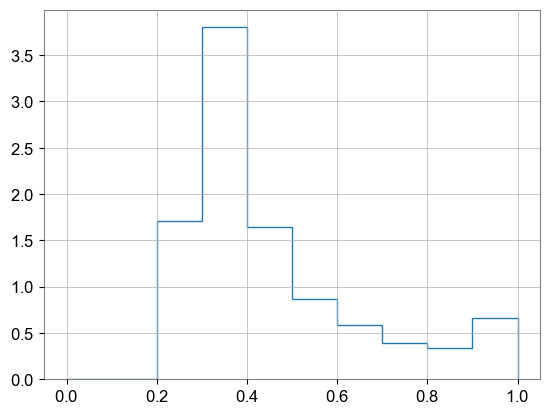

In [ ]:
plt.hist(isoscore_test_noise, density = True, bins = np.arange(0,1.1,0.1), histtype='step')

In [ ]:
isoscore_test_noise = (1+sp.erf(Delta_iso_test_noise / (np.sqrt(2) * np.sqrt(np.mean(np.hstack((np.square(Delta_iso_test_noise),np.square(Delta_iso_bbh))))))))/2
cluscore_test_noise = (1+sp.erf(Delta_clu_test_noise / (np.sqrt(np.mean(np.hstack((np.square(Delta_clu_test_noise),np.square(Delta_clu_bbh))))) * np.sqrt(2))))/2

In [ ]:
isoscore_bbh = (1+sp.erf(Delta_iso_bbh / (np.sqrt(2) * np.sqrt(np.mean(np.hstack((np.square(Delta_iso_test_noise),np.square(Delta_iso_bbh))))))))/2
cluscore_bbh = (1+sp.erf(Delta_clu_bbh / (np.sqrt(np.mean(np.hstack((np.square(Delta_clu_test_noise),np.square(Delta_clu_bbh))))) * np.sqrt(2))))/2

In [ ]:
Delta_iso_train_noise = (mean_distance_k(Feature_space_noise_train,Feature_space_noise_train, k_for_iso, exclude_self=True) - dtrainprime) / np.sqrt(dtrainprime)
isoscore_train_noise = (1 + sp.erf(Delta_iso_train_noise / (np.sqrt(2) * np.sqrt(np.mean(np.square(Delta_iso_train_noise))))))/2

In [ ]:
Delta_clu_train_noise = (mean_distance_k(Feature_space_noise_train,full_test_noise_sample, k_for_clu)**(-2) - mean_distance_k(Feature_space_noise_train,Feature_space_noise_train,k_for_iso, exclude_self=True)**(-2)) / mean_distance_k(Feature_space_noise_train,Feature_space_noise_train,k_for_iso,exclude_self=True)**(-1)
cluscore_train_noise = (1 + sp.erf(Delta_clu_train_noise / (np.sqrt(np.mean(np.square(Delta_clu_train_noise))) * np.sqrt(2))))/2

(-0.1, 1.1)

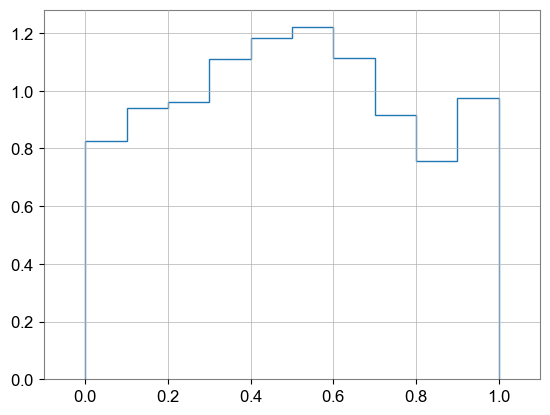

In [ ]:
plt.hist(cluscore_train_noise, density = True, histtype='step', bins = np.arange(0,1.1,0.1))
plt.xlim(-0.1, 1.1)

In [ ]:
Delta_clu_train_noise = (mean_distance_k(Feature_space_noise_train,Feature_space_noise_train, k_for_iso, exclude_self=True)**(-2) - mean_distance_k(Feature_space_noise_train,Feature_space_noise_train,k_for_iso-1)**(-2)) / mean_distance_k(Feature_space_noise_train,Feature_space_noise_train,k_for_iso-1)**(-1)
cluscore_train_noise = (1 + sp.erf(Delta_clu_train_noise / (np.sqrt(np.mean(np.square(Delta_clu_train_noise))) * np.sqrt(2))))/2

In [ ]:
np.array([1,2,3,4,5]) / np.array([2,4,6,8,10])

array([0.5, 0.5, 0.5, 0.5, 0.5])

(-0.1, 1.1)

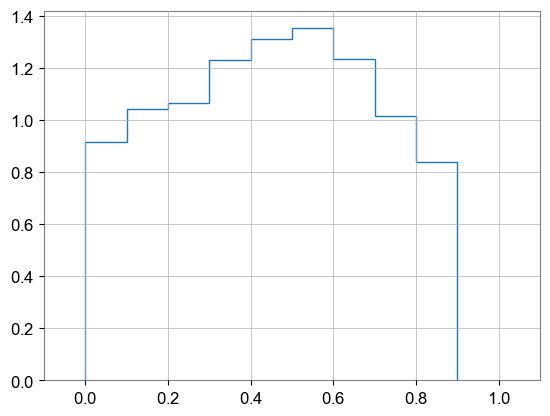

In [ ]:
plt.hist(cluscore_train_noise, density = True, histtype='step', bins = np.arange(0,1,0.1))
plt.xlim(-0.1, 1.1)

In [ ]:
mean_distance_k(Feature_space_noise_train[:2],Feature_space_noise_train, 2)

array([7.80689874e-07, 3.97675142e-06])

In [ ]:
isoscore_test_noise

array([0.54560891, 0.35507065, 0.39090126, ..., 0.42831345,
       0.75127777, 0.33686755])

Text(0, 0.5, 'cluscore')

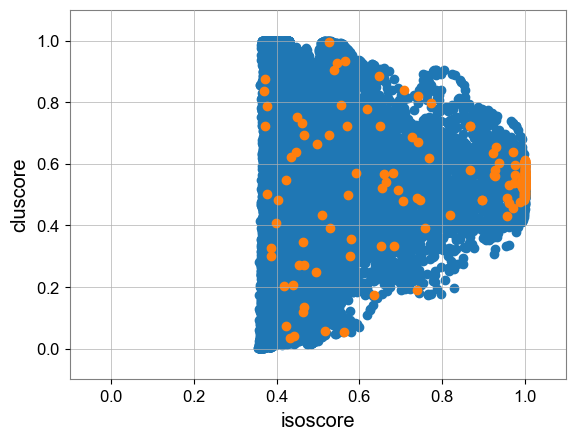

In [ ]:
plt.scatter(isoscore_test_noise, cluscore_test_noise)
plt.scatter(isoscore_bbh, cluscore_bbh)

plt.xlim(-0.1,1.1)
plt.ylim(-0.1,1.1)
plt.xlabel('isoscore')
plt.ylabel('cluscore')

Text(0, 0.5, 'cluscore')

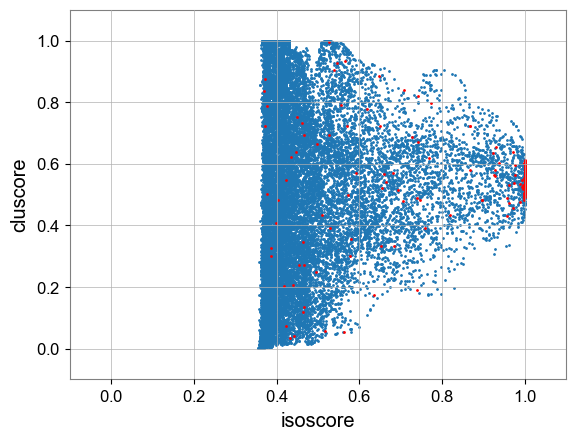

In [ ]:
plt.scatter(isoscore_test_noise, cluscore_test_noise,s = 1)
plt.scatter(isoscore_bbh, cluscore_bbh,s = 1, color = 'r')

plt.xlim(-0.1,1.1)
plt.ylim(-0.1,1.1)
plt.xlabel('isoscore')
plt.ylabel('cluscore')

Text(0, 0.5, 'cluscore')

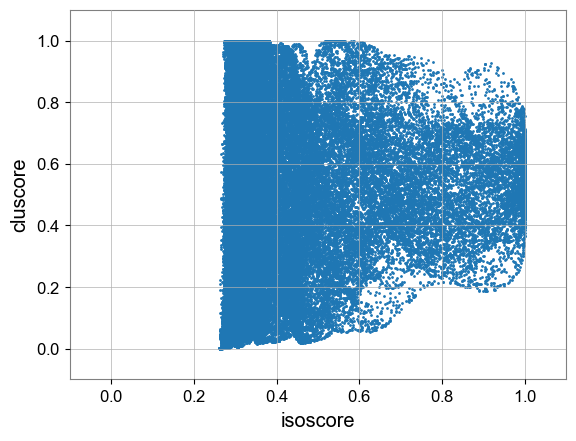

In [ ]:
plt.scatter(isoscore_train_noise, cluscore_train_noise,s = 1)
# plt.scatter(isoscore_bbh, cluscore_bbh)

plt.xlim(-0.1,1.1)
plt.ylim(-0.1,1.1)
plt.xlabel('isoscore')
plt.ylabel('cluscore')

Text(0, 0.5, 'cluscore')

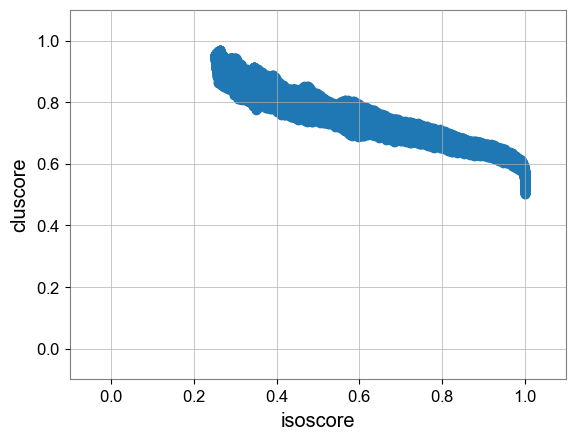

In [ ]:
plt.scatter(isoscore_train_noise, cluscore_train_noise)
# plt.scatter(isoscore_bbh, cluscore_bbh)

plt.xlim(-0.1,1.1)
plt.ylim(-0.1,1.1)
plt.xlabel('isoscore')
plt.ylabel('cluscore')

(-0.1, 1.1)

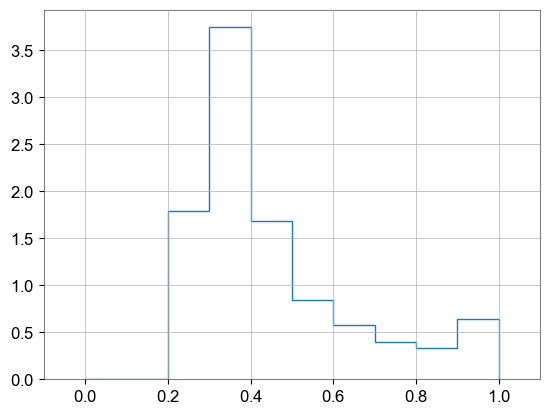

In [ ]:
plt.hist(isoscore_train_noise, density = True, histtype='step', bins = np.arange(0,1.1,0.1))
plt.xlim(-0.1, 1.1)

(array([4.85731407, 2.69051302, 1.6091165 , 0.97470738,
        0.68269597, 0.54699655, 0.4238937 , 0.37274398,
        0.35155884, 0.85045939]),
 array([0.25149697, 0.32634728, 0.40119758, 0.47604788,
        0.55089818, 0.62574849, 0.70059879, 0.77544909,
        0.85029939, 0.9251497 , 1.        ]),
 [<matplotlib.patches.Polygon at 0x1b2b13fc790>])

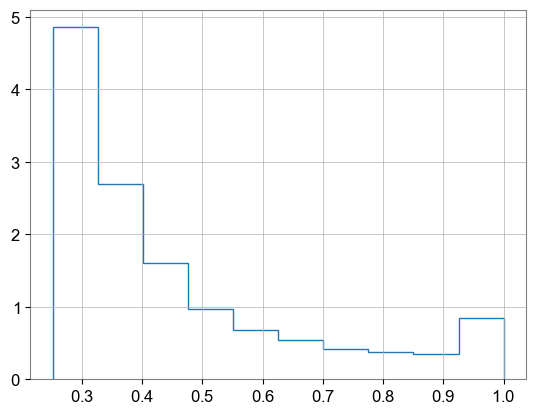

In [ ]:
plt.hist(isoscore_train_noise, density = True, histtype='step')

(array([1.73615906, 5.73408619, 4.50642039, 3.40790067,
        2.13417796, 1.66396173, 1.21832994, 0.72135091,
        0.46430352, 0.19698668]),
 array([0.03824868, 0.08415461, 0.13006055, 0.17596648,
        0.22187241, 0.26777834, 0.31368427, 0.35959021,
        0.40549614, 0.45140207, 0.497308  ]),
 [<matplotlib.patches.Polygon at 0x20925cb7490>])

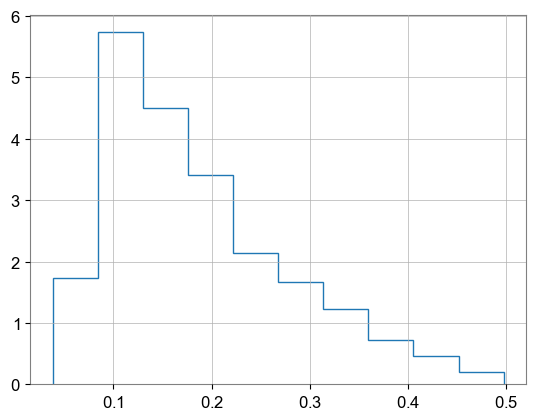

In [ ]:
plt.hist(cluscore_train_noise, density = True, histtype='step')

(array([0.2352761 , 0.48340212, 0.73672931, 1.23726468,
        1.73412863, 2.15817632, 3.54352114, 4.63239973,
        5.481107  , 1.17454478]),
 array([0.50200581, 0.54869867, 0.59539154, 0.6420844 ,
        0.68877726, 0.73547012, 0.78216298, 0.82885585,
        0.87554871, 0.92224157, 0.96893443]),
 [<matplotlib.patches.Polygon at 0x1b2b149a1d0>])

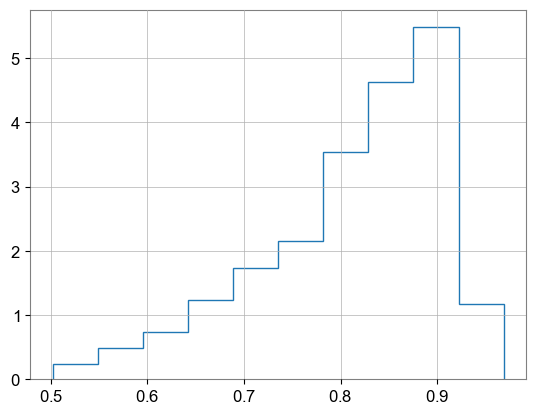

In [ ]:
plt.hist(cluscore_train_noise, density = True, histtype='step')

(-0.1, 1.1)

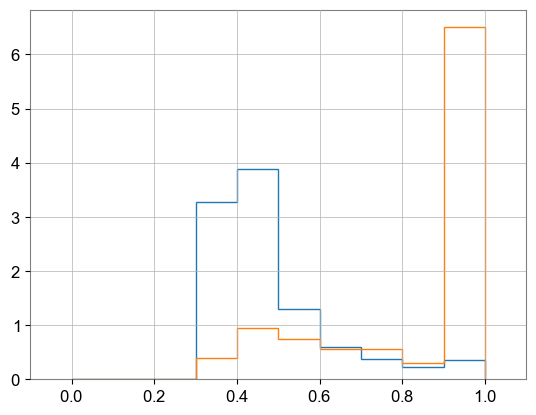

In [ ]:
plt.hist(isoscore_test_noise, density = True, histtype='step', bins = np.arange(0,1.1,0.1))
plt.hist(isoscore_bbh, density = True, histtype='step', bins = np.arange(0,1.1,0.1))
plt.xlim(-0.1,1.1)

(array([4.33307419, 1.93605442, 1.38289602, 1.19850988,
        1.93605442, 1.29070295, 1.10631681, 1.01412375,
        2.02824749, 2.21263363]),
 array([0.45567515, 0.50990917, 0.56414318, 0.61837719,
        0.6726112 , 0.72684522, 0.78107923, 0.83531324,
        0.88954725, 0.94378127, 0.99801528]),
 [<matplotlib.patches.Polygon at 0x1b2ad422bd0>])

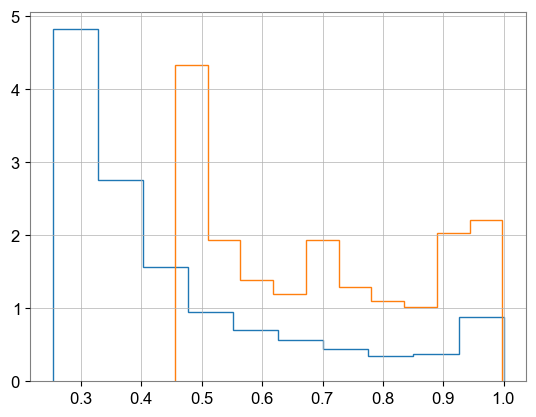

In [ ]:
plt.hist(isoscore_test_noise, density = True, histtype='step')
plt.hist(isoscore_bbh, density = True, histtype='step')

(-0.1, 1.1)

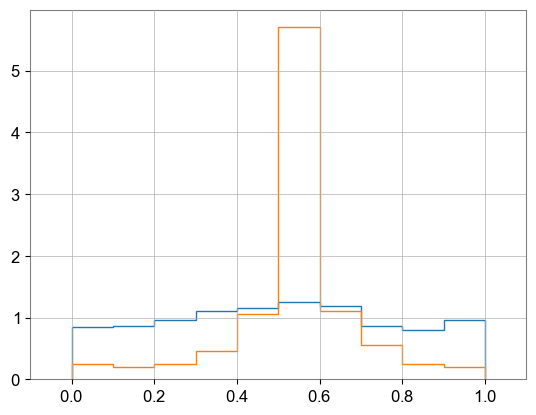

In [ ]:
plt.hist(cluscore_test_noise, density = True, histtype='step', bins = np.arange(0,1.1,0.1))
plt.hist(cluscore_bbh, density = True, histtype='step', bins = np.arange(0,1.1,0.1))
plt.xlim(-0.1,1.1)

(array([0.1440479 , 0.07202395, 0.1440479 , 1.58452694,
        2.0886946 , 1.80059879, 2.3767904 , 2.73691016,
        1.58452694, 1.87262274]),
 array([0.30548293, 0.37490428, 0.44432563, 0.51374698,
        0.58316833, 0.65258968, 0.72201103, 0.79143238,
        0.86085373, 0.93027508, 0.99969644]),
 [<matplotlib.patches.Polygon at 0x1b2acb4e910>])

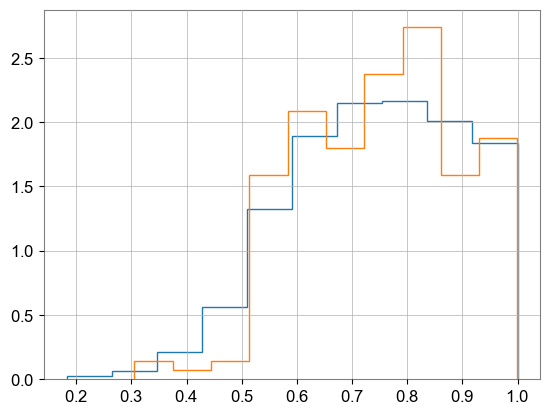

In [ ]:
plt.hist(cluscore_test_noise, density = True, histtype='step')
plt.hist(cluscore_bbh, density = True, histtype='step')

In [ ]:
bins = 10

isocut_scheme = np.arange(0, 1.0001, 1/bins)
xi = np.zeros(bins)

ratio = 7e4/(2e4+2e2)

total_number_test_noise = 0
total_number_train = 0
total_number_bbh = 0

for i in range(bins):
    count_test_noise = np.count_nonzero(np.logical_and(isoscore_test_noise >= isocut_scheme[i],isoscore_test_noise <= isocut_scheme[i+1]))
    count_bbh = np.count_nonzero(np.logical_and(isoscore_bbh >= isocut_scheme[i],isoscore_bbh <= isocut_scheme[i+1]))
    count_train = np.count_nonzero(np.logical_and(isoscore_train_noise >= isocut_scheme[i], isoscore_train_noise <=  isocut_scheme[i+1]))
    
    total_number_test_noise += count_test_noise
    total_number_train += count_train
    total_number_bbh += count_bbh
    
    print(count_test_noise, count_bbh, count_train)
    
    
    xi[i] = (count_test_noise + count_bbh - (count_train/ratio)) / np.sqrt(count_train/ratio)

0 0 0
0 0 0
0 0 12530
6547 8 26166
7766 19 11759
2593 15 5882
1199 11 4047
739 11 2773
456 6 2348
700 130 4495


C:\Users\Liyang Miao\AppData\Local\Temp\ipykernel_28560\3106673097.py:24: RuntimeWarning: invalid value encountered in scalar divide
  xi[i] = (count_test_noise + count_bbh - (count_train/ratio)) / np.sqrt(count_train/ratio)


In [ ]:
xi

array([         nan,          nan, -60.13152252, -11.45933309,
        75.39102978,  22.10290578,   1.23344285,  -1.77490971,
        -8.28140409, -12.9701476 ])

In [ ]:
xi

array([          nan,           nan, -116.63618649,
       -118.44519705,  -35.71575479,  -41.87493292,
        -44.00039028,  -38.01699582,  -38.4749278 ,
        -54.44369873])

In [ ]:
isoscore_test_noise_prime = 1-(isoscore_test_noise - 0.4) % 1
isoscore_bbh_prime = 1-(isoscore_bbh - 0.4) % 1

Text(0, 0.5, 'cluscore')

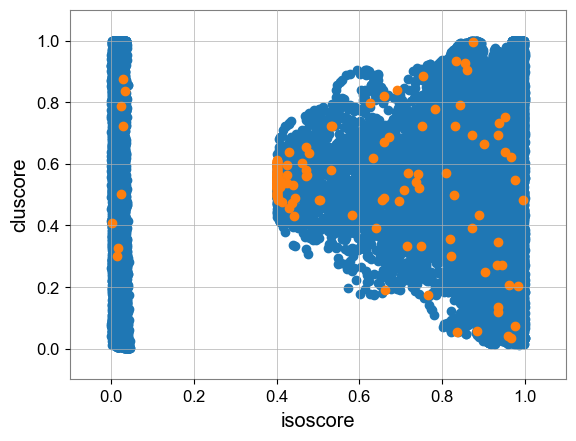

In [ ]:
plt.scatter(isoscore_test_noise_prime, cluscore_test_noise)
plt.scatter(isoscore_bbh_prime, cluscore_bbh)

plt.xlim(-0.1,1.1)
plt.ylim(-0.1,1.1)
plt.xlabel('isoscore')
plt.ylabel('cluscore')

Text(0, 0.5, 'cluscore')

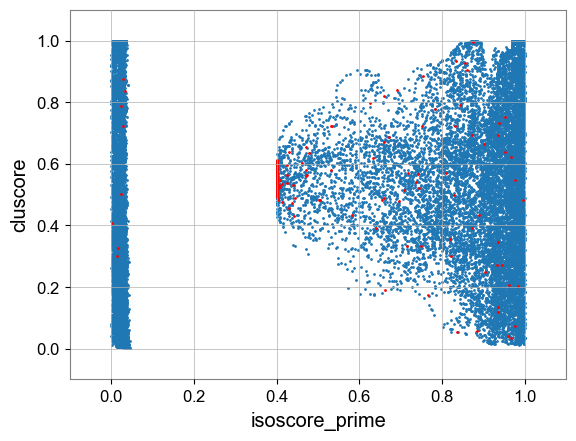

In [ ]:
plt.scatter(isoscore_test_noise_prime, cluscore_test_noise, s = 1)
plt.scatter(isoscore_bbh_prime, cluscore_bbh, s = 1,color = 'r')

plt.xlim(-0.1,1.1)
plt.ylim(-0.1,1.1)
plt.xlabel('isoscore_prime')
plt.ylabel('cluscore')

In [ ]:
Geometric_mean_test_isoclu = np.sqrt(isoscore_test_noise * cluscore_test_noise)
Geometric_mean_bbh_isoclu = np.sqrt(isoscore_bbh * cluscore_bbh)

(array([0.37300247, 0.14920099, 0.14920099, 0.52220346,
        0.52220346, 0.44760297, 0.96980643, 0.89520593,
        3.20782126, 7.68385092]),
 array([0.12196209, 0.18898578, 0.25600946, 0.32303315,
        0.39005683, 0.45708052, 0.5241042 , 0.59112788,
        0.65815157, 0.72517525, 0.79219894]),
 [<matplotlib.patches.Polygon at 0x2092608fb50>])

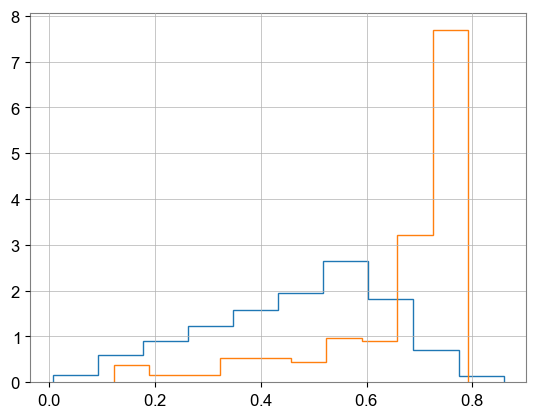

In [ ]:
plt.hist(Geometric_mean_test_isoclu, density = True, histtype='step')
plt.hist(Geometric_mean_bbh_isoclu, density = True, histtype='step')

(array([0.34872176, 0.        , 0.23248117, 0.11624059,
        0.92992469, 2.55729291, 5.69578875, 4.53338288,
        4.88210464, 3.95217995]),
 array([0.39461242, 0.43762666, 0.4806409 , 0.52365513,
        0.56666937, 0.6096836 , 0.65269784, 0.69571207,
        0.73872631, 0.78174055, 0.82475478]),
 [<matplotlib.patches.Polygon at 0x1b2afd7abd0>])

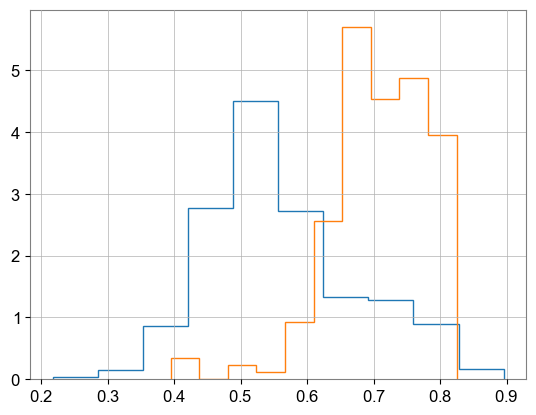

In [ ]:
plt.hist(Geometric_mean_test_isoclu, density = True, histtype='step')
plt.hist(Geometric_mean_bbh_isoclu, density = True, histtype='step')

In [ ]:
np.count_nonzero(Geometric_mean_bbh_isoclu > 0.7)

140

In [ ]:
np.count_nonzero(Geometric_mean_test_isoclu > 0.7)

1412

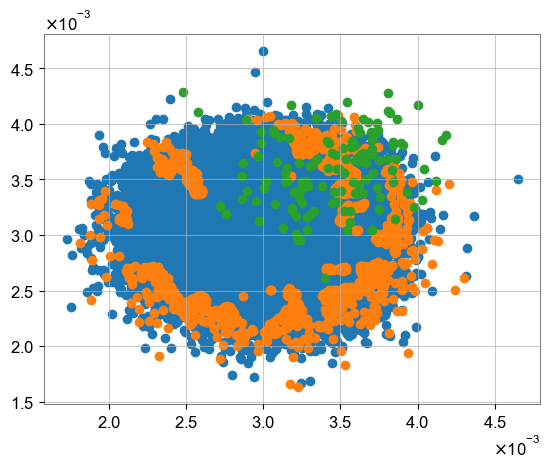

In [ ]:
plt.scatter(x = Feature_space_noise_train[:,0],y = Feature_space_noise_train[:,1])
plt.scatter(x = Feature_space_noise_test[np.argwhere(Geometric_mean_test_isoclu > 0.7).flatten()][:,0],y = Feature_space_noise_test[np.argwhere(Geometric_mean_test_isoclu > 0.7).flatten()][:,1])
plt.scatter(x = Feature_space_bbh[np.argwhere(Geometric_mean_bbh_isoclu > 0.7).flatten()][:,0],y = Feature_space_bbh[np.argwhere(Geometric_mean_bbh_isoclu > 0.7).flatten()][:,1])
# plt.scatter(x = Feature_space_sg[:,0],y = Feature_space_sg[:,1])

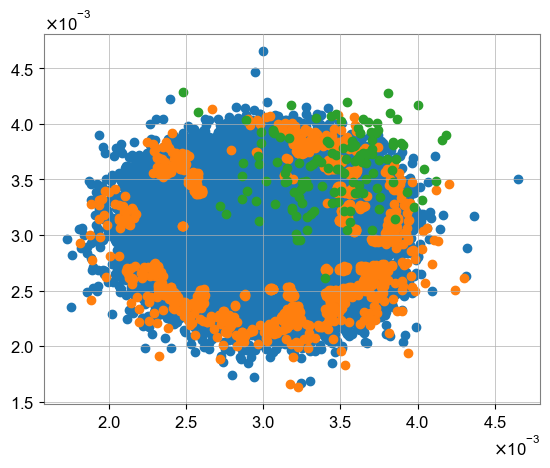

In [ ]:
plt.scatter(x = Feature_space_noise_train[:,0],y = Feature_space_noise_train[:,1])
plt.scatter(x = Feature_space_noise_test[np.argwhere(Geometric_mean_test_isoclu > 0.7).flatten()][:,0],y = Feature_space_noise_test[np.argwhere(Geometric_mean_test_isoclu > 0.7).flatten()][:,1])
plt.scatter(x = Feature_space_bbh[np.argwhere(Geometric_mean_bbh_isoclu > 0.7).flatten()][:,0],y = Feature_space_bbh[np.argwhere(Geometric_mean_bbh_isoclu > 0.7).flatten()][:,1])
# plt.scatter(x = Feature_space_sg[:,0],y = Feature_space_sg[:,1])

In [ ]:
Geometric_mean_test_isoprimeclu = np.sqrt(isoscore_test_noise_prime * cluscore_test_noise)
Geometric_mean_bbh_isoprimeclu = np.sqrt(isoscore_bbh_prime * cluscore_bbh)

(array([0.22026743, 0.33040114, 0.16520057, 0.22026743,
        5.39655203, 2.69827602, 0.66080229, 0.44053486,
        0.60573543, 0.27533429]),
 array([0.02494052, 0.11573923, 0.20653795, 0.29733667,
        0.38813538, 0.4789341 , 0.56973282, 0.66053154,
        0.75133025, 0.84212897, 0.93292769]),
 [<matplotlib.patches.Polygon at 0x20928f78950>])

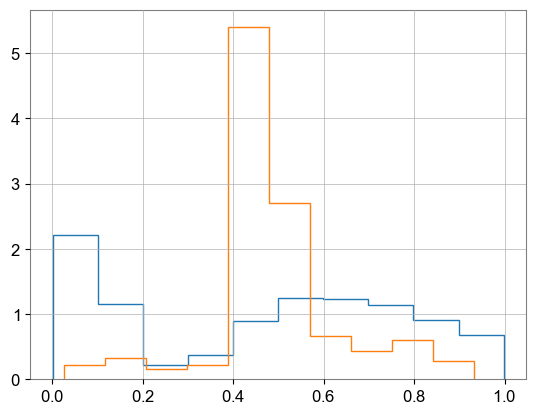

In [ ]:
plt.hist(Geometric_mean_test_isoprimeclu, density = True, histtype='step')
plt.hist(Geometric_mean_bbh_isoprimeclu, density = True, histtype='step')

In [ ]:
np.count_nonzero(Geometric_mean_bbh_isoprimeclu > 0.7)

68

In [ ]:
np.count_nonzero(Geometric_mean_test_isoprimeclu > 0.7)

1775

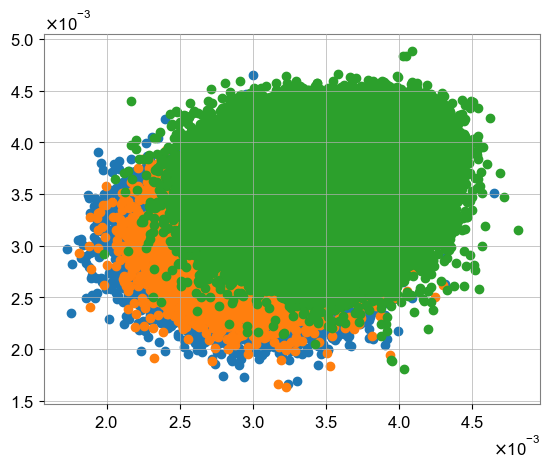

In [ ]:
plt.scatter(x = Feature_space_noise_train[:,0],y = Feature_space_noise_train[:,1])
plt.scatter(x = Feature_space_noise_test[:,0],y = Feature_space_noise_test[:,1])
plt.scatter(x = Feature_space_bbh[:,0],y = Feature_space_bbh[:,1])
# plt.scatter(x = Feature_space_sg[:,0],y = Feature_space_sg[:,1])

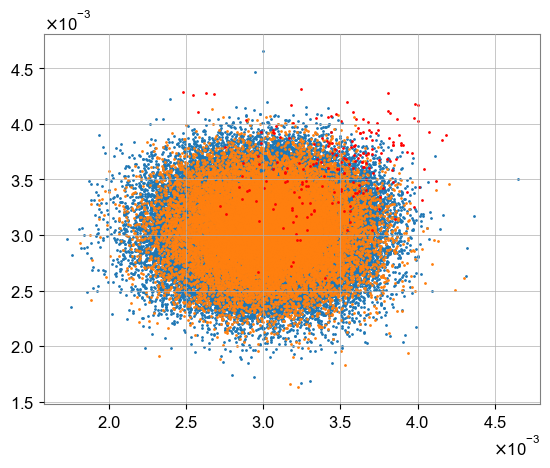

In [ ]:
plt.scatter(x = Feature_space_noise_train[:,0],y = Feature_space_noise_train[:,1],s = 1)
plt.scatter(x = Feature_space_noise_test[:,0],y = Feature_space_noise_test[:,1],s = 1)
plt.scatter(x = Feature_space_bbh[:200][:,0],y = Feature_space_bbh[:200][:,1],s = 1)
# plt.scatter(x = Feature_space_sg[:,0],y = Feature_space_sg[:,1])

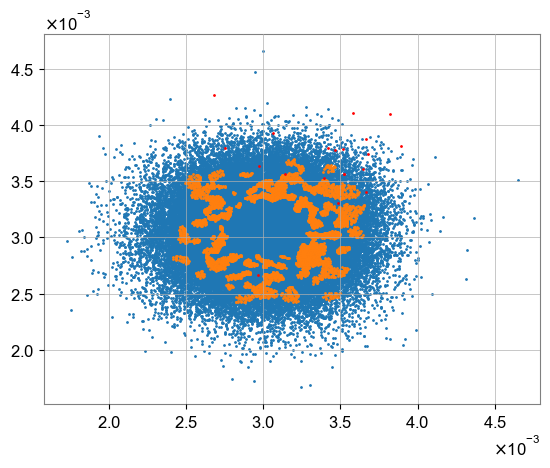

In [ ]:
plt.scatter(x = Feature_space_noise_train[:,0],y = Feature_space_noise_train[:,1],s = 1)
plt.scatter(x = Feature_space_noise_test[np.argwhere(Geometric_mean_test_isoprimeclu > 0.7).flatten()][:,0],y = Feature_space_noise_test[np.argwhere(Geometric_mean_test_isoprimeclu > 0.7).flatten()][:,1],s = 1)
plt.scatter(x = Feature_space_bbh[np.argwhere(Geometric_mean_bbh_isoprimeclu > 0.7).flatten()][:,0],y = Feature_space_bbh[np.argwhere(Geometric_mean_bbh_isoprimeclu > 0.7).flatten()][:,1],s = 1, color = 'r')
# plt.scatter(x = Feature_space_sg[:,0],y = Feature_space_sg[:,1])

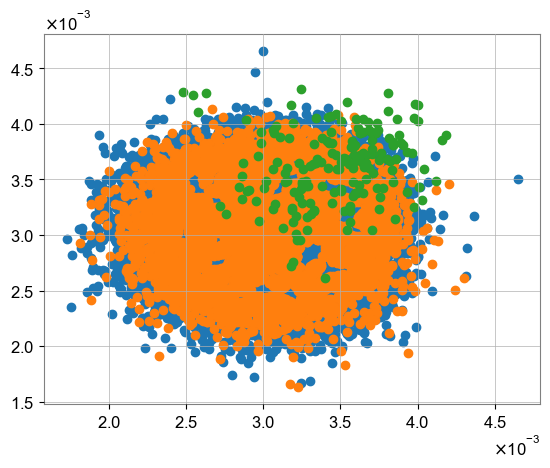

In [ ]:
plt.scatter(x = Feature_space_noise_train[:,0],y = Feature_space_noise_train[:,1])
plt.scatter(x = Feature_space_noise_test[np.setdiff1d(np.arange(20000),np.argwhere(Geometric_mean_test_isoprimeclu > 0.7)).flatten()][:,0],y = Feature_space_noise_test[np.setdiff1d(np.arange(20000),np.argwhere(Geometric_mean_test_isoprimeclu > 0.7)).flatten()][:,1])
plt.scatter(x = Feature_space_bbh[np.setdiff1d(np.arange(200),np.argwhere(Geometric_mean_bbh_isoprimeclu > 0.7)).flatten()][:,0],y = Feature_space_bbh[np.setdiff1d(np.arange(200),np.argwhere(Geometric_mean_bbh_isoprimeclu > 0.7)).flatten()][:,1])
# plt.scatter(x = Feature_space_sg[:,0],y = Feature_space_sg[:,1])

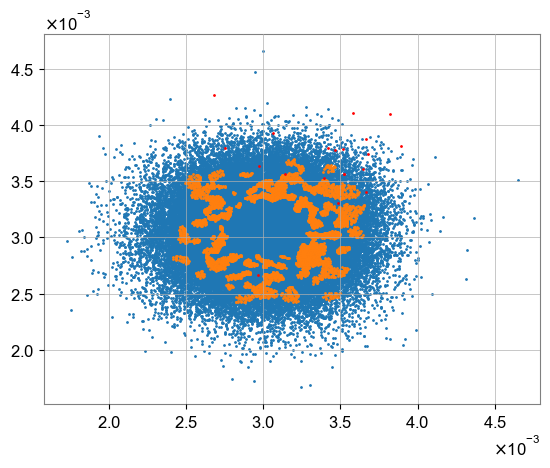

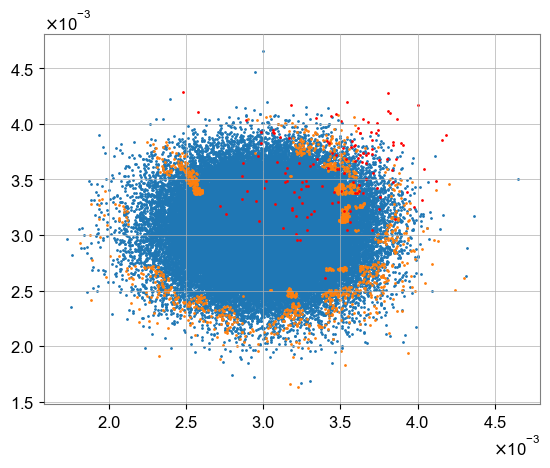

In [ ]:
plt.scatter(x = Feature_space_noise_train[:,0],y = Feature_space_noise_train[:,1],s = 1)
plt.scatter(x = Feature_space_noise_test[np.argwhere(Geometric_mean_test_isoprimeclu > 0.7).flatten()][:,0],y = Feature_space_noise_test[np.argwhere(Geometric_mean_test_isoprimeclu > 0.7).flatten()][:,1],s = 1)
plt.scatter(x = Feature_space_bbh[np.argwhere(Geometric_mean_bbh_isoprimeclu > 0.7).flatten()][:,0],y = Feature_space_bbh[np.argwhere(Geometric_mean_bbh_isoprimeclu > 0.7).flatten()][:,1],s = 1,color = 'r')
# plt.scatter(x = Feature_space_sg[:,0],y = Feature_space_sg[:,1])
plt.show()

plt.scatter(x = Feature_space_noise_train[:,0],y = Feature_space_noise_train[:,1],s = 1)
plt.scatter(x = Feature_space_noise_test[np.argwhere(Geometric_mean_test_isoclu > 0.7).flatten()][:,0],y = Feature_space_noise_test[np.argwhere(Geometric_mean_test_isoclu > 0.7).flatten()][:,1],s = 1)
plt.scatter(x = Feature_space_bbh[np.argwhere(Geometric_mean_bbh_isoclu > 0.7).flatten()][:,0],y = Feature_space_bbh[np.argwhere(Geometric_mean_bbh_isoclu > 0.7).flatten()][:,1],s = 1,color = 'r')
# plt.scatter(x = Feature_space_sg[:,0],y = Feature_space_sg[:,1])
plt.show()

In [ ]:
full_test_noise_sample = np.vstack((Feature_space_noise_test, Feature_space_sg[:200]))
dtrainprime = np.mean(mean_distance_k(Feature_space_noise_train, Feature_space_noise_train, 800))

Delta_iso_test_noise = (mean_distance_k(full_test_noise_sample[:20000],Feature_space_noise_train,800) - dtrainprime) / np.sqrt(dtrainprime)
Delta_clu_test_noise = (mean_distance_k(full_test_noise_sample[:20000],full_test_noise_sample, 200)**(-2) - mean_distance_k(full_test_noise_sample[:20000],Feature_space_noise_train,800)**(-2)) / mean_distance_k(full_test_noise_sample[:20000],Feature_space_noise_train,800)**(-1)
Delta_iso_sg = (mean_distance_k(full_test_noise_sample[20000:],Feature_space_noise_train,800) - dtrainprime) / np.sqrt(dtrainprime)
Delta_clu_sg = (mean_distance_k(full_test_noise_sample[20000:],full_test_noise_sample, 200)**(-2) - mean_distance_k(full_test_noise_sample[20000:],Feature_space_noise_train,800)**(-2)) / mean_distance_k(full_test_noise_sample[20000:],Feature_space_noise_train,800)**(-1)

isoscore_test_noise = (1+sp.erf(Delta_iso_test_noise / (np.sqrt(2) * np.sqrt(np.mean(np.square(Delta_iso_test_noise))))))/2
cluscore_test_noise = (1+sp.erf(Delta_clu_test_noise / (np.sqrt(np.mean(np.square(Delta_clu_test_noise))) * np.sqrt(2))))/2
isoscore_sg = (1+sp.erf(Delta_iso_sg / (np.sqrt(2) * np.sqrt(np.mean(np.square(Delta_iso_sg))))))/2
cluscore_sg = (1+sp.erf(Delta_clu_sg / (np.sqrt(np.mean(np.square(Delta_clu_sg))) * np.sqrt(2))))/2

Text(0, 0.5, 'cluscore')

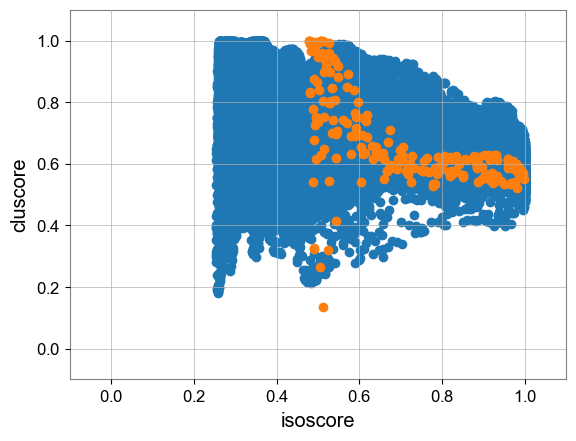

In [ ]:
plt.scatter(isoscore_test_noise, cluscore_test_noise)
plt.scatter(isoscore_sg, cluscore_sg)

plt.xlim(-0.1,1.1)
plt.ylim(-0.1,1.1)
plt.xlabel('isoscore')
plt.ylabel('cluscore')

In [ ]:
bins = 10

isocut_scheme = np.arange(0, 1.0001, 1/bins)
xi = np.zeros(bins)

total_number_test_noise = 0
total_number_train = 0
total_number_sg = 0

for i in range(bins):
    count_test_noise = np.count_nonzero(np.logical_and(isoscore_test_noise >= isocut_scheme[i],isoscore_test_noise <= isocut_scheme[i+1]))
    count_sg = np.count_nonzero(np.logical_and(isoscore_sg >= isocut_scheme[i],isoscore_sg <= isocut_scheme[i+1]))
    count_train = np.count_nonzero(np.logical_and(isoscore_train_noise >= isocut_scheme[i], isoscore_train_noise <=  isocut_scheme[i+1]))
    
    total_number_test_noise += count_test_noise
    total_number_train += count_train
    total_number_sg += count_sg
    
    print(count_test_noise, count_sg, count_train)
    
    
    xi[i] = (count_test_noise + count_sg - count_train) / np.sqrt(count_train)

0 0 0
0 0 0
5073 0 18751
6130 0 20660
2933 25 10458
1644 51 5623
1164 28 4017
861 28 2901
688 25 2518
1507 43 5072


C:\Users\Liyang Miao\AppData\Local\Temp\ipykernel_28560\1032186922.py:22: RuntimeWarning: invalid value encountered in scalar divide
  xi[i] = (count_test_noise + count_sg - count_train) / np.sqrt(count_train)


In [ ]:
xi

array([          nan,           nan,  -99.88732493,
       -101.08819819,  -73.33933111,  -52.38264663,
        -44.57255569,  -37.355462  ,  -35.9707376 ,
        -49.45380695])

(array([0.34872176, 0.        , 0.23248117, 0.11624059,
        0.92992469, 2.55729291, 5.69578875, 4.53338288,
        4.88210464, 3.95217995]),
 array([0.39461242, 0.43762666, 0.4806409 , 0.52365513,
        0.56666937, 0.6096836 , 0.65269784, 0.69571207,
        0.73872631, 0.78174055, 0.82475478]),
 [<matplotlib.patches.Polygon at 0x208e433edd0>])

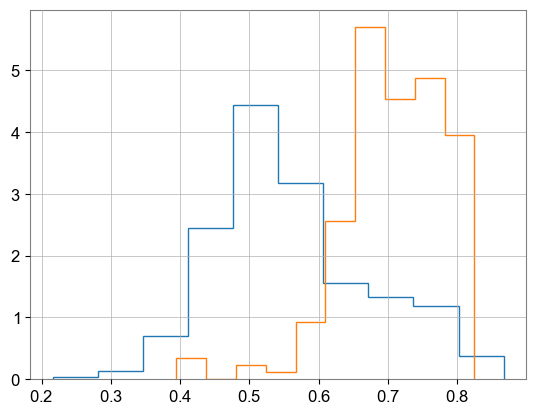

In [ ]:
Geometric_mean_test_isoclu = np.sqrt(isoscore_test_noise * cluscore_test_noise)
Geometric_mean_sg_isoclu = np.sqrt(isoscore_bbh * cluscore_bbh)
plt.hist(Geometric_mean_test_isoclu, density = True, histtype='step')
plt.hist(Geometric_mean_sg_isoclu, density = True, histtype='step')

In [ ]:
isoscore_test_noise_prime = (isoscore_test_noise + 0.1) % 1
isoscore_sg_prime = (isoscore_sg + 0.1) % 1

(array([0.32567656, 0.58621781, 1.88892405, 0.06513531,
        0.06513531, 0.19540594, 0.06513531, 0.5210825 ,
        3.90811873, 5.40623092]),
 array([0.02017638, 0.09693965, 0.17370293, 0.25046621,
        0.32722948, 0.40399276, 0.48075604, 0.55751932,
        0.63428259, 0.71104587, 0.78780915]),
 [<matplotlib.patches.Polygon at 0x208e46def10>])

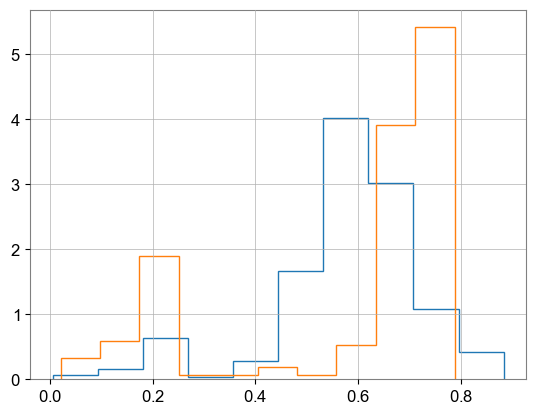

In [ ]:
Geometric_mean_test_isoprimeclu = np.sqrt(isoscore_test_noise_prime * cluscore_test_noise)
Geometric_mean_sg_isoprimeclu = np.sqrt(isoscore_sg_prime * cluscore_sg)

plt.hist(Geometric_mean_test_isoprimeclu, density = True, histtype='step')
plt.hist(Geometric_mean_sg_isoprimeclu, density = True, histtype='step')

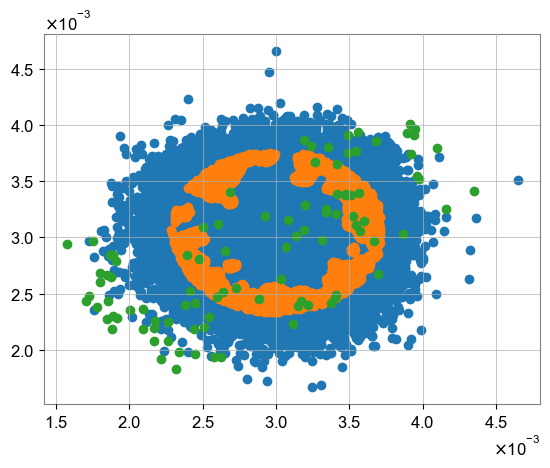

In [ ]:
plt.scatter(x = Feature_space_noise_train[:,0],y = Feature_space_noise_train[:,1])
plt.scatter(x = Feature_space_noise_test[np.argwhere(Geometric_mean_test_isoprimeclu > 0.7).flatten()][:,0],y = Feature_space_noise_test[np.argwhere(Geometric_mean_test_isoprimeclu > 0.7).flatten()][:,1])
plt.scatter(x = Feature_space_sg[np.argwhere(Geometric_mean_sg_isoprimeclu > 0.7).flatten()][:,0],y = Feature_space_sg[np.argwhere(Geometric_mean_sg_isoprimeclu > 0.7).flatten()][:,1])
# plt.scatter(x = Feature_space_sg[:,0],y = Feature_space_sg[:,1])

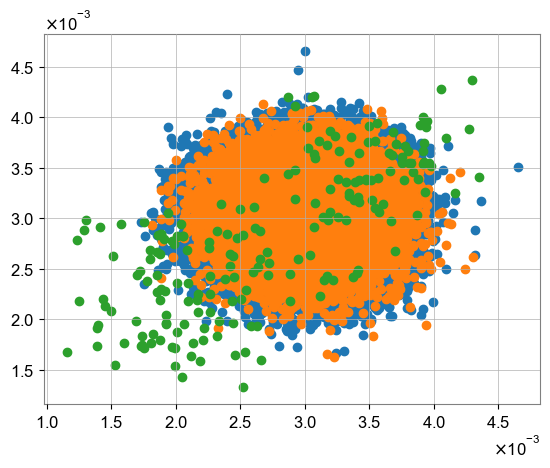

In [ ]:
plt.scatter(x = Feature_space_noise_train[:,0],y = Feature_space_noise_train[:,1])
plt.scatter(x = Feature_space_noise_test[:,0],y = Feature_space_noise_test[:,1])
plt.scatter(x = Feature_space_sg[:200][:,0],y = Feature_space_sg[:200][:,1])
# plt.scatter(x = Feature_space_sg[:,0],y = Feature_space_sg[:,1])

In [ ]:
plt.scatter(x = Feature_space_noise_train[:,0],y = Feature_space_noise_train[:,1])
plt.scatter(x = Feature_space_noise_test[np.argwhere(Geometric_mean_test_isoprimeclu > 0.7).flatten()][:,0],y = Feature_space_noise_test[np.argwhere(Geometric_mean_test_isoprimeclu > 0.7).flatten()][:,1])
plt.scatter(x = Feature_space_bbh[np.argwhere(Geometric_mean_bbh_isoprimeclu > 0.7).flatten()][:,0],y = Feature_space_bbh[np.argwhere(Geometric_mean_bbh_isoprimeclu > 0.7).flatten()][:,1])
# plt.scatter(x = Feature_space_sg[:,0],y = Feature_space_sg[:,1])

### How about performing a weakly supervised learning on this dataset, at least for bbh dataset?

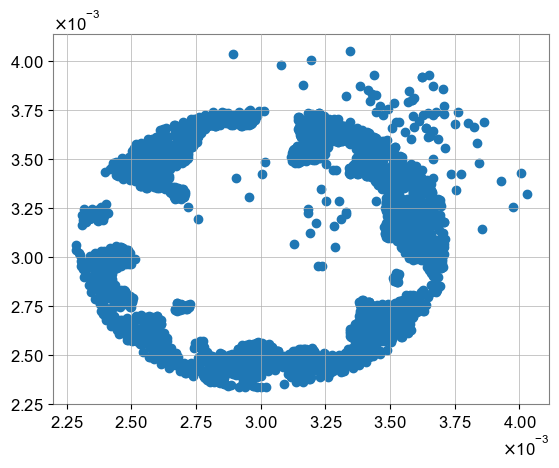

In [ ]:
plt.scatter(data_signal[:,0],data_signal[:,1])

(2995, 2)
(70000, 2)
Epoch: 0001, Training loss=1.92231131, Validation loss=1.33843073
Epoch: 0002, Training loss=1.18566871, Validation loss=1.31931634
Epoch: 0003, Training loss=1.18139601, Validation loss=1.32636196
Epoch: 0004, Training loss=1.18008769, Validation loss=1.29989249
Epoch: 0005, Training loss=1.18058920, Validation loss=1.29547449
Epoch: 0006, Training loss=1.18202710, Validation loss=1.29300897
Epoch: 0007, Training loss=1.18368459, Validation loss=1.29183413
Epoch: 0008, Training loss=1.18532503, Validation loss=1.29130042
Epoch: 0009, Training loss=1.71606123, Validation loss=1.29111819
Epoch: 0010, Training loss=1.18812013, Validation loss=1.29111023
Epoch: 0011, Training loss=1.18925500, Validation loss=1.30650715
Epoch: 0012, Training loss=1.19021893, Validation loss=1.29132794
Epoch: 0013, Training loss=1.19107330, Validation loss=1.29147693
Epoch: 0014, Training loss=1.19167256, Validation loss=1.29160124
Epoch: 0015, Training loss=0.68761444, Validation loss=

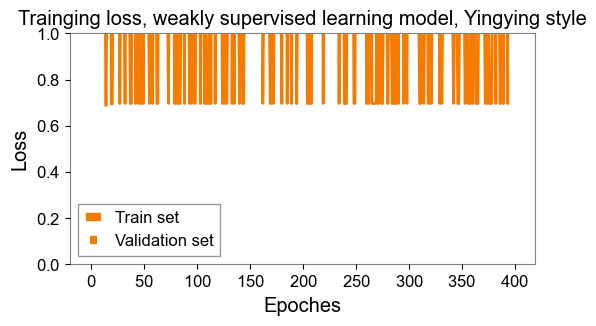

In [ ]:
data_signal = np.vstack((Feature_space_noise_test[np.argwhere(Geometric_mean_test_isoprimeclu > 0.7).flatten()], Feature_space_bbh[np.argwhere(Geometric_mean_bbh_isoprimeclu > 0.7).flatten()]))
# data_bkg = Feature_space_noise_train[np.random.choice(len(data_signal),size = min(len(data_signal),len(Feature_space_noise_train)),  replace=False)]
data_bkg = Feature_space_noise_train

print(data_signal.shape)
print(data_bkg.shape)

data_signal_labeled = np.hstack((data_signal,np.ones(len(data_signal)).reshape(-1,1)))
data_bkg_labeled = np.hstack((data_bkg,np.zeros(len(data_bkg)).reshape(-1,1)))

Final_training_and_validation_set = np.vstack((data_signal_labeled, data_bkg_labeled))
np.random.shuffle(Final_training_and_validation_set)

trainData = torch.FloatTensor(Final_training_and_validation_set[:int(0.9 * len(Final_training_and_validation_set))])
validationData = torch.FloatTensor(Final_training_and_validation_set[int(0.9 * len(Final_training_and_validation_set)):])
train_dataset = TensorDataset(trainData, trainData)
validation_dataset = TensorDataset(validationData, validationData)

trainDataLoader = DataLoader(dataset=train_dataset, batch_size=batch_size, shuffle=True)
validationDataLoader = DataLoader(dataset=validation_dataset, batch_size=batch_size, shuffle = True)


autoencoder = SupervisedModel().cuda()
optimizer = optim.Adam(autoencoder.parameters(), lr=0.00005)
loss_func = nn.BCEWithLogitsLoss(pos_weight=torch.FloatTensor([len(data_bkg) / len(data_signal)])).cuda()
loss_train = np.zeros((epochs, 1))
loss_validation = np.zeros((epochs, 1))


for epoch in range(epochs):
    # 训练阶段
    autoencoder.train()
    for batchidx, (x, _) in enumerate(trainDataLoader):
        x = x.cuda()
        decoded = autoencoder(x[:,:2])
        # weighted_lossTrain = loss_func(decoded, x)
        loss_overall = loss_func(decoded.flatten(), x[:,-1])
        # loss_norm = loss_func(decoded[:, -1], x[:, -1])
        
        weighted_lossTrain = loss_overall
        # weighted_lossTrain = loss_overall + loss_norm * coef_delta
        
        # output_norm = torch.norm(decoded[:, :100], dim=1) 
        # penalty_term = torch.mean((output_norm - 1) ** 2) 
        # weighted_lossTrain = lossTrain + coef_delta * penalty_term
        
        optimizer.zero_grad()
        weighted_lossTrain.backward()
        optimizer.step()

    # 验证阶段
    autoencoder.eval()
    with torch.no_grad():
        val_loss = 0
        for batchidx, (x, _) in enumerate(validationDataLoader):
            x = x.cuda()
            decoded = autoencoder(x[:,:2])
            lossVal_overall = loss_func(decoded.flatten(), x[:,-1])
            lossVal_norm = loss_func(decoded[:, -1], x[:, -1])
            lossVal = lossVal_overall + lossVal_norm * coef_delta
            val_loss += lossVal.item()

        val_loss /= len(validationDataLoader)
    
    loss_train[epoch,0] = weighted_lossTrain.item()
    loss_validation[epoch,0] = val_loss
    # print('Epoch: %04d, Training loss=%.8f' % (epoch+1, weighted_lossTrain.item()))
    print('Epoch: %04d, Training loss=%.8f, Validation loss=%.8f' % (epoch+1, weighted_lossTrain.item(), val_loss))
    
torch.save(autoencoder.cpu(),'../Model_cached/model_weakly_supervised_2-8-6-4-1_GWAK_Yingyingstyle_anomaly_weighted_1.pt')


fig = plt.figure(figsize=(6, 3))
ax = plt.subplot(1, 1, 1)
ax.grid()
ax.plot(loss_train, color=[245/255, 124/255, 0/255], linestyle='-', linewidth=2, label = 'Train set') 
ax.plot(loss_validation, color=[245/255, 124/255, 0/255], linestyle='--', linewidth=2, label = 'Validation set') 
ax.set_xlabel('Epoches')
ax.set_ylabel('Loss')
ax.set_title('Trainging loss, weakly supervised learning model, Yingying style')
plt.ylim(0,1)
plt.legend()
# plt.show()
plt.savefig('../Pic_cached/Trainging loss, weakly supervised learning model_Yingyingstyle_anomaly_weighted,2-8-6-4-1_1.png')

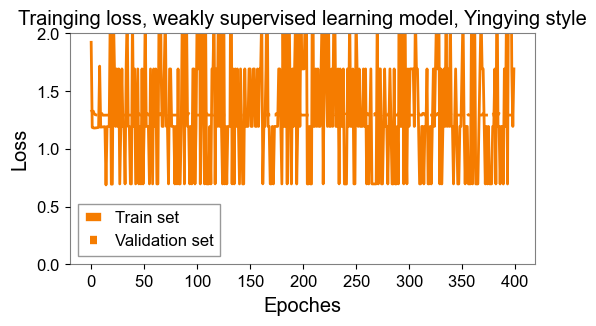

In [ ]:
fig = plt.figure(figsize=(6, 3))
ax = plt.subplot(1, 1, 1)
ax.grid()
ax.plot(loss_train, color=[245/255, 124/255, 0/255], linestyle='-', linewidth=2, label = 'Train set') 
ax.plot(loss_validation, color=[245/255, 124/255, 0/255], linestyle='--', linewidth=2, label = 'Validation set') 
ax.set_xlabel('Epoches')
ax.set_ylabel('Loss')
ax.set_title('Trainging loss, weakly supervised learning model, Yingying style')
plt.ylim(0,2)
plt.legend()
# plt.show()
plt.savefig('../Pic_cached/Trainging loss, weakly supervised learning model_Yingyingstyle_anomaly_weighted,2-8-6-4-1_1.png')

(array([ 0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
         0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
         0.,  0.,  0., 50.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
         0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
         0.,  0.,  0.,  0.,  0.,  0.]),
 array([0.00153756, 0.02153756, 0.04153756, 0.06153756,
        0.08153756, 0.10153756, 0.12153756, 0.14153756,
        0.16153756, 0.18153756, 0.20153756, 0.22153756,
        0.24153756, 0.26153756, 0.28153756, 0.30153756,
        0.32153756, 0.34153756, 0.36153756, 0.38153756,
        0.40153756, 0.42153756, 0.44153756, 0.46153756,
        0.48153756, 0.50153756, 0.52153756, 0.54153756,
        0.56153756, 0.58153756, 0.60153756, 0.62153756,
        0.64153756, 0.66153756, 0.68153756, 0.70153756,
        0.72153756, 0.74153756, 0.76153756, 0.78153756,
        0.80153756, 0.82153756, 0.84153756, 0.86153756,
        0.88153756, 0.90153756, 0.92153756, 0.94153756,
        0.96153756, 0.98153756, 1.00

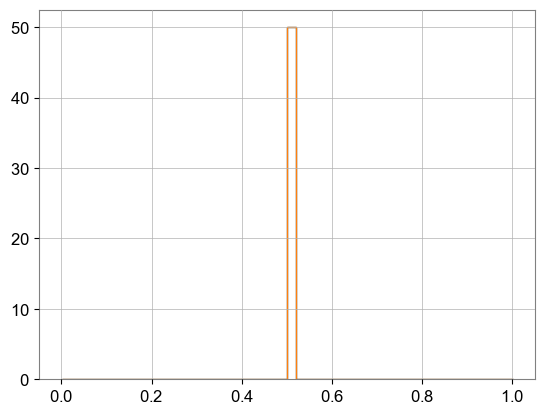

In [ ]:
decodedTestdata = torch.sigmoid(autoencoder(torch.FloatTensor(Feature_space_noise_test)))
decodedTestdata = decodedTestdata.double()
reconstructedData_test = decodedTestdata.detach().numpy()

decodedTestdata = torch.sigmoid(autoencoder(torch.FloatTensor(Feature_space_bbh[:200])))
decodedTestdata = decodedTestdata.double()
reconstructedData_injected = decodedTestdata.detach().numpy()

plt.hist(reconstructedData_test, density = True, bins = 50, histtype='step')
plt.hist(reconstructedData_injected, density = True, bins = 50, histtype='step')

(array([ 6388.6837813 ,     0.        ,     0.        ,
            0.        ,  4259.12252085,  6388.6837813 ,
         4259.12252087, 10647.80630216,  6388.6837813 ,
         4259.12252087,  6388.6837813 , 10647.80630216,
         6388.68378128, 10647.80630216,  6388.6837813 ,
        19166.0513439 ,  4259.12252087, 19166.0513439 ,
        10647.80630216,  4259.12252087,  2129.56126043,
        10647.80630216, 12777.3675626 ,  8518.24504173,
        12777.3675626 ,  2129.56126043, 21295.61260433,
        21295.61260433, 14906.92882303, 10647.80630213,
        12777.3675626 , 31943.41890649, 10647.80630216,
         6388.6837813 , 19166.0513439 ,  8518.24504173,
        17036.49008346,  4259.12252085,  8518.24504173,
         8518.24504173,  8518.24504173,  8518.24504173,
         4259.12252087,  4259.12252087,     0.        ,
         2129.56126043,  2129.56126043,  6388.6837813 ,
         2129.56126043,  2129.56126043]),
 array([0.04065538, 0.04065773, 0.04066007, 0.04066242,
      

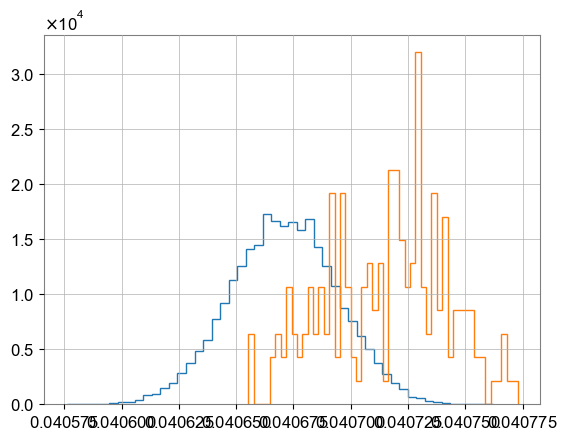

In [ ]:
decodedTestdata = torch.sigmoid(autoencoder(torch.FloatTensor(Feature_space_noise_test)))
decodedTestdata = decodedTestdata.double()
reconstructedData_test = decodedTestdata.detach().numpy()

decodedTestdata = torch.sigmoid(autoencoder(torch.FloatTensor(Feature_space_bbh[:200])))
decodedTestdata = decodedTestdata.double()
reconstructedData_injected = decodedTestdata.detach().numpy()

plt.hist(reconstructedData_test, density = True, bins = 50, histtype='step')
plt.hist(reconstructedData_injected, density = True, bins = 50, histtype='step')

(array([ 12446.00593431,  37338.01780292,  12446.00593431,
             0.        ,  12446.00593774,  37338.01780292,
         24892.01186861,  24892.01186861,  37338.01780292,
         12446.00593431,      0.        ,  74676.03560583,
         49784.02375098,  37338.01780292,  12446.00593431,
        124460.05934305,  87122.04154014,  49784.02373722,
         74676.03560583,  87122.04154014,  49784.02375098,
         12446.00593431,  37338.01780292,  74676.03560583,
         24892.01186861,  74676.03560583,  87122.04154014,
        136906.06527736,  74676.03560583,  99568.04750196,
         74676.03560583, 149352.07121166, 124460.05934305,
         87122.04154014,  62230.02967153,  62230.02967153,
         62230.02967153,  37338.01781323,  24892.01186861,
         87122.04154014,  62230.02967153,  49784.02373722,
         12446.00593431,  12446.00593431,  12446.00593431,
         49784.02375098,  12446.00593431,      0.        ,
         12446.00593431,  12446.00593431]),
 array([0.50

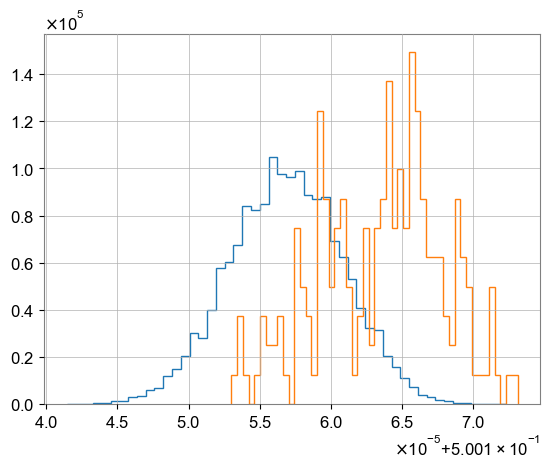

In [ ]:
decodedTestdata = torch.sigmoid(autoencoder(torch.FloatTensor(Feature_space_noise_test)))
decodedTestdata = decodedTestdata.double()
reconstructedData_test = decodedTestdata.detach().numpy()

decodedTestdata = torch.sigmoid(autoencoder(torch.FloatTensor(Feature_space_bbh[:200])))
decodedTestdata = decodedTestdata.double()
reconstructedData_injected = decodedTestdata.detach().numpy()

plt.hist(reconstructedData_test, density = True, bins = 50, histtype='step')
plt.hist(reconstructedData_injected, density = True, bins = 50, histtype='step')

## SVM-isoclu combined anomaly detection

### Initial distribution

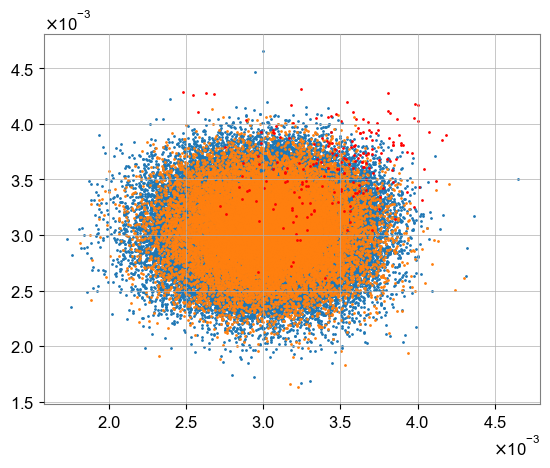

In [9]:
plt.scatter(x = Feature_space_noise_train[:,0],y = Feature_space_noise_train[:,1],s = 1)
plt.scatter(x = Feature_space_noise_test[:,0],y = Feature_space_noise_test[:,1],s = 1)
plt.scatter(x = Feature_space_bbh[:200][:,0],y = Feature_space_bbh[:200][:,1],s = 1,color = 'r')
# plt.scatter(x = Feature_space_sg[:,0],y = Feature_space_sg[:,1])

### Using SVM to identify the outliner

### As SVM is sensitive to bkg's distribution, we do a standardrization

In [14]:
mu = np.mean(Feature_space_noise_train, axis=0)
sig = np.std(Feature_space_noise_train, axis=0)

In [115]:
X_train = (Feature_space_noise_train - mu)/sig
X_test = (Feature_space_noise_test - mu)/sig
X_bbh = (Feature_space_bbh[:200]-mu)/sig
X_sg = (Feature_space_sg[:200] - mu)/sig

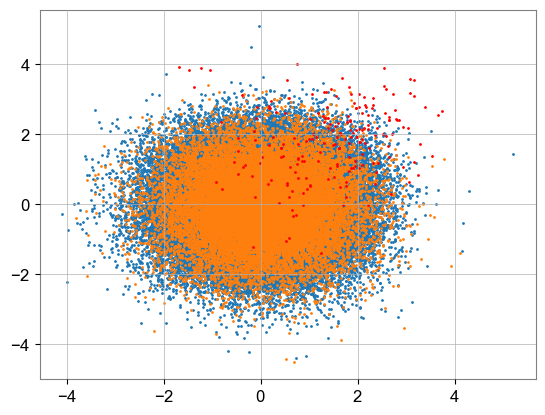

In [16]:
plt.scatter(X_train[:, 0], X_train[:, 1],s = 1)
plt.scatter(X_test[:, 0], X_test[:, 1],s = 1)
plt.scatter(X_bbh[:, 0], X_bbh[:, 1],s = 1,color = 'r')

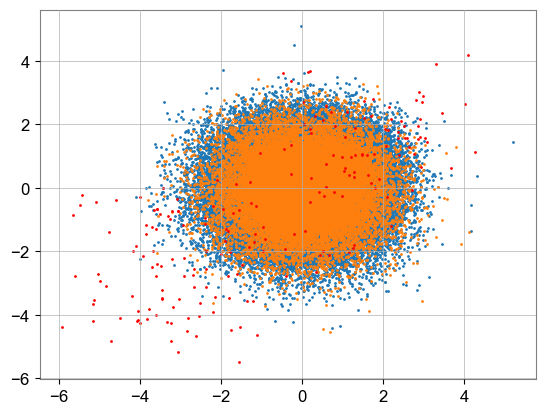

In [116]:
plt.scatter(X_train[:, 0], X_train[:, 1],s = 1)
plt.scatter(X_test[:, 0], X_test[:, 1],s = 1)
plt.scatter(X_sg[:, 0], X_sg[:, 1],s = 1,color = 'r')

### Making the SVM

In [314]:
clf = make_pipeline(
            Nystroem(gamma=0.1, n_components=150), # a so-called kernel function that I still haven't figured out it's influence yet
            SGDOneClassSVM(nu=0.1, shuffle=True, fit_intercept=True) # nu is the FPR
)

clf.fit(X_train)

Pipeline(steps=[('nystroem', Nystroem(gamma=0.1, n_components=150)),
                ('sgdoneclasssvm', SGDOneClassSVM(nu=0.1))])

In [332]:
color = np.array(['g','b','r'])

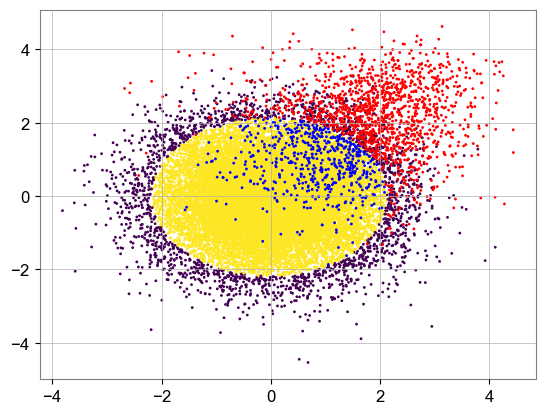

In [385]:
y_test = clf.predict(X_test)

indices_test_noise_anomaly = np.argwhere(y_test == -1).flatten()
indices_test_noise_bkg = np.argwhere(y_test == 1).flatten()

plt.scatter(X_test[:, 0], X_test[:, 1], c=y_test, s = 1)
plt.scatter(X_bbh[:, 0], X_bbh[:, 1], c=color[y_bbh], s = 1)

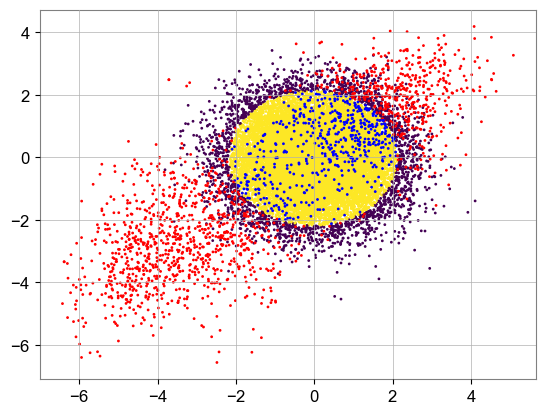

In [386]:
plt.scatter(X_test[:, 0], X_test[:, 1], c=y_test, s = 1)
plt.scatter(X_sg[:, 0], X_sg[:, 1], c=color[y_sg], s = 1)

In [21]:
indices_noise_anomaly.shape

(198, 1)

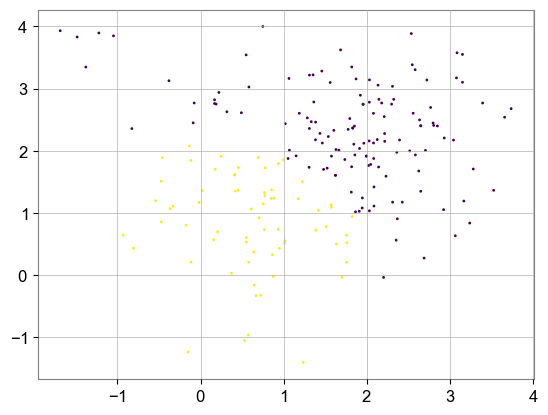

In [319]:
y_bbh = clf.predict(X_bbh) # 1 for insider, -1 for outliner

indices_bbh_anomaly = np.argwhere(y_bbh == -1).flatten()
indices_bbh_bkg = np.argwhere(y_bbh == 1).flatten()

plt.scatter(X_bbh[:, 0], X_bbh[:, 1], c=2*y_bbh, s = 1)

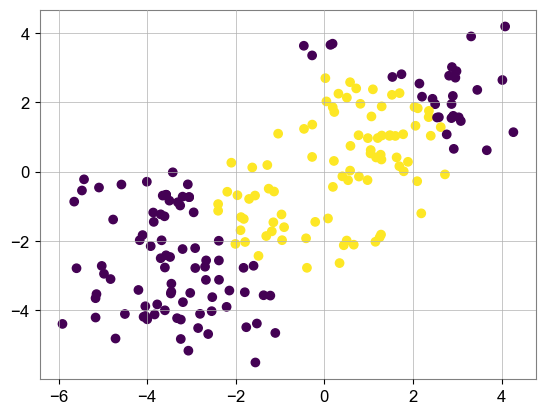

In [117]:
y_sg = clf.predict(X_sg) # 1 for insider, -1 for outliner

indices_sg_anomaly = np.argwhere(y_sg == -1).flatten()
indices_sg_bkg = np.argwhere(y_sg == 1).flatten()

plt.scatter(X_sg[:, 0], X_sg[:, 1], c=y_sg)

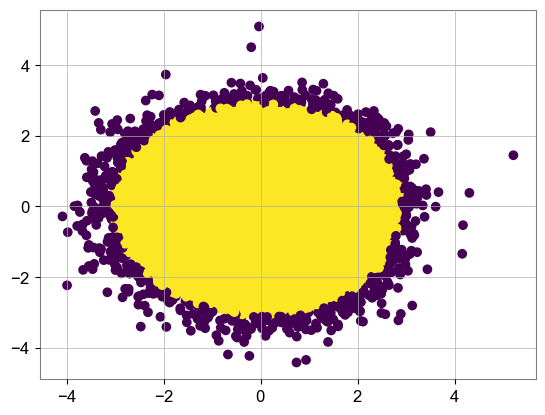

In [65]:
y_train = clf.predict(X_train) # 1 for insider, -1 for outliner

indices_train_noise_anomaly = np.argwhere(y_train == -1).flatten()
indices_train_noise_bkg = np.argwhere(y_train == 1).flatten()

plt.scatter(X_train[:, 0], X_train[:, 1], c=y_train)

In [66]:
training_noise_sample_SVMed = X_train[indices_train_noise_bkg]

In [67]:
training_noise_sample_SVMed.shape

(69285, 2)

### After SVM, the left overdensity part is left for further iso-clu investigation

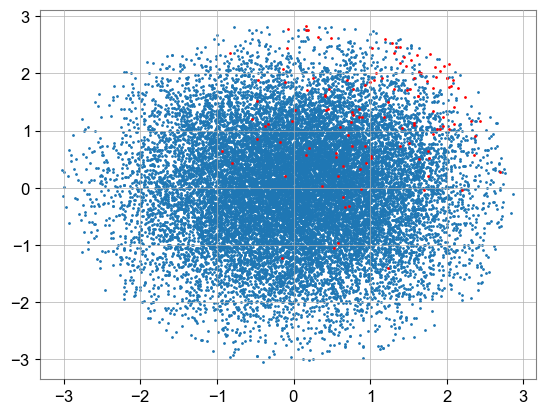

In [199]:
# plt.scatter(X_train[indices_train_noise_bkg][:, 0], X_train[indices_train_noise_bkg][:, 1],s = 1)
plt.scatter(X_test[indices_test_noise_bkg][:, 0], X_test[indices_test_noise_bkg][:, 1],s = 1)
plt.scatter(X_bbh[indices_bbh_bkg][:, 0], X_bbh[indices_bbh_bkg][:, 1],s = 1,color = 'r')
# plt.scatter(X_test[indices_test_noise_bkg][16662][0], X_test[indices_test_noise_bkg][16662][1],s = 4)

In [31]:
num_of_noise_bkg = len(indices_test_noise_bkg)
num_of_bbh_bkg = len(indices_bbh_bkg)

In [32]:
num_of_bbh_bkg

126

In [33]:
num_of_noise_bkg

19802

In [35]:
full_test_noise_sample = np.vstack((X_test[indices_test_noise_bkg], X_bbh[indices_bbh_bkg]))

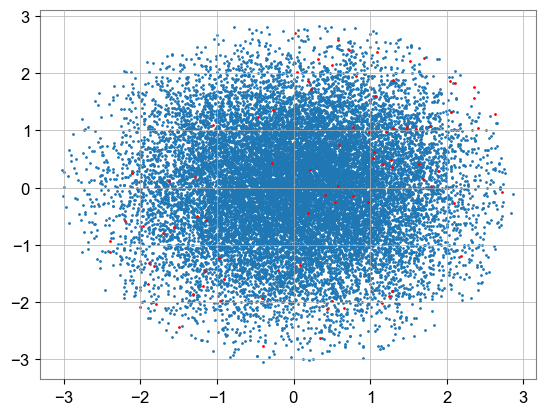

In [118]:
# plt.scatter(X_train[:, 0], X_train[:, 1],s = 1)
plt.scatter(X_test[indices_test_noise_bkg][:, 0], X_test[indices_test_noise_bkg][:, 1],s = 1)
plt.scatter(X_sg[indices_sg_bkg][:, 0], X_sg[indices_sg_bkg][:, 1],s = 1,color = 'r')

In [119]:
num_of_noise_bkg = len(indices_test_noise_bkg)
num_of_sg_bkg = len(indices_sg_bkg)

In [120]:
num_of_sg_bkg

87

In [121]:
num_of_noise_bkg

19802

In [122]:
full_test_noise_sample = np.vstack((X_test[indices_test_noise_bkg], X_sg[indices_sg_bkg]))

### iso-clu part

In [40]:
def mean_distance_k(center_point_sample, reference_sample, k, exclude_self = False):
    mdk = np.zeros(len(center_point_sample))
    
    if exclude_self:
        bias = 1
    else:
        bias = 0
    
    for i in range(len(mdk)):
        mdk[i] = np.mean(np.sort(np.linalg.norm(center_point_sample[i] - reference_sample, axis=1))[bias:bias+k])
    return mdk

In [41]:
k_for_iso = 175
k_for_clu = 50

In [96]:
dtrainprime = np.mean(mean_distance_k(training_noise_sample_SVMed, training_noise_sample_SVMed, k_for_iso-1, exclude_self=True))

In [97]:
Delta_iso_test_noise = (mean_distance_k(full_test_noise_sample[:num_of_noise_bkg],training_noise_sample_SVMed,  k_for_iso) - dtrainprime) / np.sqrt(dtrainprime)
Delta_clu_test_noise = (mean_distance_k(full_test_noise_sample[:num_of_noise_bkg],full_test_noise_sample, k_for_clu-1, exclude_self=True)**(-2) - mean_distance_k(full_test_noise_sample[:num_of_noise_bkg],training_noise_sample_SVMed,k_for_iso)**(-2)) / mean_distance_k(full_test_noise_sample[:num_of_noise_bkg],training_noise_sample_SVMed,k_for_iso)**(-1)
Delta_iso_bbh = (mean_distance_k(full_test_noise_sample[num_of_noise_bkg:],training_noise_sample_SVMed, k_for_iso) - dtrainprime) / np.sqrt(dtrainprime)
Delta_clu_bbh = (mean_distance_k(full_test_noise_sample[num_of_noise_bkg:],full_test_noise_sample, k_for_clu-1, exclude_self=True)**(-2) - mean_distance_k(full_test_noise_sample[num_of_noise_bkg:],training_noise_sample_SVMed,k_for_iso)**(-2)) / mean_distance_k(full_test_noise_sample[num_of_noise_bkg:],training_noise_sample_SVMed,k_for_iso)**(-1)

In [98]:
isoscore_test_noise = (1+sp.erf(Delta_iso_test_noise / (np.sqrt(2) * np.sqrt(np.mean(np.hstack((np.square(Delta_iso_test_noise),np.square(Delta_iso_bbh))))))))/2
cluscore_test_noise = (1+sp.erf(Delta_clu_test_noise / (np.sqrt(np.mean(np.hstack((np.square(Delta_clu_test_noise),np.square(Delta_clu_bbh))))) * np.sqrt(2))))/2

In [84]:
isoscore_test_noise = (1+sp.erf(Delta_iso_test_noise / (np.sqrt(2) * np.sqrt(np.mean((np.square(Delta_iso_test_noise)))))))/2

In [94]:
np.sqrt(np.mean((np.square(Delta_iso_test_noise))))

0.18461219924195701

In [95]:
np.sqrt(np.mean(np.hstack((np.square(Delta_iso_test_noise),np.square(Delta_iso_bbh)))))

0.1877842576559866

In [99]:
isoscore_bbh = (1+sp.erf(Delta_iso_bbh / (np.sqrt(2) * np.sqrt(np.mean(np.hstack((np.square(Delta_iso_test_noise),np.square(Delta_iso_bbh))))))))/2
cluscore_bbh = (1+sp.erf(Delta_clu_bbh / (np.sqrt(np.mean(np.hstack((np.square(Delta_clu_test_noise),np.square(Delta_clu_bbh))))) * np.sqrt(2))))/2

In [100]:
Delta_iso_train_noise = (mean_distance_k(training_noise_sample_SVMed,training_noise_sample_SVMed, k_for_iso-1, exclude_self=True) - dtrainprime) / np.sqrt(dtrainprime)
isoscore_train_noise = (1 + sp.erf(Delta_iso_train_noise / (np.sqrt(2) * np.sqrt(np.mean(np.square(Delta_iso_train_noise))))))/2

In [101]:
Delta_clu_train_noise = (mean_distance_k(training_noise_sample_SVMed,full_test_noise_sample, k_for_clu)**(-2) - mean_distance_k(training_noise_sample_SVMed,training_noise_sample_SVMed,k_for_iso-1, exclude_self=True)**(-2)) / mean_distance_k(training_noise_sample_SVMed,training_noise_sample_SVMed,k_for_iso-1,exclude_self=True)**(-1)
cluscore_train_noise = (1 + sp.erf(Delta_clu_train_noise / (np.sqrt(np.mean(np.square(Delta_clu_train_noise))) * np.sqrt(2))))/2

KeyboardInterrupt: 

(-0.1, 1.1)

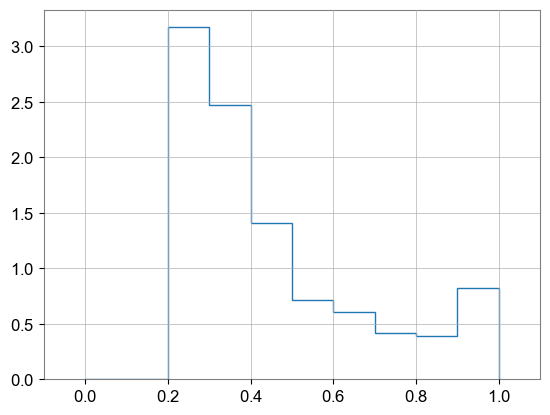

In [102]:
plt.hist(isoscore_train_noise, density = True, histtype='step', bins = np.arange(0,1.1,0.1))
plt.xlim(-0.1, 1.1)

(-0.1, 1.1)

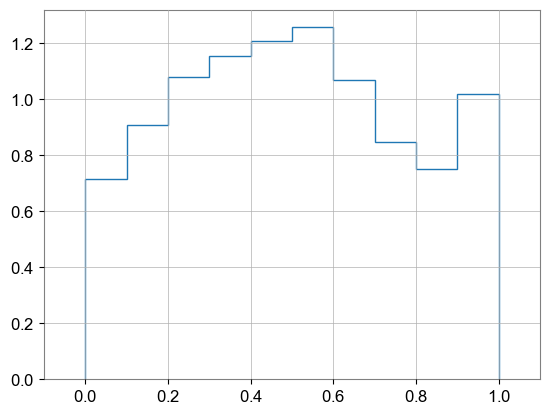

In [ ]:
plt.hist(cluscore_train_noise, density = True, histtype='step', bins = np.arange(0,1.1,0.1))
plt.xlim(-0.1, 1.1)

Text(0, 0.5, 'cluscore')

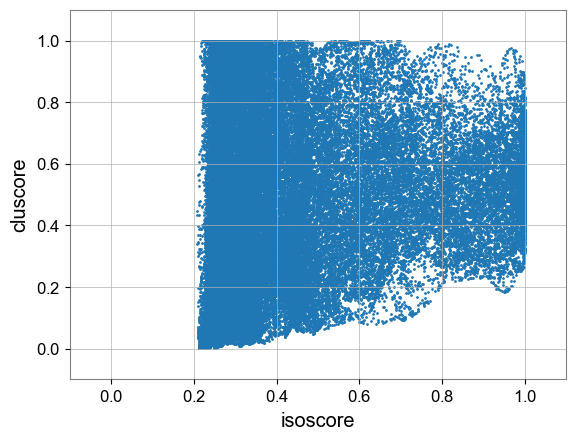

In [ ]:
plt.scatter(isoscore_train_noise, cluscore_train_noise,s = 1)
# plt.scatter(isoscore_bbh, cluscore_bbh)

plt.xlim(-0.1,1.1)
plt.ylim(-0.1,1.1)
plt.xlabel('isoscore')
plt.ylabel('cluscore')

(-0.1, 1.1)

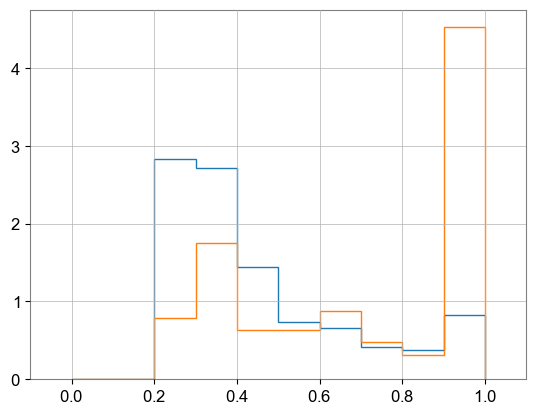

In [103]:
plt.hist(isoscore_test_noise, density = True, histtype='step', bins = np.arange(0,1.1,0.1))
plt.hist(isoscore_bbh, density = True, histtype='step', bins = np.arange(0,1.1,0.1))
plt.xlim(-0.1,1.1)

(-0.1, 1.1)

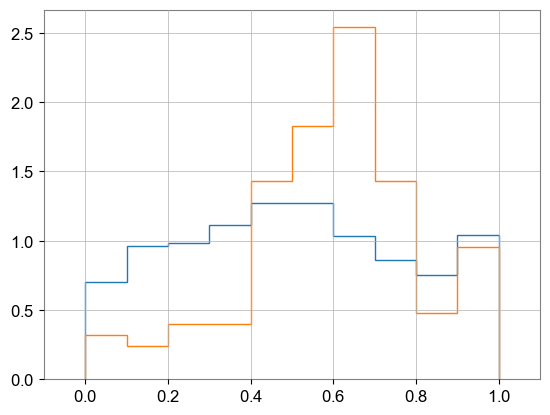

In [ ]:
plt.hist(cluscore_test_noise, density = True, histtype='step', bins = np.arange(0,1.1,0.1))
plt.hist(cluscore_bbh, density = True, histtype='step', bins = np.arange(0,1.1,0.1))
plt.xlim(-0.1,1.1)

(-0.1, 1.1)

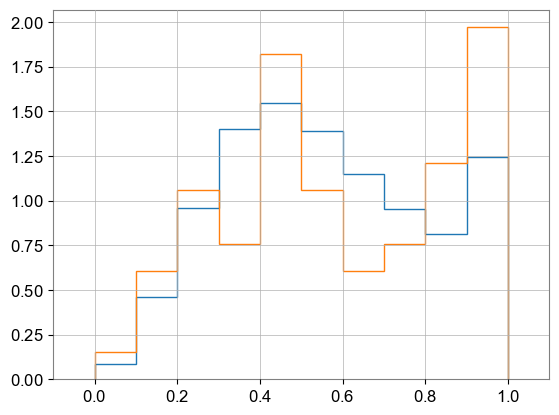

In [335]:
plt.hist(cluscore_test_noise, density = True, histtype='step', bins = np.arange(0,1.1,0.1))
plt.hist(cluscore_bbh, density = True, histtype='step', bins = np.arange(0,1.1,0.1))
plt.xlim(-0.1,1.1)

Text(0, 0.5, 'cluscore')

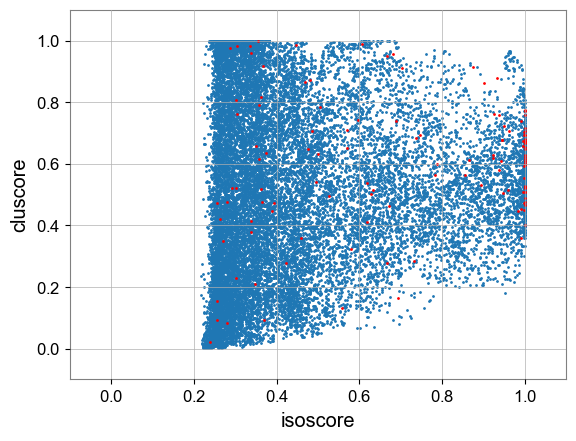

In [ ]:
plt.scatter(isoscore_test_noise, cluscore_test_noise,s = 1)
plt.scatter(isoscore_bbh, cluscore_bbh,s = 1, color = 'r')

plt.xlim(-0.1,1.1)
plt.ylim(-0.1,1.1)
plt.xlabel('isoscore')
plt.ylabel('cluscore')

In [ ]:
Geometric_mean_test_isoclu = np.sqrt(isoscore_test_noise * cluscore_test_noise)
Geometric_mean_bbh_isoclu = np.sqrt(isoscore_bbh * cluscore_bbh)

(array([0.28567166, 0.19044778, 0.38089555, 0.85701499,
        1.14268665, 1.33313443, 1.14268665, 2.47582108,
        2.47582108, 1.71402998]),
 array([0.07110521, 0.15445098, 0.23779674, 0.32114251,
        0.40448828, 0.48783404, 0.57117981, 0.65452558,
        0.73787134, 0.82121711, 0.90456288]),
 [<matplotlib.patches.Polygon at 0x15ea4f8e750>])

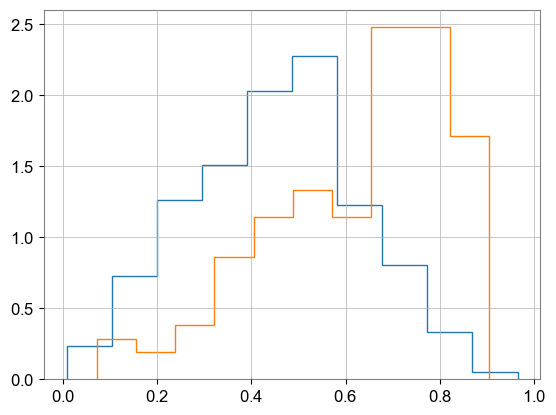

In [ ]:
plt.hist(Geometric_mean_test_isoclu, density = True, histtype='step')
plt.hist(Geometric_mean_bbh_isoclu, density = True, histtype='step')

In [110]:
bins = 10

isocut_scheme = np.arange(0, 1.0001, 1/bins)
xi = np.zeros(bins)

ratio = len(training_noise_sample_SVMed) / (len(full_test_noise_sample))

total_number_test_noise = 0
total_number_train = 0
total_number_bbh = 0

for i in range(bins):
    count_test_noise = np.count_nonzero(np.logical_and(isoscore_test_noise >= isocut_scheme[i],isoscore_test_noise <= isocut_scheme[i+1]))
    count_bbh = np.count_nonzero(np.logical_and(isoscore_bbh >= isocut_scheme[i],isoscore_bbh <= isocut_scheme[i+1]))
    count_train = np.count_nonzero(np.logical_and(isoscore_train_noise >= isocut_scheme[i], isoscore_train_noise <=  isocut_scheme[i+1]))
    
    total_number_test_noise += count_test_noise
    total_number_train += count_train
    total_number_bbh += count_bbh
    
    # print(count_test_noise, count_bbh, count_train)
    
    
    xi[i] = (count_test_noise + count_bbh - (count_train/ratio)) / np.sqrt(count_train/ratio)

C:\Users\Liyang Miao\AppData\Local\Temp\ipykernel_1000\31120246.py:24: RuntimeWarning: invalid value encountered in scalar divide
  xi[i] = (count_test_noise + count_bbh - (count_train/ratio)) / np.sqrt(count_train/ratio)


In [111]:
total_number_train/ratio - (total_number_test_noise + total_number_bbh)

0.0

### For sg

In [123]:
def mean_distance_k(center_point_sample, reference_sample, k, exclude_self = False):
    mdk = np.zeros(len(center_point_sample))
    
    if exclude_self:
        bias = 1
    else:
        bias = 0
    
    for i in range(len(mdk)):
        mdk[i] = np.mean(np.sort(np.linalg.norm(center_point_sample[i] - reference_sample, axis=1))[bias:bias+k])
    return mdk

In [149]:
k_for_iso = 175
k_for_clu = 50

In [150]:
dtrainprime = np.mean(mean_distance_k(training_noise_sample_SVMed, training_noise_sample_SVMed, k_for_iso, exclude_self=True))

In [151]:
Delta_iso_test_noise = (mean_distance_k(full_test_noise_sample[:num_of_noise_bkg],training_noise_sample_SVMed,  k_for_iso) - dtrainprime) / np.sqrt(dtrainprime)
Delta_clu_test_noise = (mean_distance_k(full_test_noise_sample[:num_of_noise_bkg],full_test_noise_sample, k_for_clu, exclude_self=True)**(-2) - mean_distance_k(full_test_noise_sample[:num_of_noise_bkg],training_noise_sample_SVMed,k_for_iso)**(-2)) / mean_distance_k(full_test_noise_sample[:num_of_noise_bkg],training_noise_sample_SVMed,k_for_iso)**(-1)
Delta_iso_sg = (mean_distance_k(full_test_noise_sample[num_of_noise_bkg:],training_noise_sample_SVMed, k_for_iso) - dtrainprime) / np.sqrt(dtrainprime)
Delta_clu_sg = (mean_distance_k(full_test_noise_sample[num_of_noise_bkg:],full_test_noise_sample, k_for_clu, exclude_self=True)**(-2) - mean_distance_k(full_test_noise_sample[num_of_noise_bkg:],training_noise_sample_SVMed,k_for_iso)**(-2)) / mean_distance_k(full_test_noise_sample[num_of_noise_bkg:],training_noise_sample_SVMed,k_for_iso)**(-1)

In [152]:
isoscore_test_noise = (1+sp.erf(Delta_iso_test_noise / (np.sqrt(2) * np.sqrt(np.mean(np.hstack((np.square(Delta_iso_test_noise),np.square(Delta_iso_sg))))))))/2
cluscore_test_noise = (1+sp.erf(Delta_clu_test_noise / (np.sqrt(np.mean(np.hstack((np.square(Delta_clu_test_noise),np.square(Delta_clu_sg))))) * np.sqrt(2))))/2

In [153]:
np.sqrt(np.mean((np.square(Delta_iso_test_noise))))

0.18461219924195701

In [154]:
np.sqrt(np.mean(np.hstack((np.square(Delta_iso_test_noise),np.square(Delta_iso_sg)))))

0.18623694919391615

In [155]:
isoscore_sg = (1+sp.erf(Delta_iso_sg / (np.sqrt(2) * np.sqrt(np.mean(np.hstack((np.square(Delta_iso_test_noise),np.square(Delta_iso_sg))))))))/2
cluscore_sg = (1+sp.erf(Delta_clu_sg / (np.sqrt(np.mean(np.hstack((np.square(Delta_clu_test_noise),np.square(Delta_clu_sg))))) * np.sqrt(2))))/2

In [183]:
Delta_iso_train_noise = (mean_distance_k(training_noise_sample_SVMed,training_noise_sample_SVMed, k_for_iso, exclude_self=True) - dtrainprime) / np.sqrt(dtrainprime)
isoscore_train_noise = (1 + sp.erf(Delta_iso_train_noise / (np.sqrt(2) * np.sqrt(np.mean(np.square(Delta_iso_train_noise))))))/2

In [157]:
Delta_clu_train_noise = (mean_distance_k(training_noise_sample_SVMed,full_test_noise_sample, k_for_clu)**(-2) - mean_distance_k(training_noise_sample_SVMed,training_noise_sample_SVMed,k_for_iso, exclude_self=True)**(-2)) / mean_distance_k(training_noise_sample_SVMed,training_noise_sample_SVMed,k_for_iso,exclude_self=True)**(-1)
cluscore_train_noise = (1 + sp.erf(Delta_clu_train_noise / (np.sqrt(np.mean(np.square(Delta_clu_train_noise))) * np.sqrt(2))))/2

In [176]:
isoscore_train_noise = (1 + sp.erf(Delta_iso_train_noise / (np.sqrt(2) * np.sqrt(np.mean(np.hstack((np.square(Delta_iso_test_noise),np.square(Delta_iso_sg))))))))/2

In [180]:
(np.sqrt(2) * np.sqrt(np.mean(np.hstack((np.square(Delta_iso_test_noise),np.square(Delta_iso_sg))))))

0.2633788193650253

In [184]:
(np.sqrt(2) * np.sqrt(np.mean(np.square(Delta_iso_train_noise))))

0.25387923761495995

In [193]:
(np.sqrt(2) * np.sqrt(np.mean(np.square(Delta_iso_test_noise)[:-1])))

0.26108642317481645

In [194]:
np.argmax(Delta_iso_test_noise)

16662

(array([4.49420006e+00, 9.55811094e-01, 3.34819265e-01,
        1.33207665e-01, 7.39359615e-02, 3.83729396e-02,
        2.36208713e-02, 1.72107464e-02, 9.83471222e-03,
        2.89772771e-03]),
 array([-0.14665892,  0.01770904,  0.18207699,  0.34644494,
         0.51081289,  0.67518085,  0.8395488 ,  1.00391675,
         1.1682847 ,  1.33265266,  1.49702061]),
 [<matplotlib.patches.Polygon at 0x15eab1c7b90>])

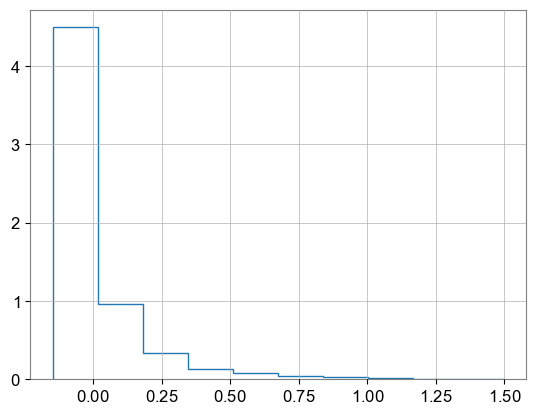

In [187]:
plt.hist(Delta_iso_train_noise, histtype = 'step', density = True, bins = 10)
# plt.hist(Delta_iso_test_noise, histtype = 'step', density = True, bins = 10)

(array([0.        , 0.        , 2.93303707, 2.64720735,
        1.42611857, 0.73174427, 0.64740935, 0.41561458,
        0.37571962, 0.82314918]),
 array([0. , 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1. ]),
 [<matplotlib.patches.Polygon at 0x15ea9513ed0>])

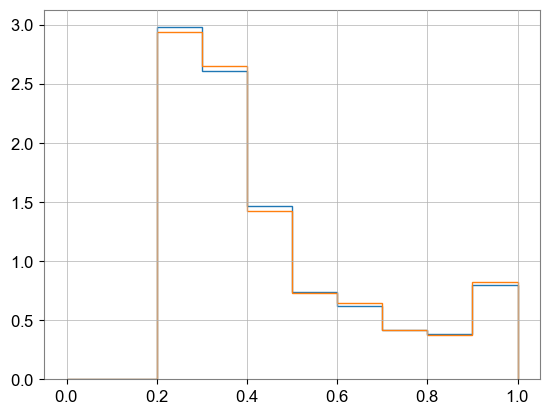

In [177]:
plt.hist(isoscore_train_noise, histtype = 'step', density = True, bins = np.arange(0,1.001,1/10))
plt.hist(isoscore_test_noise, histtype = 'step', density = True, bins = np.arange(0,1.001,1/10))

(-0.1, 1.1)

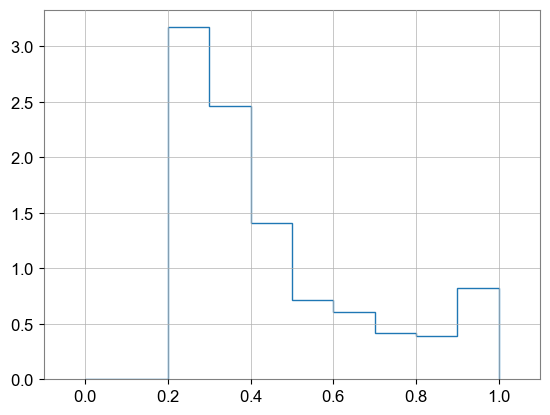

In [158]:
plt.hist(isoscore_train_noise, density = True, histtype='step', bins = np.arange(0,1.1,0.1))
plt.xlim(-0.1, 1.1)

(-0.1, 1.1)

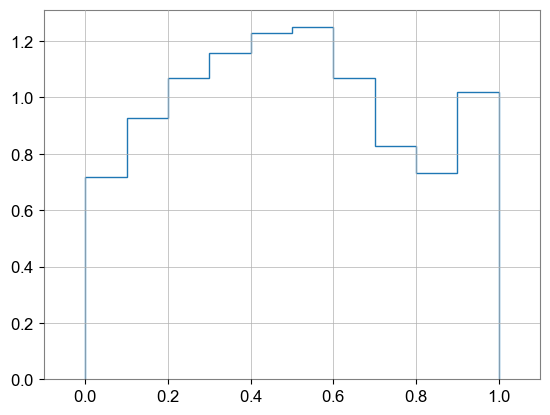

In [159]:
plt.hist(cluscore_train_noise, density = True, histtype='step', bins = np.arange(0,1.1,0.1))
plt.xlim(-0.1, 1.1)

Text(0, 0.5, 'cluscore')

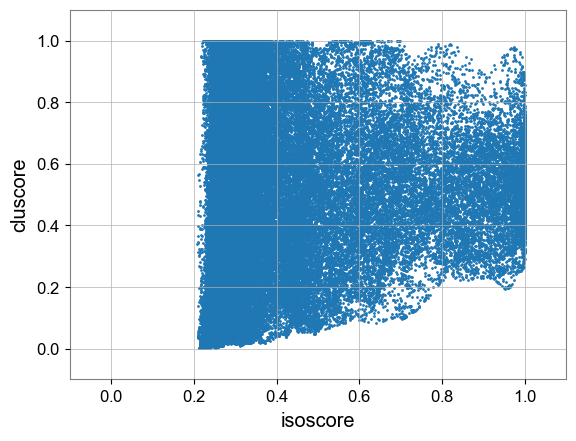

In [160]:
plt.scatter(isoscore_train_noise, cluscore_train_noise,s = 1)

plt.xlim(-0.1,1.1)
plt.ylim(-0.1,1.1)
plt.xlabel('isoscore')
plt.ylabel('cluscore')

(-0.1, 1.1)

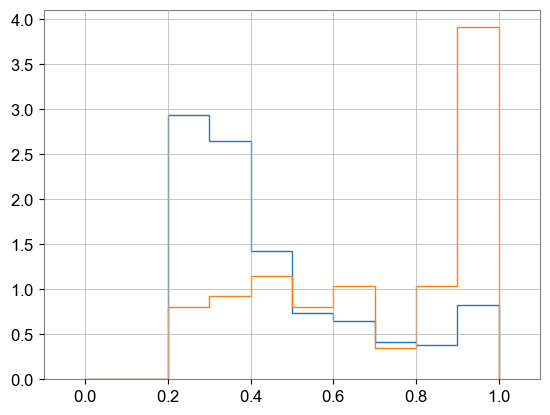

In [161]:
plt.hist(isoscore_test_noise, density = True, histtype='step', bins = np.arange(0,1.1,0.1))
plt.hist(isoscore_sg, density = True, histtype='step', bins = np.arange(0,1.1,0.1))
plt.xlim(-0.1,1.1)

(-0.1, 1.1)

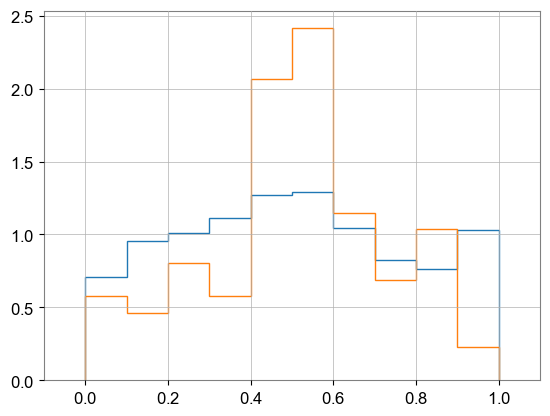

In [162]:
plt.hist(cluscore_test_noise, density = True, histtype='step', bins = np.arange(0,1.1,0.1))
plt.hist(cluscore_sg, density = True, histtype='step', bins = np.arange(0,1.1,0.1))
plt.xlim(-0.1,1.1)

Text(0, 0.5, 'cluscore')

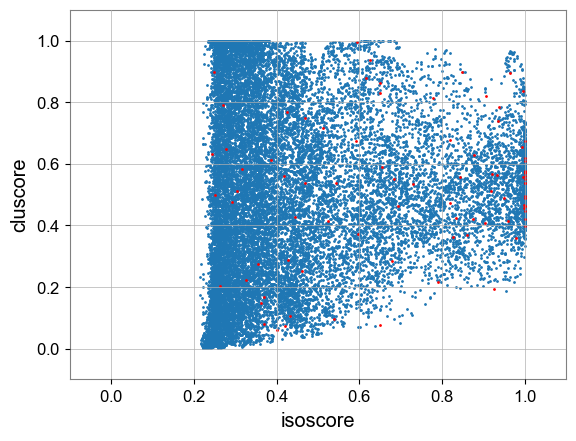

In [163]:
plt.scatter(isoscore_test_noise, cluscore_test_noise,s = 1)
plt.scatter(isoscore_sg, cluscore_sg,s = 1, color = 'r')

plt.xlim(-0.1,1.1)
plt.ylim(-0.1,1.1)
plt.xlabel('isoscore')
plt.ylabel('cluscore')

In [164]:
Geometric_mean_test_isoclu = np.sqrt(isoscore_test_noise * cluscore_test_noise)
Geometric_mean_sg_isoclu = np.sqrt(isoscore_sg * cluscore_sg)

(array([1.03938317, 0.44544993, 0.74241655, 1.33634979,
        1.03938317, 1.63331641, 2.22724965, 2.82118289,
        0.89089986, 0.74241655]),
 array([0.15424198, 0.23165306, 0.30906413, 0.38647521,
        0.46388629, 0.54129736, 0.61870844, 0.69611952,
        0.77353059, 0.85094167, 0.92835274]),
 [<matplotlib.patches.Polygon at 0x15ea3b1b210>])

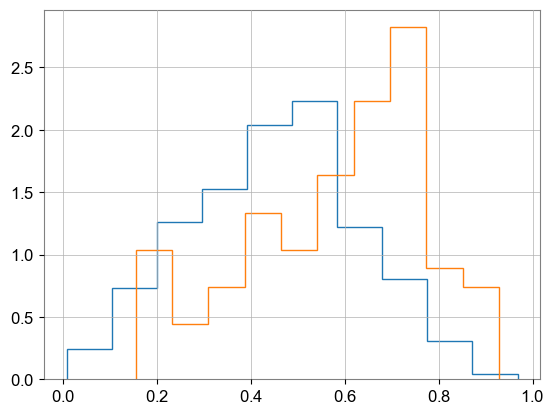

In [165]:
plt.hist(Geometric_mean_test_isoclu, density = True, histtype='step')
plt.hist(Geometric_mean_sg_isoclu, density = True, histtype='step')

In [178]:
bins = 10

isocut_scheme = np.arange(0, 1.0001, 1/bins)
xi = np.zeros(bins)

ratio = len(training_noise_sample_SVMed) / (len(full_test_noise_sample))

total_number_test_noise = 0
total_number_train = 0
total_number_sg = 0

for i in range(bins):
    count_test_noise = np.count_nonzero(np.logical_and(isoscore_test_noise >= isocut_scheme[i],isoscore_test_noise <= isocut_scheme[i+1]))
    count_sg = np.count_nonzero(np.logical_and(isoscore_sg >= isocut_scheme[i],isoscore_sg <= isocut_scheme[i+1]))
    count_train = np.count_nonzero(np.logical_and(isoscore_train_noise >= isocut_scheme[i], isoscore_train_noise <=  isocut_scheme[i+1]))
    
    total_number_test_noise += count_test_noise
    total_number_train += count_train
    total_number_sg += count_sg
    
    print(count_test_noise, count_sg, count_train)
    
    
    xi[i] = (count_test_noise + count_sg - (count_train/ratio)) / np.sqrt(count_train/ratio)
    # xi[i] = (count_test_noise + count_sg - (count_train)) / np.sqrt(count_train)

0 0 0
0 0 0
5808 7 20626
5242 8 18050
2824 10 10136
1449 7 5110
1282 9 4276
823 3 2907
744 9 2669
1630 34 5511


C:\Users\Liyang Miao\AppData\Local\Temp\ipykernel_1000\745874057.py:24: RuntimeWarning: invalid value encountered in scalar divide
  xi[i] = (count_test_noise + count_sg - (count_train/ratio)) / np.sqrt(count_train/ratio)


In [179]:
xi

array([        nan,         nan, -1.37644309,  0.95238081,
       -1.40240195, -0.28407753,  1.81327126, -0.29374093,
       -0.47561903,  2.06184948])

### Now we do a Yingying style weakly supervised learning

In [74]:
np.sort(np.linalg.norm(Feature_space_noise_train[0] - Feature_space_noise_train, axis = 1))[:10]

array([0.00000000e+00, 1.56137975e-06, 2.13784052e-06,
       3.10853797e-06, 5.82822504e-06, 6.88329546e-06,
       6.95985133e-06, 7.00695272e-06, 7.19555710e-06,
       7.33863274e-06])

In [28]:
def mean_distance_k(center_point_sample, reference_sample, k, exclude_self = False):
    mdk = np.zeros(len(center_point_sample))
    
    if exclude_self:
        bias = 1
    else:
        bias = 0
    
    for i in range(len(mdk)):
        mdk[i] = np.mean(np.sort(np.linalg.norm(center_point_sample[i] - reference_sample, axis=1))[bias:bias+k])
    return mdk

In [30]:
mean_distance_k(Feature_space_noise_train[:2], Feature_space_noise_train, 1, exclude_self=False)

array([0., 0.])

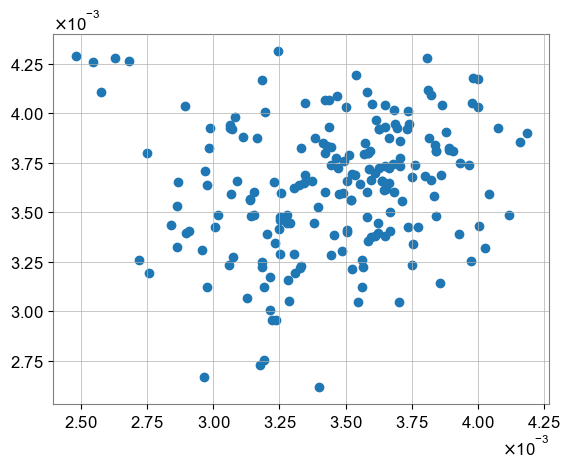

In [76]:
plt.scatter(Feature_space_bbh[:200][:,0],Feature_space_bbh[:200][:,1])

In [11]:
full_test_noise_sample = np.vstack((Feature_space_noise_test, Feature_space_bbh[:200]))

In [37]:
full_test_noise_sample.shape

(19928, 2)

In [38]:
k_for_iso = 175
k_for_clu = 50

In [39]:
dtrainprime = np.mean(mean_distance_k(X_train, X_train, k_for_iso, exclude_self=True))

KeyboardInterrupt: 

In [279]:
dtrainprime

2.833723581277744e-05

In [280]:
Delta_iso_test_noise = (mean_distance_k(full_test_noise_sample[:20000],Feature_space_noise_train,  k_for_iso) - dtrainprime) / np.sqrt(dtrainprime)
Delta_clu_test_noise = (mean_distance_k(full_test_noise_sample[:20000],full_test_noise_sample, k_for_clu, exclude_self=True)**(-2) - mean_distance_k(full_test_noise_sample[:20000],Feature_space_noise_train,k_for_iso)**(-2)) / mean_distance_k(full_test_noise_sample[:20000],Feature_space_noise_train,k_for_iso)**(-1)
Delta_iso_bbh = (mean_distance_k(full_test_noise_sample[20000:],Feature_space_noise_train, k_for_iso) - dtrainprime) / np.sqrt(dtrainprime)
Delta_clu_bbh = (mean_distance_k(full_test_noise_sample[20000:],full_test_noise_sample, k_for_clu, exclude_self=True)**(-2) - mean_distance_k(full_test_noise_sample[20000:],Feature_space_noise_train,k_for_iso)**(-2)) / mean_distance_k(full_test_noise_sample[20000:],Feature_space_noise_train,k_for_iso)**(-1)

In [16]:
Delta_iso_test_noise.shape

(20000,)

In [17]:
Delta_clu_bbh.shape

(200,)

In [191]:
isoscore_test_noise = (1+sp.erf(Delta_iso_test_noise / (np.sqrt(2) * np.sqrt(np.mean(np.square(Delta_iso_test_noise))))))/2

In [209]:
np.sqrt(np.mean(np.square(Delta_iso_bbh)))

0.06960952857640819

In [192]:
np.sqrt(np.mean(np.square(Delta_iso_test_noise)[:-1]))

0.18461598030265328

In [207]:
np.sqrt(np.mean(np.hstack((np.square(Delta_iso_test_noise),np.square(Delta_iso_bbh)))))

0.008500390372100281

In [208]:
np.sqrt(np.mean(np.hstack((np.square(Delta_iso_test_noise),np.square(Delta_iso_bbh))))) - np.sqrt(np.mean(np.square(Delta_iso_test_noise)))

0.0035481849889827544

(array([0.    , 0.    , 1.7135, 3.8005, 1.6425, 0.866 , 0.5875,
        0.393 , 0.3355, 0.6615]),
 array([0. , 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1. ]),
 [<matplotlib.patches.Polygon at 0x20921929c10>])

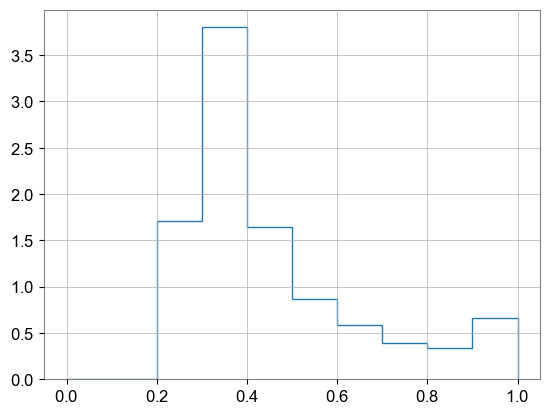

In [192]:
plt.hist(isoscore_test_noise, density = True, bins = np.arange(0,1.1,0.1), histtype='step')

In [ ]:
isoscore_test_noise = (1+sp.erf(Delta_iso_test_noise / (np.sqrt(2) * np.sqrt(np.mean(np.hstack((np.square(Delta_iso_test_noise),np.square(Delta_iso_bbh))))))))/2
cluscore_test_noise = (1+sp.erf(Delta_clu_test_noise / (np.sqrt(np.mean(np.hstack((np.square(Delta_clu_test_noise),np.square(Delta_clu_bbh))))) * np.sqrt(2))))/2

In [ ]:
isoscore_bbh = (1+sp.erf(Delta_iso_bbh / (np.sqrt(2) * np.sqrt(np.mean(np.hstack((np.square(Delta_iso_test_noise),np.square(Delta_iso_bbh))))))))/2
cluscore_bbh = (1+sp.erf(Delta_clu_bbh / (np.sqrt(np.mean(np.hstack((np.square(Delta_clu_test_noise),np.square(Delta_clu_bbh))))) * np.sqrt(2))))/2

In [ ]:
Delta_iso_train_noise = (mean_distance_k(Feature_space_noise_train,Feature_space_noise_train, k_for_iso, exclude_self=True) - dtrainprime) / np.sqrt(dtrainprime)
isoscore_train_noise = (1 + sp.erf(Delta_iso_train_noise / (np.sqrt(2) * np.sqrt(np.mean(np.square(Delta_iso_train_noise))))))/2

In [ ]:
Delta_clu_train_noise = (mean_distance_k(Feature_space_noise_train,full_test_noise_sample, k_for_clu)**(-2) - mean_distance_k(Feature_space_noise_train,Feature_space_noise_train,k_for_iso, exclude_self=True)**(-2)) / mean_distance_k(Feature_space_noise_train,Feature_space_noise_train,k_for_iso,exclude_self=True)**(-1)
cluscore_train_noise = (1 + sp.erf(Delta_clu_train_noise / (np.sqrt(np.mean(np.square(Delta_clu_train_noise))) * np.sqrt(2))))/2

(-0.1, 1.1)

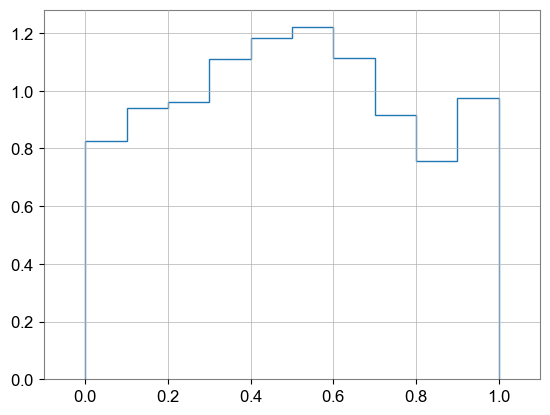

In [241]:
plt.hist(cluscore_train_noise, density = True, histtype='step', bins = np.arange(0,1.1,0.1))
plt.xlim(-0.1, 1.1)

In [202]:
Delta_clu_train_noise = (mean_distance_k(Feature_space_noise_train,Feature_space_noise_train, k_for_iso, exclude_self=True)**(-2) - mean_distance_k(Feature_space_noise_train,Feature_space_noise_train,k_for_iso-1)**(-2)) / mean_distance_k(Feature_space_noise_train,Feature_space_noise_train,k_for_iso-1)**(-1)
cluscore_train_noise = (1 + sp.erf(Delta_clu_train_noise / (np.sqrt(np.mean(np.square(Delta_clu_train_noise))) * np.sqrt(2))))/2

In [204]:
np.array([1,2,3,4,5]) / np.array([2,4,6,8,10])

array([0.5, 0.5, 0.5, 0.5, 0.5])

(-0.1, 1.1)

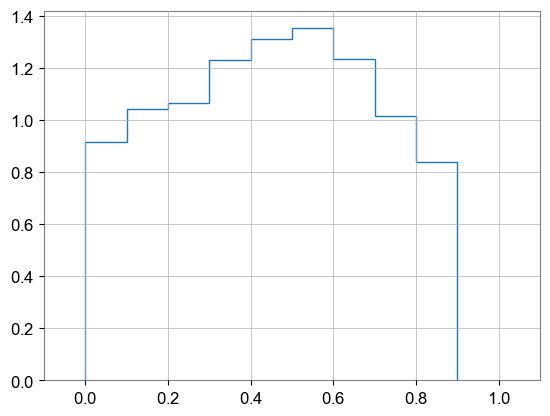

In [236]:
plt.hist(cluscore_train_noise, density = True, histtype='step', bins = np.arange(0,1,0.1))
plt.xlim(-0.1, 1.1)

In [149]:
mean_distance_k(Feature_space_noise_train[:2],Feature_space_noise_train, 2)

array([7.80689874e-07, 3.97675142e-06])

In [107]:
isoscore_test_noise

array([0.54560891, 0.35507065, 0.39090126, ..., 0.42831345,
       0.75127777, 0.33686755])

Text(0, 0.5, 'cluscore')

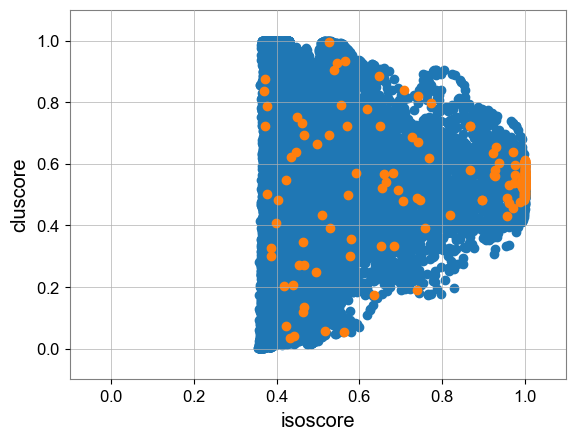

In [238]:
plt.scatter(isoscore_test_noise, cluscore_test_noise)
plt.scatter(isoscore_bbh, cluscore_bbh)

plt.xlim(-0.1,1.1)
plt.ylim(-0.1,1.1)
plt.xlabel('isoscore')
plt.ylabel('cluscore')

Text(0, 0.5, 'cluscore')

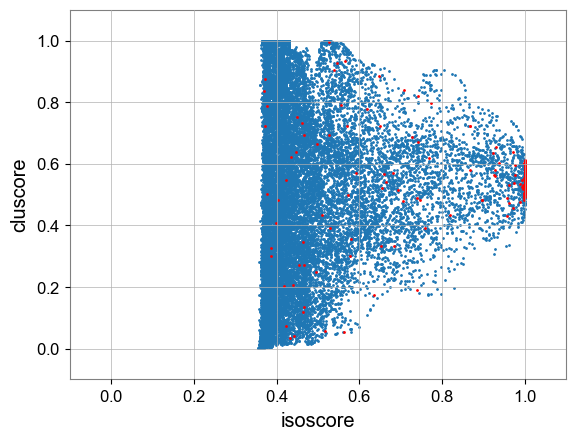

In [262]:
plt.scatter(isoscore_test_noise, cluscore_test_noise,s = 1)
plt.scatter(isoscore_bbh, cluscore_bbh,s = 1, color = 'r')

plt.xlim(-0.1,1.1)
plt.ylim(-0.1,1.1)
plt.xlabel('isoscore')
plt.ylabel('cluscore')

Text(0, 0.5, 'cluscore')

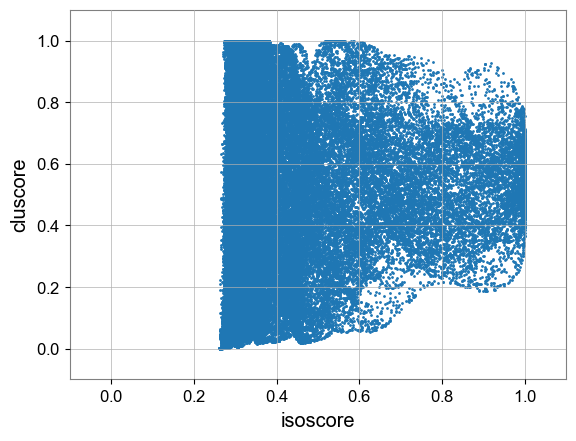

In [259]:
plt.scatter(isoscore_train_noise, cluscore_train_noise,s = 1)
# plt.scatter(isoscore_bbh, cluscore_bbh)

plt.xlim(-0.1,1.1)
plt.ylim(-0.1,1.1)
plt.xlabel('isoscore')
plt.ylabel('cluscore')

Text(0, 0.5, 'cluscore')

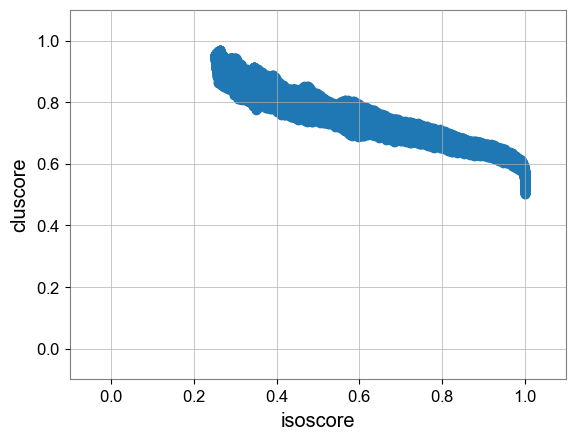

In [116]:
plt.scatter(isoscore_train_noise, cluscore_train_noise)
# plt.scatter(isoscore_bbh, cluscore_bbh)

plt.xlim(-0.1,1.1)
plt.ylim(-0.1,1.1)
plt.xlabel('isoscore')
plt.ylabel('cluscore')

(-0.1, 1.1)

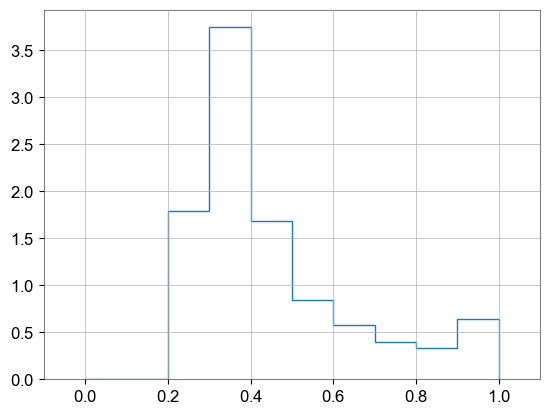

In [240]:
plt.hist(isoscore_train_noise, density = True, histtype='step', bins = np.arange(0,1.1,0.1))
plt.xlim(-0.1, 1.1)

(array([4.85731407, 2.69051302, 1.6091165 , 0.97470738,
        0.68269597, 0.54699655, 0.4238937 , 0.37274398,
        0.35155884, 0.85045939]),
 array([0.25149697, 0.32634728, 0.40119758, 0.47604788,
        0.55089818, 0.62574849, 0.70059879, 0.77544909,
        0.85029939, 0.9251497 , 1.        ]),
 [<matplotlib.patches.Polygon at 0x1b2b13fc790>])

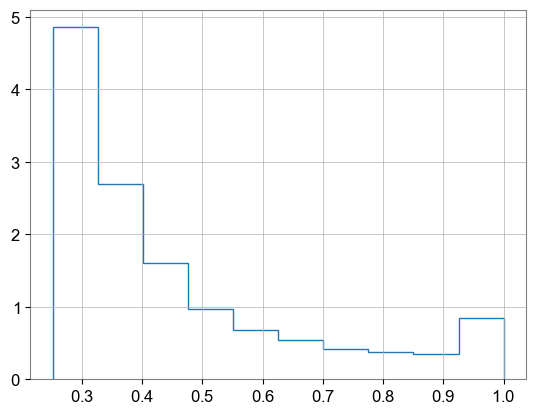

In [117]:
plt.hist(isoscore_train_noise, density = True, histtype='step')

(array([1.73615906, 5.73408619, 4.50642039, 3.40790067,
        2.13417796, 1.66396173, 1.21832994, 0.72135091,
        0.46430352, 0.19698668]),
 array([0.03824868, 0.08415461, 0.13006055, 0.17596648,
        0.22187241, 0.26777834, 0.31368427, 0.35959021,
        0.40549614, 0.45140207, 0.497308  ]),
 [<matplotlib.patches.Polygon at 0x20925cb7490>])

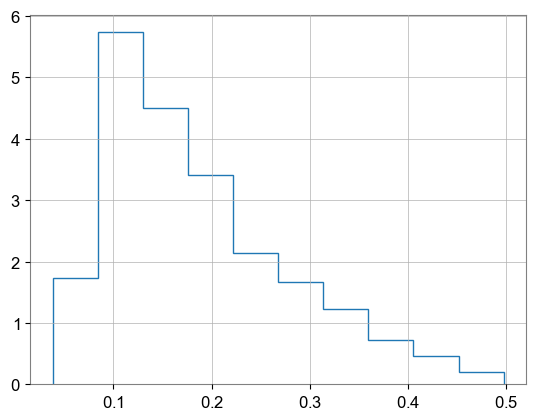

In [152]:
plt.hist(cluscore_train_noise, density = True, histtype='step')

(array([0.2352761 , 0.48340212, 0.73672931, 1.23726468,
        1.73412863, 2.15817632, 3.54352114, 4.63239973,
        5.481107  , 1.17454478]),
 array([0.50200581, 0.54869867, 0.59539154, 0.6420844 ,
        0.68877726, 0.73547012, 0.78216298, 0.82885585,
        0.87554871, 0.92224157, 0.96893443]),
 [<matplotlib.patches.Polygon at 0x1b2b149a1d0>])

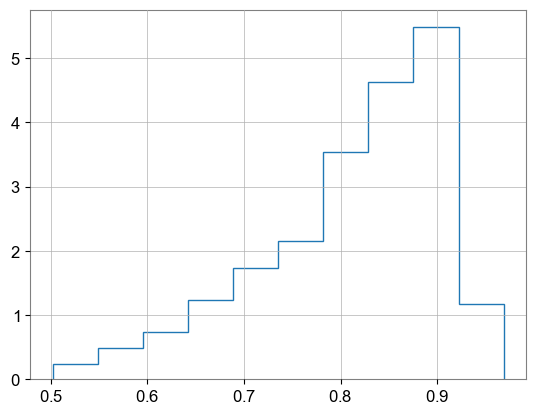

In [118]:
plt.hist(cluscore_train_noise, density = True, histtype='step')

(-0.1, 1.1)

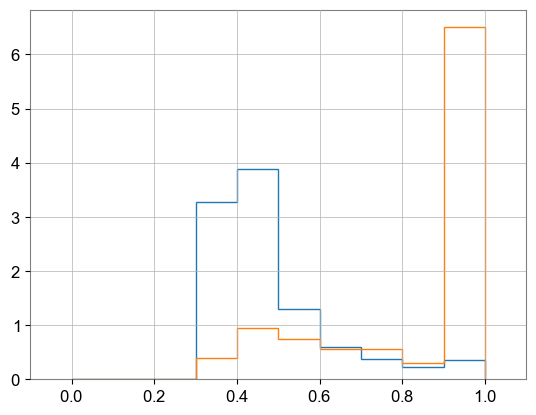

In [242]:
plt.hist(isoscore_test_noise, density = True, histtype='step', bins = np.arange(0,1.1,0.1))
plt.hist(isoscore_bbh, density = True, histtype='step', bins = np.arange(0,1.1,0.1))
plt.xlim(-0.1,1.1)

(array([4.33307419, 1.93605442, 1.38289602, 1.19850988,
        1.93605442, 1.29070295, 1.10631681, 1.01412375,
        2.02824749, 2.21263363]),
 array([0.45567515, 0.50990917, 0.56414318, 0.61837719,
        0.6726112 , 0.72684522, 0.78107923, 0.83531324,
        0.88954725, 0.94378127, 0.99801528]),
 [<matplotlib.patches.Polygon at 0x1b2ad422bd0>])

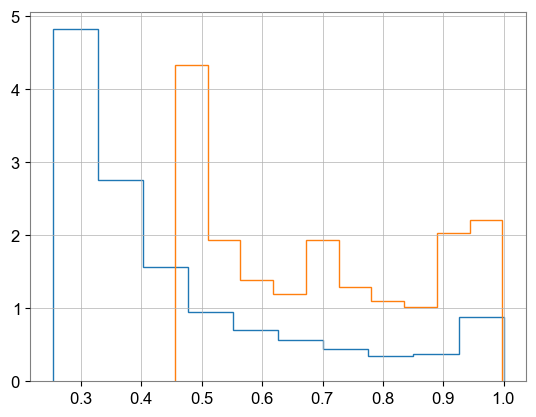

In [109]:
plt.hist(isoscore_test_noise, density = True, histtype='step')
plt.hist(isoscore_bbh, density = True, histtype='step')

(-0.1, 1.1)

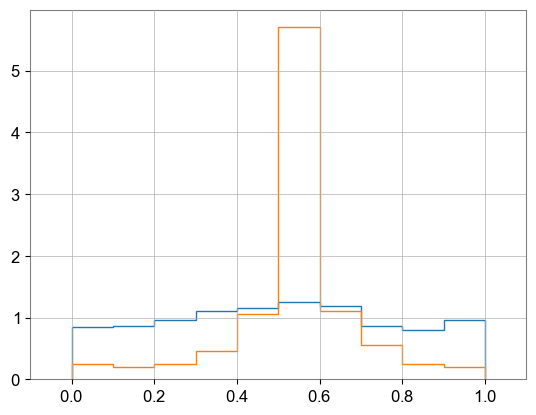

In [243]:
plt.hist(cluscore_test_noise, density = True, histtype='step', bins = np.arange(0,1.1,0.1))
plt.hist(cluscore_bbh, density = True, histtype='step', bins = np.arange(0,1.1,0.1))
plt.xlim(-0.1,1.1)

(array([0.1440479 , 0.07202395, 0.1440479 , 1.58452694,
        2.0886946 , 1.80059879, 2.3767904 , 2.73691016,
        1.58452694, 1.87262274]),
 array([0.30548293, 0.37490428, 0.44432563, 0.51374698,
        0.58316833, 0.65258968, 0.72201103, 0.79143238,
        0.86085373, 0.93027508, 0.99969644]),
 [<matplotlib.patches.Polygon at 0x1b2acb4e910>])

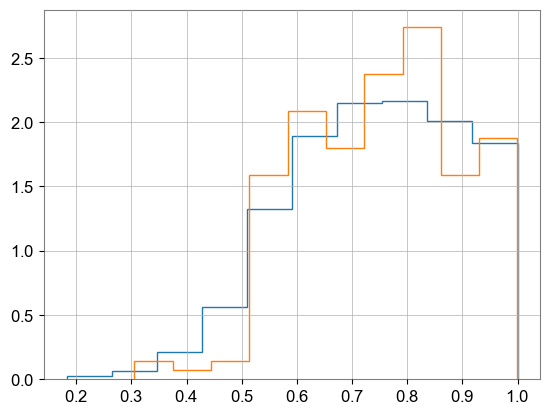

In [110]:
plt.hist(cluscore_test_noise, density = True, histtype='step')
plt.hist(cluscore_bbh, density = True, histtype='step')

In [244]:
bins = 10

isocut_scheme = np.arange(0, 1.0001, 1/bins)
xi = np.zeros(bins)

ratio = 7e4/(2e4+2e2)

total_number_test_noise = 0
total_number_train = 0
total_number_bbh = 0

for i in range(bins):
    count_test_noise = np.count_nonzero(np.logical_and(isoscore_test_noise >= isocut_scheme[i],isoscore_test_noise <= isocut_scheme[i+1]))
    count_bbh = np.count_nonzero(np.logical_and(isoscore_bbh >= isocut_scheme[i],isoscore_bbh <= isocut_scheme[i+1]))
    count_train = np.count_nonzero(np.logical_and(isoscore_train_noise >= isocut_scheme[i], isoscore_train_noise <=  isocut_scheme[i+1]))
    
    total_number_test_noise += count_test_noise
    total_number_train += count_train
    total_number_bbh += count_bbh
    
    print(count_test_noise, count_bbh, count_train)
    
    
    xi[i] = (count_test_noise + count_bbh - (count_train/ratio)) / np.sqrt(count_train/ratio)

0 0 0
0 0 0
0 0 12530
6547 8 26166
7766 19 11759
2593 15 5882
1199 11 4047
739 11 2773
456 6 2348
700 130 4495


C:\Users\Liyang Miao\AppData\Local\Temp\ipykernel_28560\3106673097.py:24: RuntimeWarning: invalid value encountered in scalar divide
  xi[i] = (count_test_noise + count_bbh - (count_train/ratio)) / np.sqrt(count_train/ratio)


In [245]:
xi

array([         nan,          nan, -60.13152252, -11.45933309,
        75.39102978,  22.10290578,   1.23344285,  -1.77490971,
        -8.28140409, -12.9701476 ])

In [160]:
xi

array([          nan,           nan, -116.63618649,
       -118.44519705,  -35.71575479,  -41.87493292,
        -44.00039028,  -38.01699582,  -38.4749278 ,
        -54.44369873])

In [246]:
isoscore_test_noise_prime = 1-(isoscore_test_noise - 0.4) % 1
isoscore_bbh_prime = 1-(isoscore_bbh - 0.4) % 1

Text(0, 0.5, 'cluscore')

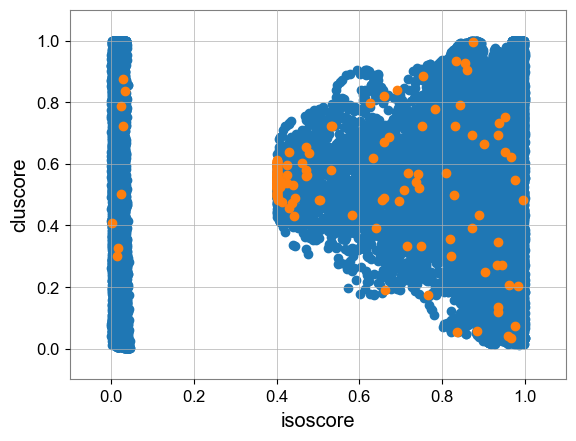

In [247]:
plt.scatter(isoscore_test_noise_prime, cluscore_test_noise)
plt.scatter(isoscore_bbh_prime, cluscore_bbh)

plt.xlim(-0.1,1.1)
plt.ylim(-0.1,1.1)
plt.xlabel('isoscore')
plt.ylabel('cluscore')

Text(0, 0.5, 'cluscore')

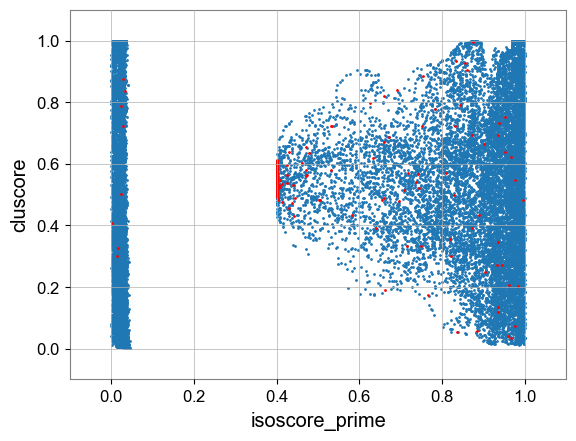

In [266]:
plt.scatter(isoscore_test_noise_prime, cluscore_test_noise, s = 1)
plt.scatter(isoscore_bbh_prime, cluscore_bbh, s = 1,color = 'r')

plt.xlim(-0.1,1.1)
plt.ylim(-0.1,1.1)
plt.xlabel('isoscore_prime')
plt.ylabel('cluscore')

In [248]:
Geometric_mean_test_isoclu = np.sqrt(isoscore_test_noise * cluscore_test_noise)
Geometric_mean_bbh_isoclu = np.sqrt(isoscore_bbh * cluscore_bbh)

(array([0.37300247, 0.14920099, 0.14920099, 0.52220346,
        0.52220346, 0.44760297, 0.96980643, 0.89520593,
        3.20782126, 7.68385092]),
 array([0.12196209, 0.18898578, 0.25600946, 0.32303315,
        0.39005683, 0.45708052, 0.5241042 , 0.59112788,
        0.65815157, 0.72517525, 0.79219894]),
 [<matplotlib.patches.Polygon at 0x2092608fb50>])

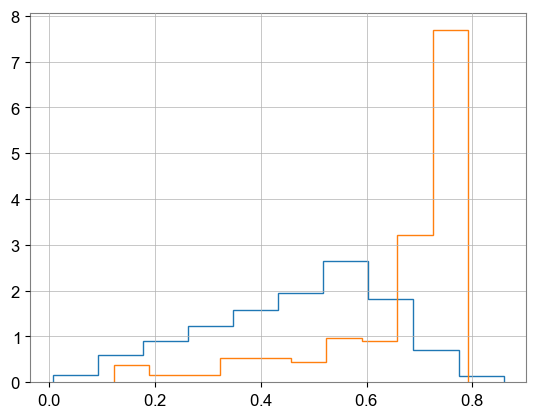

In [256]:
plt.hist(Geometric_mean_test_isoclu, density = True, histtype='step')
plt.hist(Geometric_mean_bbh_isoclu, density = True, histtype='step')

(array([0.34872176, 0.        , 0.23248117, 0.11624059,
        0.92992469, 2.55729291, 5.69578875, 4.53338288,
        4.88210464, 3.95217995]),
 array([0.39461242, 0.43762666, 0.4806409 , 0.52365513,
        0.56666937, 0.6096836 , 0.65269784, 0.69571207,
        0.73872631, 0.78174055, 0.82475478]),
 [<matplotlib.patches.Polygon at 0x1b2afd7abd0>])

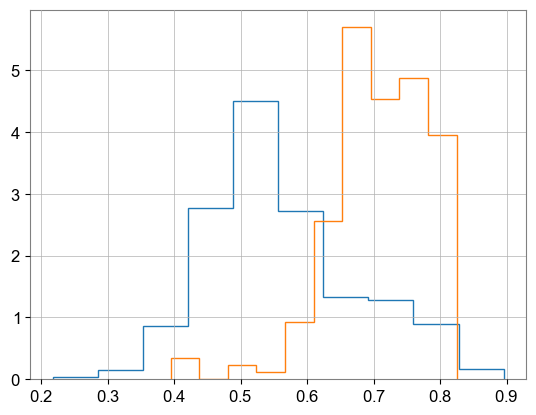

In [159]:
plt.hist(Geometric_mean_test_isoclu, density = True, histtype='step')
plt.hist(Geometric_mean_bbh_isoclu, density = True, histtype='step')

In [172]:
np.count_nonzero(Geometric_mean_bbh_isoclu > 0.7)

140

In [171]:
np.count_nonzero(Geometric_mean_test_isoclu > 0.7)

1412

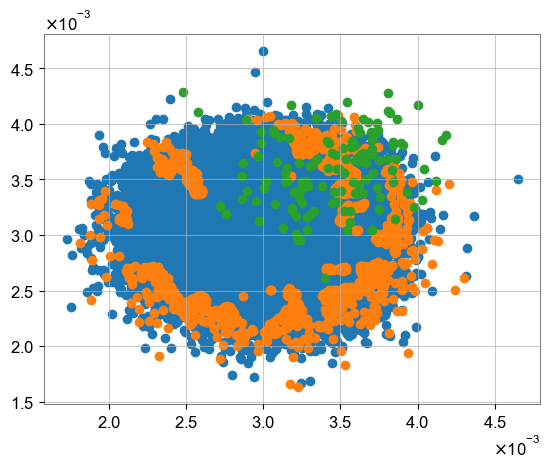

In [249]:
plt.scatter(x = Feature_space_noise_train[:,0],y = Feature_space_noise_train[:,1])
plt.scatter(x = Feature_space_noise_test[np.argwhere(Geometric_mean_test_isoclu > 0.7).flatten()][:,0],y = Feature_space_noise_test[np.argwhere(Geometric_mean_test_isoclu > 0.7).flatten()][:,1])
plt.scatter(x = Feature_space_bbh[np.argwhere(Geometric_mean_bbh_isoclu > 0.7).flatten()][:,0],y = Feature_space_bbh[np.argwhere(Geometric_mean_bbh_isoclu > 0.7).flatten()][:,1])
# plt.scatter(x = Feature_space_sg[:,0],y = Feature_space_sg[:,1])

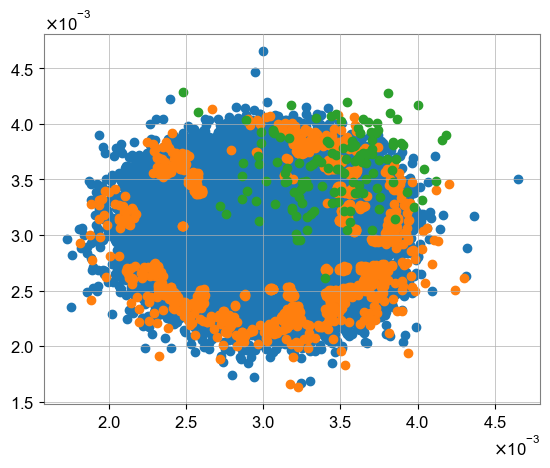

In [136]:
plt.scatter(x = Feature_space_noise_train[:,0],y = Feature_space_noise_train[:,1])
plt.scatter(x = Feature_space_noise_test[np.argwhere(Geometric_mean_test_isoclu > 0.7).flatten()][:,0],y = Feature_space_noise_test[np.argwhere(Geometric_mean_test_isoclu > 0.7).flatten()][:,1])
plt.scatter(x = Feature_space_bbh[np.argwhere(Geometric_mean_bbh_isoclu > 0.7).flatten()][:,0],y = Feature_space_bbh[np.argwhere(Geometric_mean_bbh_isoclu > 0.7).flatten()][:,1])
# plt.scatter(x = Feature_space_sg[:,0],y = Feature_space_sg[:,1])

In [252]:
Geometric_mean_test_isoprimeclu = np.sqrt(isoscore_test_noise_prime * cluscore_test_noise)
Geometric_mean_bbh_isoprimeclu = np.sqrt(isoscore_bbh_prime * cluscore_bbh)

(array([0.22026743, 0.33040114, 0.16520057, 0.22026743,
        5.39655203, 2.69827602, 0.66080229, 0.44053486,
        0.60573543, 0.27533429]),
 array([0.02494052, 0.11573923, 0.20653795, 0.29733667,
        0.38813538, 0.4789341 , 0.56973282, 0.66053154,
        0.75133025, 0.84212897, 0.93292769]),
 [<matplotlib.patches.Polygon at 0x20928f78950>])

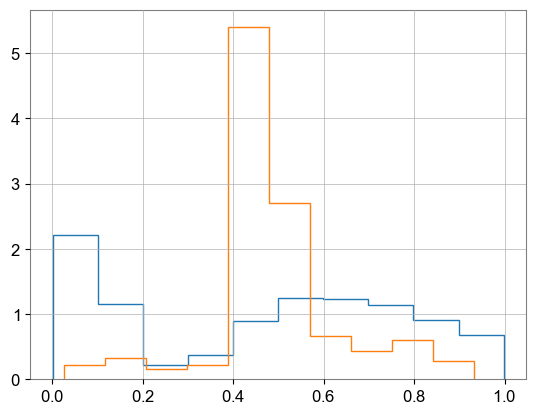

In [255]:
plt.hist(Geometric_mean_test_isoprimeclu, density = True, histtype='step')
plt.hist(Geometric_mean_bbh_isoprimeclu, density = True, histtype='step')

In [106]:
np.count_nonzero(Geometric_mean_bbh_isoprimeclu > 0.7)

68

In [107]:
np.count_nonzero(Geometric_mean_test_isoprimeclu > 0.7)

1775

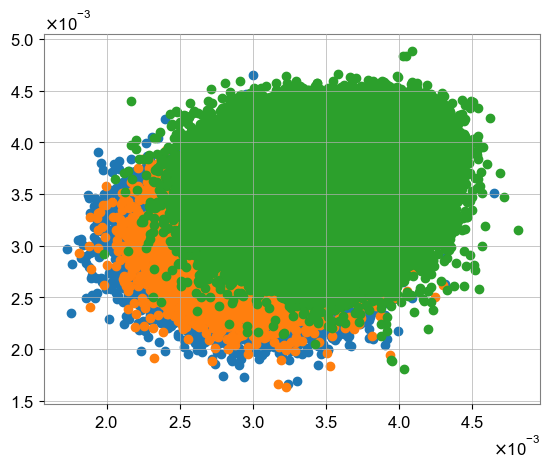

In [139]:
plt.scatter(x = Feature_space_noise_train[:,0],y = Feature_space_noise_train[:,1])
plt.scatter(x = Feature_space_noise_test[:,0],y = Feature_space_noise_test[:,1])
plt.scatter(x = Feature_space_bbh[:,0],y = Feature_space_bbh[:,1])
# plt.scatter(x = Feature_space_sg[:,0],y = Feature_space_sg[:,1])

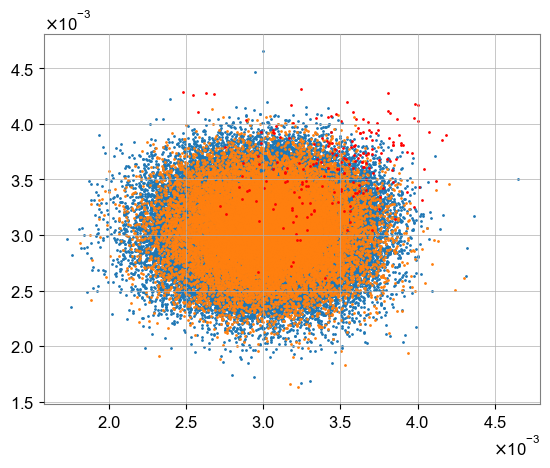

In [277]:
plt.scatter(x = Feature_space_noise_train[:,0],y = Feature_space_noise_train[:,1],s = 1)
plt.scatter(x = Feature_space_noise_test[:,0],y = Feature_space_noise_test[:,1],s = 1)
plt.scatter(x = Feature_space_bbh[:200][:,0],y = Feature_space_bbh[:200][:,1],s = 1)
# plt.scatter(x = Feature_space_sg[:,0],y = Feature_space_sg[:,1])

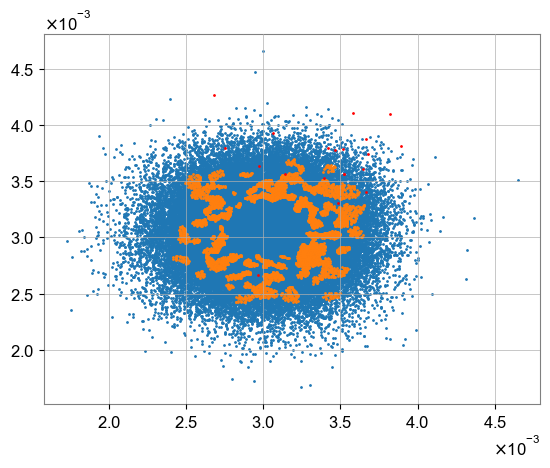

In [269]:
plt.scatter(x = Feature_space_noise_train[:,0],y = Feature_space_noise_train[:,1],s = 1)
plt.scatter(x = Feature_space_noise_test[np.argwhere(Geometric_mean_test_isoprimeclu > 0.7).flatten()][:,0],y = Feature_space_noise_test[np.argwhere(Geometric_mean_test_isoprimeclu > 0.7).flatten()][:,1],s = 1)
plt.scatter(x = Feature_space_bbh[np.argwhere(Geometric_mean_bbh_isoprimeclu > 0.7).flatten()][:,0],y = Feature_space_bbh[np.argwhere(Geometric_mean_bbh_isoprimeclu > 0.7).flatten()][:,1],s = 1, color = 'r')
# plt.scatter(x = Feature_space_sg[:,0],y = Feature_space_sg[:,1])

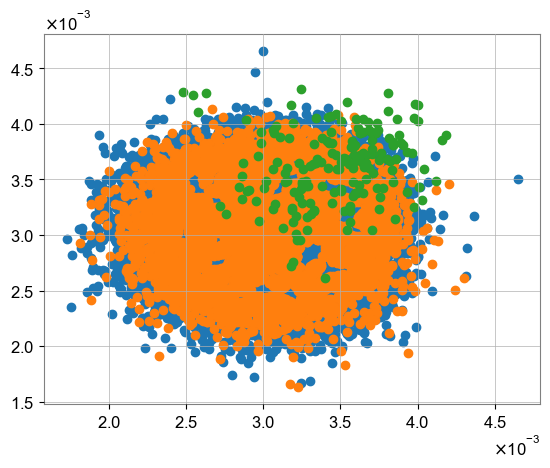

In [170]:
plt.scatter(x = Feature_space_noise_train[:,0],y = Feature_space_noise_train[:,1])
plt.scatter(x = Feature_space_noise_test[np.setdiff1d(np.arange(20000),np.argwhere(Geometric_mean_test_isoprimeclu > 0.7)).flatten()][:,0],y = Feature_space_noise_test[np.setdiff1d(np.arange(20000),np.argwhere(Geometric_mean_test_isoprimeclu > 0.7)).flatten()][:,1])
plt.scatter(x = Feature_space_bbh[np.setdiff1d(np.arange(200),np.argwhere(Geometric_mean_bbh_isoprimeclu > 0.7)).flatten()][:,0],y = Feature_space_bbh[np.setdiff1d(np.arange(200),np.argwhere(Geometric_mean_bbh_isoprimeclu > 0.7)).flatten()][:,1])
# plt.scatter(x = Feature_space_sg[:,0],y = Feature_space_sg[:,1])

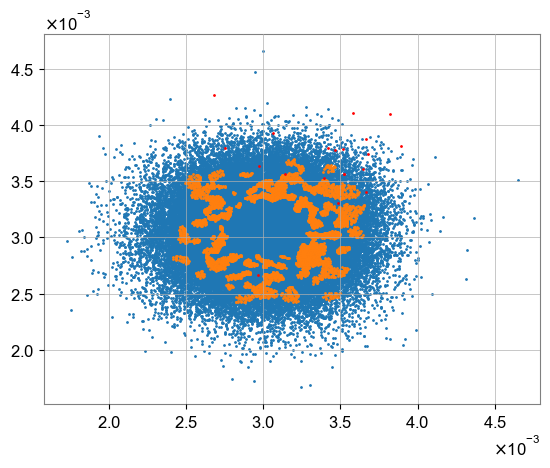

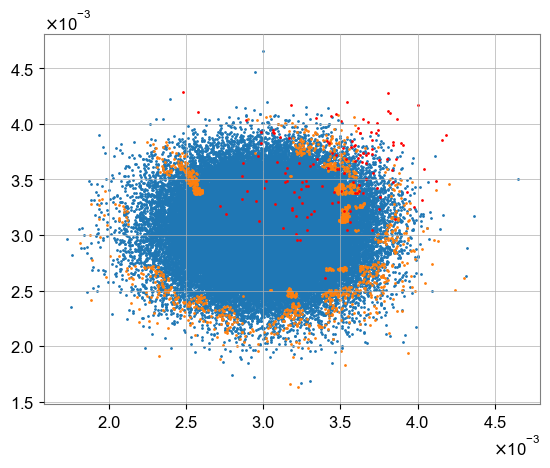

In [270]:
plt.scatter(x = Feature_space_noise_train[:,0],y = Feature_space_noise_train[:,1],s = 1)
plt.scatter(x = Feature_space_noise_test[np.argwhere(Geometric_mean_test_isoprimeclu > 0.7).flatten()][:,0],y = Feature_space_noise_test[np.argwhere(Geometric_mean_test_isoprimeclu > 0.7).flatten()][:,1],s = 1)
plt.scatter(x = Feature_space_bbh[np.argwhere(Geometric_mean_bbh_isoprimeclu > 0.7).flatten()][:,0],y = Feature_space_bbh[np.argwhere(Geometric_mean_bbh_isoprimeclu > 0.7).flatten()][:,1],s = 1,color = 'r')
# plt.scatter(x = Feature_space_sg[:,0],y = Feature_space_sg[:,1])
plt.show()

plt.scatter(x = Feature_space_noise_train[:,0],y = Feature_space_noise_train[:,1],s = 1)
plt.scatter(x = Feature_space_noise_test[np.argwhere(Geometric_mean_test_isoclu > 0.7).flatten()][:,0],y = Feature_space_noise_test[np.argwhere(Geometric_mean_test_isoclu > 0.7).flatten()][:,1],s = 1)
plt.scatter(x = Feature_space_bbh[np.argwhere(Geometric_mean_bbh_isoclu > 0.7).flatten()][:,0],y = Feature_space_bbh[np.argwhere(Geometric_mean_bbh_isoclu > 0.7).flatten()][:,1],s = 1,color = 'r')
# plt.scatter(x = Feature_space_sg[:,0],y = Feature_space_sg[:,1])
plt.show()

In [43]:
full_test_noise_sample = np.vstack((Feature_space_noise_test, Feature_space_sg[:200]))
dtrainprime = np.mean(mean_distance_k(Feature_space_noise_train, Feature_space_noise_train, 800))

Delta_iso_test_noise = (mean_distance_k(full_test_noise_sample[:20000],Feature_space_noise_train,800) - dtrainprime) / np.sqrt(dtrainprime)
Delta_clu_test_noise = (mean_distance_k(full_test_noise_sample[:20000],full_test_noise_sample, 200)**(-2) - mean_distance_k(full_test_noise_sample[:20000],Feature_space_noise_train,800)**(-2)) / mean_distance_k(full_test_noise_sample[:20000],Feature_space_noise_train,800)**(-1)
Delta_iso_sg = (mean_distance_k(full_test_noise_sample[20000:],Feature_space_noise_train,800) - dtrainprime) / np.sqrt(dtrainprime)
Delta_clu_sg = (mean_distance_k(full_test_noise_sample[20000:],full_test_noise_sample, 200)**(-2) - mean_distance_k(full_test_noise_sample[20000:],Feature_space_noise_train,800)**(-2)) / mean_distance_k(full_test_noise_sample[20000:],Feature_space_noise_train,800)**(-1)

isoscore_test_noise = (1+sp.erf(Delta_iso_test_noise / (np.sqrt(2) * np.sqrt(np.mean(np.square(Delta_iso_test_noise))))))/2
cluscore_test_noise = (1+sp.erf(Delta_clu_test_noise / (np.sqrt(np.mean(np.square(Delta_clu_test_noise))) * np.sqrt(2))))/2
isoscore_sg = (1+sp.erf(Delta_iso_sg / (np.sqrt(2) * np.sqrt(np.mean(np.square(Delta_iso_sg))))))/2
cluscore_sg = (1+sp.erf(Delta_clu_sg / (np.sqrt(np.mean(np.square(Delta_clu_sg))) * np.sqrt(2))))/2

Text(0, 0.5, 'cluscore')

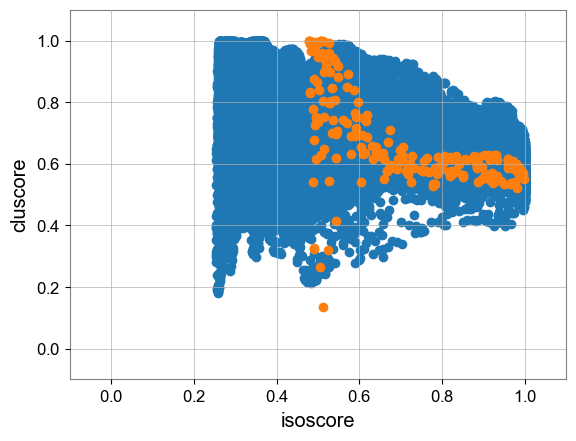

In [45]:
plt.scatter(isoscore_test_noise, cluscore_test_noise)
plt.scatter(isoscore_sg, cluscore_sg)

plt.xlim(-0.1,1.1)
plt.ylim(-0.1,1.1)
plt.xlabel('isoscore')
plt.ylabel('cluscore')

In [46]:
bins = 10

isocut_scheme = np.arange(0, 1.0001, 1/bins)
xi = np.zeros(bins)

total_number_test_noise = 0
total_number_train = 0
total_number_sg = 0

for i in range(bins):
    count_test_noise = np.count_nonzero(np.logical_and(isoscore_test_noise >= isocut_scheme[i],isoscore_test_noise <= isocut_scheme[i+1]))
    count_sg = np.count_nonzero(np.logical_and(isoscore_sg >= isocut_scheme[i],isoscore_sg <= isocut_scheme[i+1]))
    count_train = np.count_nonzero(np.logical_and(isoscore_train_noise >= isocut_scheme[i], isoscore_train_noise <=  isocut_scheme[i+1]))
    
    total_number_test_noise += count_test_noise
    total_number_train += count_train
    total_number_sg += count_sg
    
    print(count_test_noise, count_sg, count_train)
    
    
    xi[i] = (count_test_noise + count_sg - count_train) / np.sqrt(count_train)

0 0 0
0 0 0
5073 0 18751
6130 0 20660
2933 25 10458
1644 51 5623
1164 28 4017
861 28 2901
688 25 2518
1507 43 5072


C:\Users\Liyang Miao\AppData\Local\Temp\ipykernel_28560\1032186922.py:22: RuntimeWarning: invalid value encountered in scalar divide
  xi[i] = (count_test_noise + count_sg - count_train) / np.sqrt(count_train)


In [47]:
xi

array([          nan,           nan,  -99.88732493,
       -101.08819819,  -73.33933111,  -52.38264663,
        -44.57255569,  -37.355462  ,  -35.9707376 ,
        -49.45380695])

(array([0.34872176, 0.        , 0.23248117, 0.11624059,
        0.92992469, 2.55729291, 5.69578875, 4.53338288,
        4.88210464, 3.95217995]),
 array([0.39461242, 0.43762666, 0.4806409 , 0.52365513,
        0.56666937, 0.6096836 , 0.65269784, 0.69571207,
        0.73872631, 0.78174055, 0.82475478]),
 [<matplotlib.patches.Polygon at 0x208e433edd0>])

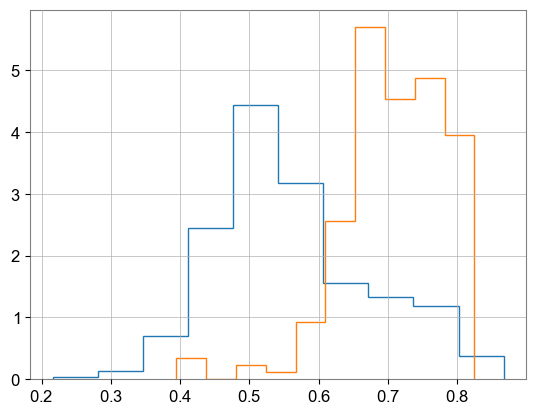

In [50]:
Geometric_mean_test_isoclu = np.sqrt(isoscore_test_noise * cluscore_test_noise)
Geometric_mean_sg_isoclu = np.sqrt(isoscore_bbh * cluscore_bbh)
plt.hist(Geometric_mean_test_isoclu, density = True, histtype='step')
plt.hist(Geometric_mean_sg_isoclu, density = True, histtype='step')

In [48]:
isoscore_test_noise_prime = (isoscore_test_noise + 0.1) % 1
isoscore_sg_prime = (isoscore_sg + 0.1) % 1

(array([0.32567656, 0.58621781, 1.88892405, 0.06513531,
        0.06513531, 0.19540594, 0.06513531, 0.5210825 ,
        3.90811873, 5.40623092]),
 array([0.02017638, 0.09693965, 0.17370293, 0.25046621,
        0.32722948, 0.40399276, 0.48075604, 0.55751932,
        0.63428259, 0.71104587, 0.78780915]),
 [<matplotlib.patches.Polygon at 0x208e46def10>])

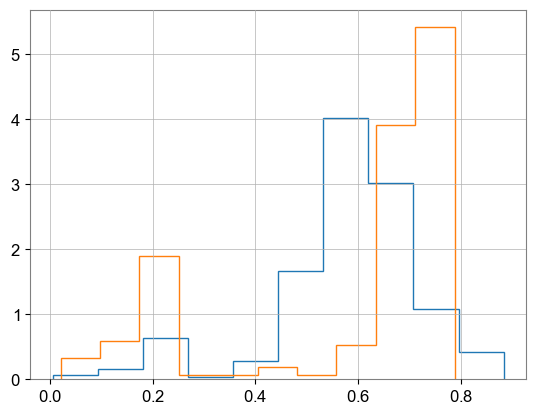

In [52]:
Geometric_mean_test_isoprimeclu = np.sqrt(isoscore_test_noise_prime * cluscore_test_noise)
Geometric_mean_sg_isoprimeclu = np.sqrt(isoscore_sg_prime * cluscore_sg)

plt.hist(Geometric_mean_test_isoprimeclu, density = True, histtype='step')
plt.hist(Geometric_mean_sg_isoprimeclu, density = True, histtype='step')

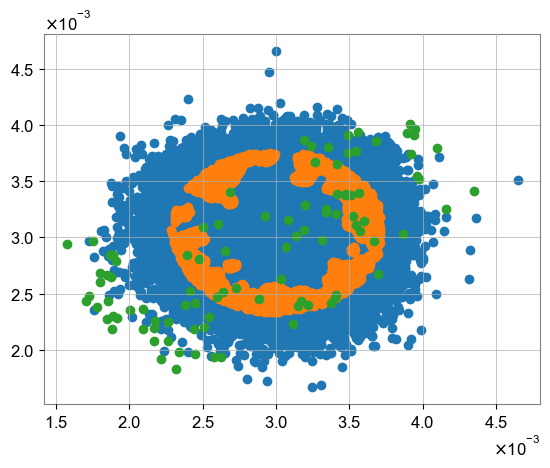

In [53]:
plt.scatter(x = Feature_space_noise_train[:,0],y = Feature_space_noise_train[:,1])
plt.scatter(x = Feature_space_noise_test[np.argwhere(Geometric_mean_test_isoprimeclu > 0.7).flatten()][:,0],y = Feature_space_noise_test[np.argwhere(Geometric_mean_test_isoprimeclu > 0.7).flatten()][:,1])
plt.scatter(x = Feature_space_sg[np.argwhere(Geometric_mean_sg_isoprimeclu > 0.7).flatten()][:,0],y = Feature_space_sg[np.argwhere(Geometric_mean_sg_isoprimeclu > 0.7).flatten()][:,1])
# plt.scatter(x = Feature_space_sg[:,0],y = Feature_space_sg[:,1])

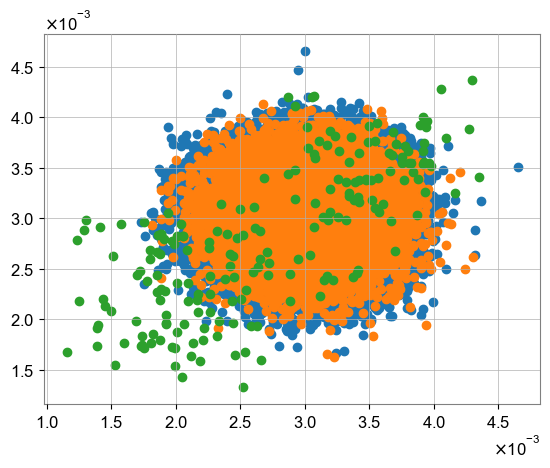

In [44]:
plt.scatter(x = Feature_space_noise_train[:,0],y = Feature_space_noise_train[:,1])
plt.scatter(x = Feature_space_noise_test[:,0],y = Feature_space_noise_test[:,1])
plt.scatter(x = Feature_space_sg[:200][:,0],y = Feature_space_sg[:200][:,1])
# plt.scatter(x = Feature_space_sg[:,0],y = Feature_space_sg[:,1])

In [ ]:
plt.scatter(x = Feature_space_noise_train[:,0],y = Feature_space_noise_train[:,1])
plt.scatter(x = Feature_space_noise_test[np.argwhere(Geometric_mean_test_isoprimeclu > 0.7).flatten()][:,0],y = Feature_space_noise_test[np.argwhere(Geometric_mean_test_isoprimeclu > 0.7).flatten()][:,1])
plt.scatter(x = Feature_space_bbh[np.argwhere(Geometric_mean_bbh_isoprimeclu > 0.7).flatten()][:,0],y = Feature_space_bbh[np.argwhere(Geometric_mean_bbh_isoprimeclu > 0.7).flatten()][:,1])
# plt.scatter(x = Feature_space_sg[:,0],y = Feature_space_sg[:,1])

### How about performing a weakly supervised learning on this dataset, at least for bbh dataset?

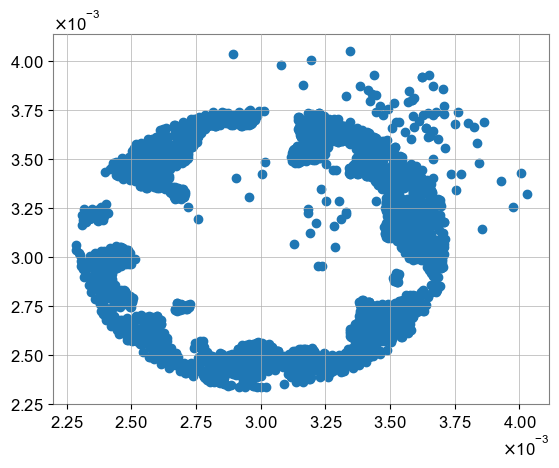

In [37]:
plt.scatter(data_signal[:,0],data_signal[:,1])

(2995, 2)
(70000, 2)
Epoch: 0001, Training loss=1.92231131, Validation loss=1.33843073
Epoch: 0002, Training loss=1.18566871, Validation loss=1.31931634
Epoch: 0003, Training loss=1.18139601, Validation loss=1.32636196
Epoch: 0004, Training loss=1.18008769, Validation loss=1.29989249
Epoch: 0005, Training loss=1.18058920, Validation loss=1.29547449
Epoch: 0006, Training loss=1.18202710, Validation loss=1.29300897
Epoch: 0007, Training loss=1.18368459, Validation loss=1.29183413
Epoch: 0008, Training loss=1.18532503, Validation loss=1.29130042
Epoch: 0009, Training loss=1.71606123, Validation loss=1.29111819
Epoch: 0010, Training loss=1.18812013, Validation loss=1.29111023
Epoch: 0011, Training loss=1.18925500, Validation loss=1.30650715
Epoch: 0012, Training loss=1.19021893, Validation loss=1.29132794
Epoch: 0013, Training loss=1.19107330, Validation loss=1.29147693
Epoch: 0014, Training loss=1.19167256, Validation loss=1.29160124
Epoch: 0015, Training loss=0.68761444, Validation loss=

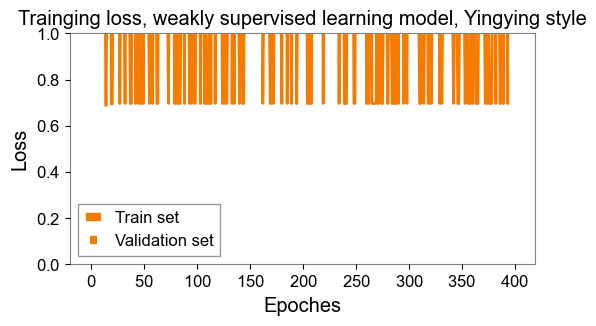

In [39]:
data_signal = np.vstack((Feature_space_noise_test[np.argwhere(Geometric_mean_test_isoprimeclu > 0.7).flatten()], Feature_space_bbh[np.argwhere(Geometric_mean_bbh_isoprimeclu > 0.7).flatten()]))
# data_bkg = Feature_space_noise_train[np.random.choice(len(data_signal),size = min(len(data_signal),len(Feature_space_noise_train)),  replace=False)]
data_bkg = Feature_space_noise_train

print(data_signal.shape)
print(data_bkg.shape)

data_signal_labeled = np.hstack((data_signal,np.ones(len(data_signal)).reshape(-1,1)))
data_bkg_labeled = np.hstack((data_bkg,np.zeros(len(data_bkg)).reshape(-1,1)))

Final_training_and_validation_set = np.vstack((data_signal_labeled, data_bkg_labeled))
np.random.shuffle(Final_training_and_validation_set)

trainData = torch.FloatTensor(Final_training_and_validation_set[:int(0.9 * len(Final_training_and_validation_set))])
validationData = torch.FloatTensor(Final_training_and_validation_set[int(0.9 * len(Final_training_and_validation_set)):])
train_dataset = TensorDataset(trainData, trainData)
validation_dataset = TensorDataset(validationData, validationData)

trainDataLoader = DataLoader(dataset=train_dataset, batch_size=batch_size, shuffle=True)
validationDataLoader = DataLoader(dataset=validation_dataset, batch_size=batch_size, shuffle = True)


autoencoder = SupervisedModel().cuda()
optimizer = optim.Adam(autoencoder.parameters(), lr=0.00005)
loss_func = nn.BCEWithLogitsLoss(pos_weight=torch.FloatTensor([len(data_bkg) / len(data_signal)])).cuda()
loss_train = np.zeros((epochs, 1))
loss_validation = np.zeros((epochs, 1))


for epoch in range(epochs):
    # 训练阶段
    autoencoder.train()
    for batchidx, (x, _) in enumerate(trainDataLoader):
        x = x.cuda()
        decoded = autoencoder(x[:,:2])
        # weighted_lossTrain = loss_func(decoded, x)
        loss_overall = loss_func(decoded.flatten(), x[:,-1])
        # loss_norm = loss_func(decoded[:, -1], x[:, -1])
        
        weighted_lossTrain = loss_overall
        # weighted_lossTrain = loss_overall + loss_norm * coef_delta
        
        # output_norm = torch.norm(decoded[:, :100], dim=1) 
        # penalty_term = torch.mean((output_norm - 1) ** 2) 
        # weighted_lossTrain = lossTrain + coef_delta * penalty_term
        
        optimizer.zero_grad()
        weighted_lossTrain.backward()
        optimizer.step()

    # 验证阶段
    autoencoder.eval()
    with torch.no_grad():
        val_loss = 0
        for batchidx, (x, _) in enumerate(validationDataLoader):
            x = x.cuda()
            decoded = autoencoder(x[:,:2])
            lossVal_overall = loss_func(decoded.flatten(), x[:,-1])
            lossVal_norm = loss_func(decoded[:, -1], x[:, -1])
            lossVal = lossVal_overall + lossVal_norm * coef_delta
            val_loss += lossVal.item()

        val_loss /= len(validationDataLoader)
    
    loss_train[epoch,0] = weighted_lossTrain.item()
    loss_validation[epoch,0] = val_loss
    # print('Epoch: %04d, Training loss=%.8f' % (epoch+1, weighted_lossTrain.item()))
    print('Epoch: %04d, Training loss=%.8f, Validation loss=%.8f' % (epoch+1, weighted_lossTrain.item(), val_loss))
    
torch.save(autoencoder.cpu(),'../Model_cached/model_weakly_supervised_2-8-6-4-1_GWAK_Yingyingstyle_anomaly_weighted_1.pt')


fig = plt.figure(figsize=(6, 3))
ax = plt.subplot(1, 1, 1)
ax.grid()
ax.plot(loss_train, color=[245/255, 124/255, 0/255], linestyle='-', linewidth=2, label = 'Train set') 
ax.plot(loss_validation, color=[245/255, 124/255, 0/255], linestyle='--', linewidth=2, label = 'Validation set') 
ax.set_xlabel('Epoches')
ax.set_ylabel('Loss')
ax.set_title('Trainging loss, weakly supervised learning model, Yingying style')
plt.ylim(0,1)
plt.legend()
# plt.show()
plt.savefig('../Pic_cached/Trainging loss, weakly supervised learning model_Yingyingstyle_anomaly_weighted,2-8-6-4-1_1.png')

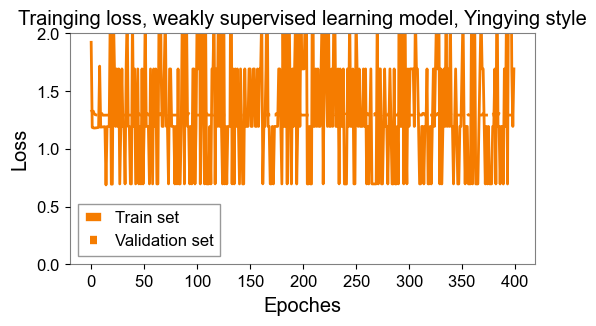

In [40]:
fig = plt.figure(figsize=(6, 3))
ax = plt.subplot(1, 1, 1)
ax.grid()
ax.plot(loss_train, color=[245/255, 124/255, 0/255], linestyle='-', linewidth=2, label = 'Train set') 
ax.plot(loss_validation, color=[245/255, 124/255, 0/255], linestyle='--', linewidth=2, label = 'Validation set') 
ax.set_xlabel('Epoches')
ax.set_ylabel('Loss')
ax.set_title('Trainging loss, weakly supervised learning model, Yingying style')
plt.ylim(0,2)
plt.legend()
# plt.show()
plt.savefig('../Pic_cached/Trainging loss, weakly supervised learning model_Yingyingstyle_anomaly_weighted,2-8-6-4-1_1.png')

(array([ 0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
         0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
         0.,  0.,  0., 50.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
         0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
         0.,  0.,  0.,  0.,  0.,  0.]),
 array([0.00153756, 0.02153756, 0.04153756, 0.06153756,
        0.08153756, 0.10153756, 0.12153756, 0.14153756,
        0.16153756, 0.18153756, 0.20153756, 0.22153756,
        0.24153756, 0.26153756, 0.28153756, 0.30153756,
        0.32153756, 0.34153756, 0.36153756, 0.38153756,
        0.40153756, 0.42153756, 0.44153756, 0.46153756,
        0.48153756, 0.50153756, 0.52153756, 0.54153756,
        0.56153756, 0.58153756, 0.60153756, 0.62153756,
        0.64153756, 0.66153756, 0.68153756, 0.70153756,
        0.72153756, 0.74153756, 0.76153756, 0.78153756,
        0.80153756, 0.82153756, 0.84153756, 0.86153756,
        0.88153756, 0.90153756, 0.92153756, 0.94153756,
        0.96153756, 0.98153756, 1.00

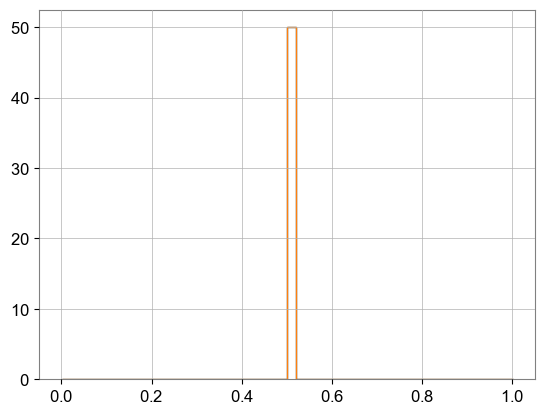

In [41]:
decodedTestdata = torch.sigmoid(autoencoder(torch.FloatTensor(Feature_space_noise_test)))
decodedTestdata = decodedTestdata.double()
reconstructedData_test = decodedTestdata.detach().numpy()

decodedTestdata = torch.sigmoid(autoencoder(torch.FloatTensor(Feature_space_bbh[:200])))
decodedTestdata = decodedTestdata.double()
reconstructedData_injected = decodedTestdata.detach().numpy()

plt.hist(reconstructedData_test, density = True, bins = 50, histtype='step')
plt.hist(reconstructedData_injected, density = True, bins = 50, histtype='step')

(array([ 6388.6837813 ,     0.        ,     0.        ,
            0.        ,  4259.12252085,  6388.6837813 ,
         4259.12252087, 10647.80630216,  6388.6837813 ,
         4259.12252087,  6388.6837813 , 10647.80630216,
         6388.68378128, 10647.80630216,  6388.6837813 ,
        19166.0513439 ,  4259.12252087, 19166.0513439 ,
        10647.80630216,  4259.12252087,  2129.56126043,
        10647.80630216, 12777.3675626 ,  8518.24504173,
        12777.3675626 ,  2129.56126043, 21295.61260433,
        21295.61260433, 14906.92882303, 10647.80630213,
        12777.3675626 , 31943.41890649, 10647.80630216,
         6388.6837813 , 19166.0513439 ,  8518.24504173,
        17036.49008346,  4259.12252085,  8518.24504173,
         8518.24504173,  8518.24504173,  8518.24504173,
         4259.12252087,  4259.12252087,     0.        ,
         2129.56126043,  2129.56126043,  6388.6837813 ,
         2129.56126043,  2129.56126043]),
 array([0.04065538, 0.04065773, 0.04066007, 0.04066242,
      

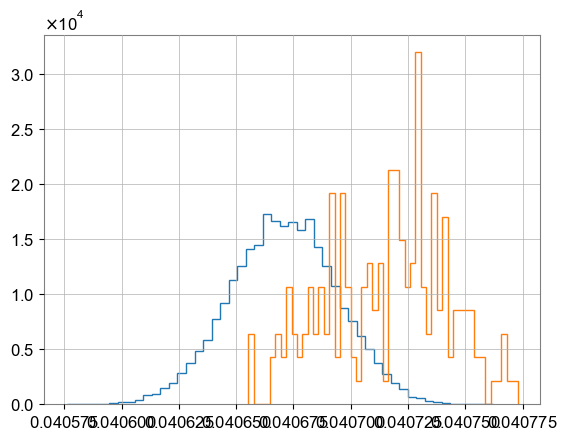

In [36]:
decodedTestdata = torch.sigmoid(autoencoder(torch.FloatTensor(Feature_space_noise_test)))
decodedTestdata = decodedTestdata.double()
reconstructedData_test = decodedTestdata.detach().numpy()

decodedTestdata = torch.sigmoid(autoencoder(torch.FloatTensor(Feature_space_bbh[:200])))
decodedTestdata = decodedTestdata.double()
reconstructedData_injected = decodedTestdata.detach().numpy()

plt.hist(reconstructedData_test, density = True, bins = 50, histtype='step')
plt.hist(reconstructedData_injected, density = True, bins = 50, histtype='step')

(array([ 12446.00593431,  37338.01780292,  12446.00593431,
             0.        ,  12446.00593774,  37338.01780292,
         24892.01186861,  24892.01186861,  37338.01780292,
         12446.00593431,      0.        ,  74676.03560583,
         49784.02375098,  37338.01780292,  12446.00593431,
        124460.05934305,  87122.04154014,  49784.02373722,
         74676.03560583,  87122.04154014,  49784.02375098,
         12446.00593431,  37338.01780292,  74676.03560583,
         24892.01186861,  74676.03560583,  87122.04154014,
        136906.06527736,  74676.03560583,  99568.04750196,
         74676.03560583, 149352.07121166, 124460.05934305,
         87122.04154014,  62230.02967153,  62230.02967153,
         62230.02967153,  37338.01781323,  24892.01186861,
         87122.04154014,  62230.02967153,  49784.02373722,
         12446.00593431,  12446.00593431,  12446.00593431,
         49784.02375098,  12446.00593431,      0.        ,
         12446.00593431,  12446.00593431]),
 array([0.50

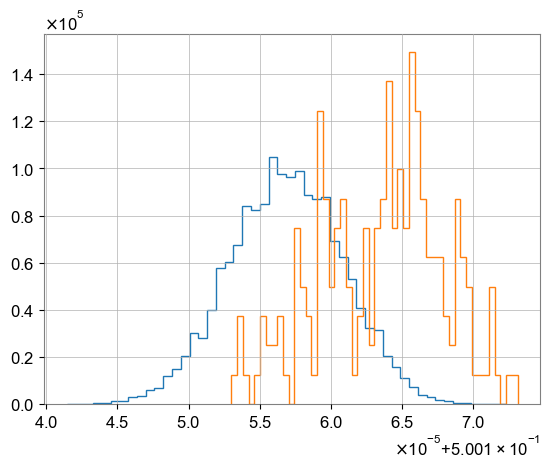

In [34]:
decodedTestdata = torch.sigmoid(autoencoder(torch.FloatTensor(Feature_space_noise_test)))
decodedTestdata = decodedTestdata.double()
reconstructedData_test = decodedTestdata.detach().numpy()

decodedTestdata = torch.sigmoid(autoencoder(torch.FloatTensor(Feature_space_bbh[:200])))
decodedTestdata = decodedTestdata.double()
reconstructedData_injected = decodedTestdata.detach().numpy()

plt.hist(reconstructedData_test, density = True, bins = 50, histtype='step')
plt.hist(reconstructedData_injected, density = True, bins = 50, histtype='step')

## Weakly supervised learning part

### Baseline - Just using the SVM

In [249]:
X_bbh.shape

(200, 2)

In [250]:
indices_bbh_anomaly.shape

(134,)

(3419, 2)
(70000, 2)
Epoch: 0001, Training loss=1.08124113, Validation loss=1.25303410
Epoch: 0002, Training loss=1.62757242, Validation loss=1.20005131
Epoch: 0003, Training loss=1.13333738, Validation loss=1.13278735
Epoch: 0004, Training loss=1.35446513, Validation loss=1.06125215
Epoch: 0005, Training loss=1.17093897, Validation loss=0.99331965
Epoch: 0006, Training loss=1.07160318, Validation loss=0.93629305
Epoch: 0007, Training loss=0.53537869, Validation loss=0.88775178
Epoch: 0008, Training loss=0.52945006, Validation loss=0.84784053
Epoch: 0009, Training loss=0.52043688, Validation loss=0.80804933
Epoch: 0010, Training loss=0.84664166, Validation loss=0.76982305
Epoch: 0011, Training loss=2.14181066, Validation loss=0.73427693
Epoch: 0012, Training loss=0.31985599, Validation loss=0.69699307
Epoch: 0013, Training loss=0.43078607, Validation loss=0.66909628
Epoch: 0014, Training loss=0.63490015, Validation loss=0.62854664
Epoch: 0015, Training loss=1.07776153, Validation loss=

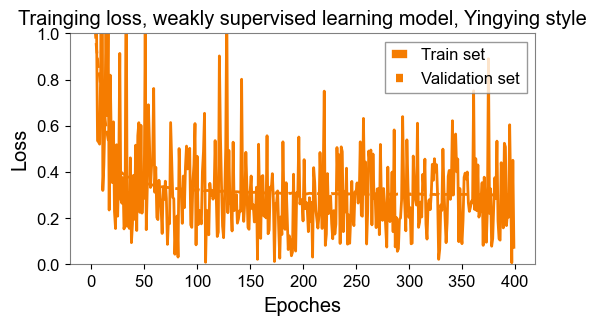

In [436]:
data_signal = np.vstack((X_test[indices_test_noise_anomaly], X_bbh[indices_bbh_anomaly]))
# data_bkg = Feature_space_noise_train[np.random.choice(len(data_signal),size = min(len(data_signal),len(Feature_space_noise_train)),  replace=False)]
data_bkg = X_train

print(data_signal.shape)
print(data_bkg.shape)

data_signal_labeled = np.hstack((data_signal,np.ones(len(data_signal)).reshape(-1,1)))
data_bkg_labeled = np.hstack((data_bkg,np.zeros(len(data_bkg)).reshape(-1,1)))

Final_training_and_validation_set = np.vstack((data_signal_labeled, data_bkg_labeled))
np.random.shuffle(Final_training_and_validation_set)

trainData = torch.FloatTensor(Final_training_and_validation_set[:int(0.9 * len(Final_training_and_validation_set))])
validationData = torch.FloatTensor(Final_training_and_validation_set[int(0.9 * len(Final_training_and_validation_set)):])
train_dataset = TensorDataset(trainData, trainData)
validation_dataset = TensorDataset(validationData, validationData)

trainDataLoader = DataLoader(dataset=train_dataset, batch_size=batch_size, shuffle=True)
validationDataLoader = DataLoader(dataset=validation_dataset, batch_size=batch_size, shuffle = True)


autoencoder = SupervisedModel().cuda()
optimizer = optim.Adam(autoencoder.parameters(), lr=0.00005)
loss_func = nn.BCEWithLogitsLoss(pos_weight=torch.FloatTensor([len(data_bkg) / len(data_signal)])).cuda()
loss_train = np.zeros((epochs, 1))
loss_validation = np.zeros((epochs, 1))


for epoch in range(epochs):
    # 训练阶段
    autoencoder.train()
    for batchidx, (x, _) in enumerate(trainDataLoader):
        x = x.cuda()
        decoded = autoencoder(x[:,:2])
        # weighted_lossTrain = loss_func(decoded, x)
        loss_overall = loss_func(decoded.flatten(), x[:,-1])
        # loss_norm = loss_func(decoded[:, -1], x[:, -1])
        
        weighted_lossTrain = loss_overall
        # weighted_lossTrain = loss_overall + loss_norm * coef_delta
        
        # output_norm = torch.norm(decoded[:, :100], dim=1) 
        # penalty_term = torch.mean((output_norm - 1) ** 2) 
        # weighted_lossTrain = lossTrain + coef_delta * penalty_term
        
        optimizer.zero_grad()
        weighted_lossTrain.backward()
        optimizer.step()

    # 验证阶段
    autoencoder.eval()
    with torch.no_grad():
        val_loss = 0
        for batchidx, (x, _) in enumerate(validationDataLoader):
            x = x.cuda()
            decoded = autoencoder(x[:,:2])
            lossVal_overall = loss_func(decoded.flatten(), x[:,-1])
            lossVal_norm = loss_func(decoded[:, -1], x[:, -1])
            lossVal = lossVal_overall + lossVal_norm * coef_delta
            val_loss += lossVal.item()

        val_loss /= len(validationDataLoader)
    
    loss_train[epoch,0] = weighted_lossTrain.item()
    loss_validation[epoch,0] = val_loss
    # print('Epoch: %04d, Training loss=%.8f' % (epoch+1, weighted_lossTrain.item()))
    print('Epoch: %04d, Training loss=%.8f, Validation loss=%.8f' % (epoch+1, weighted_lossTrain.item(), val_loss))
    
torch.save(autoencoder.cpu(),'../Model_cached/model_weakly_supervised_2-8-6-4-1_SVM0.1only.pt')


fig = plt.figure(figsize=(6, 3))
ax = plt.subplot(1, 1, 1)
ax.grid()
ax.plot(loss_train, color=[245/255, 124/255, 0/255], linestyle='-', linewidth=2, label = 'Train set') 
ax.plot(loss_validation, color=[245/255, 124/255, 0/255], linestyle='--', linewidth=2, label = 'Validation set') 
ax.set_xlabel('Epoches')
ax.set_ylabel('Loss')
ax.set_title('Trainging loss, weakly supervised learning model, Yingying style')
plt.ylim(0,1)
plt.legend()
# plt.show()
plt.savefig('../Pic_cached/Trainging loss, weakly supervised learning model,2-8-6-4-1_SVM0.1only.png')

In [475]:
autoencoder = torch.load('../Model_cached/model_weakly_supervised_2-8-6-4-1_SVM0.1only.pt')

(array([ 0.04713667,  0.        ,  0.        ,  0.        ,
         0.        ,  0.        ,  0.        ,  0.        ,
         0.        ,  0.        ,  0.        ,  0.        ,
         0.        ,  0.        ,  0.        ,  0.        ,
         0.        ,  0.        ,  0.        ,  0.        ,
         0.        ,  0.        ,  0.        ,  0.        ,
         0.        ,  0.        ,  0.        ,  0.        ,
         0.04713667,  0.        ,  0.09427334,  0.09427334,
         0.04713667,  0.        ,  0.        ,  0.04713667,
         0.        ,  0.09427334,  0.18854669,  0.04713667,
         0.23568336,  1.13128014,  0.61277674,  1.74405688,
         4.33657386,  5.60926401,  6.6462708 ,  8.67314771,
        12.77403821, 24.27538626]),
 array([0.25039715, 0.26537942, 0.2803617 , 0.29534398,
        0.31032625, 0.32530853, 0.34029081, 0.35527309,
        0.37025536, 0.38523764, 0.40021992, 0.41520219,
        0.43018447, 0.44516675, 0.46014903, 0.4751313 ,
        0.49011358, 

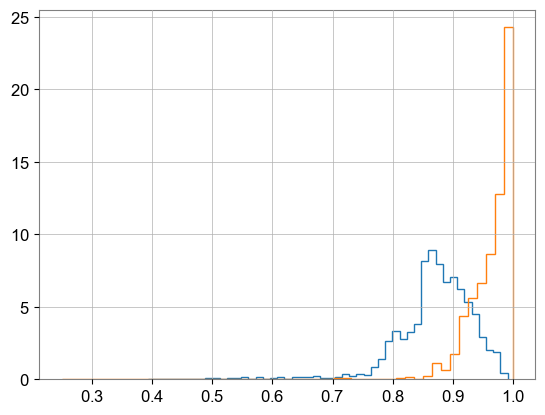

In [478]:
decodedTestdata = torch.sigmoid(autoencoder(torch.FloatTensor(X_test[indices_test_noise_anomaly])))
decodedTestdata = decodedTestdata.double()
reconstructedData_test = decodedTestdata.detach().numpy()

decodedTestdata = torch.sigmoid(autoencoder(torch.FloatTensor(X_bbh[indices_bbh_anomaly])))
decodedTestdata = decodedTestdata.double()
reconstructedData_injected = decodedTestdata.detach().numpy()

plt.hist(reconstructedData_test, density = True, bins = 50, histtype='step')
plt.hist(reconstructedData_injected, density = True, bins = 50, histtype='step')

(array([3.37592982e+00, 3.95055617e-01, 2.51399029e-01,
        2.15484882e-01, 1.79570735e-01, 7.18282941e-02,
        3.59141470e-02, 3.59141470e-02, 3.59141470e-02,
        0.00000000e+00, 3.59141470e-02, 3.59141470e-02,
        0.00000000e+00, 3.59141470e-02, 3.59141470e-02,
        0.00000000e+00, 7.18282941e-02, 0.00000000e+00,
        3.59141470e-02, 3.59141470e-02, 1.43656588e-01,
        7.18282941e-02, 0.00000000e+00, 7.18282941e-02,
        3.59141470e-02, 1.07742441e-01, 7.18282941e-02,
        1.43656588e-01, 7.18282941e-02, 1.07742441e-01,
        7.18282941e-02, 1.43656588e-01, 1.79570735e-01,
        7.18282941e-02, 1.07742441e-01, 7.18282941e-02,
        1.43656588e-01, 1.43656588e-01, 7.18282941e-02,
        1.43656588e-01, 1.79570735e-01, 7.18282941e-02,
        1.07742441e-01, 3.23227323e-01, 2.87313176e-01,
        2.51399029e-01, 1.07742441e-01, 2.51399029e-01,
        1.79570735e-01, 6.32088988e+01]),
 array([1.67784060e-06, 1.39237682e-02, 2.78458585e-02,
      

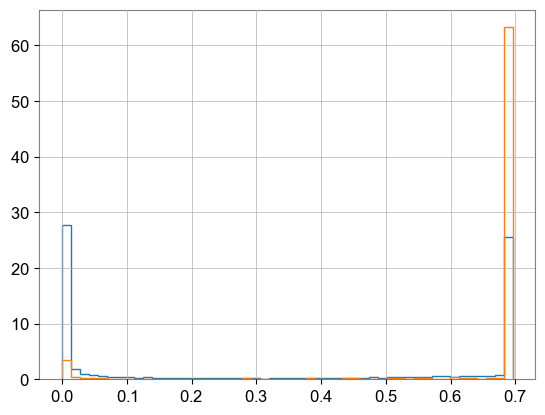

In [449]:
decodedTestdata = torch.sigmoid(autoencoder(torch.FloatTensor(X_test)))
decodedTestdata = decodedTestdata.double()
reconstructedData_test = decodedTestdata.detach().numpy()

decodedTestdata = torch.sigmoid(autoencoder(torch.FloatTensor(X_bbh)))
decodedTestdata = decodedTestdata.double()
reconstructedData_injected = decodedTestdata.detach().numpy()

plt.hist(reconstructedData_test, density = True, bins = 50, histtype='step')
plt.hist(reconstructedData_injected, density = True, bins = 50, histtype='step')

(array([12.55613991,  0.20009785,  0.27513454,  0.15007339,
         0.07503669,  0.10004892,  0.10004892,  0.02501223,
         0.05002446,  0.10004892,  0.02501223,  0.02501223,
         0.10004892,  0.        ,  0.07503669,  0.05002446,
         0.        ,  0.05002446,  0.        ,  0.        ,
         0.        ,  0.02501223,  0.02501223,  0.        ,
         0.05002446,  0.02501223,  0.05002446,  0.05002446,
         0.05002446,  0.02501223,  0.12506115,  0.        ,
         0.        ,  0.05002446,  0.07503669,  0.10004892,
         0.05002446,  0.02501223,  0.05002446,  0.05002446,
         0.07503669,  0.10004892,  0.07503669,  0.67533023,
         0.50024462,  2.22608855,  3.8018591 ,  4.87738502,
         7.17851027, 15.73269323]),
 array([2.18198896e-12, 1.99902201e-02, 3.99804401e-02,
        5.99706602e-02, 7.99608803e-02, 9.99511004e-02,
        1.19941320e-01, 1.39931540e-01, 1.59921761e-01,
        1.79911981e-01, 1.99902201e-01, 2.19892421e-01,
        2.39882641e-

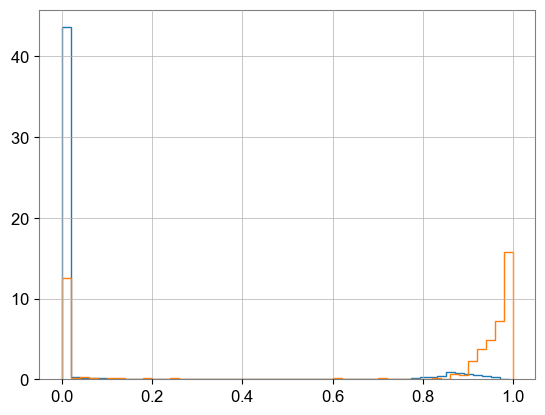

In [437]:
decodedTestdata = torch.sigmoid(autoencoder(torch.FloatTensor(X_test)))
decodedTestdata = decodedTestdata.double()
reconstructedData_test = decodedTestdata.detach().numpy()

decodedTestdata = torch.sigmoid(autoencoder(torch.FloatTensor(X_bbh)))
decodedTestdata = decodedTestdata.double()
reconstructedData_injected = decodedTestdata.detach().numpy()

plt.hist(reconstructedData_test, density = True, bins = 50, histtype='step')
plt.hist(reconstructedData_injected, density = True, bins = 50, histtype='step')

### iso-clu

(5165, 2)
(70000, 2)
Epoch: 0001, Training loss=1.25110900, Validation loss=1.25998747
Epoch: 0002, Training loss=1.47440076, Validation loss=1.24970914
Epoch: 0003, Training loss=2.06008983, Validation loss=1.24006893
Epoch: 0004, Training loss=1.16913235, Validation loss=1.23021812
Epoch: 0005, Training loss=1.50239253, Validation loss=1.21792125
Epoch: 0006, Training loss=0.91927814, Validation loss=1.20401601
Epoch: 0007, Training loss=1.11260307, Validation loss=1.18947194
Epoch: 0008, Training loss=1.12002182, Validation loss=1.17555404
Epoch: 0009, Training loss=1.12541473, Validation loss=1.16058357
Epoch: 0010, Training loss=0.82061660, Validation loss=1.14493274
Epoch: 0011, Training loss=1.25460970, Validation loss=1.12861377
Epoch: 0012, Training loss=1.34562325, Validation loss=1.11249378
Epoch: 0013, Training loss=1.31835902, Validation loss=1.09664701
Epoch: 0014, Training loss=0.83295780, Validation loss=1.08083645
Epoch: 0015, Training loss=0.58275616, Validation loss=

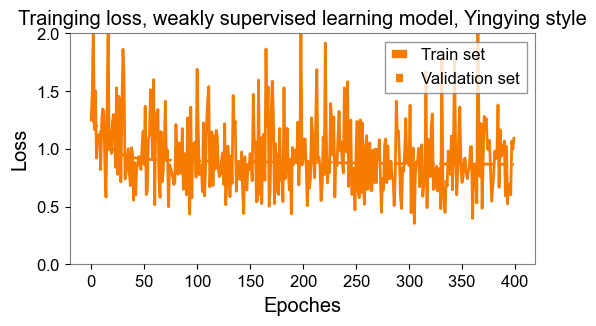

In [448]:
data_signal = np.vstack((X_test[indices_test_noise_bkg][np.argwhere(Geometric_mean_test_isoclu>0.6)].reshape(-1,2), X_bbh[indices_bbh_bkg][np.argwhere(Geometric_mean_bbh_isoclu>0.6)].reshape(-1,2)))
# data_bkg = Feature_space_noise_train[np.random.choice(len(data_signal),size = min(len(data_signal),len(Feature_space_noise_train)),  replace=False)]
data_bkg = X_train

print(data_signal.shape)
print(data_bkg.shape)

data_signal_labeled = np.hstack((data_signal,np.ones(len(data_signal)).reshape(-1,1)))
data_bkg_labeled = np.hstack((data_bkg,np.zeros(len(data_bkg)).reshape(-1,1)))

Final_training_and_validation_set = np.vstack((data_signal_labeled, data_bkg_labeled))
np.random.shuffle(Final_training_and_validation_set)

trainData = torch.FloatTensor(Final_training_and_validation_set[:int(0.9 * len(Final_training_and_validation_set))])
validationData = torch.FloatTensor(Final_training_and_validation_set[int(0.9 * len(Final_training_and_validation_set)):])
train_dataset = TensorDataset(trainData, trainData)
validation_dataset = TensorDataset(validationData, validationData)

trainDataLoader = DataLoader(dataset=train_dataset, batch_size=batch_size, shuffle=True)
validationDataLoader = DataLoader(dataset=validation_dataset, batch_size=batch_size, shuffle = True)


autoencoder = SupervisedModel().cuda()
optimizer = optim.Adam(autoencoder.parameters(), lr=0.00005)
loss_func = nn.BCEWithLogitsLoss(pos_weight=torch.FloatTensor([len(data_bkg) / len(data_signal)])).cuda()
loss_train = np.zeros((epochs, 1))
loss_validation = np.zeros((epochs, 1))


for epoch in range(epochs):
    # 训练阶段
    autoencoder.train()
    for batchidx, (x, _) in enumerate(trainDataLoader):
        x = x.cuda()
        decoded = autoencoder(x[:,:2])
        # weighted_lossTrain = loss_func(decoded, x)
        loss_overall = loss_func(decoded.flatten(), x[:,-1])
        # loss_norm = loss_func(decoded[:, -1], x[:, -1])
        
        weighted_lossTrain = loss_overall
        # weighted_lossTrain = loss_overall + loss_norm * coef_delta
        
        # output_norm = torch.norm(decoded[:, :100], dim=1) 
        # penalty_term = torch.mean((output_norm - 1) ** 2) 
        # weighted_lossTrain = lossTrain + coef_delta * penalty_term
        
        optimizer.zero_grad()
        weighted_lossTrain.backward()
        optimizer.step()

    # 验证阶段
    autoencoder.eval()
    with torch.no_grad():
        val_loss = 0
        for batchidx, (x, _) in enumerate(validationDataLoader):
            x = x.cuda()
            decoded = autoencoder(x[:,:2])
            lossVal_overall = loss_func(decoded.flatten(), x[:,-1])
            lossVal_norm = loss_func(decoded[:, -1], x[:, -1])
            lossVal = lossVal_overall + lossVal_norm * coef_delta
            val_loss += lossVal.item()

        val_loss /= len(validationDataLoader)
    
    loss_train[epoch,0] = weighted_lossTrain.item()
    loss_validation[epoch,0] = val_loss
    # print('Epoch: %04d, Training loss=%.8f' % (epoch+1, weighted_lossTrain.item()))
    print('Epoch: %04d, Training loss=%.8f, Validation loss=%.8f' % (epoch+1, weighted_lossTrain.item(), val_loss))
    
torch.save(autoencoder.cpu(),'../Model_cached/model_weakly_supervised_2-8-6-4-1_SVM0.1+isoclu0.1_0.6_isoclu.pt')


fig = plt.figure(figsize=(6, 3))
ax = plt.subplot(1, 1, 1)
ax.grid()
ax.plot(loss_train, color=[245/255, 124/255, 0/255], linestyle='-', linewidth=2, label = 'Train set') 
ax.plot(loss_validation, color=[245/255, 124/255, 0/255], linestyle='--', linewidth=2, label = 'Validation set') 
ax.set_xlabel('Epoches')
ax.set_ylabel('Loss')
ax.set_title('Trainging loss, weakly supervised learning model, Yingying style')
plt.ylim(0,2)
plt.legend()
# plt.show()
plt.savefig('../Pic_cached/Trainging loss, weakly supervised learning model,2-8-6-4-1_SVM0.1+isoclu0.1_0.6_isoclu.png')

In [451]:
X_bbh[indices_bbh_bkg].shape

(584, 2)

(array([11.5614035 ,  1.3529302 ,  0.86095558,  0.73796193,
         0.61496827,  0.24598731,  0.12299365,  0.12299365,
         0.12299365,  0.        ,  0.12299365,  0.12299365,
         0.        ,  0.12299365,  0.12299365,  0.        ,
         0.24598731,  0.        ,  0.12299365,  0.12299365,
         0.49197462,  0.24598731,  0.        ,  0.24598731,
         0.12299365,  0.36898096,  0.24598731,  0.49197462,
         0.24598731,  0.36898096,  0.24598731,  0.49197462,
         0.61496827,  0.24598731,  0.36898096,  0.24598731,
         0.49197462,  0.49197462,  0.24598731,  0.49197462,
         0.61496827,  0.24598731,  0.36898096,  1.10694289,
         0.98394923,  0.86095558,  0.36898096,  0.86095558,
         0.61496827, 42.30981706]),
 array([1.67784060e-06, 1.39237682e-02, 2.78458585e-02,
        4.17679489e-02, 5.56900392e-02, 6.96121296e-02,
        8.35342200e-02, 9.74563103e-02, 1.11378401e-01,
        1.25300491e-01, 1.39222581e-01, 1.53144672e-01,
        1.67066762e-

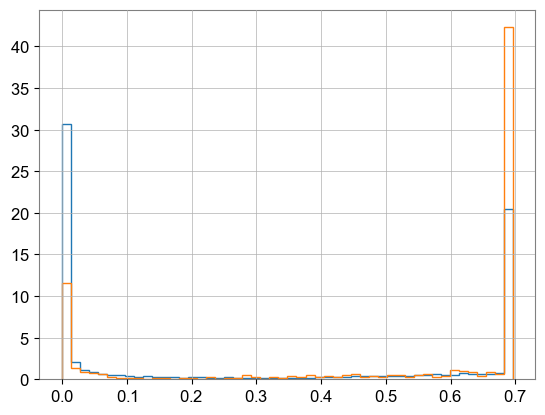

In [450]:
decodedTestdata = torch.sigmoid(autoencoder(torch.FloatTensor(X_test[indices_test_noise_bkg])))
decodedTestdata = decodedTestdata.double()
reconstructedData_test = decodedTestdata.detach().numpy()

decodedTestdata = torch.sigmoid(autoencoder(torch.FloatTensor(X_bbh[indices_bbh_bkg])))
decodedTestdata = decodedTestdata.double()
reconstructedData_injected = decodedTestdata.detach().numpy()

plt.hist(reconstructedData_test, density = True, bins = 50, histtype='step')
plt.hist(reconstructedData_injected, density = True, bins = 50, histtype='step')

### Isoclu, without SVM

(5830, 2)
(70000, 2)
Epoch: 0001, Training loss=1.34031558, Validation loss=1.24081003
Epoch: 0002, Training loss=0.98868382, Validation loss=1.21692176
Epoch: 0003, Training loss=2.14155626, Validation loss=1.18083934
Epoch: 0004, Training loss=1.07315993, Validation loss=1.13266320
Epoch: 0005, Training loss=1.01629090, Validation loss=1.09395527
Epoch: 0006, Training loss=1.01869738, Validation loss=1.06659742


Epoch: 0007, Training loss=0.85040855, Validation loss=1.04742327
Epoch: 0008, Training loss=0.84513897, Validation loss=1.03327449
Epoch: 0009, Training loss=1.75793970, Validation loss=1.02189855
Epoch: 0010, Training loss=0.91118658, Validation loss=1.01204230
Epoch: 0011, Training loss=2.77301788, Validation loss=1.00306655
Epoch: 0012, Training loss=1.24121940, Validation loss=0.99480368
Epoch: 0013, Training loss=0.50432050, Validation loss=0.98729589
Epoch: 0014, Training loss=0.60880542, Validation loss=0.97972766
Epoch: 0015, Training loss=1.13880801, Validation loss=0.97351816
Epoch: 0016, Training loss=1.10235703, Validation loss=0.96866765
Epoch: 0017, Training loss=0.72177356, Validation loss=0.96428537
Epoch: 0018, Training loss=1.07777476, Validation loss=0.96016449
Epoch: 0019, Training loss=1.10752177, Validation loss=0.95665356
Epoch: 0020, Training loss=0.88171768, Validation loss=0.95383700
Epoch: 0021, Training loss=0.51360661, Validation loss=0.95091450
Epoch: 002

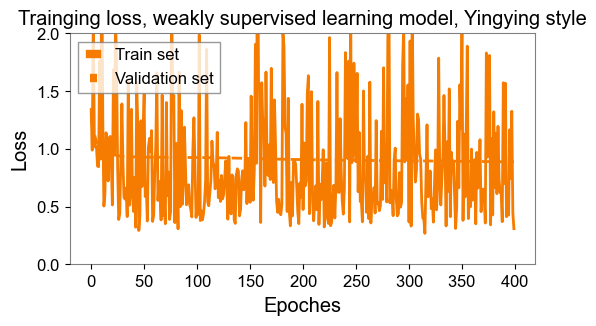

In [59]:
data_signal = np.vstack((X_test[indices_test_noise_bkg][np.argwhere(Geometric_mean_test_isoclu>0.6)].reshape(-1,2), X_bbh[indices_bbh_bkg][np.argwhere(Geometric_mean_bbh_isoclu>0.6)].reshape(-1,2)))
# data_bkg = Feature_space_noise_train[np.random.choice(len(data_signal),size = min(len(data_signal),len(Feature_space_noise_train)),  replace=False)]
data_bkg = X_train

print(data_signal.shape)
print(data_bkg.shape)

data_signal_labeled = np.hstack((data_signal,np.ones(len(data_signal)).reshape(-1,1)))
data_bkg_labeled = np.hstack((data_bkg,np.zeros(len(data_bkg)).reshape(-1,1)))

Final_training_and_validation_set = np.vstack((data_signal_labeled, data_bkg_labeled))
np.random.shuffle(Final_training_and_validation_set)

trainData = torch.FloatTensor(Final_training_and_validation_set[:int(0.9 * len(Final_training_and_validation_set))])
validationData = torch.FloatTensor(Final_training_and_validation_set[int(0.9 * len(Final_training_and_validation_set)):])
train_dataset = TensorDataset(trainData, trainData)
validation_dataset = TensorDataset(validationData, validationData)

trainDataLoader = DataLoader(dataset=train_dataset, batch_size=batch_size, shuffle=True)
validationDataLoader = DataLoader(dataset=validation_dataset, batch_size=batch_size, shuffle = True)


autoencoder = SupervisedModel().cuda()
optimizer = optim.Adam(autoencoder.parameters(), lr=0.00005)
loss_func = nn.BCEWithLogitsLoss(pos_weight=torch.FloatTensor([len(data_bkg) / len(data_signal)])).cuda()
loss_train = np.zeros((epochs, 1))
loss_validation = np.zeros((epochs, 1))


for epoch in range(epochs):
    # 训练阶段
    autoencoder.train()
    for batchidx, (x, _) in enumerate(trainDataLoader):
        x = x.cuda()
        decoded = autoencoder(x[:,:2])
        # weighted_lossTrain = loss_func(decoded, x)
        loss_overall = loss_func(decoded.flatten(), x[:,-1])
        # loss_norm = loss_func(decoded[:, -1], x[:, -1])
        
        weighted_lossTrain = loss_overall
        # weighted_lossTrain = loss_overall + loss_norm * coef_delta
        
        # output_norm = torch.norm(decoded[:, :100], dim=1) 
        # penalty_term = torch.mean((output_norm - 1) ** 2) 
        # weighted_lossTrain = lossTrain + coef_delta * penalty_term
        
        optimizer.zero_grad()
        weighted_lossTrain.backward()
        optimizer.step()

    # 验证阶段
    autoencoder.eval()
    with torch.no_grad():
        val_loss = 0
        for batchidx, (x, _) in enumerate(validationDataLoader):
            x = x.cuda()
            decoded = autoencoder(x[:,:2])
            lossVal_overall = loss_func(decoded.flatten(), x[:,-1])
            lossVal_norm = loss_func(decoded[:, -1], x[:, -1])
            lossVal = lossVal_overall + lossVal_norm * coef_delta
            val_loss += lossVal.item()

        val_loss /= len(validationDataLoader)
    
    loss_train[epoch,0] = weighted_lossTrain.item()
    loss_validation[epoch,0] = val_loss
    # print('Epoch: %04d, Training loss=%.8f' % (epoch+1, weighted_lossTrain.item()))
    print('Epoch: %04d, Training loss=%.8f, Validation loss=%.8f' % (epoch+1, weighted_lossTrain.item(), val_loss))
    
torch.save(autoencoder.cpu(),'../Model_cached/model_weakly_supervised_2-8-6-4-1_isocluwithoutSVM_bbh_true_2.pt')


fig = plt.figure(figsize=(6, 3))
ax = plt.subplot(1, 1, 1)
ax.grid()
ax.plot(loss_train, color=[245/255, 124/255, 0/255], linestyle='-', linewidth=2, label = 'Train set') 
ax.plot(loss_validation, color=[245/255, 124/255, 0/255], linestyle='--', linewidth=2, label = 'Validation set') 
ax.set_xlabel('Epoches')
ax.set_ylabel('Loss')
ax.set_title('Trainging loss, weakly supervised learning model, Yingying style')
plt.ylim(0,2)
plt.legend()
# plt.show()
plt.savefig('../Pic_cached/Trainging loss, weakly supervised learning model,2-8-6-4-1_isocluwithoutSVM_bbh_true_2.png')

(array([ 0.1316755 ,  0.0790053 ,  0.1053404 ,  0.0526702 ,
         0.0526702 ,  0.1053404 ,  0.0526702 ,  0.23701589,
         0.31602119,  0.31602119,  0.34235629,  0.34235629,
         0.31602119,  0.34235629,  0.31602119,  0.28968609,
         0.28968609,  0.21068079,  0.44769669,  0.44769669,
         0.36869139,  0.50036689,  0.44769669,  0.42136159,
         0.39502649,  0.36869139,  0.63204238,  0.60570728,
         0.50036689,  0.42136159,  0.57937218,  0.47403179,
         0.63204238,  0.50036689,  0.47403179,  0.71104768,
         0.94806358,  0.86905828,  0.50036689,  1.00073377,
         0.89539338,  1.29041987,  1.31675497,  1.39576026,
         1.89612715,  2.05413775,  2.87052583,  3.44989801,
         5.79372185, 15.5640437 ]),
 array([0.05059656, 0.06958263, 0.08856869, 0.10755476,
        0.12654083, 0.1455269 , 0.16451297, 0.18349904,
        0.20248511, 0.22147117, 0.24045724, 0.25944331,
        0.27842938, 0.29741545, 0.31640152, 0.33538759,
        0.35437365, 

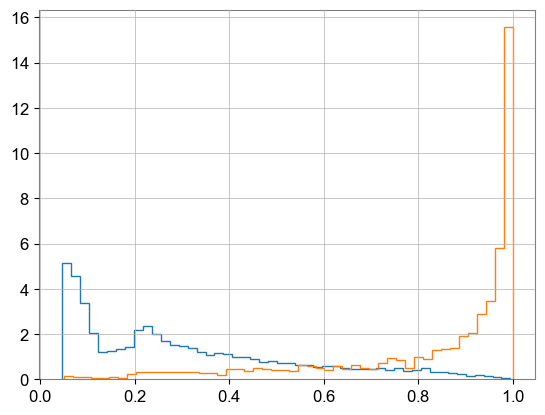

In [60]:
decodedTestdata = torch.sigmoid(autoencoder(torch.FloatTensor(X_test)))
decodedTestdata = decodedTestdata.double()
reconstructedData_test = decodedTestdata.detach().numpy()

decodedTestdata = torch.sigmoid(autoencoder(torch.FloatTensor(X_bbh)))
decodedTestdata = decodedTestdata.double()
reconstructedData_injected = decodedTestdata.detach().numpy()

plt.hist(reconstructedData_test, density = True, bins = 50, histtype='step')
plt.hist(reconstructedData_injected, density = True, bins = 50, histtype='step')

### +Iso-clu combined

(8584, 2)
(70000, 2)
Epoch: 0001, Training loss=0.79705918, Validation loss=1.23522371
Epoch: 0002, Training loss=1.61824453, Validation loss=1.22625959
Epoch: 0003, Training loss=0.73846716, Validation loss=1.21800693
Epoch: 0004, Training loss=0.74057919, Validation loss=1.21082394
Epoch: 0005, Training loss=0.73956716, Validation loss=1.20393803
Epoch: 0006, Training loss=1.55868995, Validation loss=1.19480861
Epoch: 0007, Training loss=1.70847547, Validation loss=1.18389499
Epoch: 0008, Training loss=0.72071856, Validation loss=1.16723340
Epoch: 0009, Training loss=1.45320988, Validation loss=1.14014503
Epoch: 0010, Training loss=0.76561588, Validation loss=1.11259455
Epoch: 0011, Training loss=0.74472928, Validation loss=1.09049680
Epoch: 0012, Training loss=1.34455478, Validation loss=1.07051076
Epoch: 0013, Training loss=0.60422128, Validation loss=1.05178515
Epoch: 0014, Training loss=1.39788651, Validation loss=1.03781832
Epoch: 0015, Training loss=0.48891184, Validation loss=

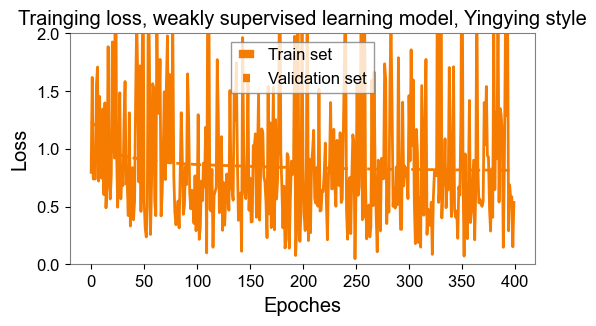

In [496]:
data_signal = np.vstack((X_test[indices_test_noise_anomaly], X_test[indices_test_noise_bkg][np.argwhere(Geometric_mean_test_isoclu>0.6)].reshape(-1,2), X_bbh[indices_bbh_anomaly], X_bbh[indices_bbh_bkg][np.argwhere(Geometric_mean_bbh_isoclu>0.6)].reshape(-1,2)))
# data_bkg = Feature_space_noise_train[np.random.choice(len(data_signal),size = min(len(data_signal),len(Feature_space_noise_train)),  replace=False)]
data_bkg = X_train

print(data_signal.shape)
print(data_bkg.shape)

data_signal_labeled = np.hstack((data_signal,np.ones(len(data_signal)).reshape(-1,1)))
data_bkg_labeled = np.hstack((data_bkg,np.zeros(len(data_bkg)).reshape(-1,1)))

Final_training_and_validation_set = np.vstack((data_signal_labeled, data_bkg_labeled))
np.random.shuffle(Final_training_and_validation_set)

trainData = torch.FloatTensor(Final_training_and_validation_set[:int(0.9 * len(Final_training_and_validation_set))])
validationData = torch.FloatTensor(Final_training_and_validation_set[int(0.9 * len(Final_training_and_validation_set)):])
train_dataset = TensorDataset(trainData, trainData)
validation_dataset = TensorDataset(validationData, validationData)

trainDataLoader = DataLoader(dataset=train_dataset, batch_size=batch_size, shuffle=True)
validationDataLoader = DataLoader(dataset=validation_dataset, batch_size=batch_size, shuffle = True)


autoencoder = SupervisedModel().cuda()
optimizer = optim.Adam(autoencoder.parameters(), lr=0.00005)
loss_func = nn.BCEWithLogitsLoss(pos_weight=torch.FloatTensor([len(data_bkg) / len(data_signal)])).cuda()
loss_train = np.zeros((epochs, 1))
loss_validation = np.zeros((epochs, 1))


for epoch in range(epochs):
    # 训练阶段
    autoencoder.train()
    for batchidx, (x, _) in enumerate(trainDataLoader):
        x = x.cuda()
        decoded = autoencoder(x[:,:2])
        # weighted_lossTrain = loss_func(decoded, x)
        loss_overall = loss_func(decoded.flatten(), x[:,-1])
        # loss_norm = loss_func(decoded[:, -1], x[:, -1])
        
        weighted_lossTrain = loss_overall
        # weighted_lossTrain = loss_overall + loss_norm * coef_delta
        
        # output_norm = torch.norm(decoded[:, :100], dim=1) 
        # penalty_term = torch.mean((output_norm - 1) ** 2) 
        # weighted_lossTrain = lossTrain + coef_delta * penalty_term
        
        optimizer.zero_grad()
        weighted_lossTrain.backward()
        optimizer.step()

    # 验证阶段
    autoencoder.eval()
    with torch.no_grad():
        val_loss = 0
        for batchidx, (x, _) in enumerate(validationDataLoader):
            x = x.cuda()
            decoded = autoencoder(x[:,:2])
            lossVal_overall = loss_func(decoded.flatten(), x[:,-1])
            lossVal_norm = loss_func(decoded[:, -1], x[:, -1])
            lossVal = lossVal_overall + lossVal_norm * coef_delta
            val_loss += lossVal.item()

        val_loss /= len(validationDataLoader)
    
    loss_train[epoch,0] = weighted_lossTrain.item()
    loss_validation[epoch,0] = val_loss
    # print('Epoch: %04d, Training loss=%.8f' % (epoch+1, weighted_lossTrain.item()))
    print('Epoch: %04d, Training loss=%.8f, Validation loss=%.8f' % (epoch+1, weighted_lossTrain.item(), val_loss))
    
torch.save(autoencoder.cpu(),'../Model_cached/model_weakly_supervised_2-8-6-4-1_SVM0.1+isoclu0.1_0.6_1.pt')


fig = plt.figure(figsize=(6, 3))
ax = plt.subplot(1, 1, 1)
ax.grid()
ax.plot(loss_train, color=[245/255, 124/255, 0/255], linestyle='-', linewidth=2, label = 'Train set') 
ax.plot(loss_validation, color=[245/255, 124/255, 0/255], linestyle='--', linewidth=2, label = 'Validation set') 
ax.set_xlabel('Epoches')
ax.set_ylabel('Loss')
ax.set_title('Trainging loss, weakly supervised learning model, Yingying style')
plt.ylim(0,2)
plt.legend()
# plt.show()
plt.savefig('../Pic_cached/Trainging loss, weakly supervised learning model,2-8-6-4-1_SVM0.1+isoclu0.1_0.6_1.png')

(array([ 2.651369  ,  0.12746966,  0.1529636 ,  0.0764818 ,
         0.05098787,  0.0764818 ,  0.05098787,  0.02549393,
         0.05098787,  0.        ,  0.05098787,  0.0764818 ,
         0.05098787,  0.02549393,  0.        ,  0.0764818 ,
         0.0764818 ,  0.05098787,  0.1529636 ,  0.20395146,
         0.17845753,  0.38240899,  0.22944539,  0.35691506,
         0.12746966,  0.38240899,  0.40790292,  0.33142113,
         0.40790292,  0.38240899,  0.58636045,  0.68833618,
         0.58636045,  0.66284225,  0.96876944,  0.71383012,
         0.89228764,  1.12173304,  1.09623911,  1.2492027 ,
         1.37667237,  1.42766023,  2.19247821,  1.81006922,
         2.7278508 ,  2.4984054 ,  3.16124765,  4.07902923,
         5.60866519, 10.32504274]),
 array([0.01883897, 0.03845148, 0.05806399, 0.0776765 ,
        0.09728901, 0.11690152, 0.13651403, 0.15612654,
        0.17573905, 0.19535156, 0.21496407, 0.23457658,
        0.25418909, 0.2738016 , 0.29341411, 0.31302662,
        0.33263913, 

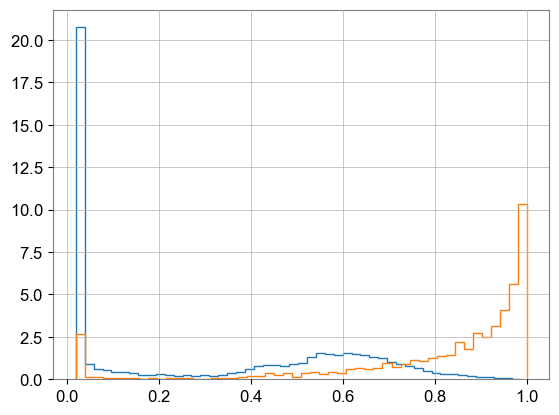

In [498]:
decodedTestdata = torch.sigmoid(autoencoder(torch.FloatTensor(X_test)))
decodedTestdata = decodedTestdata.double()
reconstructedData_test = decodedTestdata.detach().numpy()

decodedTestdata = torch.sigmoid(autoencoder(torch.FloatTensor(X_bbh)))
decodedTestdata = decodedTestdata.double()
reconstructedData_injected = decodedTestdata.detach().numpy()

plt.hist(reconstructedData_test, density = True, bins = 50, histtype='step')
plt.hist(reconstructedData_injected, density = True, bins = 50, histtype='step')

## ROC plotting part

In [62]:
def upperTPRFPRcalc(trainerror, signalerror, FPRlist):
    TPRlist = np.zeros(len(FPRlist))
    length_of_train_sample = len(trainerror)
    # print(length_of_train_sample)
    length_of_signal_value = len(signalerror)
    # print(length_of_signal_value)
    
    for i in range(len(FPRlist)):
        index_number = int(length_of_train_sample * FPRlist[i])
        threshold = np.sort(trainerror)[-index_number]
            
        # print(threshold)
        # print(np.argwhere(signalerror > threshold).shape)
        TPRlist[i] = np.argwhere(signalerror > threshold).shape[0] / length_of_signal_value
    
    TPRlist[-1] = 1
    
    return TPRlist

def lowerTPRFPRcalc(trainerror, signalerror, FPRlist):
    TPRlist = np.zeros(len(FPRlist))
    length_of_train_sample = len(trainerror)
    # print(length_of_train_sample)
    length_of_signal_value = len(signalerror)
    # print(length_of_signal_value)
    
    for i in range(len(FPRlist)):
        index_number = int(length_of_train_sample * FPRlist[i])
        if index_number == 0:
            threshold = np.sort(trainerror)[index_number]
        else:
            threshold = np.sort(trainerror)[index_number-1]
        # print(np.sort(trainerror))
        # print(threshold)
        # print(np.argwhere(signalerror < threshold).shape)
        TPRlist[i] = np.argwhere(signalerror < threshold).shape[0] / length_of_signal_value
    
    TPRlist[-1] = 1
    
    return TPRlist


In [63]:
FPR_list = np.logspace(-3,0,50)

### SVM

In [434]:
ROC_SVM = np.zeros((len(FPR_list),2))

len_test_noise = len(X_test)
len_bbh = len(X_bbh)

for i in range(len(FPR_list)):
    clf_plotting = make_pipeline(
                Nystroem(gamma=0.1, n_components=150), # a so-called kernel function that I still haven't figured out it's influence yet
                SGDOneClassSVM(nu=FPR_list[i], shuffle=True, fit_intercept=True) # nu is the FPR
    )
    
    clf_plotting.fit(X_train)
    ROC_SVM[i][0] = np.argwhere(clf_plotting.predict(X_test) < 0).shape[0] / len_test_noise
    ROC_SVM[i][1] = np.argwhere(clf_plotting.predict(X_bbh) < 0).shape[0] / len_bbh

In [492]:
ROC_SVM = np.zeros((len(FPR_list),2))

len_test_noise = len(X_test[indices_test_noise_anomaly])
len_bbh = len(X_bbh[indices_bbh_anomaly])

FPR_list_cached = np.logspace(-4,0,50)

for i in range(len(FPR_list)):
    clf_plotting = make_pipeline(
                Nystroem(gamma=0.1, n_components=150), # a so-called kernel function that I still haven't figured out it's influence yet
                SGDOneClassSVM(nu=FPR_list_cached[i], shuffle=True, fit_intercept=True) # nu is the FPR
    )
    
    clf_plotting.fit(X_train)
    ROC_SVM[i][0] = np.argwhere(clf_plotting.predict(X_test[indices_test_noise_anomaly]) < 0).shape[0] / len_test_noise
    ROC_SVM[i][1] = np.argwhere(clf_plotting.predict(X_bbh[indices_bbh_anomaly]) < 0).shape[0] / len_bbh

In [493]:
ROC_SVM[:,0]

array([0.        , 0.        , 0.        , 0.00249626,
       0.        , 0.001997  , 0.00299551, 0.00549176,
       0.00499251, 0.00599101, 0.01347978, 0.00499251,
       0.01098352, 0.01248128, 0.01248128, 0.00948577,
       0.02296555, 0.01397903, 0.04043934, 0.03894159,
       0.03944084, 0.05641538, 0.05341987, 0.07338992,
       0.09186221, 0.11333   , 0.12880679, 0.16874688,
       0.17174239, 0.25411882, 0.28956565, 0.3574638 ,
       0.40688967, 0.55616575, 0.60808787, 0.7333999 ,
       0.88617074, 1.        , 1.        , 1.        ,
       1.        , 1.        , 1.        , 1.        ,
       1.        , 1.        , 1.        , 1.        ,
       1.        , 1.        ])

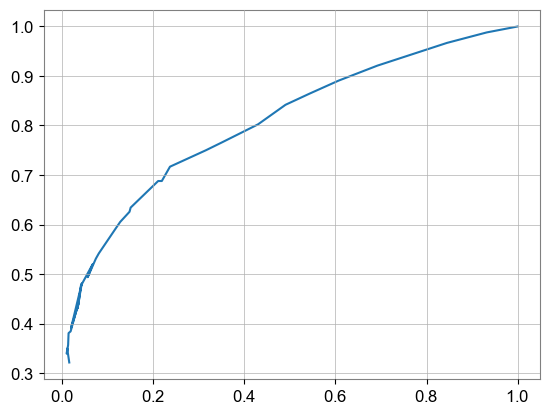

In [480]:
plt.plot(ROC_SVM[:,0], ROC_SVM[:,1])

### SVM + weakly

In [511]:
autoencoder = torch.load('../Model_cached/model_weakly_supervised_2-8-6-4-1_SVM0.1only.pt')

(array([ 0.04713667,  0.        ,  0.        ,  0.        ,
         0.        ,  0.        ,  0.        ,  0.        ,
         0.        ,  0.        ,  0.        ,  0.        ,
         0.        ,  0.        ,  0.        ,  0.        ,
         0.        ,  0.        ,  0.        ,  0.        ,
         0.        ,  0.        ,  0.        ,  0.        ,
         0.        ,  0.        ,  0.        ,  0.        ,
         0.04713667,  0.        ,  0.09427334,  0.09427334,
         0.04713667,  0.        ,  0.        ,  0.04713667,
         0.        ,  0.09427334,  0.18854669,  0.04713667,
         0.23568336,  1.13128014,  0.61277674,  1.74405688,
         4.33657386,  5.60926401,  6.6462708 ,  8.67314771,
        12.77403821, 24.27538626]),
 array([0.25039715, 0.26537942, 0.2803617 , 0.29534398,
        0.31032625, 0.32530853, 0.34029081, 0.35527309,
        0.37025536, 0.38523764, 0.40021992, 0.41520219,
        0.43018447, 0.44516675, 0.46014903, 0.4751313 ,
        0.49011358, 

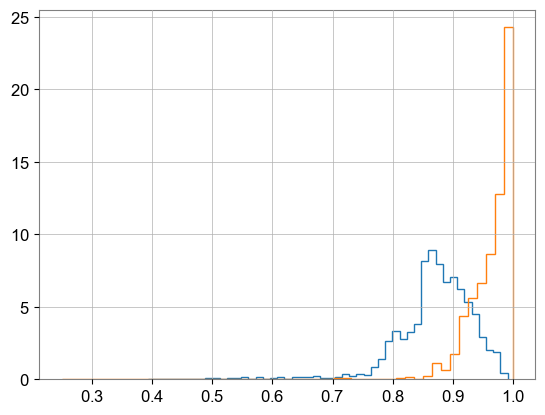

In [517]:
decodedTestdata = torch.sigmoid(autoencoder(torch.FloatTensor(X_test[indices_test_noise_anomaly])))
decodedTestdata = decodedTestdata.double()
reconstructedData_test = decodedTestdata.detach().numpy()

decodedTestdata = torch.sigmoid(autoencoder(torch.FloatTensor(X_bbh[indices_bbh_anomaly])))
decodedTestdata = decodedTestdata.double()
reconstructedData_injected = decodedTestdata.detach().numpy()

plt.hist(reconstructedData_test, density = True, bins = 50, histtype='step')
plt.hist(reconstructedData_injected, density = True, bins = 50, histtype='step')

(array([12.55613991,  0.20009785,  0.27513454,  0.15007339,
         0.07503669,  0.10004892,  0.10004892,  0.02501223,
         0.05002446,  0.10004892,  0.02501223,  0.02501223,
         0.10004892,  0.        ,  0.07503669,  0.05002446,
         0.        ,  0.05002446,  0.        ,  0.        ,
         0.        ,  0.02501223,  0.02501223,  0.        ,
         0.05002446,  0.02501223,  0.05002446,  0.05002446,
         0.05002446,  0.02501223,  0.12506115,  0.        ,
         0.        ,  0.05002446,  0.07503669,  0.10004892,
         0.05002446,  0.02501223,  0.05002446,  0.05002446,
         0.07503669,  0.10004892,  0.07503669,  0.67533023,
         0.50024462,  2.22608855,  3.8018591 ,  4.87738502,
         7.17851027, 15.73269323]),
 array([2.18198896e-12, 1.99902201e-02, 3.99804401e-02,
        5.99706602e-02, 7.99608803e-02, 9.99511004e-02,
        1.19941320e-01, 1.39931540e-01, 1.59921761e-01,
        1.79911981e-01, 1.99902201e-01, 2.19892421e-01,
        2.39882641e-

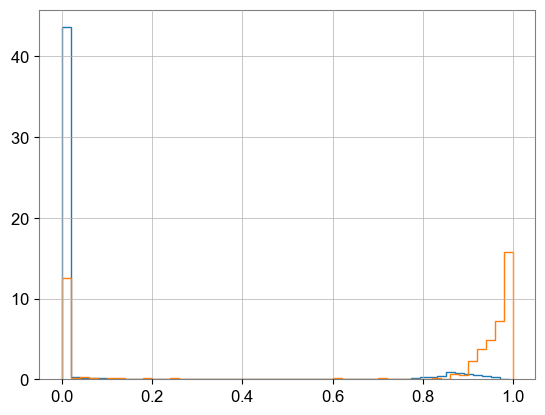

In [521]:
decodedTestdata = torch.sigmoid(autoencoder(torch.FloatTensor(X_test)))
decodedTestdata = decodedTestdata.double()
reconstructedData_test = decodedTestdata.detach().numpy()

decodedTestdata = torch.sigmoid(autoencoder(torch.FloatTensor(X_bbh)))
decodedTestdata = decodedTestdata.double()
reconstructedData_injected = decodedTestdata.detach().numpy()

plt.hist(reconstructedData_test, density = True, bins = 50, histtype='step')
plt.hist(reconstructedData_injected, density = True, bins = 50, histtype='step')

In [522]:
ROC_SVMWS = np.zeros((len(FPR_list),2))
ROC_SVMWS[:,0] = FPR_list
ROC_SVMWS[:,1] = upperTPRFPRcalc(reconstructedData_test.flatten(), reconstructedData_injected.flatten(), FPR_list)

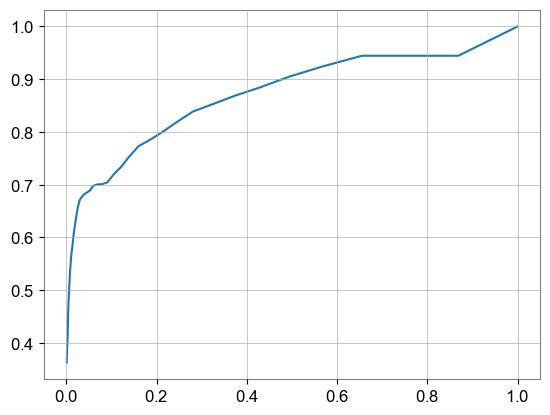

In [523]:
plt.plot(ROC_SVMWS[:,0], ROC_SVMWS[:,1])

### iso-clu

(array([0.        , 0.17123288, 0.59931507, 0.80479452,
        1.21575342, 1.01027397, 1.31849315, 1.30136986,
        1.43835616, 2.14041096]),
 array([0. , 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1. ]),
 [<matplotlib.patches.Polygon at 0x15f07a4c190>])

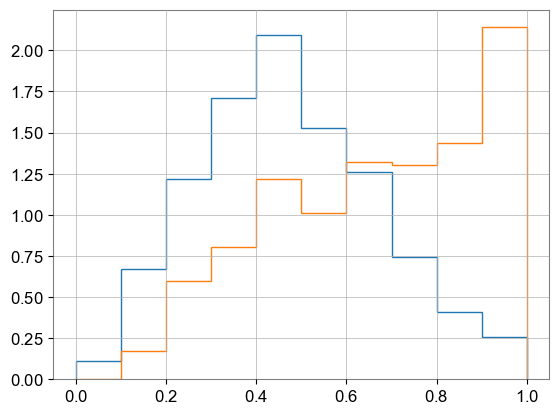

In [460]:
plt.hist(Geometric_mean_test_isoclu, density = True, histtype='step', bins = np.arange(0,1.1,0.1))
plt.hist(Geometric_mean_bbh_isoclu, density = True, histtype='step', bins = np.arange(0,1.1,0.1))

(array([0.15151515, 0.60606061, 0.60606061, 1.21212121,
        1.21212121, 1.66666667, 2.12121212, 1.36363636,
        0.45454545, 0.60606061]),
 array([0. , 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1. ]),
 [<matplotlib.patches.Polygon at 0x15f064d6d50>])

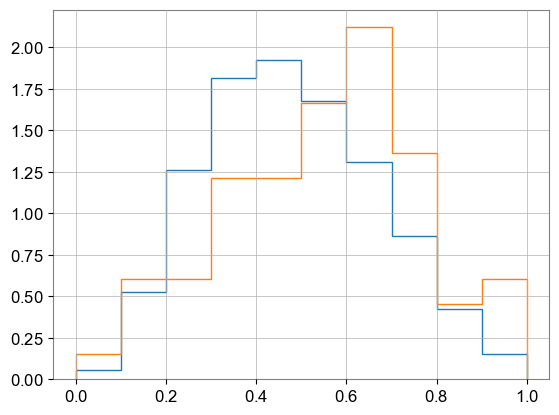

In [290]:
plt.hist(Geometric_mean_test_isoclu, density = True, histtype='step', bins = np.arange(0,1.1,0.1))
plt.hist(Geometric_mean_bbh_isoclu, density = True, histtype='step', bins = np.arange(0,1.1,0.1))

In [471]:
ROC_isoclu = np.zeros((len(FPR_list),2))
ROC_isoclu[:,0] = FPR_list
ROC_isoclu[:,1] = upperTPRFPRcalc(Geometric_mean_test_isoclu.flatten(), Geometric_mean_bbh_isoclu.flatten(), FPR_list)

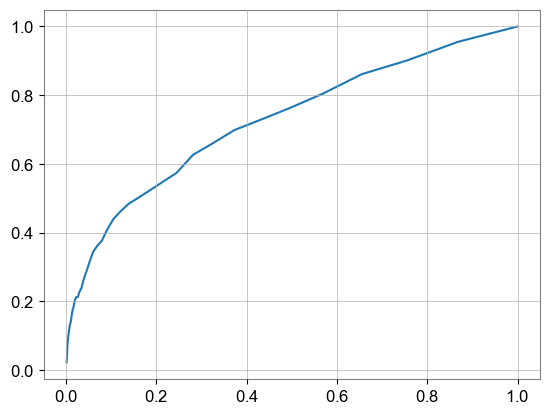

In [472]:
plt.plot(ROC_isoclu[:,0], ROC_isoclu[:,1])

### iso-clu + weakly

In [531]:
autoencoder = torch.load('../Model_cached/model_weakly_supervised_2-8-6-4-1_SVM0.1+isoclu0.1_0.6_isoclu.pt')

(array([11.5614035 ,  1.3529302 ,  0.86095558,  0.73796193,
         0.61496827,  0.24598731,  0.12299365,  0.12299365,
         0.12299365,  0.        ,  0.12299365,  0.12299365,
         0.        ,  0.12299365,  0.12299365,  0.        ,
         0.24598731,  0.        ,  0.12299365,  0.12299365,
         0.49197462,  0.24598731,  0.        ,  0.24598731,
         0.12299365,  0.36898096,  0.24598731,  0.49197462,
         0.24598731,  0.36898096,  0.24598731,  0.49197462,
         0.61496827,  0.24598731,  0.36898096,  0.24598731,
         0.49197462,  0.49197462,  0.24598731,  0.49197462,
         0.61496827,  0.24598731,  0.36898096,  1.10694289,
         0.98394923,  0.86095558,  0.36898096,  0.86095558,
         0.61496827, 42.30981706]),
 array([1.67784060e-06, 1.39237682e-02, 2.78458585e-02,
        4.17679489e-02, 5.56900392e-02, 6.96121296e-02,
        8.35342200e-02, 9.74563103e-02, 1.11378401e-01,
        1.25300491e-01, 1.39222581e-01, 1.53144672e-01,
        1.67066762e-

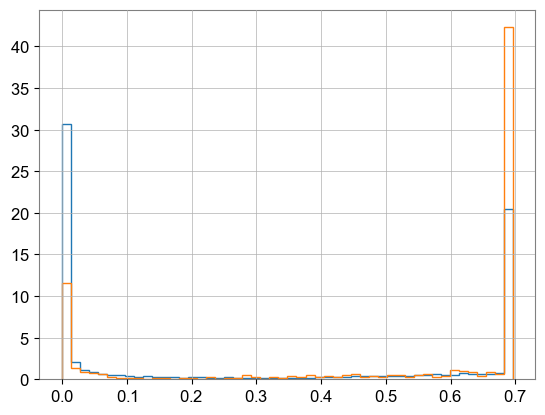

In [535]:
decodedTestdata = torch.sigmoid(autoencoder(torch.FloatTensor(X_test[indices_test_noise_bkg])))
decodedTestdata = decodedTestdata.double()
reconstructedData_test = decodedTestdata.detach().numpy()

decodedTestdata = torch.sigmoid(autoencoder(torch.FloatTensor(X_bbh[indices_bbh_bkg])))
decodedTestdata = decodedTestdata.double()
reconstructedData_injected = decodedTestdata.detach().numpy()

plt.hist(reconstructedData_test, density = True, bins = 50, histtype='step')
plt.hist(reconstructedData_injected, density = True, bins = 50, histtype='step')

(array([0.01818167, 0.02424223, 0.03636335, 0.02424223,
        0.01818167, 0.01212112, 0.01818167, 0.01212112,
        0.01212112, 0.02424223, 0.        , 0.00606056,
        0.00606056, 0.01818167, 0.        , 0.01212112,
        0.01212112, 0.01212112, 0.01818167, 0.00606056,
        0.01818167, 0.01818167, 0.01818167, 0.01818167,
        0.01818167, 0.01818167, 0.04848446, 0.01818167,
        0.03030279, 0.        , 0.03030279, 0.0424239 ,
        0.03636335, 0.01818167, 0.01818167, 0.03636335,
        0.03636335, 0.0424239 , 0.00606056, 0.01212112,
        0.00606056, 0.01212112, 0.01818167, 0.0424239 ,
        0.0424239 , 0.07272669, 0.09090836, 0.10909004,
        0.16969561, 2.19998241]),
 array([-13.29800129, -13.01546478, -12.73292828, -12.45039177,
        -12.16785527, -11.88531876, -11.60278226, -11.32024575,
        -11.03770925, -10.75517274, -10.47263623, -10.19009973,
         -9.90756322,  -9.62502672,  -9.34249021,  -9.05995371,
         -8.7774172 ,  -8.4948807 ,  -

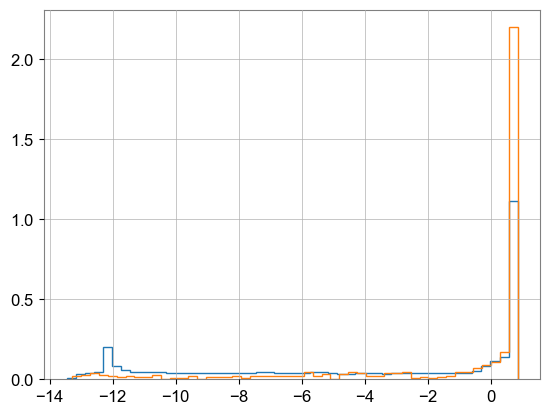

In [537]:
decodedTestdata = autoencoder(torch.FloatTensor(X_test[indices_test_noise_bkg]))
decodedTestdata = decodedTestdata.double()
reconstructedData_test = decodedTestdata.detach().numpy()

decodedTestdata = autoencoder(torch.FloatTensor(X_bbh[indices_bbh_bkg]))
decodedTestdata = decodedTestdata.double()
reconstructedData_injected = decodedTestdata.detach().numpy()

plt.hist(reconstructedData_test, density = True, bins = 50, histtype='step')
plt.hist(reconstructedData_injected, density = True, bins = 50, histtype='step')

(array([3.37592982e+00, 3.95055617e-01, 2.51399029e-01,
        2.15484882e-01, 1.79570735e-01, 7.18282941e-02,
        3.59141470e-02, 3.59141470e-02, 3.59141470e-02,
        0.00000000e+00, 3.59141470e-02, 3.59141470e-02,
        0.00000000e+00, 3.59141470e-02, 3.59141470e-02,
        0.00000000e+00, 7.18282941e-02, 0.00000000e+00,
        3.59141470e-02, 3.59141470e-02, 1.43656588e-01,
        7.18282941e-02, 0.00000000e+00, 7.18282941e-02,
        3.59141470e-02, 1.07742441e-01, 7.18282941e-02,
        1.43656588e-01, 7.18282941e-02, 1.07742441e-01,
        7.18282941e-02, 1.43656588e-01, 1.79570735e-01,
        7.18282941e-02, 1.07742441e-01, 7.18282941e-02,
        1.43656588e-01, 1.43656588e-01, 7.18282941e-02,
        1.43656588e-01, 1.79570735e-01, 7.18282941e-02,
        1.07742441e-01, 3.23227323e-01, 2.87313176e-01,
        2.51399029e-01, 1.07742441e-01, 2.51399029e-01,
        1.79570735e-01, 6.32088988e+01]),
 array([1.67784060e-06, 1.39237682e-02, 2.78458585e-02,
      

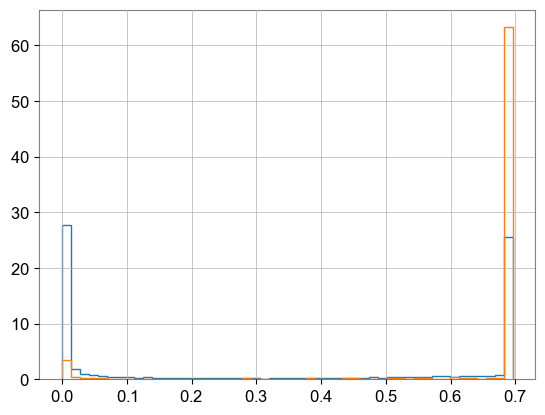

In [532]:
decodedTestdata = torch.sigmoid(autoencoder(torch.FloatTensor(X_test)))
decodedTestdata = decodedTestdata.double()
reconstructedData_test = decodedTestdata.detach().numpy()

decodedTestdata = torch.sigmoid(autoencoder(torch.FloatTensor(X_bbh)))
decodedTestdata = decodedTestdata.double()
reconstructedData_injected = decodedTestdata.detach().numpy()

plt.hist(reconstructedData_test, density = True, bins = 50, histtype='step')
plt.hist(reconstructedData_injected, density = True, bins = 50, histtype='step')

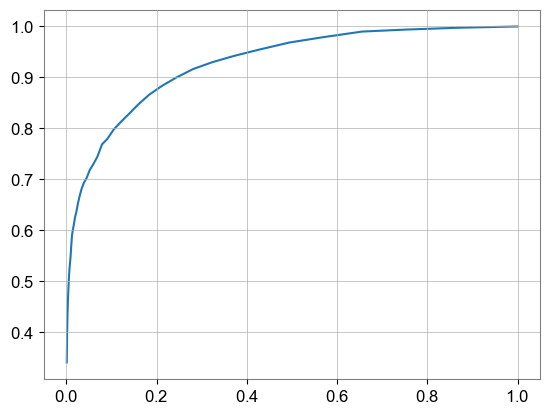

In [64]:
ROC_isocluWS = np.zeros((len(FPR_list),2))
ROC_isocluWS[:,0] = FPR_list
ROC_isocluWS[:,1] = upperTPRFPRcalc(reconstructedData_test.flatten(), reconstructedData_injected.flatten(), FPR_list)
plt.plot(ROC_isocluWS[:,0], ROC_isocluWS[:,1])

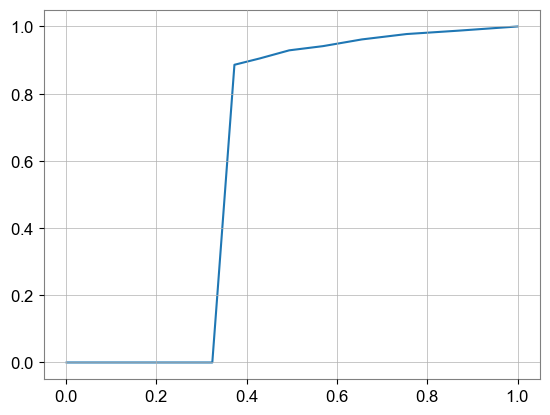

In [533]:
ROC_isocluWS = np.zeros((len(FPR_list),2))
ROC_isocluWS[:,0] = FPR_list
ROC_isocluWS[:,1] = upperTPRFPRcalc(reconstructedData_test.flatten(), reconstructedData_injected.flatten(), FPR_list)
plt.plot(ROC_isocluWS[:,0], ROC_isocluWS[:,1])

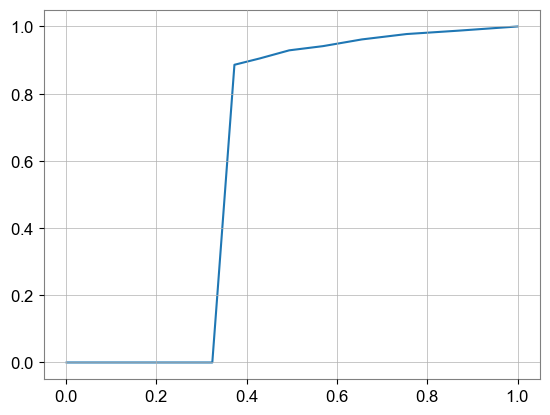

In [529]:
ROC_isocluWS = np.zeros((len(FPR_list),2))
ROC_isocluWS[:,0] = FPR_list
ROC_isocluWS[:,1] = upperTPRFPRcalc(reconstructedData_test.flatten(), reconstructedData_injected.flatten(), FPR_list)
plt.plot(ROC_isocluWS[:,0], ROC_isocluWS[:,1])

### SVM + iso-clu + weakly

(array([ 2.651369  ,  0.12746966,  0.1529636 ,  0.0764818 ,
         0.05098787,  0.0764818 ,  0.05098787,  0.02549393,
         0.05098787,  0.        ,  0.05098787,  0.0764818 ,
         0.05098787,  0.02549393,  0.        ,  0.0764818 ,
         0.0764818 ,  0.05098787,  0.1529636 ,  0.20395146,
         0.17845753,  0.38240899,  0.22944539,  0.35691506,
         0.12746966,  0.38240899,  0.40790292,  0.33142113,
         0.40790292,  0.38240899,  0.58636045,  0.68833618,
         0.58636045,  0.66284225,  0.96876944,  0.71383012,
         0.89228764,  1.12173304,  1.09623911,  1.2492027 ,
         1.37667237,  1.42766023,  2.19247821,  1.81006922,
         2.7278508 ,  2.4984054 ,  3.16124765,  4.07902923,
         5.60866519, 10.32504274]),
 array([0.01883897, 0.03845148, 0.05806399, 0.0776765 ,
        0.09728901, 0.11690152, 0.13651403, 0.15612654,
        0.17573905, 0.19535156, 0.21496407, 0.23457658,
        0.25418909, 0.2738016 , 0.29341411, 0.31302662,
        0.33263913, 

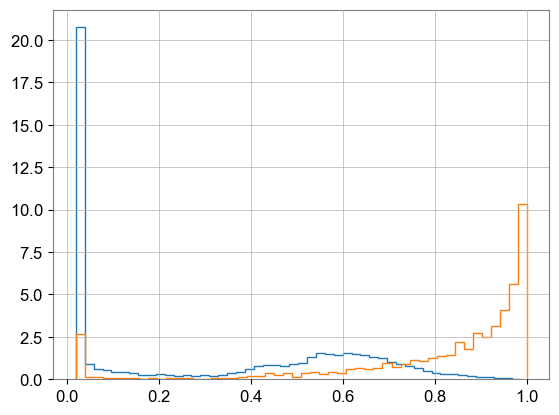

In [499]:
decodedTestdata = torch.sigmoid(autoencoder(torch.FloatTensor(X_test)))
decodedTestdata = decodedTestdata.double()
reconstructedData_test = decodedTestdata.detach().numpy()

decodedTestdata = torch.sigmoid(autoencoder(torch.FloatTensor(X_bbh)))
decodedTestdata = decodedTestdata.double()
reconstructedData_injected = decodedTestdata.detach().numpy()

plt.hist(reconstructedData_test, density = True, bins = 50, histtype='step')
plt.hist(reconstructedData_injected, density = True, bins = 50, histtype='step')

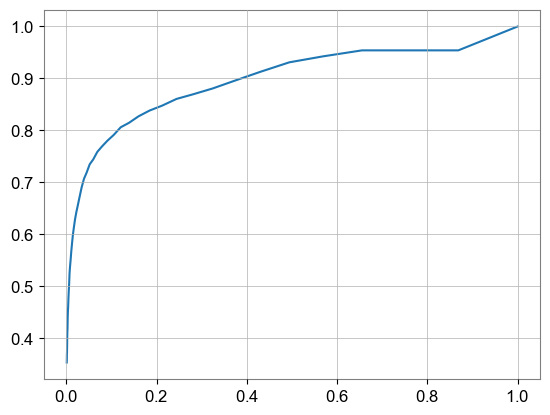

In [500]:
ROC_SVMisocluWS = np.zeros((len(FPR_list),2))
ROC_SVMisocluWS[:,0] = FPR_list
ROC_SVMisocluWS[:,1] = upperTPRFPRcalc(reconstructedData_test.flatten(), reconstructedData_injected.flatten(), FPR_list)
plt.plot(ROC_SVMisocluWS[:,0], ROC_SVMisocluWS[:,1])

### Combined

(-0.1, 1.1)

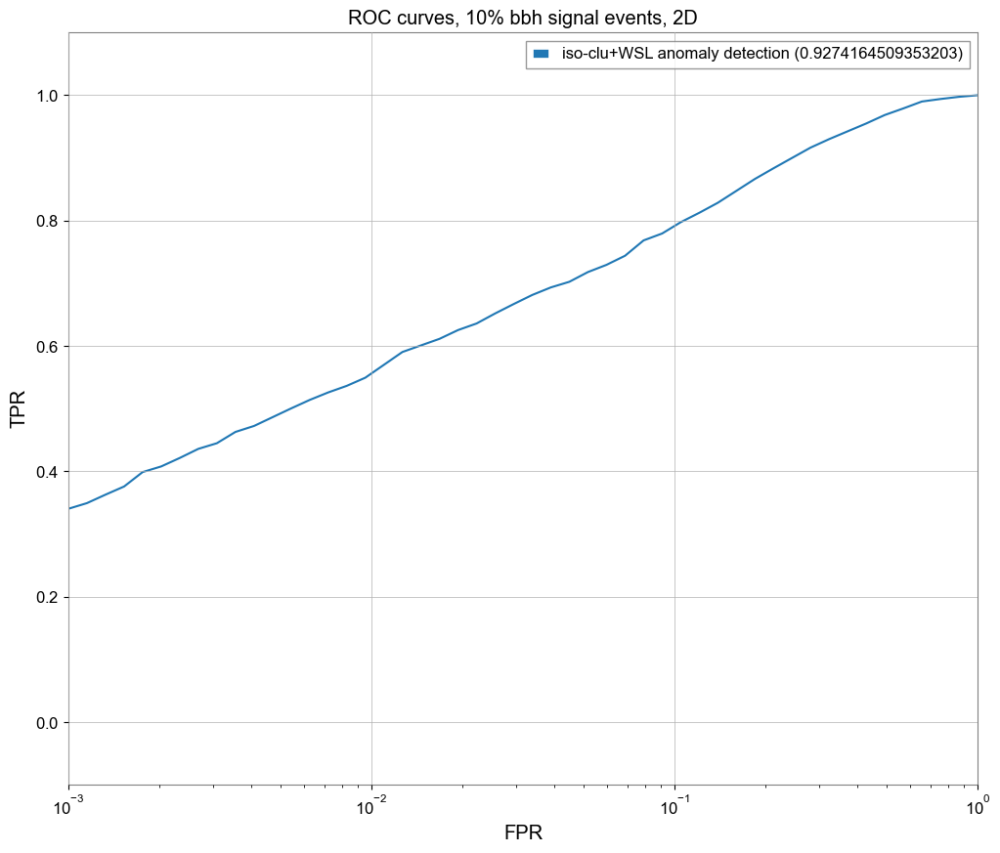

In [66]:
plt.figure(figsize = (12,10))
# plt.plot(np.sort(ROC_SVM[:,0]), np.sort(ROC_SVM[:,1]), label = 'SVM anomaly detection (' + str(auc(np.sort(ROC_SVM[:,0]), np.sort(ROC_SVM[:,1]))) + ")")
# plt.plot(ROC_SVMWS[:,0], ROC_SVMWS[:,1], label = 'SVM+WSL anomaly detection (' + str(auc(ROC_SVMWS[:,0], ROC_SVMWS[:,1])) + ")")
# plt.plot(ROC_isoclu[:,0], ROC_isoclu[:,1], label = 'iso-clu anomaly detection (' + str(auc(ROC_isoclu[:,0], ROC_isoclu[:,1])) + ')')
plt.plot(ROC_isocluWS[:,0], ROC_isocluWS[:,1], label = 'iso-clu+WSL anomaly detection (' + str(auc(ROC_isocluWS[:,0], ROC_isocluWS[:,1])) + ')')
# plt.plot(ROC_SVMisocluWS[:,0], ROC_SVMisocluWS[:,1], label = 'SVM+iso-clu+WSL anomaly detection (' + str(auc(ROC_SVMisocluWS[:,0], ROC_SVMisocluWS[:,1])) + ')')

plt.legend()
plt.title('ROC curves, 10% bbh signal events, 2D')
plt.xlabel('FPR')
plt.ylabel('TPR')

plt.xscale('log')
plt.xlim(0.001,1)
plt.ylim(-0.1, 1.1)

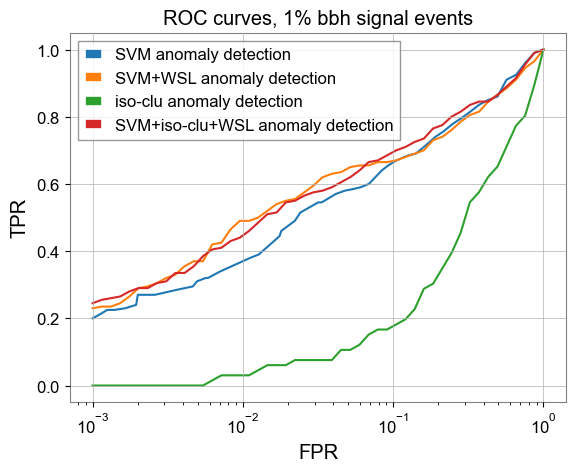

In [310]:
plt.plot(np.sort(ROC_SVM[:,0]), np.sort(ROC_SVM[:,1]), label = 'SVM anomaly detection')
plt.plot(ROC_SVMWS[:,0], ROC_SVMWS[:,1], label = 'SVM+WSL anomaly detection')
plt.plot(ROC_isoclu[:,0], ROC_isoclu[:,1], label = 'iso-clu anomaly detection')
plt.plot(ROC_isocluWS[:,0], ROC_isocluWS[:,1], label = 'iso-clu+WSL anomaly detection (' + str(auc(ROC_isocluWS[:,0], ROC_isocluWS[:,1])) + ')')
plt.plot(ROC_SVMisocluWS[:,0], ROC_SVMisocluWS[:,1], label = 'SVM+iso-clu+WSL anomaly detection')

plt.legend()
plt.title('ROC curves, 1% bbh signal events')
plt.xlabel('FPR')
plt.ylabel('TPR')

plt.xscale('log')

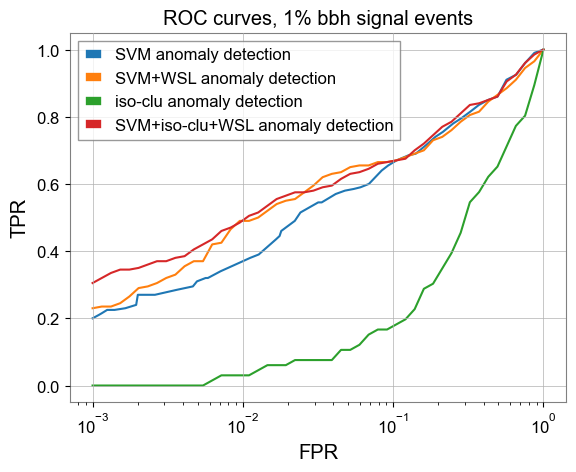

In [305]:
plt.plot(np.sort(ROC_SVM[:,0]), np.sort(ROC_SVM[:,1]), label = 'SVM anomaly detection')
plt.plot(ROC_SVMWS[:,0], ROC_SVMWS[:,1], label = 'SVM+WSL anomaly detection')
plt.plot(ROC_isoclu[:,0], ROC_isoclu[:,1], label = 'iso-clu anomaly detection')
plt.plot(ROC_SVMisocluWS[:,0], ROC_SVMisocluWS[:,1], label = 'SVM+iso-clu+WSL anomaly detection')

plt.legend()
plt.title('ROC curves, 1% bbh signal events')
plt.xlabel('FPR')
plt.ylabel('TPR')

plt.xscale('log')

(0.001, 1)

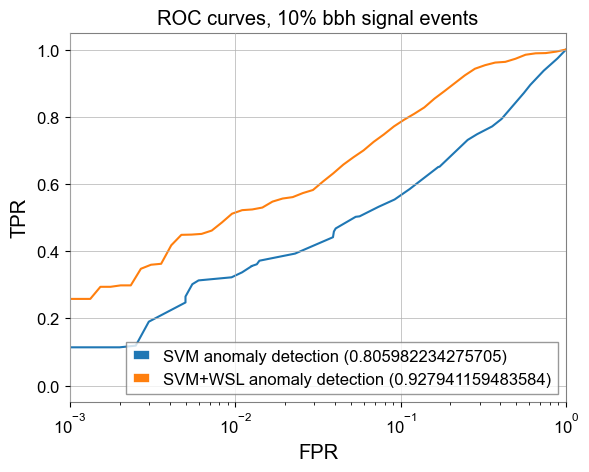

In [495]:
plt.plot(np.sort(ROC_SVM[:,0]), np.sort(ROC_SVM[:,1]), label = 'SVM anomaly detection (' + str(auc(np.sort(ROC_SVM[:,0]), np.sort(ROC_SVM[:,1]))) + ")")
plt.plot(ROC_SVMWS[:,0], ROC_SVMWS[:,1], label = 'SVM+WSL anomaly detection (' + str(auc(ROC_SVMWS[:,0], ROC_SVMWS[:,1])) + ")")
# plt.plot(ROC_isoclu[:,0], ROC_isoclu[:,1], label = 'iso-clu anomaly detection')
# plt.plot(ROC_SVMisocluWS[:,0], ROC_SVMisocluWS[:,1], label = 'SVM+iso-clu+WSL anomaly detection')

plt.legend()
plt.title('ROC curves, 10% bbh signal events')
plt.xlabel('FPR')
plt.ylabel('TPR')

plt.xscale('log')
plt.xlim(0.001,1)

Text(0, 0.5, 'TPR')

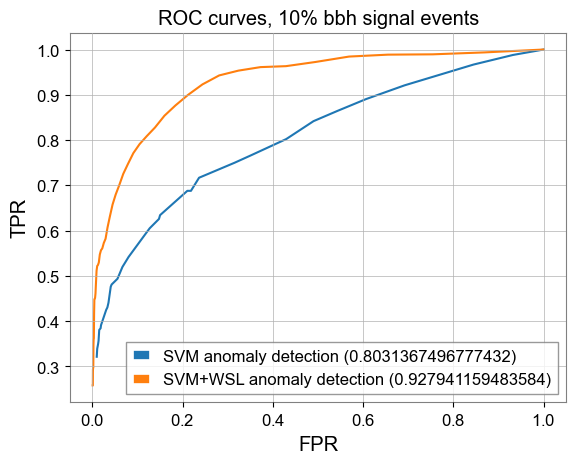

In [485]:
plt.plot(np.sort(ROC_SVM[:,0]), np.sort(ROC_SVM[:,1]), label = 'SVM anomaly detection (' + str(auc(np.sort(ROC_SVM[:,0]), np.sort(ROC_SVM[:,1]))) + ")")
plt.plot(ROC_SVMWS[:,0], ROC_SVMWS[:,1], label = 'SVM+WSL anomaly detection (' + str(auc(ROC_SVMWS[:,0], ROC_SVMWS[:,1])) + ")")
# plt.plot(ROC_isoclu[:,0], ROC_isoclu[:,1], label = 'iso-clu anomaly detection')
# plt.plot(ROC_SVMisocluWS[:,0], ROC_SVMisocluWS[:,1], label = 'SVM+iso-clu+WSL anomaly detection')

plt.legend()
plt.title('ROC curves, 10% bbh signal events')
plt.xlabel('FPR')
plt.ylabel('TPR')

# plt.xscale('log')
# plt.xlim(0.001,1)

(0.001, 1)

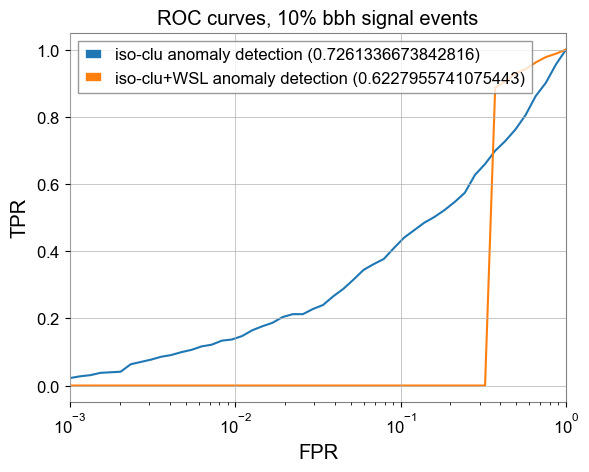

In [530]:
# plt.plot(np.sort(ROC_SVM[:,0]), np.sort(ROC_SVM[:,1]), label = 'SVM anomaly detection (' + str(auc(np.sort(ROC_SVM[:,0]), np.sort(ROC_SVM[:,1]))) + ")")
# plt.plot(ROC_SVMWS[:,0], ROC_SVMWS[:,1], label = 'SVM+WSL anomaly detection (' + str(auc(ROC_SVMWS[:,0], ROC_SVMWS[:,1])) + ")")
plt.plot(ROC_isoclu[:,0], ROC_isoclu[:,1], label = 'iso-clu anomaly detection (' + str(auc(ROC_isoclu[:,0], ROC_isoclu[:,1])) + ')')
plt.plot(ROC_isocluWS[:,0], ROC_isocluWS[:,1], label = 'iso-clu+WSL anomaly detection (' + str(auc(ROC_isocluWS[:,0], ROC_isocluWS[:,1])) + ')')
# plt.plot(ROC_SVMisocluWS[:,0], ROC_SVMisocluWS[:,1], label = 'SVM+iso-clu+WSL anomaly detection')

plt.legend()
plt.title('ROC curves, 10% bbh signal events')
plt.xlabel('FPR')
plt.ylabel('TPR')

plt.xscale('log')
plt.xlim(0.001,1)

(0.001, 1)

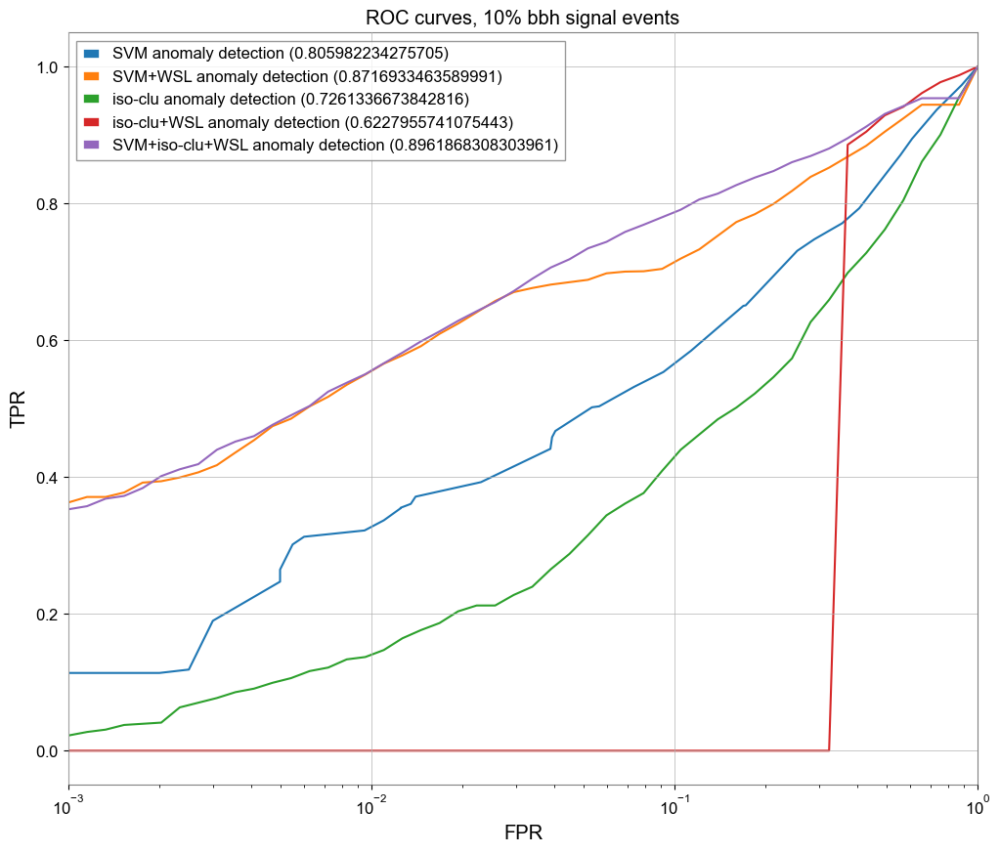

In [534]:
plt.figure(figsize=(12,10))
plt.plot(np.sort(ROC_SVM[:,0]), np.sort(ROC_SVM[:,1]), label = 'SVM anomaly detection (' + str(auc(np.sort(ROC_SVM[:,0]), np.sort(ROC_SVM[:,1]))) + ")")
plt.plot(ROC_SVMWS[:,0], ROC_SVMWS[:,1], label = 'SVM+WSL anomaly detection (' + str(auc(ROC_SVMWS[:,0], ROC_SVMWS[:,1])) + ")")
plt.plot(ROC_isoclu[:,0], ROC_isoclu[:,1], label = 'iso-clu anomaly detection (' + str(auc(ROC_isoclu[:,0], ROC_isoclu[:,1])) + ')')
plt.plot(ROC_isocluWS[:,0], ROC_isocluWS[:,1], label = 'iso-clu+WSL anomaly detection (' + str(auc(ROC_isocluWS[:,0], ROC_isocluWS[:,1])) + ')')
plt.plot(ROC_SVMisocluWS[:,0], ROC_SVMisocluWS[:,1], label = 'SVM+iso-clu+WSL anomaly detection (' + str(auc(ROC_SVMisocluWS[:,0], ROC_SVMisocluWS[:,1])) + ')')


plt.legend()
plt.title('ROC curves, 10% bbh signal events')
plt.xlabel('FPR')
plt.ylabel('TPR')

plt.xscale('log')
plt.xlim(0.001,1)

(0.001, 1)

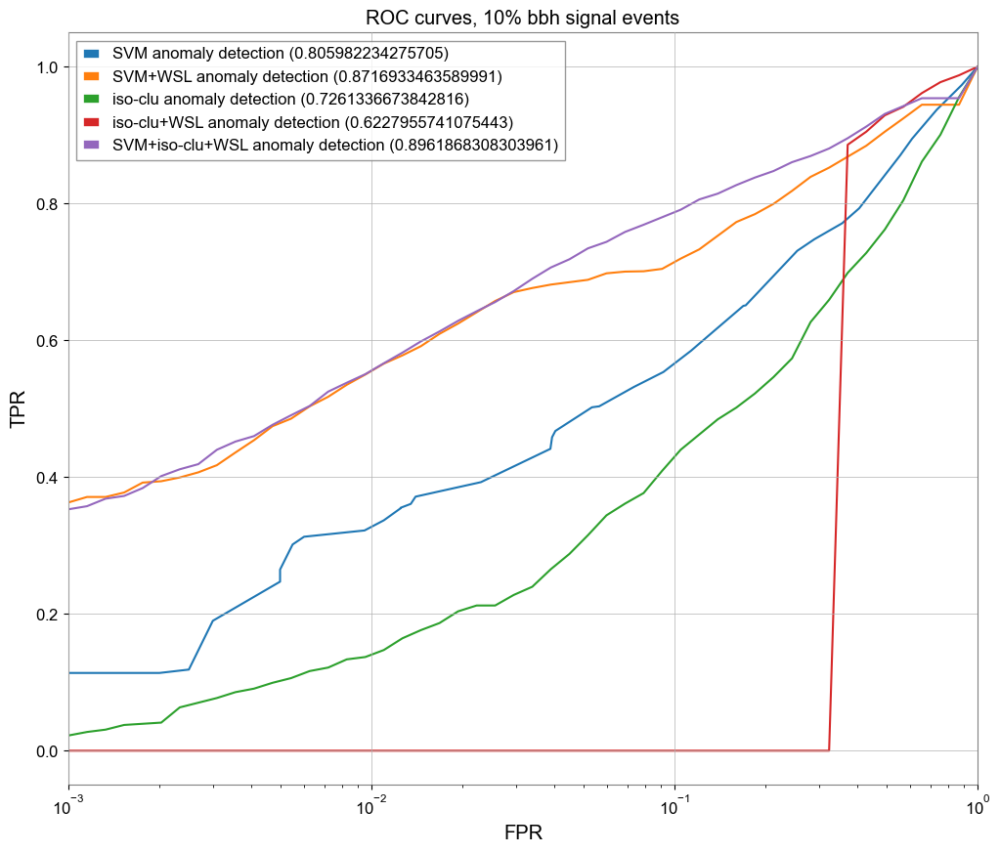

In [524]:
plt.figure(figsize=(12,10))
plt.plot(np.sort(ROC_SVM[:,0]), np.sort(ROC_SVM[:,1]), label = 'SVM anomaly detection (' + str(auc(np.sort(ROC_SVM[:,0]), np.sort(ROC_SVM[:,1]))) + ")")
plt.plot(ROC_SVMWS[:,0], ROC_SVMWS[:,1], label = 'SVM+WSL anomaly detection (' + str(auc(ROC_SVMWS[:,0], ROC_SVMWS[:,1])) + ")")
plt.plot(ROC_isoclu[:,0], ROC_isoclu[:,1], label = 'iso-clu anomaly detection (' + str(auc(ROC_isoclu[:,0], ROC_isoclu[:,1])) + ')')
plt.plot(ROC_isocluWS[:,0], ROC_isocluWS[:,1], label = 'iso-clu+WSL anomaly detection (' + str(auc(ROC_isocluWS[:,0], ROC_isocluWS[:,1])) + ')')
plt.plot(ROC_SVMisocluWS[:,0], ROC_SVMisocluWS[:,1], label = 'SVM+iso-clu+WSL anomaly detection (' + str(auc(ROC_SVMisocluWS[:,0], ROC_SVMisocluWS[:,1])) + ')')


plt.legend()
plt.title('ROC curves, 10% bbh signal events')
plt.xlabel('FPR')
plt.ylabel('TPR')

plt.xscale('log')
plt.xlim(0.001,1)